## <ins>Import dependencies

In [36]:
import pandas as pd
import os
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split, GridSearchCV, KFold, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

import scipy.stats as stats
import io
import base64

import warnings
warnings.filterwarnings("ignore")

## <ins>Read in the data from the preprocessed csv files

### df_cleaned

In [37]:
# Get the current directory of the notebook
current_dir = os.path.dirname(os.path.abspath(""))

# Navigate up two levels to reach the Project4 directory
project_dir = os.path.dirname(current_dir)

# Construct the absolute path to the CSV file
file_path = os.path.join(project_dir, "data/df_output/df_cleaned.csv")

# Load the CSV file
df_no_imputed = pd.read_csv(file_path)

# Show the df
df_no_imputed.head(2)

,IDUSGS,PLAYTYPE,WELLTYPE,FORMSIMPLE,TDS,LATITUDE,LONGITUDE,STATE,COUNTY,PROVINCE,...,FeTot,K,Li,Mg,Na,SO4,Sr,Zn,CHARGEBAL,BASIN_CATEGORY
0,63,Shale,Shale Gas,Marcellus,54800.0,40.441658,-79.986932,Pennsylvania,Allegheny,Appalachian Basin,...,27.40,0.0,21.5,295.0,12000.0,105.0,736.5,0.0839,-10.5,Appalachian
1,64,Shale,Shale Gas,Marcellus,26100.0,40.441658,-79.986932,Pennsylvania,Allegheny,Appalachian Basin,...,6.47,0.0,12.5,188.0,6920.0,116.0,215.0,0.0321,-3.0,Appalachian


In [38]:
df_no_imputed.columns

Index(['IDUSGS', 'PLAYTYPE', 'WELLTYPE', 'FORMSIMPLE', 'TDS', 'LATITUDE',
       'LONGITUDE', 'STATE', 'COUNTY', 'PROVINCE', 'REGION', 'WELLNAME', 'API',
       'DEPTHUPPER', 'DEPTHLOWER', 'PERIOD', 'DATESAMPLE', 'PH', 'B', 'Ba',
       'Br', 'HCO3', 'Ca', 'Cl', 'FeTot', 'K', 'Li', 'Mg', 'Na', 'SO4', 'Sr',
       'Zn', 'CHARGEBAL', 'BASIN_CATEGORY'],
      dtype='object')

In [39]:
df_no_imputed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60658 entries, 0 to 60657
Data columns (total 34 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   IDUSGS          60658 non-null  int64  
 1   PLAYTYPE        60658 non-null  object 
 2   WELLTYPE        60658 non-null  object 
 3   FORMSIMPLE      60658 non-null  object 
 4   TDS             60658 non-null  float64
 5   LATITUDE        60658 non-null  float64
 6   LONGITUDE       60658 non-null  float64
 7   STATE           60658 non-null  object 
 8   COUNTY          60026 non-null  object 
 9   PROVINCE        60658 non-null  object 
 10  REGION          60658 non-null  object 
 11  WELLNAME        54693 non-null  object 
 12  API             34447 non-null  float64
 13  DEPTHUPPER      47354 non-null  float64
 14  DEPTHLOWER      40757 non-null  float64
 15  PERIOD          48402 non-null  object 
 16  DATESAMPLE      46382 non-null  object 
 17  PH              45174 non-null 

### df_cleaned_imputed

In [40]:
# Get the current directory of the notebook
current_dir = os.path.dirname(os.path.abspath(""))

# Navigate up two levels to reach the Project4 directory
project_dir = os.path.dirname(current_dir)

# Construct the absolute path to the CSV file
file_path = os.path.join(project_dir, "data/df_output/df_cleaned_imputed.csv")

# Load the CSV file
df_with_imputed = pd.read_csv(file_path)

# Show the df
df_with_imputed.head(2)

,IDUSGS,PLAYTYPE,WELLTYPE,FORMSIMPLE,TDS,LATITUDE,LONGITUDE,STATE,COUNTY,PROVINCE,...,FeTot,K,Li,Mg,Na,SO4,Sr,Zn,CHARGEBAL,BASIN_CATEGORY
0,63,Shale,Shale Gas,Marcellus,54800.0,40.441658,-79.986932,Pennsylvania,Allegheny,Appalachian Basin,...,27.40,0.0,21.5,295.0,12000.0,105.0,736.5,0.0839,-10.5,Appalachian
1,64,Shale,Shale Gas,Marcellus,26100.0,40.441658,-79.986932,Pennsylvania,Allegheny,Appalachian Basin,...,6.47,0.0,12.5,188.0,6920.0,116.0,215.0,0.0321,-3.0,Appalachian


In [41]:
df_with_imputed.columns

Index(['IDUSGS', 'PLAYTYPE', 'WELLTYPE', 'FORMSIMPLE', 'TDS', 'LATITUDE',
       'LONGITUDE', 'STATE', 'COUNTY', 'PROVINCE', 'REGION', 'WELLNAME', 'API',
       'DEPTHUPPER', 'DEPTHLOWER', 'PERIOD', 'DATESAMPLE', 'PH', 'B', 'Ba',
       'Br', 'HCO3', 'Ca', 'Cl', 'FeTot', 'K', 'Li', 'Mg', 'Na', 'SO4', 'Sr',
       'Zn', 'CHARGEBAL', 'BASIN_CATEGORY'],
      dtype='object')

In [42]:
df_with_imputed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60658 entries, 0 to 60657
Data columns (total 34 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   IDUSGS          60658 non-null  int64  
 1   PLAYTYPE        60658 non-null  object 
 2   WELLTYPE        60658 non-null  object 
 3   FORMSIMPLE      60658 non-null  object 
 4   TDS             60658 non-null  float64
 5   LATITUDE        60658 non-null  float64
 6   LONGITUDE       60658 non-null  float64
 7   STATE           60658 non-null  object 
 8   COUNTY          60026 non-null  object 
 9   PROVINCE        60658 non-null  object 
 10  REGION          60658 non-null  object 
 11  WELLNAME        54693 non-null  object 
 12  API             34447 non-null  float64
 13  DEPTHUPPER      60658 non-null  float64
 14  DEPTHLOWER      40757 non-null  float64
 15  PERIOD          48402 non-null  object 
 16  DATESAMPLE      46382 non-null  object 
 17  PH              45174 non-null 

### df_{basin}_pca_with_target

In [43]:
# Get the current directory of the notebook
current_dir = os.path.dirname(os.path.abspath(""))

# Navigate up two levels to reach the Project4 directory
project_dir = os.path.dirname(current_dir)

dfs = []  # Create an empty list to store dataframes
basins = df_data['BASIN_CATEGORY'].unique()

for basin in basins:
    # Construct the absolute path to the CSV file
    file_path = os.path.join(project_dir, f"data/pca_data/byBasin_pca/{basin}_pca_with_target.csv")

    # Load the CSV file
    df = pd.read_csv(file_path)

    # Add a new column for the basin name
    df['BASIN_CATEGORY'] = basin

    # Append the dataframe to the list
    dfs.append(df)

# Concatenate all the dataframes into one
df_pca_all_basins = pd.concat(dfs, ignore_index=True)

# Show the combined dataframe
print('Combined Dataframe:')
print('===============================')
print(df_pca_all_basins.head(2))
print('-------------------------------')
print(df_pca_all_basins.info())


Combined Dataframe:
        PC1       PC2       PC3       PC4       PC5       PC6       PC7  \
0 -2.266081  1.874993  3.506635 -0.032301  0.030829 -0.788981 -0.449659   
1 -3.312880  1.560057  2.655659  0.048384  0.517013 -1.890688 -0.462558   

        PC8       PC9      PC10      PC11      PC12      PC13      PC14  \
0  0.058008 -1.115495 -1.019037 -0.773039 -0.126684  0.110222 -0.054233   
1 -0.556231 -0.148876 -0.132370 -0.226743 -0.031409  0.125099  0.028728   

       PC15    Li BASIN_CATEGORY  
0  0.026171  21.5    Appalachian  
1 -0.001987  12.5    Appalachian  
-------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60658 entries, 0 to 60657
Data columns (total 17 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   PC1             60658 non-null  float64
 1   PC2             60658 non-null  float64
 2   PC3             60658 non-null  float64
 3   PC4             60658 non-null  float64
 4   PC5    

## <ins>Generate SVR regression models for each basin for consideration

### Establishing function for running models for each Basin given certain variable inputs

In [44]:
def generate_svr_models_by_basin(df, round, basins, categorical_columns, test_size, random_state, kernel_values, c_values, epsilon_values):
    
    df_starting = df.copy()

    # Create an empty list to store results for each basin
    results_list = []

    for basin in basins:
        
        print('===============================')
        print(f'{basin}')
        print('===============================')

        '''--------------------------------------------------------------------------------------------------------------'''
        '''Finalize data preprocessing per input variables / requirements of SVR regression model'''

        # Drop rows from anything that isn't the 'basin' at hand
        df_basin = df_starting[df_starting['BASIN_CATEGORY'] == basin]

        # Drop the 'Basin' column as it is no longer needed
        df_basin.drop('BASIN_CATEGORY', axis=1, inplace=True)

        # Drop null values in the 'Li' (target) column
        df_basin.dropna(subset=['Li'], inplace=True)

        # Drop any remaining null values
        df_basin.dropna(inplace=True)

        # Get the remaining number of rows
        num_rows = df_basin.shape[0]
        print("Number of data points: ", num_rows)

        if num_rows > 0:

            '''--------------------------------------------------------------------------------------------------------------'''
            '''Encode categorical features (if any)'''

            # One-hot encode categorical variables (if any); if none provided, this is skipped
            if categorical_columns:
                df_basin = pd.get_dummies(df_basin, columns=categorical_columns, dtype=int)
            
            '''--------------------------------------------------------------------------------------------------------------'''
            '''Split testing/training sets'''

            # Splitting the data into features (X) and the target variable (y)
            y = df_basin['Li'].copy()                   # Target variable
            X = df_basin.drop(columns=['Li']).copy()    # Features

            # Splitting the data into training and testing sets
            X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)

            '''--------------------------------------------------------------------------------------------------------------'''
            '''Train & test model'''

            # Create a parameter grid
            param_grid = {'kernel': kernel_values, 'C': c_values, 'epsilon': epsilon_values}

            # Determine the number of splits for cross-validation
            n_samples = X_train.shape[0]
            # Print the number of samples in the training dataset
            print("Number of samples in the training dataset:", n_samples)
            n_splits = min(5, n_samples)  # Use 5 splits or the number of samples, whichever is smaller
            n_splits = max(2, n_splits)  # Ensure there are at least 2 splits

            # Perform grid search with cross-validation
            grid_search = GridSearchCV(SVR(), param_grid, cv=n_splits, scoring='neg_mean_squared_error')
            grid_search.fit(X_train, y_train)

            # Get the best parameters
            best_params = grid_search.best_params_
            print("Best parameters:", best_params)

            # Get the actual values used in the model
            best_kernel = best_params['kernel']
            best_C = best_params['C']
            best_epsilon = best_params['epsilon']

            # Get the best model
            best_model = grid_search.best_estimator_

            # Evaluate the best model
            y_pred = best_model.predict(X_test)

            '''--------------------------------------------------------------------------------------------------------------'''
            '''Get all the performance metrics...'''

            # Calculate the mean squared error and the root mean squared error
            mse = mean_squared_error(y_test, y_pred)
            rmse = np.sqrt(mse)

            # Calculate the variance of the target variable
            target_variance = np.var(y_test)

            # Calculate the mean absolute error
            mae = mean_absolute_error(y_test, y_pred)
            
            # Calculate R-squared
            r2 = r2_score(y_test, y_pred)

            # Calculate the percentage of predictions within certain percentage ranges
            percentage_ranges = [5, 15, 25, 50]  # Percentage ranges
            within_ranges = {}
            for percentage in percentage_ranges:
                threshold = (percentage / 100) * np.mean(y_test)
                within_ranges[f'within_{percentage}_percent'] = np.mean(np.abs(y_test - y_pred) <= threshold) * 100

            # Calculate percentage differences between predicted and actual values
            percentage_diff = (np.abs(y_pred - y_test) / y_test) * 100
            # Calculate the actual percentage range
            min_percentage_range = np.min(percentage_diff)
            max_percentage_range = np.max(percentage_diff)

            # Quantile regression loss at 25th, 50th, and 75th percentiles
            quantiles = [0.25, 0.5, 0.75]
            quantile_losses = [np.percentile(np.abs(y_test - y_pred), q * 100) for q in quantiles]

            # Perform k-fold cross-validation
            kfold = KFold(n_splits=n_splits, shuffle=True, random_state=random_state)
            cv_scores = cross_val_score(best_model, X_train, y_train, cv=kfold, scoring='neg_mean_squared_error')

            # Convert scores to positive values
            cv_scores = -cv_scores

            # Print all the the metrics
            print('-------------------------------')
            print("MODEL PERFORMANCE METRICS")
            print('-------------------------------')
            print("Variance of the target variable:", target_variance)
            print("MSE of the model:", mse)
            if mse < target_variance:   # Compare the MSE to the variance
                print("The model's MSE is smaller than the variance of the target variable.")
                print("The model is capturing a significant portion of the variability in the target variable.")
            else:
                print("The model's MSE is close to or larger than the variance of the target variable.")
                print("The model's performance may be limited compared to the variability of the target variable.")
            print("RMSE of the model:", rmse)
            print("MAE of the best SVR model:", mae)
            print('-------------------------------')
            print("R-squared (Coefficient of Determination):", r2)
            print('-------------------------------')
            print(f"Percentage of predictions within different tolerance levels:")
            for percentage in percentage_ranges:
                print(f"±{percentage}%: ", within_ranges[f'within_{percentage}_percent'])
            print('-------------------------------')
            print(f"Minimum percentage difference: {min_percentage_range:.2f}%")
            print(f"Maximum percentage difference: {max_percentage_range:.2f}%")
            print('-------------------------------')
            print("Quantile regression loss:")
            for q, loss in zip(quantiles, quantile_losses):
                print(f"Quantile {q}: {loss}")
            print('-------------------------------')
            print("Cross-validation MSE scores:", cv_scores)
            print("Mean cross-validation MSE:", np.mean(cv_scores))
            print('-------------------------------')

            '''--------------------------------------------------------------------------------------------------------------'''
            '''Generate descriptive plots'''

            # Plot actual vs predicted values
            plt.scatter(y_test, y_pred, alpha=0.5)
            plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--')  # Diagonal line
            colors = ['lightblue', 'lightgreen', 'palegoldenrod', 'lightsalmon']
            for i, percentage in enumerate(percentage_ranges):
                threshold = (percentage / 100) * np.mean(y_test)
                plt.plot([min(y_test), max(y_test)], [min(y_test) + threshold, max(y_test) + threshold],
                        linestyle='--', color=colors[i], label=f'Within {percentage}%')
                plt.plot([min(y_test), max(y_test)], [min(y_test) - threshold, max(y_test) - threshold],
                        linestyle='--', color=colors[i])
            plt.xlabel('Actual')
            plt.ylabel('Predicted')
            plt.title(f'Actual vs Predicted Li Concentrations for {basin}')
            plt.legend()
            plt.show()

            # Plot histogram of predicted Li concentration values
            plt.hist(y_pred, bins=20)
            plt.xlabel('Predicted Li Concentration')
            plt.ylabel('Frequency')
            plt.title(f'Histogram of Predicted Li Concentrations for {basin}')
            plt.show()

            # Plot histogram of residuals
            residuals = y_test - y_pred
            plt.hist(residuals, bins=20)
            plt.xlabel('Residuals')
            plt.ylabel('Frequency')
            plt.title(f'Histogram of Residuals for {basin}')
            plt.show()

            # Create a Q-Q plot of residuals
            stats.probplot(residuals, dist="norm", plot=plt)
            plt.title(f'Q-Q Plot of Residuals for {basin}')
            plt.show()

            '''--------------------------------------------------------------------------------------------------------------'''
            '''Add results to a list to feed to the results dataframe'''

            # Append results to the list
            results_list.append([round, basin, num_rows, len(X.columns), list(X.columns), kernel_values, best_kernel, c_values, best_C, 
                                 epsilon_values, best_epsilon, target_variance, mse, rmse, mae, r2] + list(within_ranges.values()) + 
                                 [min_percentage_range, max_percentage_range, quantile_losses[0], quantile_losses[1], quantile_losses[2], 
                                 np.mean(cv_scores)])

        else: 
            print(f'No round{round} model generated for {basin}.')

    # Create a DataFrame from the results list
    columns = ['round', 'basin', 'data_row_count','feature_quantity', 'feature_list', 'kernel_options', 'best_kernel', 'c_options', 'best_c', 
               'epsilon_options', 'best_epsilon', 'target_variable_variance', 'mse', 'rmse', 'mae', 'r2'] + [f'within_{percentage}_percent' for percentage in percentage_ranges] + [
               'results_min%_difference', 'results_max%_difference', '0.25_quantile_loss', '0.5_quantile_loss', '0.75_quantile_loss', 'cross_val_mse']
    
    df_results = pd.DataFrame(results_list, columns=columns)

    # Round all values in the DataFrame to two decimal places
    df_results = df_results.round(2)

    # Sort the DataFrame
    df_results.sort_values(by=['within_15_percent'], ascending=False, inplace=True)

    return df_results


### INPUT: PCA

In [45]:
# Define the input df for this section
df = df_pca_all_basins.copy()

# Define variables that are common to all rounds
basins = df['BASIN_CATEGORY'].unique()
categorical_columns = []

#### ROUND 1

Appalachian
Number of data points:  652
Number of samples in the training dataset: 456


Best parameters: {'C': 1, 'epsilon': 0.01, 'kernel': 'linear'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 3846.8820694580363
MSE of the model: 1762.7668864508807
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 41.9853175104212
MAE of the best SVR model: 22.361387447255087
-------------------------------
R-squared (Coefficient of Determination): 0.5417673703994713
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  17.346938775510203
±15%:  43.36734693877551
±25%:  63.26530612244898
±50%:  79.08163265306123
-------------------------------
Minimum percentage difference: 0.01%
Maximum percentage difference: 4015.79%
-------------------------------
Quantile regression loss:
Quantile 0.25: 5.376815715045058
Quantile 0.5: 11.661497557522301


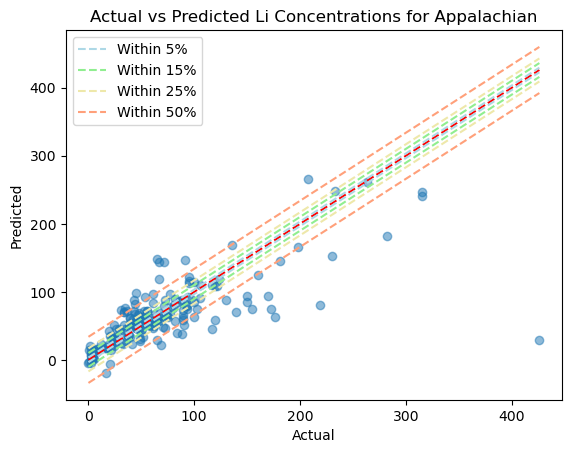

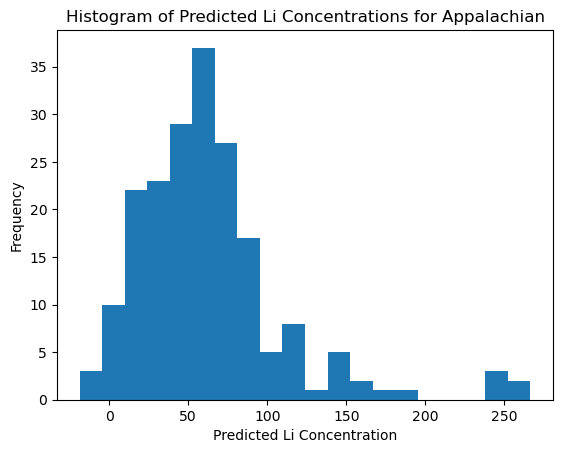

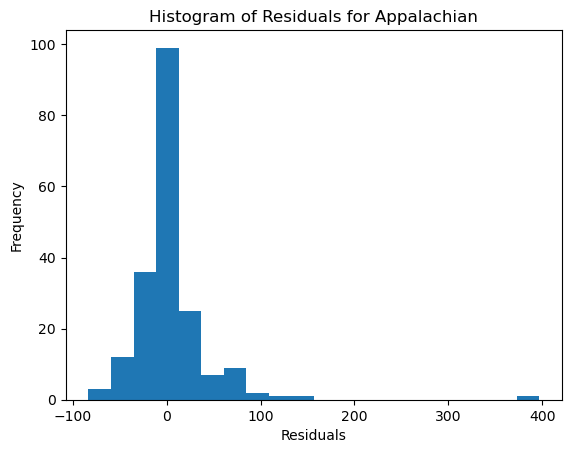

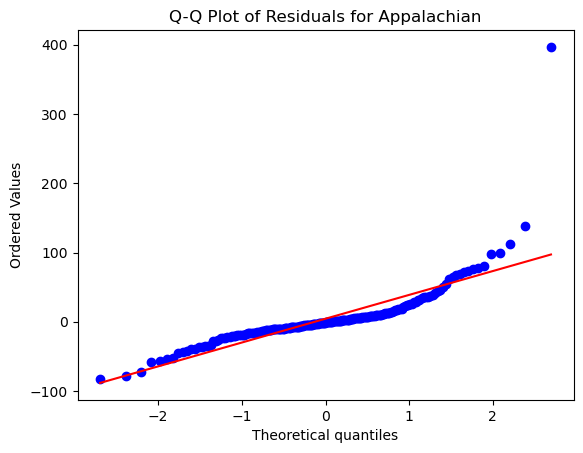

Permian
Number of data points:  481
Number of samples in the training dataset: 336
Best parameters: {'C': 10, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 5745.300019005947
MSE of the model: 5557.915450237218
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 74.55142822399326
MAE of the best SVR model: 15.89122054285347
-------------------------------
R-squared (Coefficient of Determination): 0.0326152799938807
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  21.379310344827587
±15%:  56.55172413793104
±25%:  71.03448275862068
±50%:  88.96551724137932
-------------------------------
Minimum percentage difference: 0.35%
Maximum percentage difference: 879.90%
-------------------------------
Quantile regres

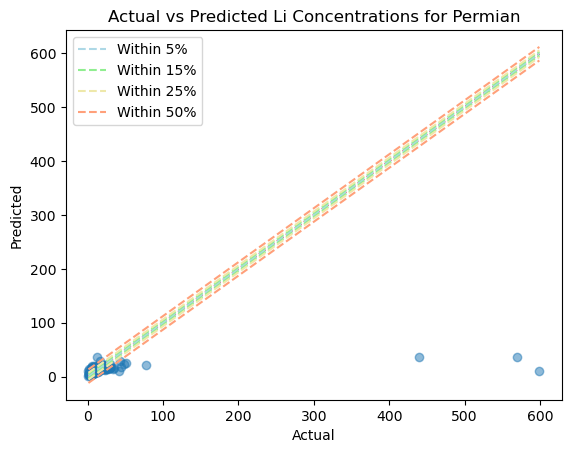

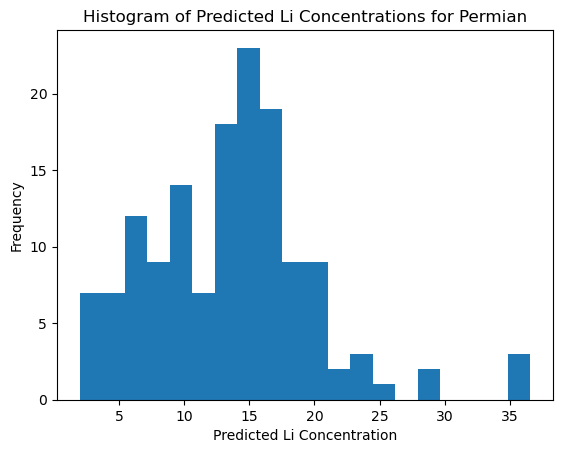

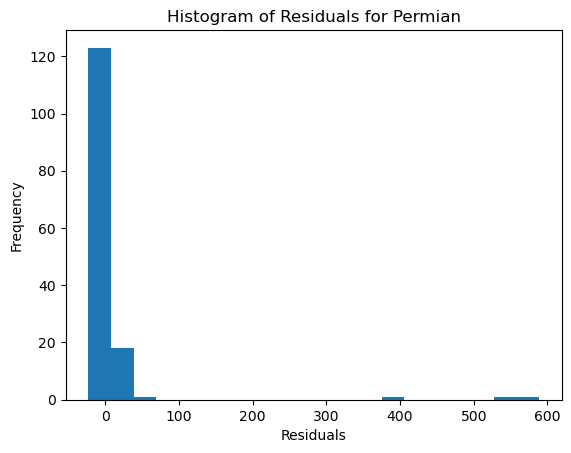

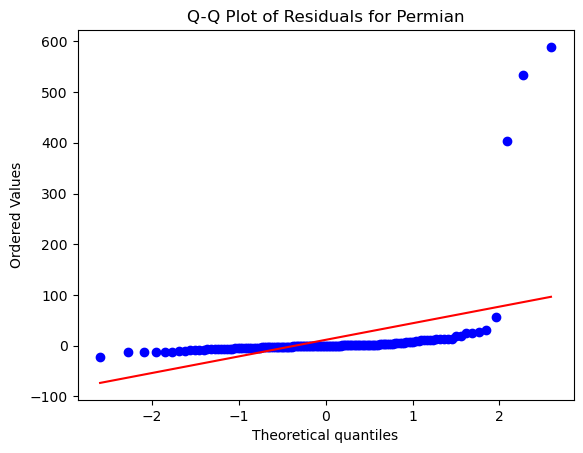

Oklahoma Platform
Number of data points:  254
Number of samples in the training dataset: 177
Best parameters: {'C': 10, 'epsilon': 0.01, 'kernel': 'linear'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 283.7832482712093
MSE of the model: 178.35450922315826
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 13.35494325046566
MAE of the best SVR model: 9.555220000812698
-------------------------------
R-squared (Coefficient of Determination): 0.3715114957994057
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  5.194805194805195
±15%:  25.97402597402597
±25%:  44.15584415584416
±50%:  68.83116883116884
-------------------------------
Minimum percentage difference: 1.27%
Maximum percentage difference: 2432.71%
-------------------------------


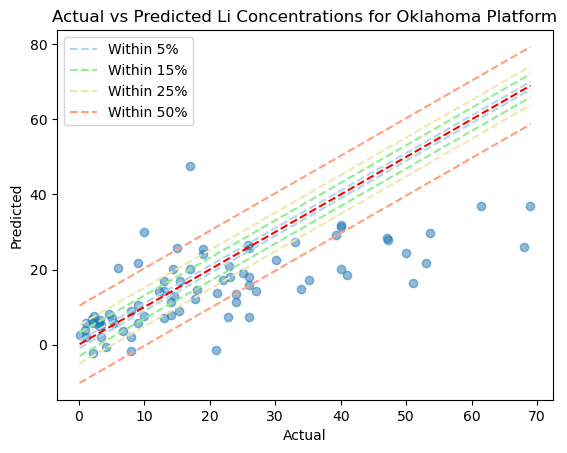

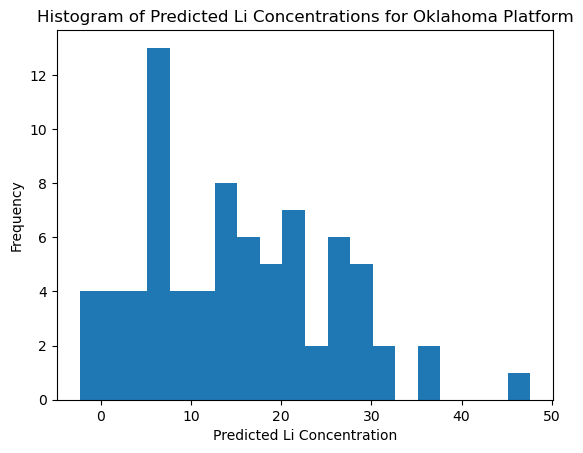

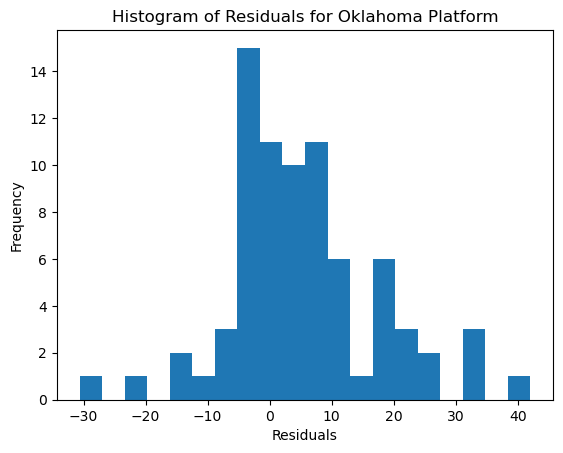

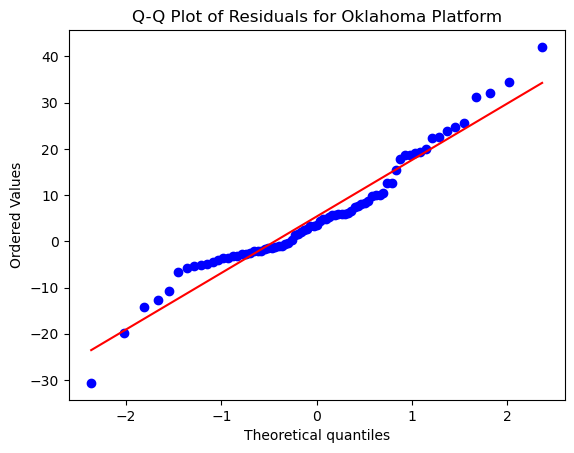

Gulf Coast
Number of data points:  888
Number of samples in the training dataset: 621
Best parameters: {'C': 1, 'epsilon': 0.5, 'kernel': 'poly'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 16797.03549157902
MSE of the model: 11098.961942813743
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 105.35161101195246
MAE of the best SVR model: 24.50825419532195
-------------------------------
R-squared (Coefficient of Determination): 0.3392309048594879
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  27.340823970037455
±15%:  61.79775280898876
±25%:  67.41573033707866
±50%:  78.27715355805243
-------------------------------
Minimum percentage difference: 0.30%
Maximum percentage difference: 874.13%
-------------------------------
Quantile r

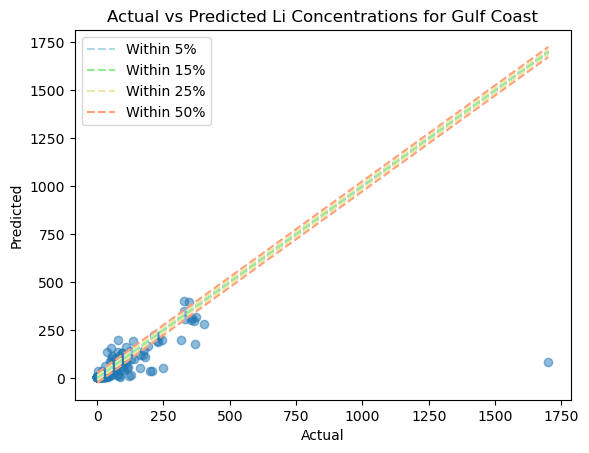

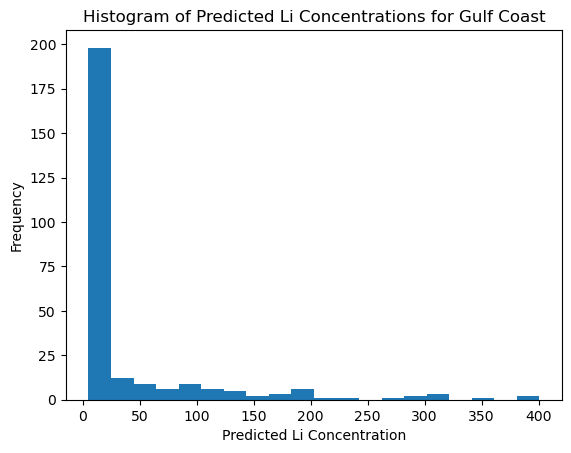

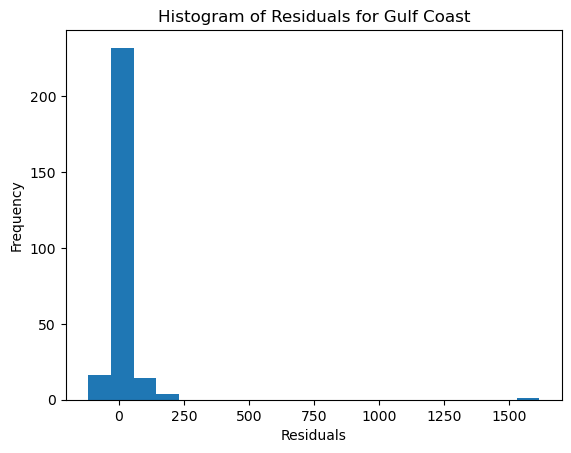

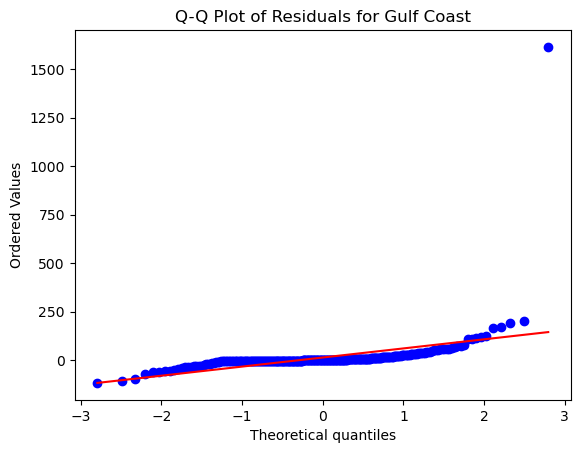

Williston
Number of data points:  502
Number of samples in the training dataset: 351
Best parameters: {'C': 10, 'epsilon': 0.01, 'kernel': 'linear'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 2074.0401568535945
MSE of the model: 1951.8993473770734
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 44.18030497152632
MAE of the best SVR model: 17.055424842507197
-------------------------------
R-squared (Coefficient of Determination): 0.05889028188432721
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  15.2317880794702
±15%:  37.74834437086093
±25%:  58.27814569536424
±50%:  78.80794701986756
-------------------------------
Minimum percentage difference: 0.79%
Maximum percentage difference: 174735.11%
-------------------------------
Quan

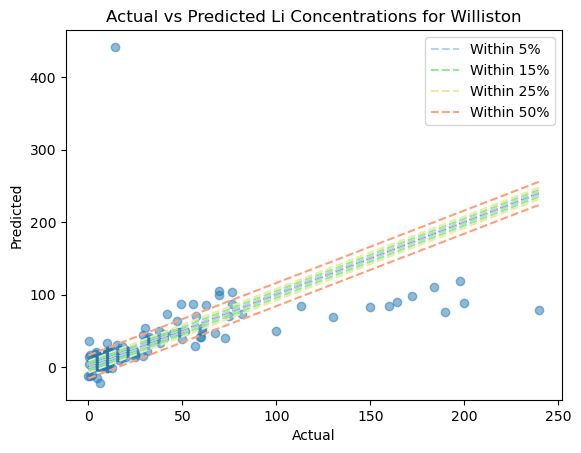

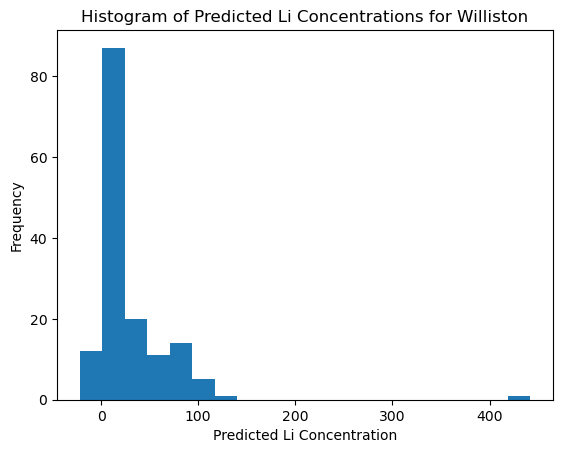

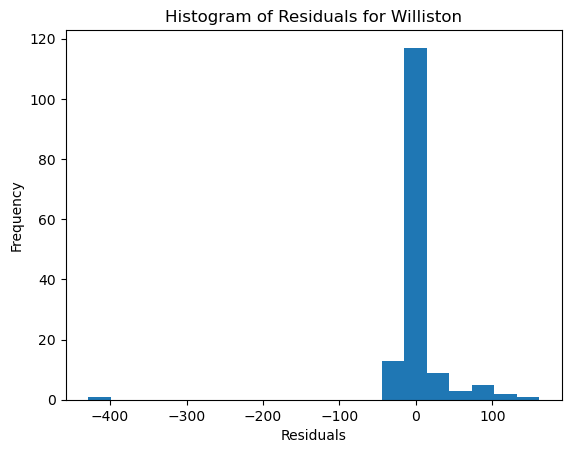

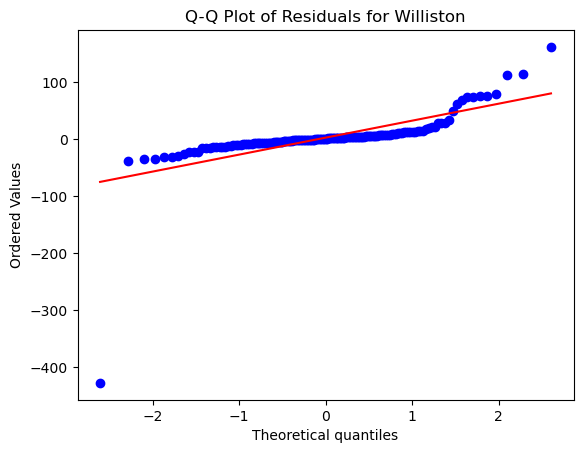

Michigan
Number of data points:  150
Number of samples in the training dataset: 105
Best parameters: {'C': 1, 'epsilon': 0.5, 'kernel': 'linear'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 309.10417758024687
MSE of the model: 112.72862559961739
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 10.617373761887512
MAE of the best SVR model: 7.4581471124731555
-------------------------------
R-squared (Coefficient of Determination): 0.635305396122148
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  6.666666666666667
±15%:  33.33333333333333
±25%:  55.55555555555556
±50%:  84.44444444444444
-------------------------------
Minimum percentage difference: 0.91%
Maximum percentage difference: 1054.03%
-------------------------------
Quantile 

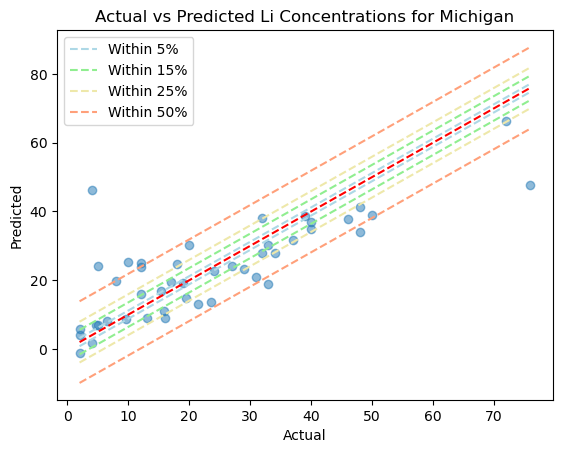

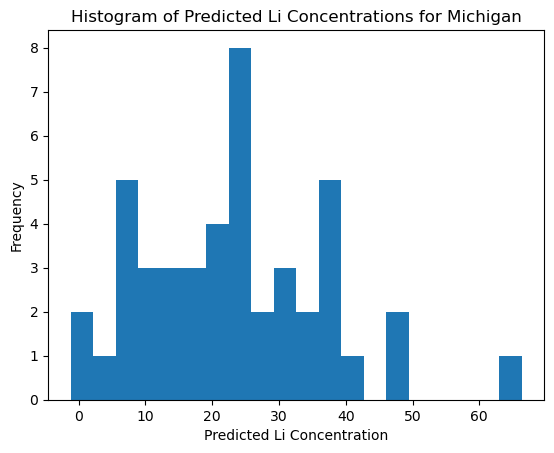

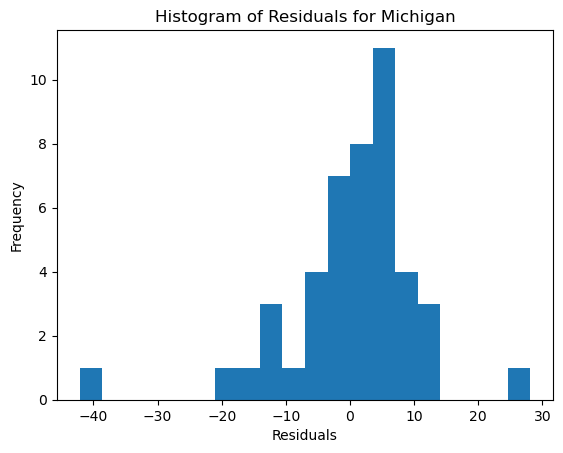

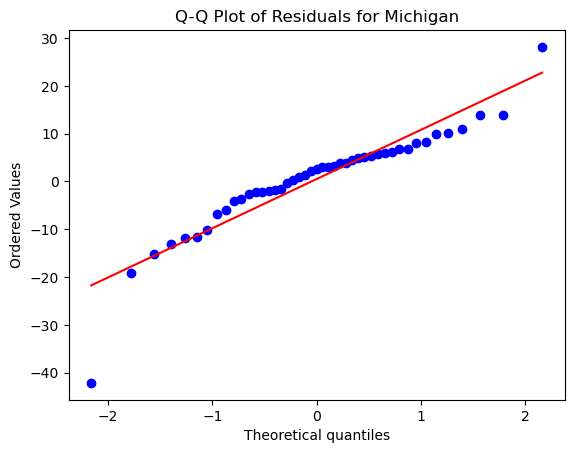

Pacific
Number of data points:  145
Number of samples in the training dataset: 101
Best parameters: {'C': 10, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 7.590610782541324
MSE of the model: 3.6560527682067017
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 1.9120807431190507
MAE of the best SVR model: 1.0219956853675602
-------------------------------
R-squared (Coefficient of Determination): 0.5183453778692285
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  6.8181818181818175
±15%:  34.090909090909086
±25%:  52.27272727272727
±50%:  72.72727272727273
-------------------------------
Minimum percentage difference: 0.76%
Maximum percentage difference: 4550.00%
-------------------------------
Quantile r

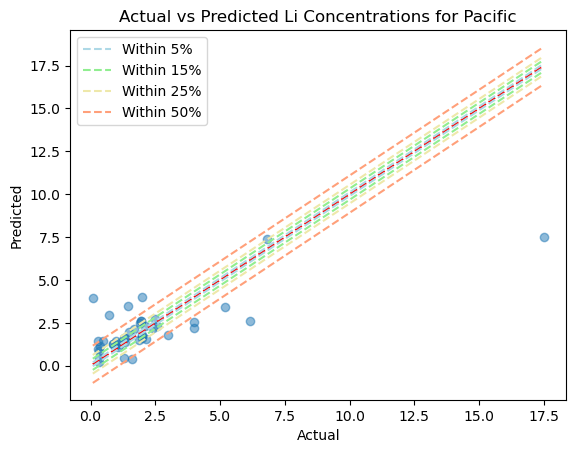

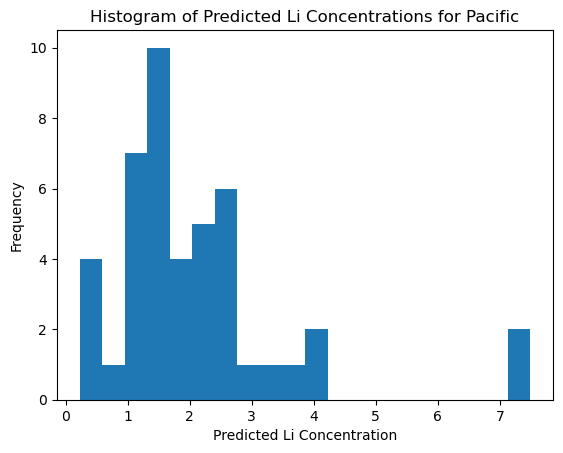

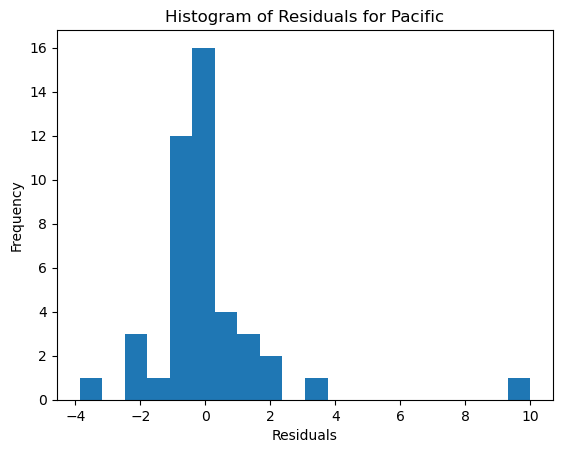

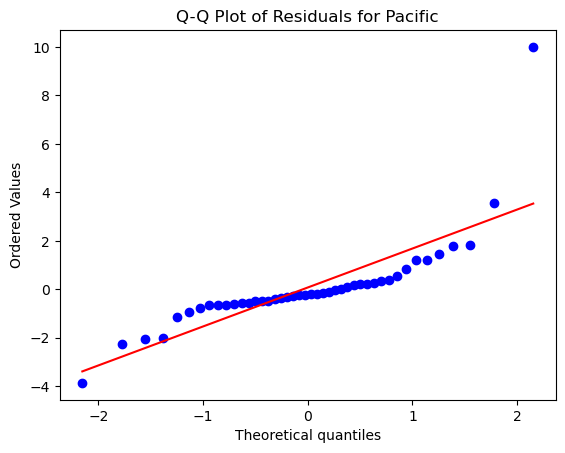

Illinois
Number of data points:  25
Number of samples in the training dataset: 17
Best parameters: {'C': 10, 'epsilon': 0.01, 'kernel': 'poly'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 140.9118484375
MSE of the model: 374.0232460202748
The model's MSE is close to or larger than the variance of the target variable.
The model's performance may be limited compared to the variability of the target variable.
RMSE of the model: 19.339680608021293
MAE of the best SVR model: 12.374572559871808
-------------------------------
R-squared (Coefficient of Determination): -1.6543065765414964
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  0.0
±15%:  25.0
±25%:  50.0
±50%:  62.5
-------------------------------
Minimum percentage difference: 6.52%
Maximum percentage difference: 208.83%
-------------------------------
Quantile regression loss:
Quantile 0.25: 2.43445658895

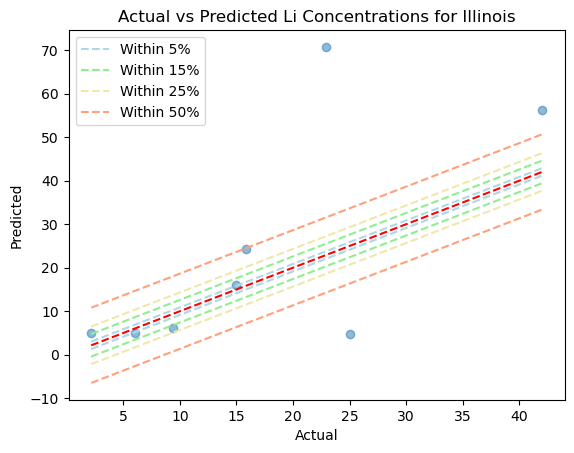

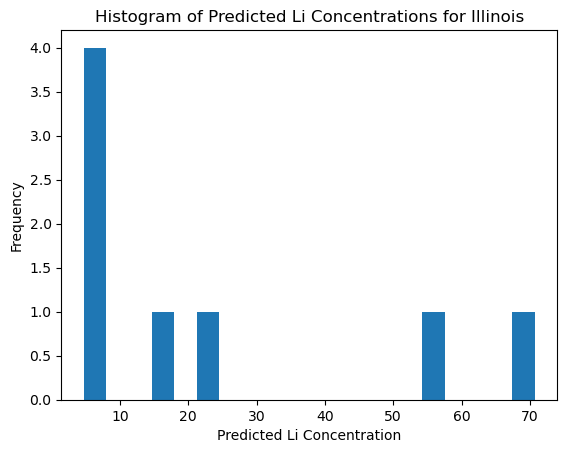

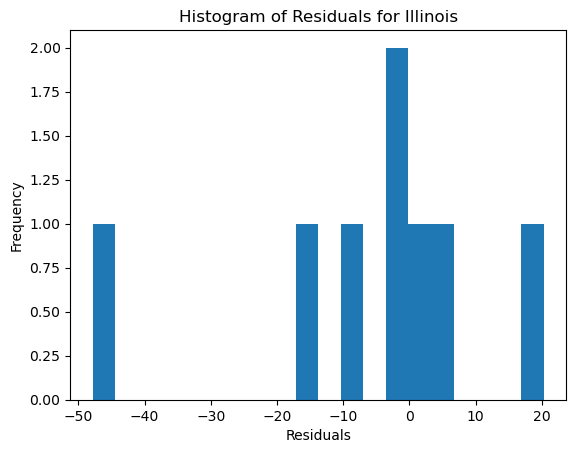

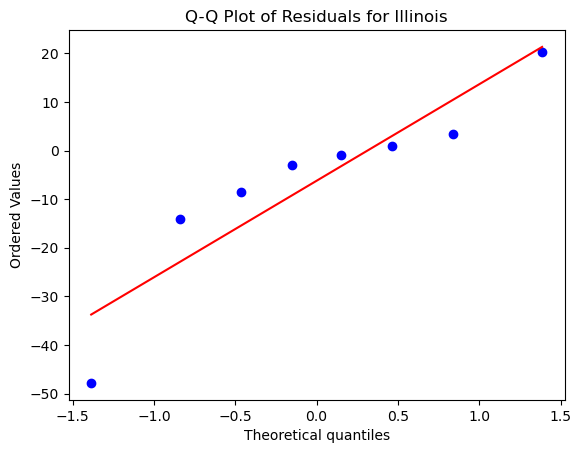

Great Plains
Number of data points:  62
Number of samples in the training dataset: 43
Best parameters: {'C': 10, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 26213.597100831015
MSE of the model: 27437.17906689691
The model's MSE is close to or larger than the variance of the target variable.
The model's performance may be limited compared to the variability of the target variable.
RMSE of the model: 165.64171898074744
MAE of the best SVR model: 39.77220035152855
-------------------------------
R-squared (Coefficient of Determination): -0.046677377444971135
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  63.1578947368421
±15%:  94.73684210526315
±25%:  94.73684210526315
±50%:  94.73684210526315
-------------------------------
Minimum percentage difference: 14.45%
Maximum percentage difference: 202.52%
--------------------------

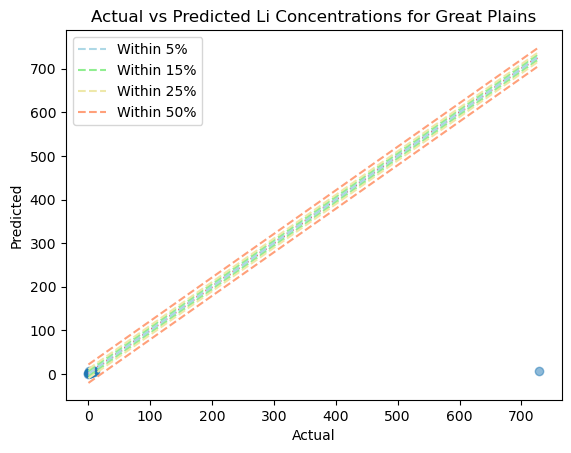

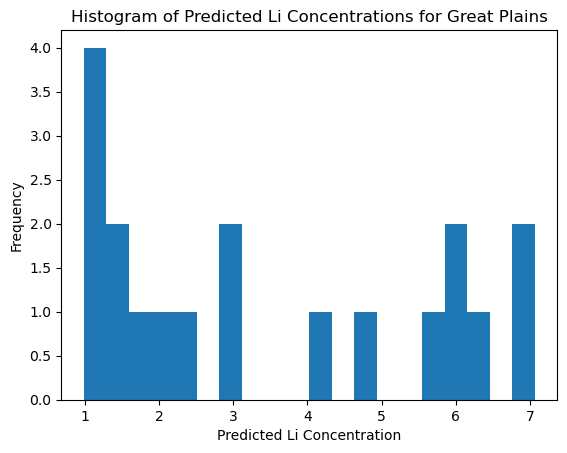

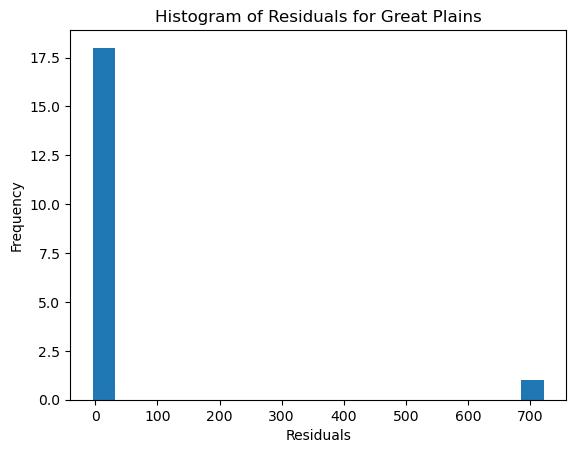

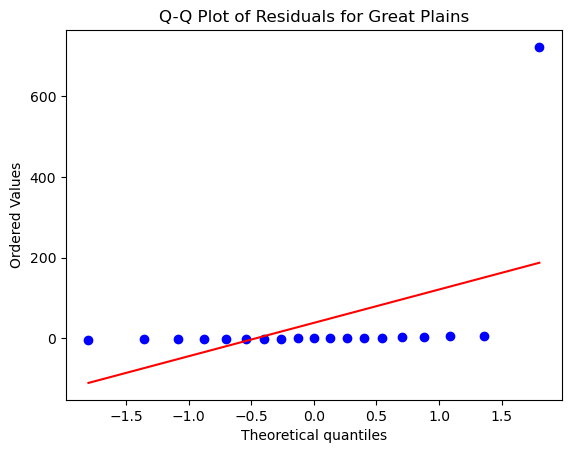

Anadarko
Number of data points:  262
Number of samples in the training dataset: 183
Best parameters: {'C': 1, 'epsilon': 0.5, 'kernel': 'linear'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 18808.84122711104
MSE of the model: 10477.78609044303
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 102.36105748986296
MAE of the best SVR model: 25.90581403622686
-------------------------------
R-squared (Coefficient of Determination): 0.44293292904507253
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  26.582278481012654
±15%:  62.0253164556962
±25%:  65.82278481012658
±50%:  81.0126582278481
-------------------------------
Minimum percentage difference: 1.21%
Maximum percentage difference: 1714.82%
-------------------------------
Quantile re

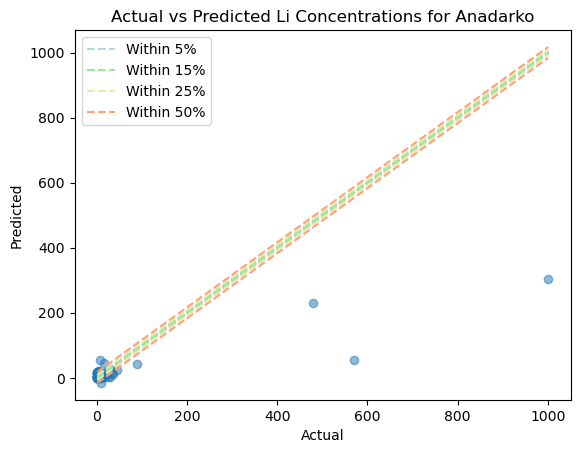

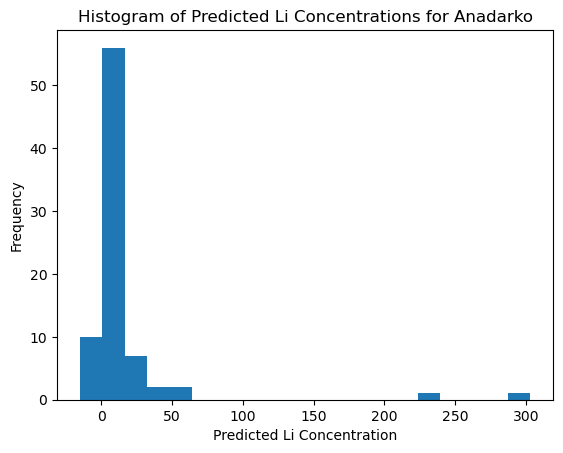

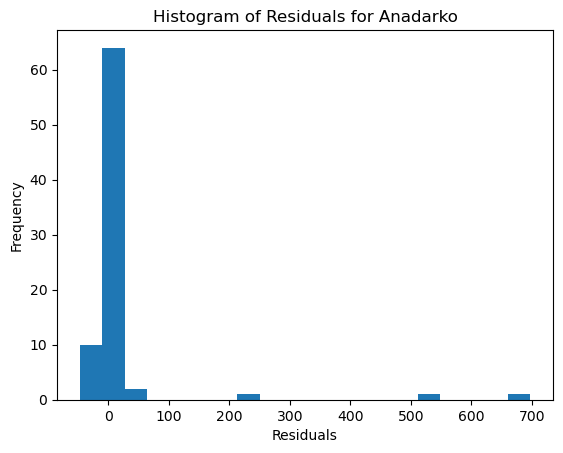

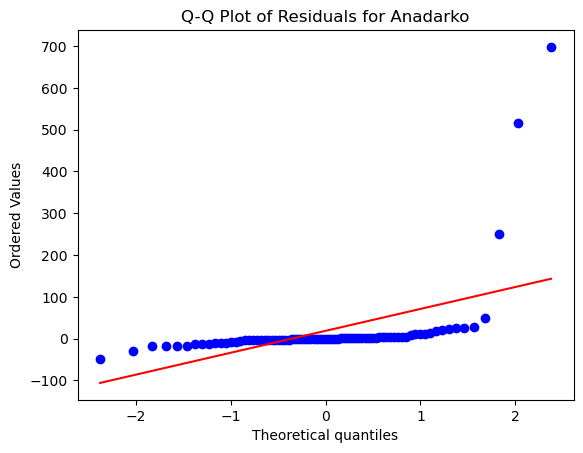

Rocky Mountain
Number of data points:  693
Number of samples in the training dataset: 485
Best parameters: {'C': 10, 'epsilon': 0.5, 'kernel': 'linear'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 188.66855393629808
MSE of the model: 57.19211539789943
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 7.562546885666192
MAE of the best SVR model: 3.53420805313026
-------------------------------
R-squared (Coefficient of Determination): 0.6968646114857607
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  9.134615384615383
±15%:  35.57692307692308
±25%:  59.13461538461539
±50%:  80.28846153846155
-------------------------------
Minimum percentage difference: 0.23%
Maximum percentage difference: 1650.72%
-------------------------------
Quant

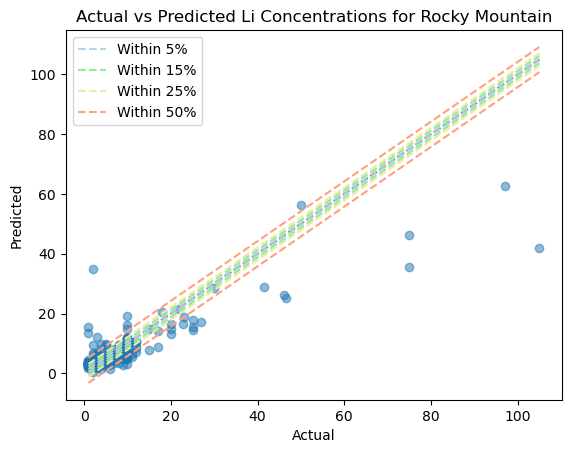

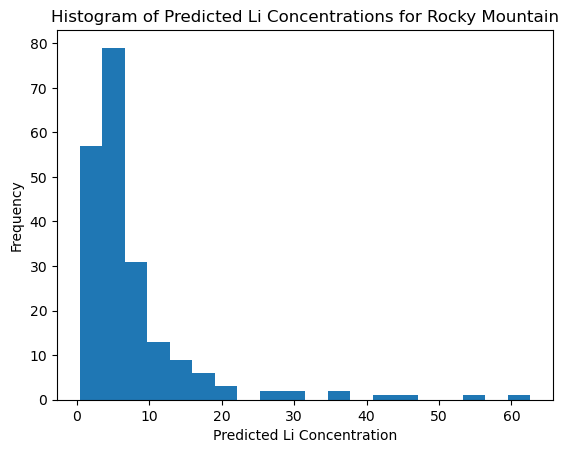

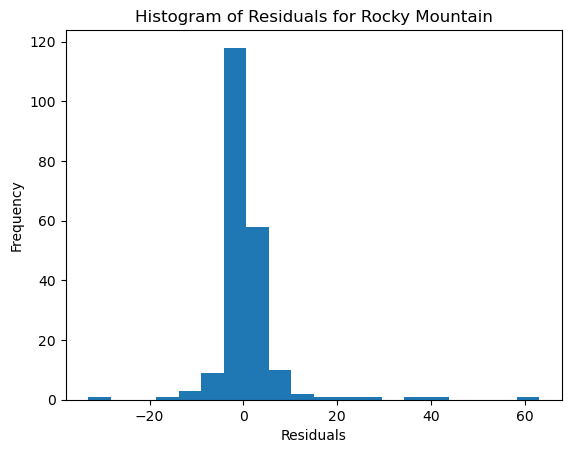

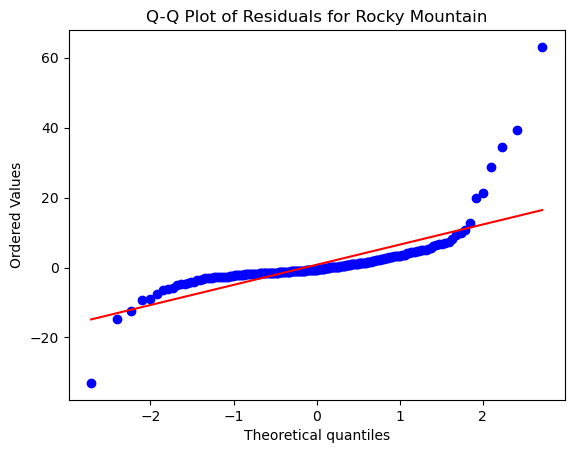

Fort Worth
Number of data points:  17
Number of samples in the training dataset: 11
Best parameters: {'C': 10, 'epsilon': 0.01, 'kernel': 'linear'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 893.8299805555554
MSE of the model: 392.91612330615453
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 19.822111978953064
MAE of the best SVR model: 14.922485910537802
-------------------------------
R-squared (Coefficient of Determination): 0.5604129064210405
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  16.666666666666664
±15%:  16.666666666666664
±25%:  16.666666666666664
±50%:  50.0
-------------------------------
Minimum percentage difference: 23.07%
Maximum percentage difference: 643.23%
-------------------------------
Quantile regressi

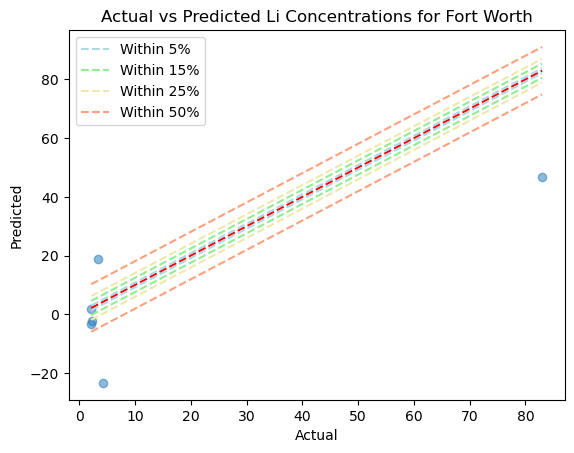

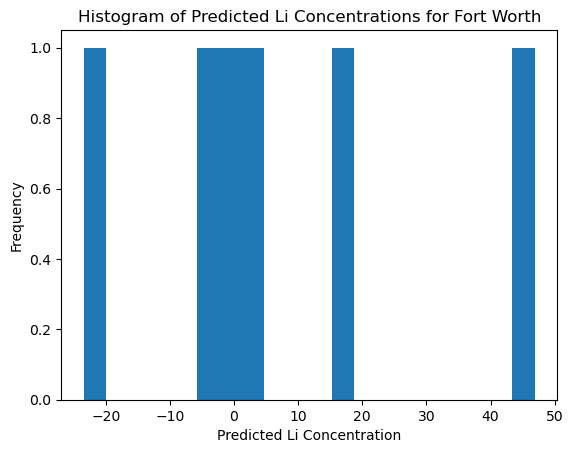

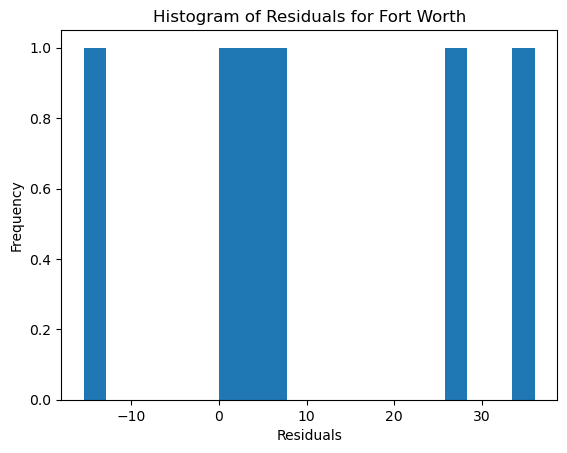

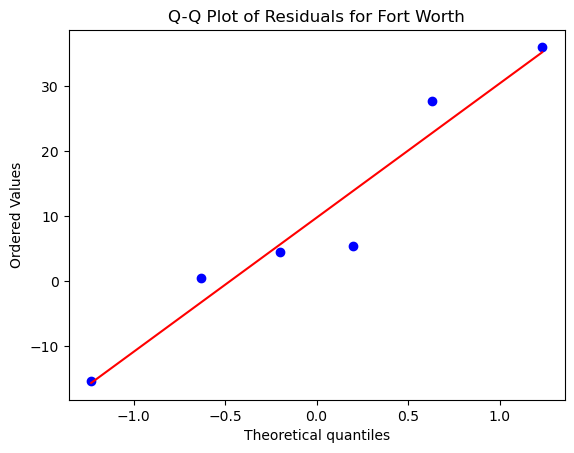

,round,basin,data_row_count,feature_quantity,feature_list,kernel_options,best_kernel,c_options,best_c,epsilon_options,...,within_5_percent,within_15_percent,within_25_percent,within_50_percent,results_min%_difference,results_max%_difference,0.25_quantile_loss,0.5_quantile_loss,0.75_quantile_loss,cross_val_mse
8,01_pca,Great Plains,62,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10,"[0.01, 0.1, 0.5]",...,63.16,94.74,94.74,94.74,14.45,202.52,0.58,1.16,3.34,5.17
9,01_pca,Anadarko,262,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[linear, rbf, poly]",linear,"[0.1, 1, 10]",1,"[0.01, 0.1, 0.5]",...,26.58,62.03,65.82,81.01,1.21,1714.82,1.67,3.29,12.14,5654.93
3,01_pca,Gulf Coast,888,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[linear, rbf, poly]",poly,"[0.1, 1, 10]",1,"[0.01, 0.1, 0.5]",...,27.34,61.80,67.42,78.28,0.30,874.13,2.55,4.61,21.59,5375.06
1,01_pca,Permian,481,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10,"[0.01, 0.1, 0.5]",...,21.38,56.55,71.03,88.97,0.35,879.90,1.45,3.28,6.68,182.84
0,01_pca,Appalachian,652,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[linear, rbf, poly]",linear,"[0.1, 1, 10]",1,"[0.01, 0.1, 0.5]",...,17.35,43.37,63.27,79.08,0.01,4015.79,5.38,11.66,26.23,3594.79
4,01_pca,Williston,502,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[linear, rbf, poly]",linear,"[0.1, 1, 10]",10,"[0.01, 0.1, 0.5]",...,15.23,37.75,58.28,78.81,0.79,174735.11,2.76,6.38,13.98,2285.41
10,01_pca,Rocky Mountain,693,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[linear, rbf, poly]",linear,"[0.1, 1, 10]",10,"[0.01, 0.1, 0.5]",...,9.13,35.58,59.13,80.29,0.23,1650.72,1.01,1.71,3.22,71.03
6,01_pca,Pacific,145,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10,"[0.01, 0.1, 0.5]",...,6.82,34.09,52.27,72.73,0.76,4550.00,0.25,0.52,1.17,2.38
5,01_pca,Michigan,150,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[linear, rbf, poly]",linear,"[0.1, 1, 10]",1,"[0.01, 0.1, 0.5]",...,6.67,33.33,55.56,84.44,0.91,1054.03,2.65,5.42,10.07,147.93
2,01_pca,Oklahoma Platform,254,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[linear, rbf, poly]",linear,"[0.1, 1, 10]",10,"[0.01, 0.1, 0.5]",...,5.19,25.97,44.16,68.83,1.27,2432.71,2.84,5.84,12.72,152.56


In [46]:
# Define all the variables...
round = '01_pca'
test_size = 0.3
random_state = 42
kernel_values = ['linear', 'rbf', 'poly']
c_values = [0.1, 1, 10]
epsilon_values = [0.01, 0.1, 0.5]

# Run the function...
df_round01_pca = generate_svr_models_by_basin(df=df, round=round, basins=basins, categorical_columns=categorical_columns, 
                                              test_size=test_size, random_state=random_state, kernel_values=kernel_values, 
                                              c_values=c_values, epsilon_values=epsilon_values)
df_round01_pca

#### ROUND 2

Appalachian
Number of data points:  652
Number of samples in the training dataset: 456
Best parameters: {'C': 100, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 3846.8820694580363
MSE of the model: 1812.7329933396873
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 42.576202194884495
MAE of the best SVR model: 19.853084880012602
-------------------------------
R-squared (Coefficient of Determination): 0.5287786418690317
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  26.53061224489796
±15%:  55.10204081632652
±25%:  70.40816326530613
±50%:  83.6734693877551
-------------------------------
Minimum percentage difference: 0.14%
Maximum percentage difference: 4755.12%
-------------------------------
Quantil

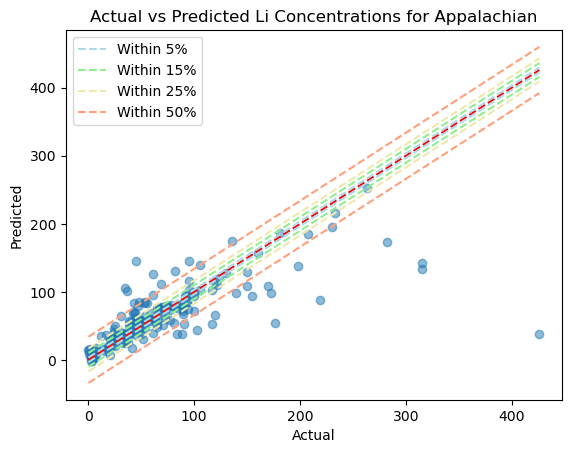

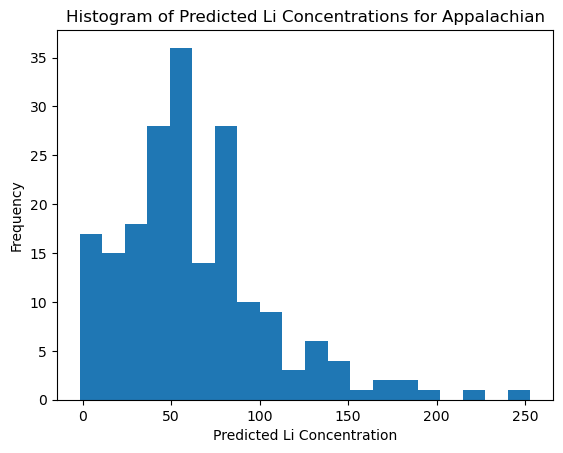

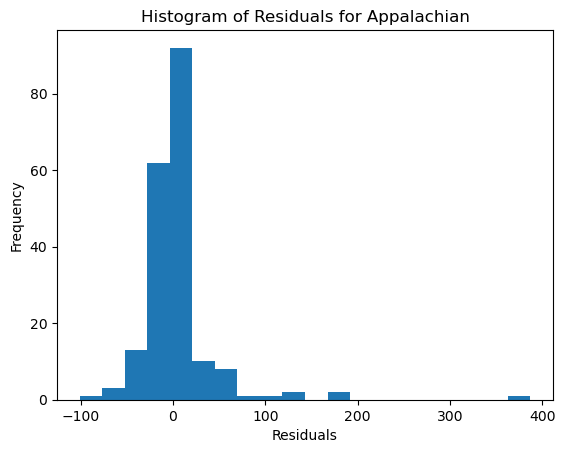

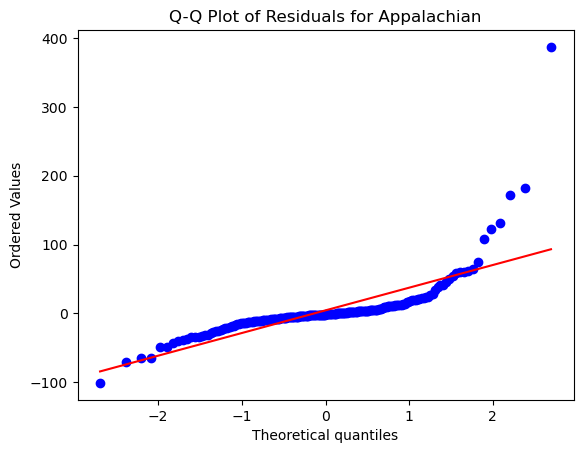

Permian
Number of data points:  481
Number of samples in the training dataset: 336
Best parameters: {'C': 100, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 5745.300019005947
MSE of the model: 5338.748752720643
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 73.06674176888308
MAE of the best SVR model: 15.314856397341414
-------------------------------
R-squared (Coefficient of Determination): 0.07076240839301606
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  26.89655172413793
±15%:  60.0
±25%:  76.55172413793103
±50%:  89.65517241379311
-------------------------------
Minimum percentage difference: 0.40%
Maximum percentage difference: 848.11%
-------------------------------
Quantile regression loss:


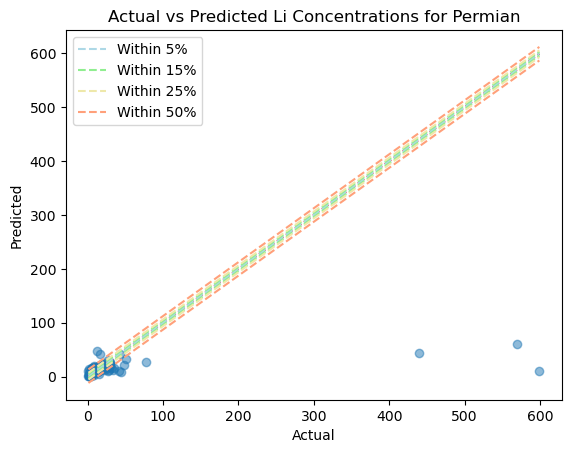

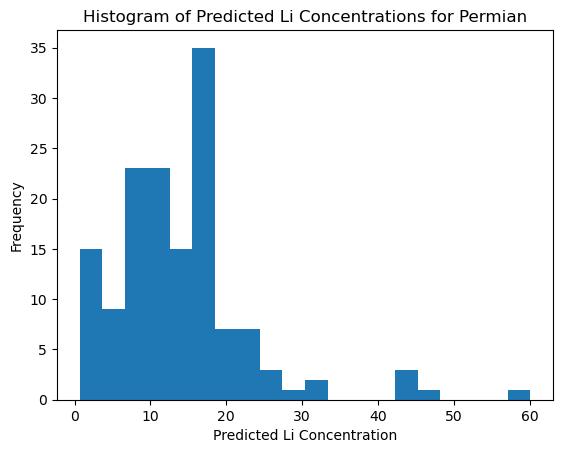

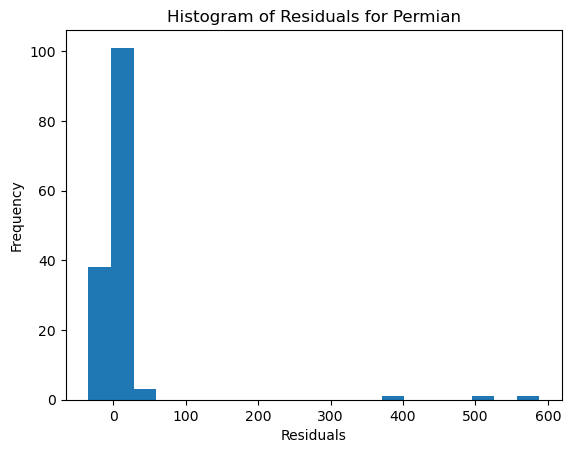

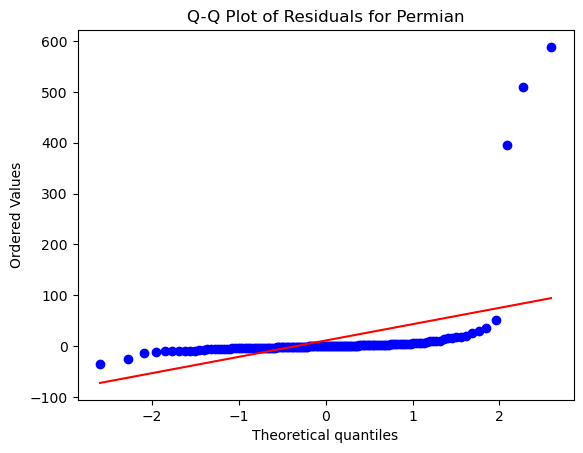

Oklahoma Platform
Number of data points:  254
Number of samples in the training dataset: 177
Best parameters: {'C': 50, 'epsilon': 0.01, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 283.7832482712093
MSE of the model: 179.95830128039802
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 13.4148537554607
MAE of the best SVR model: 9.693304040844076
-------------------------------
R-squared (Coefficient of Determination): 0.3658600274093229
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  10.38961038961039
±15%:  24.675324675324674
±25%:  38.961038961038966
±50%:  68.83116883116884
-------------------------------
Minimum percentage difference: 4.63%
Maximum percentage difference: 284.00%
-------------------------------
Qua

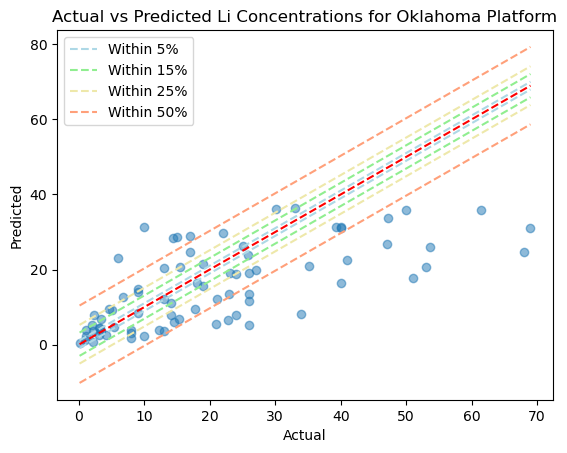

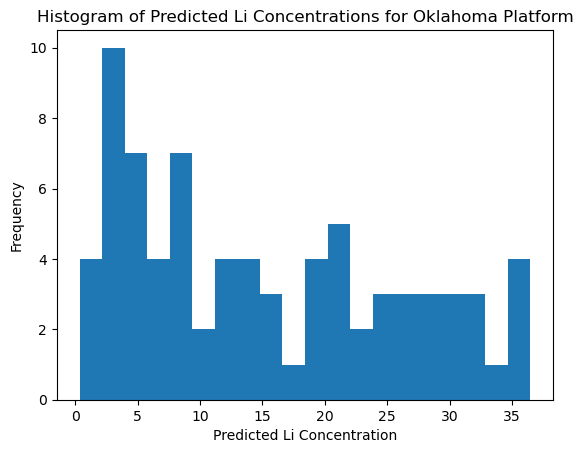

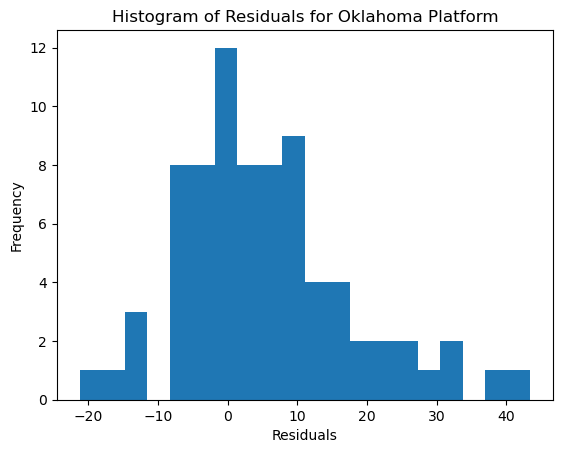

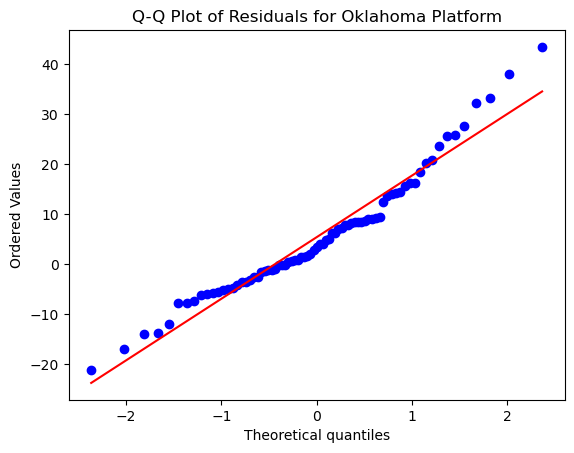

Gulf Coast
Number of data points:  888
Number of samples in the training dataset: 621
Best parameters: {'C': 100, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 16797.03549157902
MSE of the model: 10737.259820432513
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 103.62074995111989
MAE of the best SVR model: 15.360032473600379
-------------------------------
R-squared (Coefficient of Determination): 0.36076459290596274
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  46.81647940074906
±15%:  71.91011235955057
±25%:  78.27715355805243
±50%:  91.38576779026218
-------------------------------
Minimum percentage difference: 0.26%
Maximum percentage difference: 1544.83%
-------------------------------
Quantil

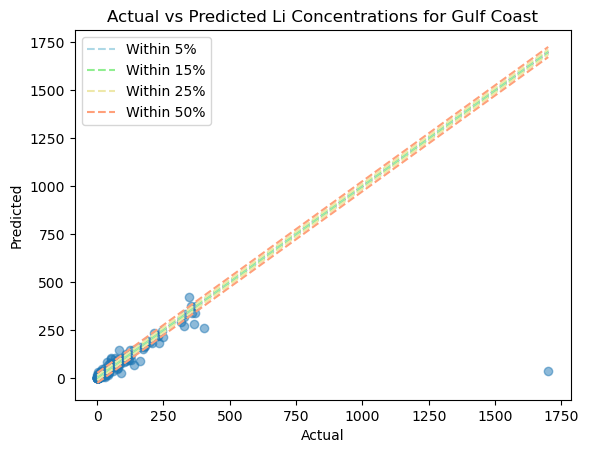

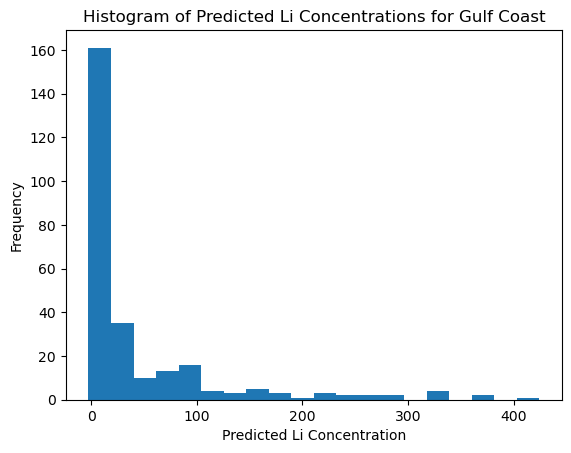

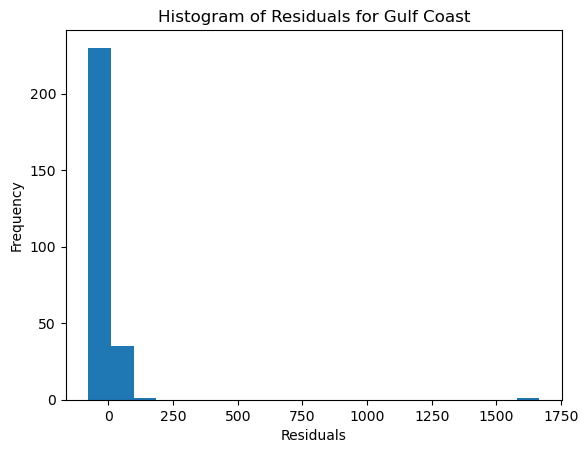

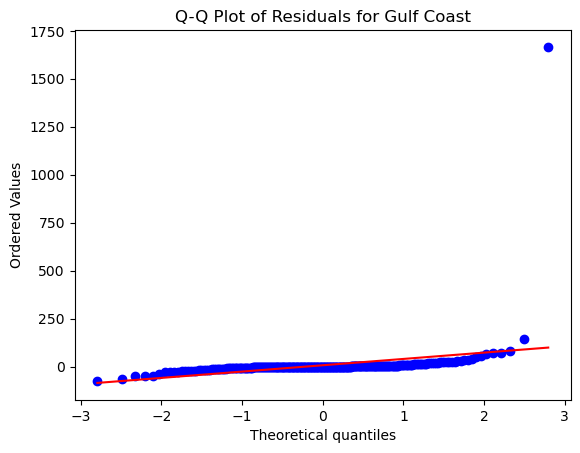

Williston
Number of data points:  502
Number of samples in the training dataset: 351
Best parameters: {'C': 100, 'epsilon': 0.5, 'kernel': 'linear'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 2074.0401568535945
MSE of the model: 2734.8541982601014
The model's MSE is close to or larger than the variance of the target variable.
The model's performance may be limited compared to the variability of the target variable.
RMSE of the model: 52.29583346940845
MAE of the best SVR model: 18.095753441602817
-------------------------------
R-squared (Coefficient of Determination): -0.3186119802082268
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  11.920529801324504
±15%:  37.086092715231786
±25%:  57.615894039735096
±50%:  74.83443708609272
-------------------------------
Minimum percentage difference: 1.92%
Maximum percentage difference: 257645.93%
------------------

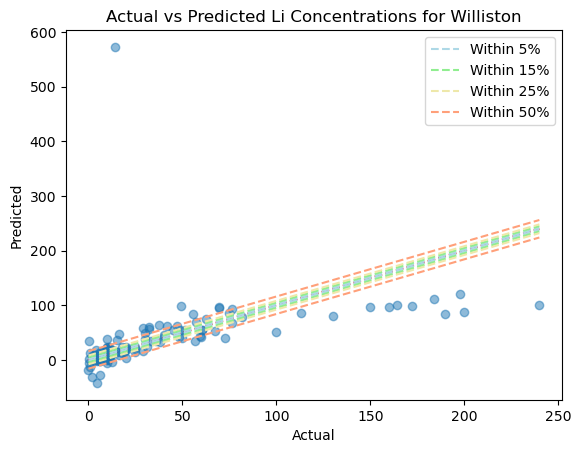

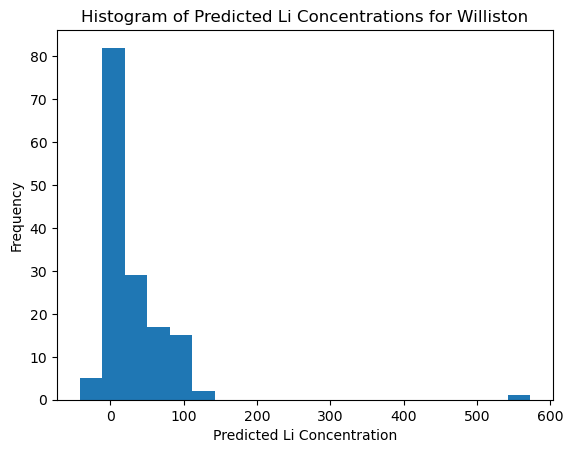

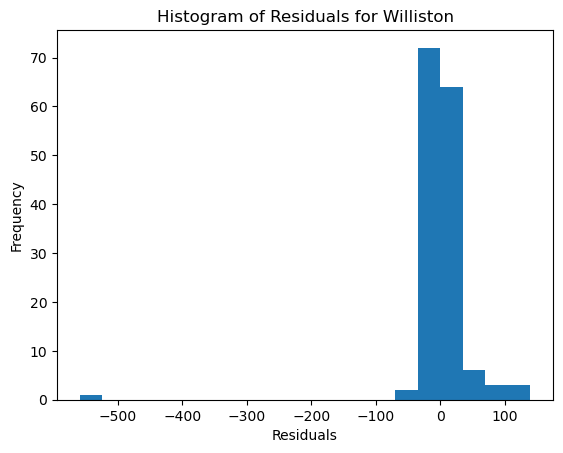

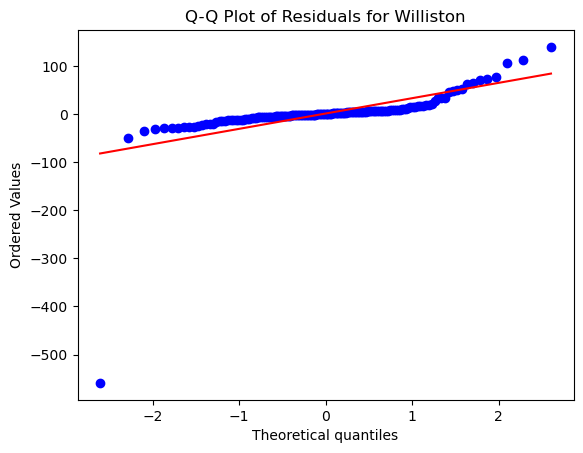

Michigan
Number of data points:  150
Number of samples in the training dataset: 105
Best parameters: {'C': 0.5, 'epsilon': 0.5, 'kernel': 'linear'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 309.10417758024687
MSE of the model: 108.87754655106404
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 10.434440404308418
MAE of the best SVR model: 7.522692785282518
-------------------------------
R-squared (Coefficient of Determination): 0.6477642346881636
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  11.11111111111111
±15%:  31.11111111111111
±25%:  51.11111111111111
±50%:  77.77777777777779
-------------------------------
Minimum percentage difference: 1.44%
Maximum percentage difference: 964.24%
-------------------------------
Quantile

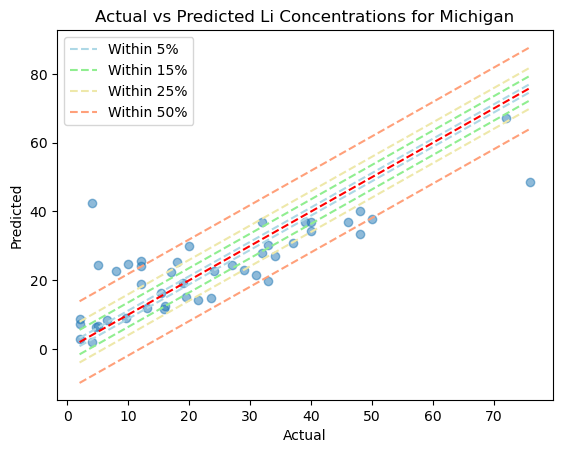

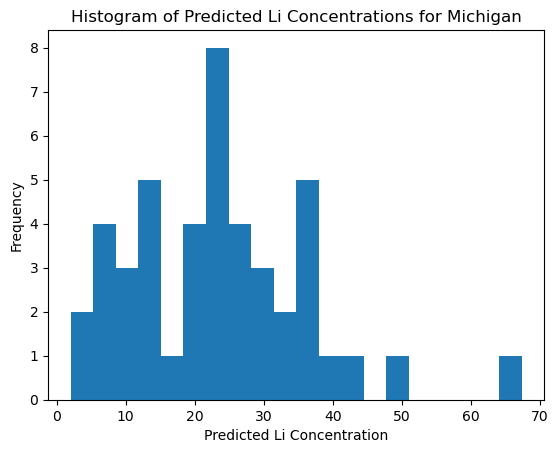

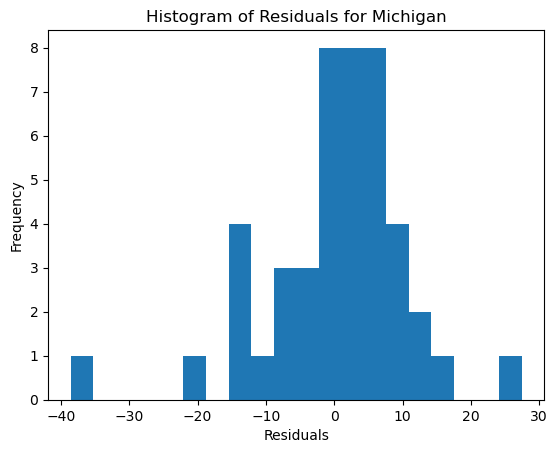

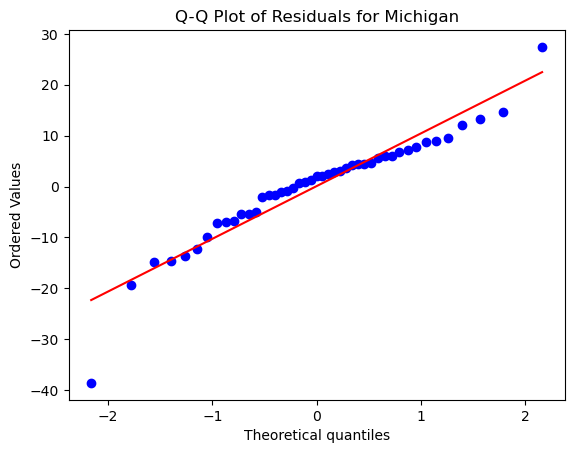

Pacific
Number of data points:  145
Number of samples in the training dataset: 101
Best parameters: {'C': 50, 'epsilon': 0.1, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 7.590610782541324
MSE of the model: 2.7042757987954205
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 1.6444682419540428
MAE of the best SVR model: 0.847655753856253
-------------------------------
R-squared (Coefficient of Determination): 0.643734097786261
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  20.454545454545457
±15%:  45.45454545454545
±25%:  65.9090909090909
±50%:  81.81818181818183
-------------------------------
Minimum percentage difference: 0.18%
Maximum percentage difference: 3942.88%
-------------------------------
Quantile regre

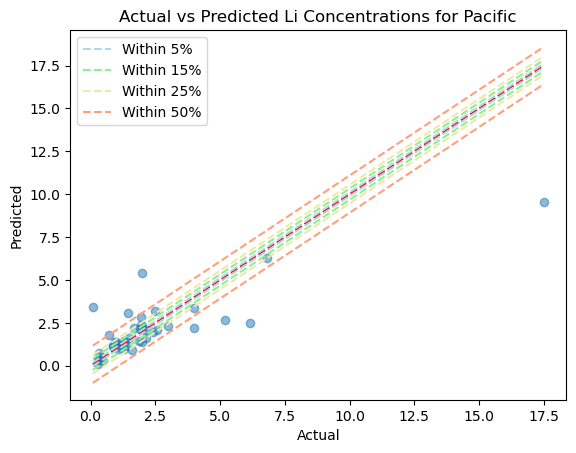

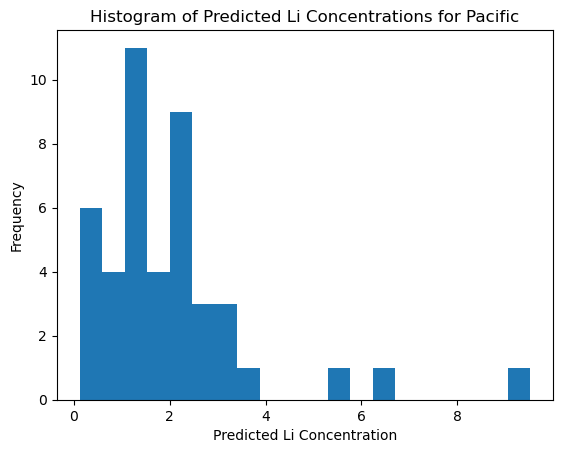

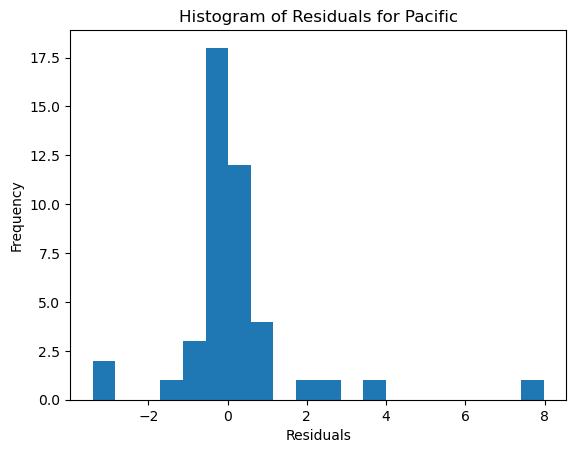

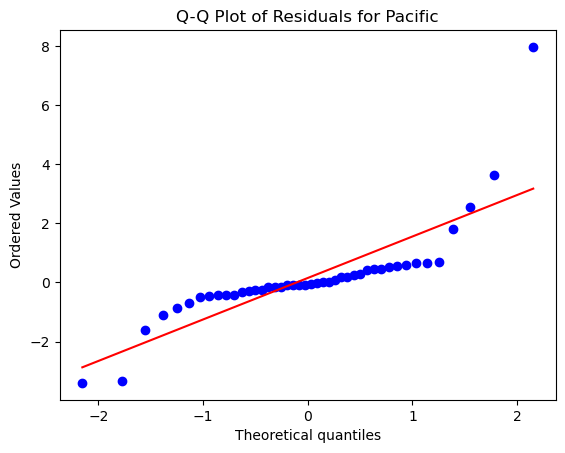

Illinois
Number of data points:  25
Number of samples in the training dataset: 17
Best parameters: {'C': 50, 'epsilon': 0.01, 'kernel': 'poly'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 140.9118484375
MSE of the model: 362.7363026533883
The model's MSE is close to or larger than the variance of the target variable.
The model's performance may be limited compared to the variability of the target variable.
RMSE of the model: 19.045637365375523
MAE of the best SVR model: 12.468690380867265
-------------------------------
R-squared (Coefficient of Determination): -1.5742072556395161
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  12.5
±15%:  25.0
±25%:  62.5
±50%:  62.5
-------------------------------
Minimum percentage difference: 12.88%
Maximum percentage difference: 190.27%
-------------------------------
Quantile regression loss:
Quantile 0.25: 2.723160102

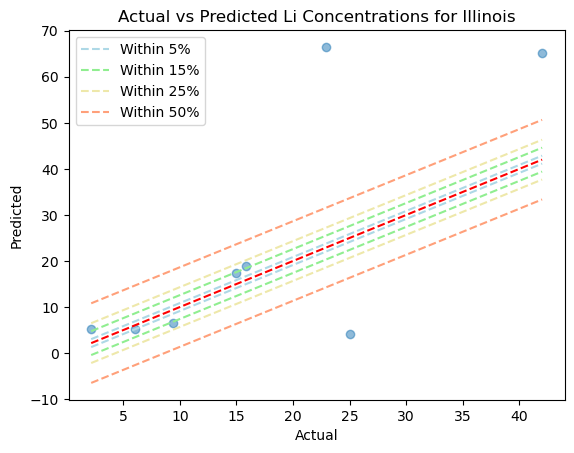

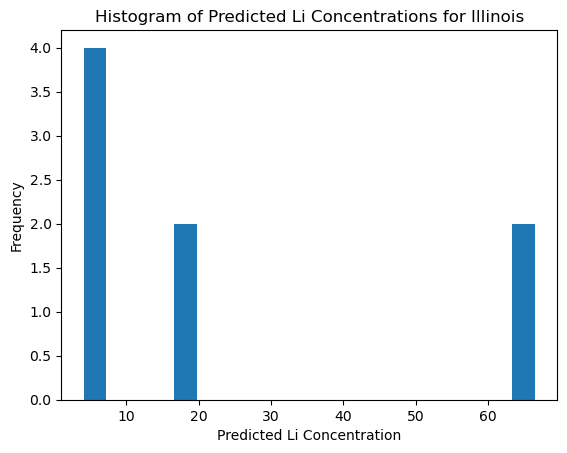

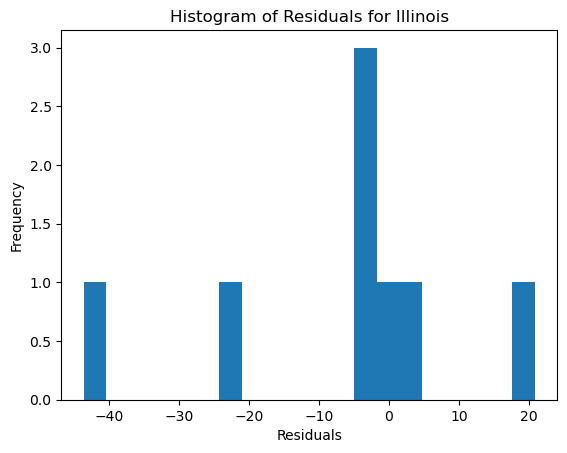

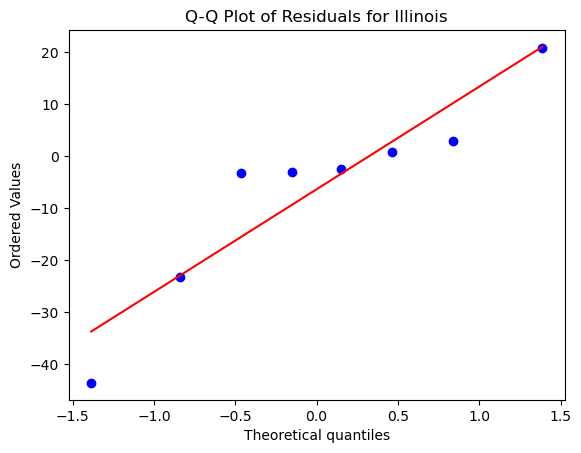

Great Plains
Number of data points:  62
Number of samples in the training dataset: 43
Best parameters: {'C': 50, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 26213.597100831015
MSE of the model: 27396.007459468663
The model's MSE is close to or larger than the variance of the target variable.
The model's performance may be limited compared to the variability of the target variable.
RMSE of the model: 165.5173932233971
MAE of the best SVR model: 39.71740376503126
-------------------------------
R-squared (Coefficient of Determination): -0.04510675715696255
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  57.89473684210527
±15%:  94.73684210526315
±25%:  94.73684210526315
±50%:  94.73684210526315
-------------------------------
Minimum percentage difference: 6.24%
Maximum percentage difference: 153.47%
---------------------------

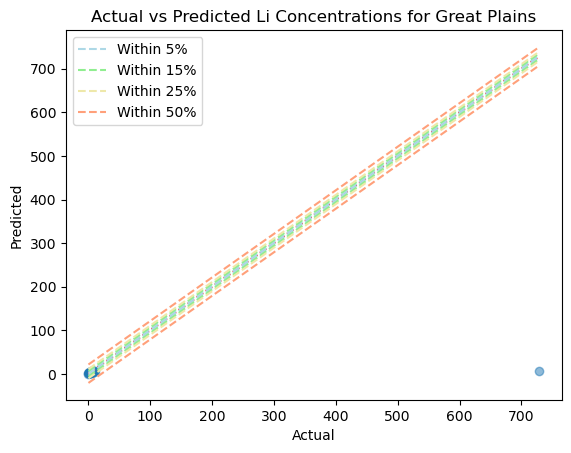

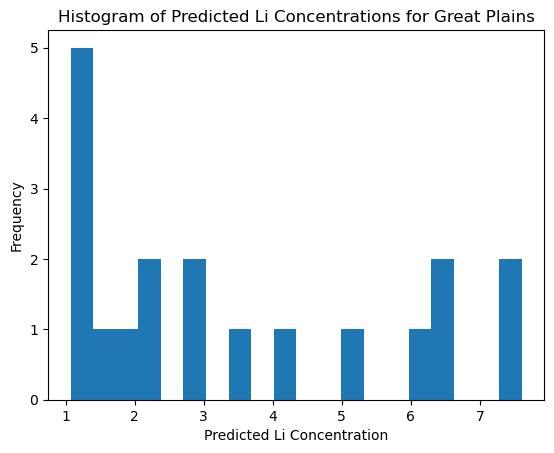

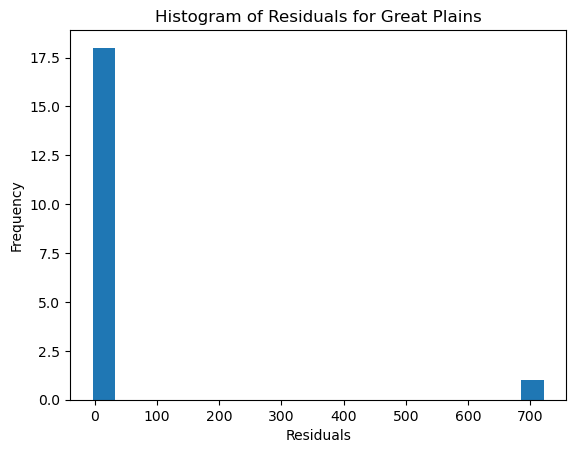

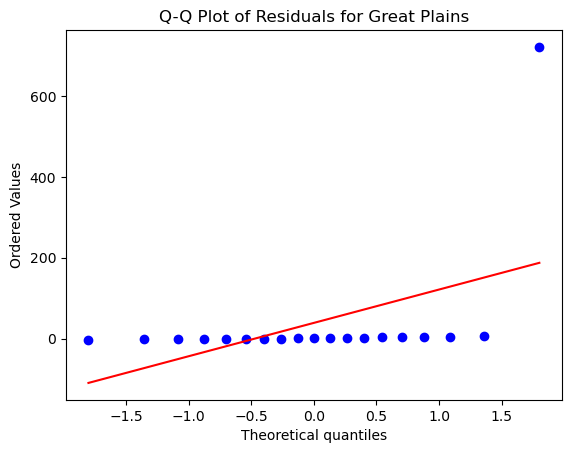

Anadarko
Number of data points:  262
Number of samples in the training dataset: 183
Best parameters: {'C': 100, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 18808.84122711104
MSE of the model: 13476.28913289435
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 116.08742021810266
MAE of the best SVR model: 26.73944882797175
-------------------------------
R-squared (Coefficient of Determination): 0.28351305802562454
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  50.63291139240506
±15%:  68.35443037974683
±25%:  77.21518987341773
±50%:  87.34177215189874
-------------------------------
Minimum percentage difference: 1.07%
Maximum percentage difference: 1197.21%
-------------------------------
Quantile re

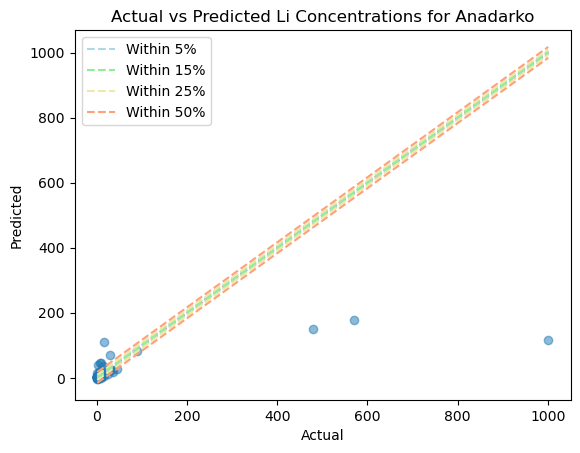

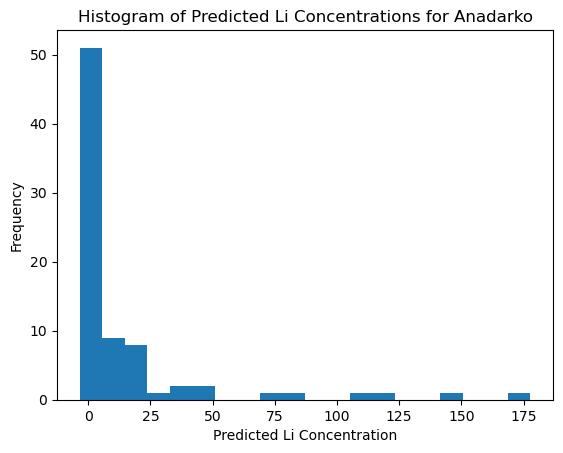

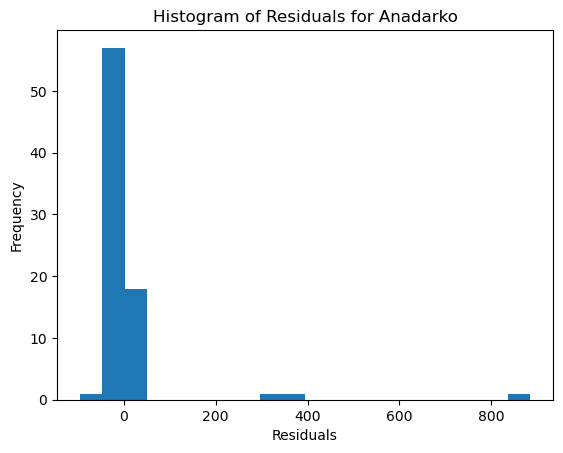

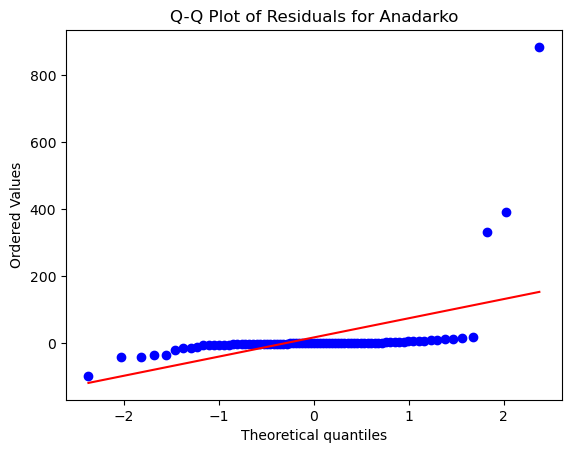

Rocky Mountain
Number of data points:  693
Number of samples in the training dataset: 485
Best parameters: {'C': 50, 'epsilon': 0.5, 'kernel': 'linear'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 188.66855393629808
MSE of the model: 56.68406040150973
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 7.528881749736128
MAE of the best SVR model: 3.5260397099496403
-------------------------------
R-squared (Coefficient of Determination): 0.6995574555543129
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  9.134615384615383
±15%:  35.09615384615385
±25%:  59.13461538461539
±50%:  80.28846153846155
-------------------------------
Minimum percentage difference: 0.56%
Maximum percentage difference: 1669.77%
-------------------------------
Qua

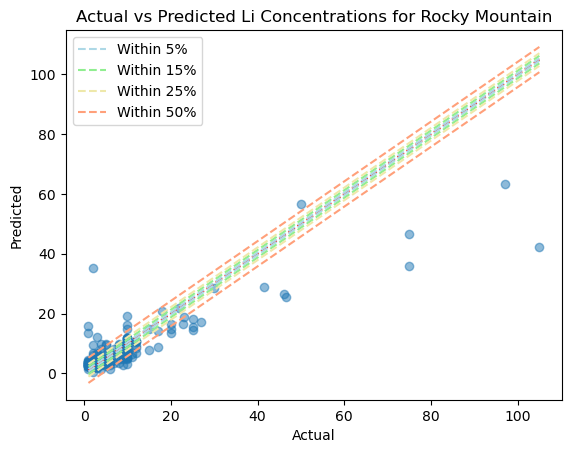

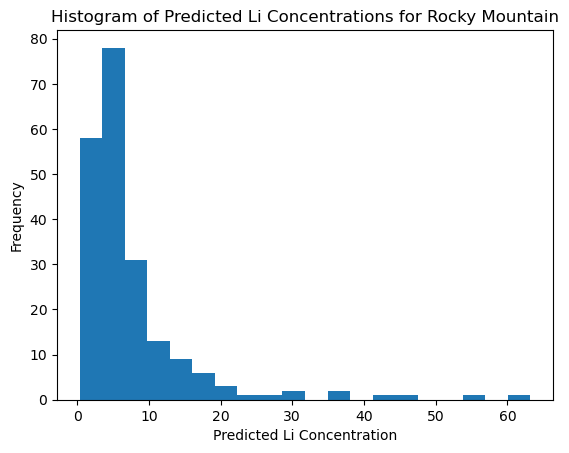

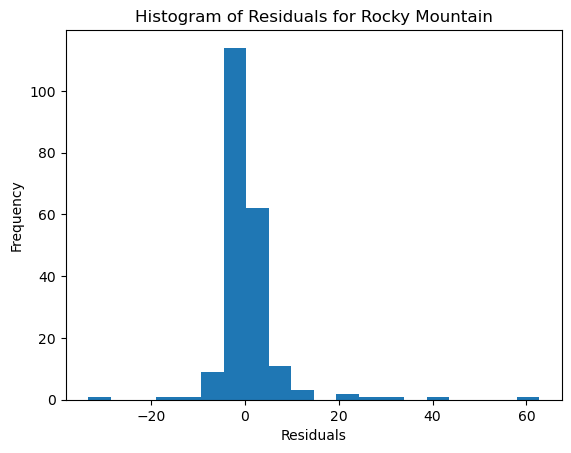

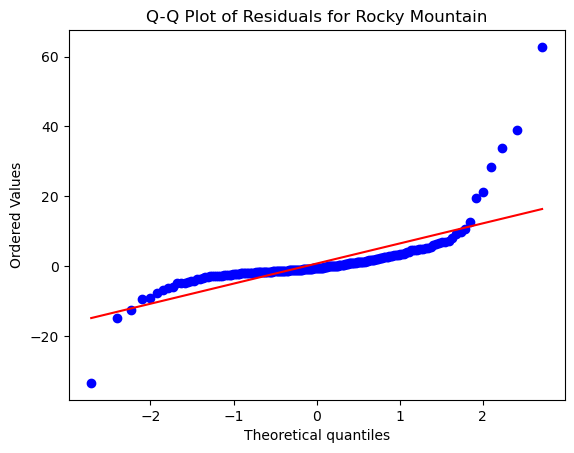

Fort Worth
Number of data points:  17
Number of samples in the training dataset: 11
Best parameters: {'C': 50, 'epsilon': 0.01, 'kernel': 'linear'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 893.8299805555554
MSE of the model: 456.20134031519495
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 21.358870295855887
MAE of the best SVR model: 15.787020487143081
-------------------------------
R-squared (Coefficient of Determination): 0.48961060801334344
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  0.0
±15%:  16.666666666666664
±25%:  16.666666666666664
±50%:  50.0
-------------------------------
Minimum percentage difference: 46.27%
Maximum percentage difference: 752.86%
-------------------------------
Quantile regression loss:
Quant

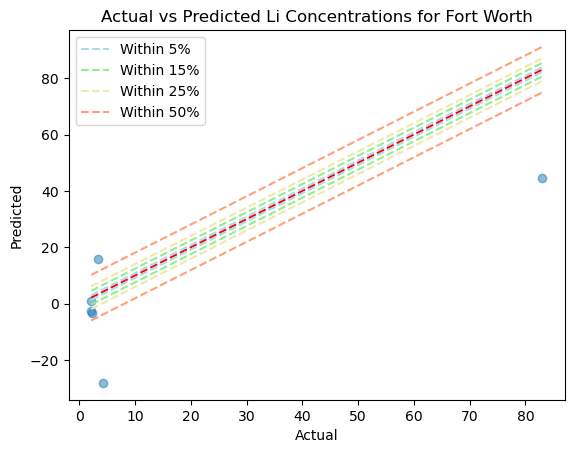

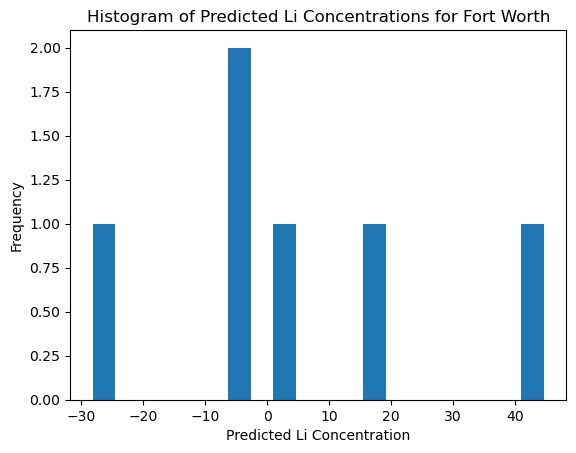

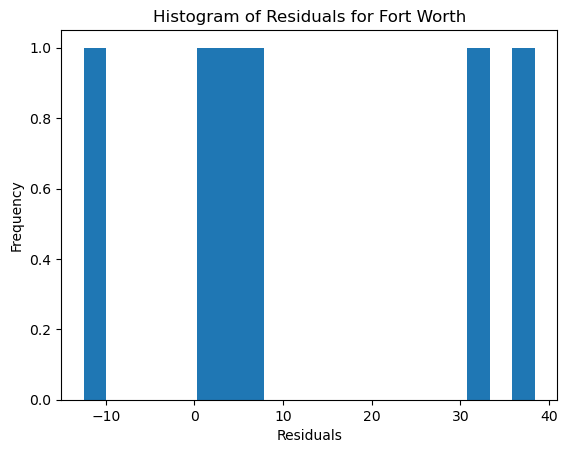

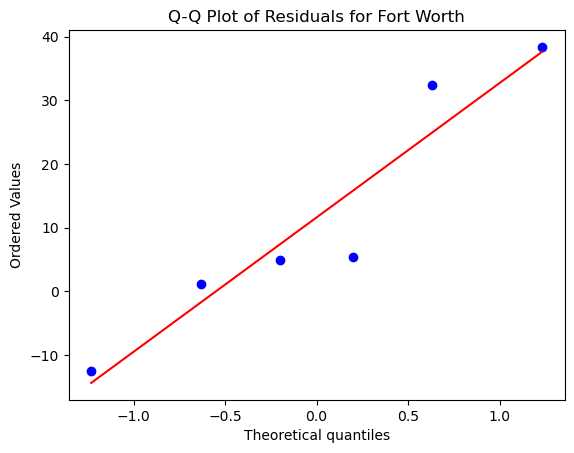

,round,basin,data_row_count,feature_quantity,feature_list,kernel_options,best_kernel,c_options,best_c,epsilon_options,...,within_5_percent,within_15_percent,within_25_percent,within_50_percent,results_min%_difference,results_max%_difference,0.25_quantile_loss,0.5_quantile_loss,0.75_quantile_loss,cross_val_mse
8,02_pca,Great Plains,62,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[linear, rbf, poly, sigmoid]",rbf,"[0.1, 0.5, 1, 5, 10, 50, 100]",50.0,"[0.01, 0.05, 0.1, 0.2, 0.5]",...,57.89,94.74,94.74,94.74,6.24,153.47,0.55,0.88,2.99,4.70
3,02_pca,Gulf Coast,888,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[linear, rbf, poly, sigmoid]",rbf,"[0.1, 0.5, 1, 5, 10, 50, 100]",100.0,"[0.01, 0.05, 0.1, 0.2, 0.5]",...,46.82,71.91,78.28,91.39,0.26,1544.83,0.98,2.95,10.39,4703.40
9,02_pca,Anadarko,262,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[linear, rbf, poly, sigmoid]",rbf,"[0.1, 0.5, 1, 5, 10, 50, 100]",100.0,"[0.01, 0.05, 0.1, 0.2, 0.5]",...,50.63,68.35,77.22,87.34,1.07,1197.21,0.75,1.52,6.94,3553.85
1,02_pca,Permian,481,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[linear, rbf, poly, sigmoid]",rbf,"[0.1, 0.5, 1, 5, 10, 50, 100]",100.0,"[0.01, 0.05, 0.1, 0.2, 0.5]",...,26.90,60.00,76.55,89.66,0.40,848.11,0.94,3.09,5.67,168.89
0,02_pca,Appalachian,652,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[linear, rbf, poly, sigmoid]",rbf,"[0.1, 0.5, 1, 5, 10, 50, 100]",100.0,"[0.01, 0.05, 0.1, 0.2, 0.5]",...,26.53,55.10,70.41,83.67,0.14,4755.12,3.24,8.63,20.86,3094.47
6,02_pca,Pacific,145,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[linear, rbf, poly, sigmoid]",rbf,"[0.1, 0.5, 1, 5, 10, 50, 100]",50.0,"[0.01, 0.05, 0.1, 0.2, 0.5]",...,20.45,45.45,65.91,81.82,0.18,3942.88,0.17,0.42,0.68,2.16
4,02_pca,Williston,502,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[linear, rbf, poly, sigmoid]",linear,"[0.1, 0.5, 1, 5, 10, 50, 100]",100.0,"[0.01, 0.05, 0.1, 0.2, 0.5]",...,11.92,37.09,57.62,74.83,1.92,257645.93,3.25,6.13,15.97,1842.15
10,02_pca,Rocky Mountain,693,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[linear, rbf, poly, sigmoid]",linear,"[0.1, 0.5, 1, 5, 10, 50, 100]",50.0,"[0.01, 0.05, 0.1, 0.2, 0.5]",...,9.13,35.10,59.13,80.29,0.56,1669.77,1.02,1.72,3.24,71.13
5,02_pca,Michigan,150,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[linear, rbf, poly, sigmoid]",linear,"[0.1, 0.5, 1, 5, 10, 50, 100]",0.5,"[0.01, 0.05, 0.1, 0.2, 0.5]",...,11.11,31.11,51.11,77.78,1.44,964.24,2.54,5.66,9.61,124.52
7,02_pca,Illinois,25,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[linear, rbf, poly, sigmoid]",poly,"[0.1, 0.5, 1, 5, 10, 50, 100]",50.0,"[0.01, 0.05, 0.1, 0.2, 0.5]",...,12.50,25.00,62.50,62.50,12.88,190.27,2.72,3.08,21.41,31.75


In [47]:
# Define all the variables...
round = '02_pca'
test_size = 0.3
random_state = 42
kernel_values = ['linear', 'rbf', 'poly', 'sigmoid']
c_values = [0.1, 0.5, 1, 5, 10, 50, 100]
epsilon_values = [0.01, 0.05, 0.1, 0.2, 0.5]

# Run the function...
df_round02_pca = generate_svr_models_by_basin(df=df, round=round, basins=basins, categorical_columns=categorical_columns, 
                                              test_size=test_size, random_state=random_state, kernel_values=kernel_values, 
                                              c_values=c_values, epsilon_values=epsilon_values)
df_round02_pca

#### ROUND 3

Appalachian
Number of data points:  652
Number of samples in the training dataset: 489
Best parameters: {'C': 50, 'epsilon': 0.2, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 3942.0189754375397
MSE of the model: 2124.8992353082226
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 46.096629326971645
MAE of the best SVR model: 20.74978224996046
-------------------------------
R-squared (Coefficient of Determination): 0.460961692841072
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  26.993865030674847
±15%:  59.50920245398773
±25%:  69.93865030674846
±50%:  82.82208588957054
-------------------------------
Minimum percentage difference: 0.28%
Maximum percentage difference: 4922.94%
-------------------------------
Quantile

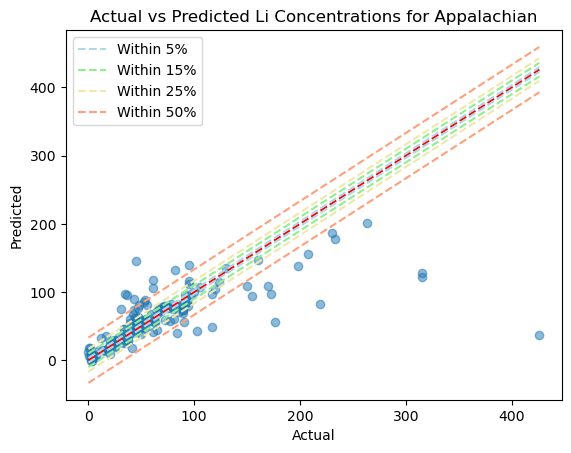

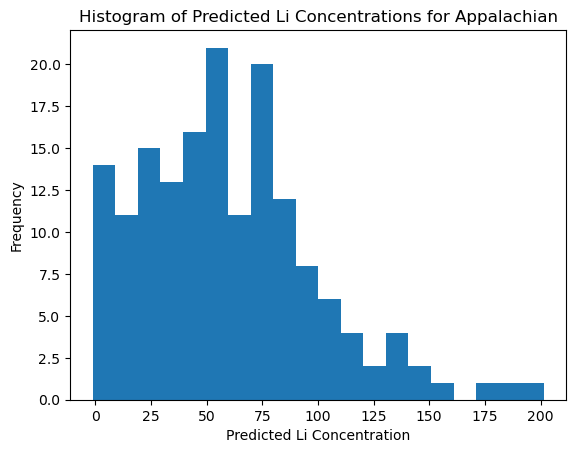

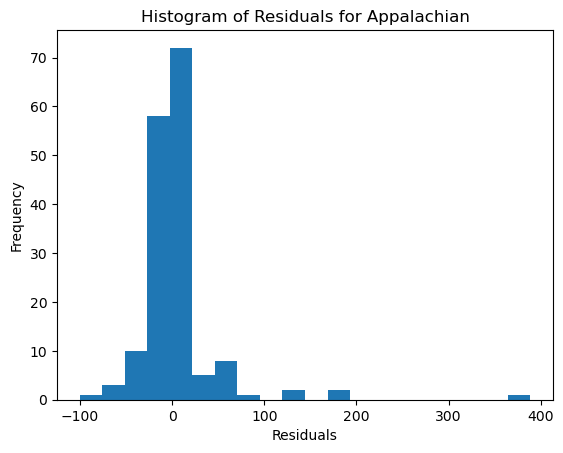

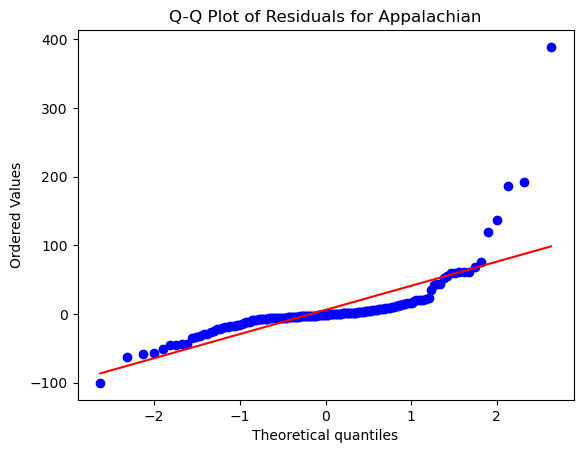

Permian
Number of data points:  481
Number of samples in the training dataset: 360
Best parameters: {'C': 5, 'epsilon': 0.2, 'kernel': 'sigmoid'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 4106.050815531726
MSE of the model: 4045.305584665702
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 63.602716802552564
MAE of the best SVR model: 13.970250140643726
-------------------------------
R-squared (Coefficient of Determination): 0.01479407674065969
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  15.702479338842975
±15%:  46.28099173553719
±25%:  63.63636363636363
±50%:  81.81818181818183
-------------------------------
Minimum percentage difference: 0.51%
Maximum percentage difference: 1000.66%
-------------------------------
Quantile

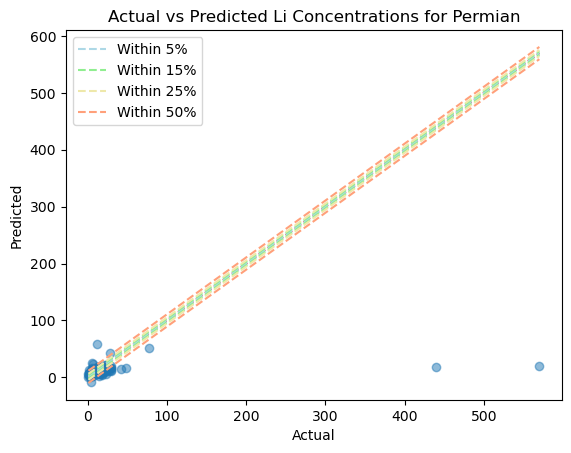

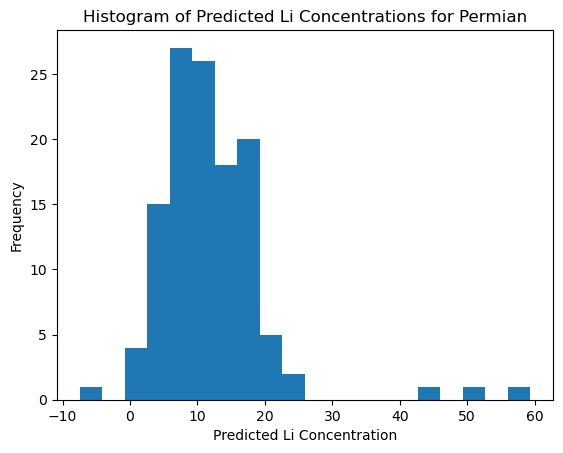

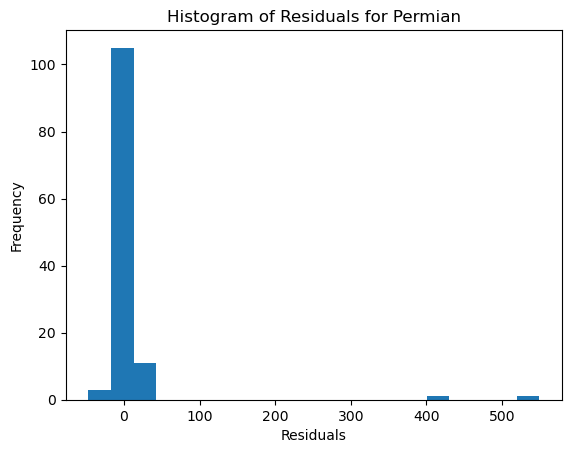

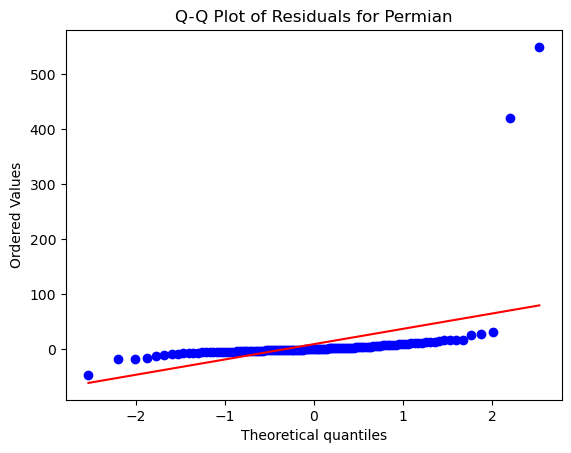

Oklahoma Platform
Number of data points:  254
Number of samples in the training dataset: 190
Best parameters: {'C': 50, 'epsilon': 0.2, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 308.3989183593751
MSE of the model: 190.69439854810352
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 13.80921426251702
MAE of the best SVR model: 10.114067124283672
-------------------------------
R-squared (Coefficient of Determination): 0.3816632056864455
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  12.5
±15%:  23.4375
±25%:  39.0625
±50%:  67.1875
-------------------------------
Minimum percentage difference: 5.11%
Maximum percentage difference: 330.54%
-------------------------------
Quantile regression loss:
Quantile 0.25: 3.6449

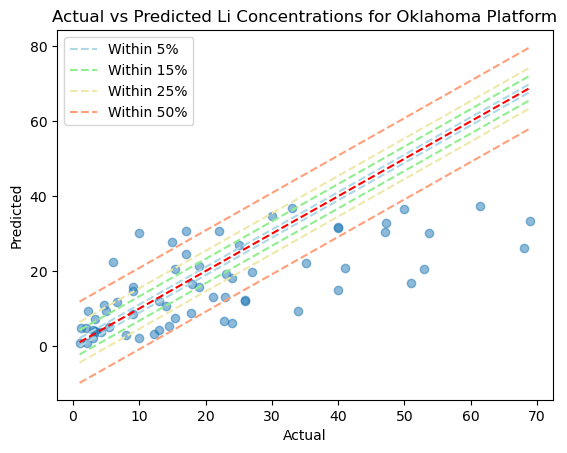

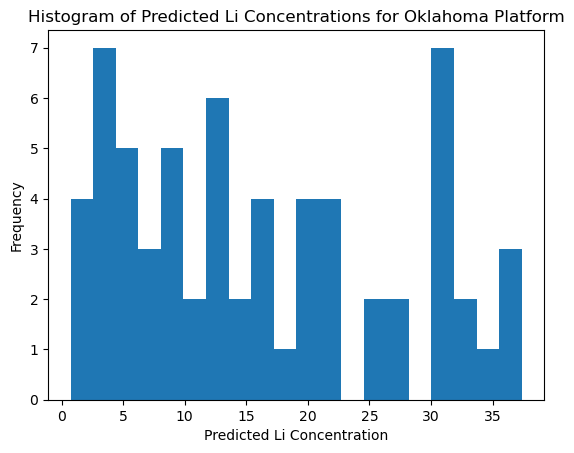

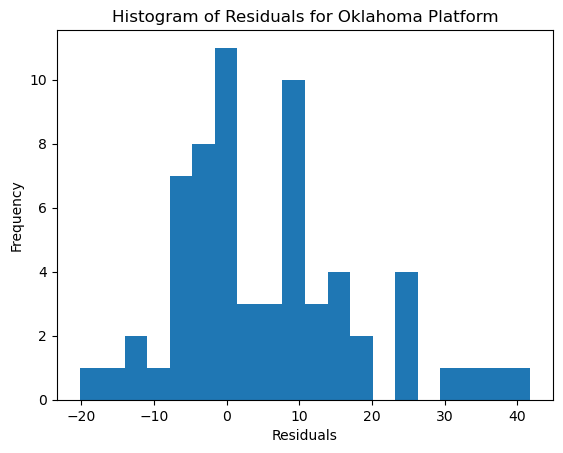

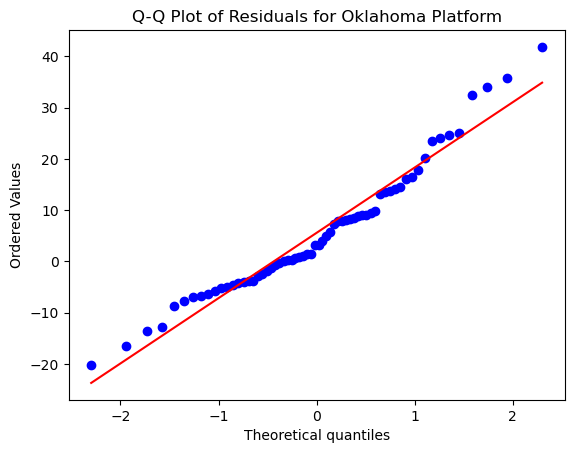

Gulf Coast
Number of data points:  888
Number of samples in the training dataset: 666
Best parameters: {'C': 50, 'epsilon': 0.2, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 19313.61518772352
MSE of the model: 12733.489156997246
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 112.842762980163
MAE of the best SVR model: 16.692875781054706
-------------------------------
R-squared (Coefficient of Determination): 0.34069882654122996
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  50.45045045045045
±15%:  72.07207207207207
±25%:  78.82882882882883
±50%:  91.44144144144144
-------------------------------
Minimum percentage difference: 0.78%
Maximum percentage difference: 1538.96%
-------------------------------
Quantile r

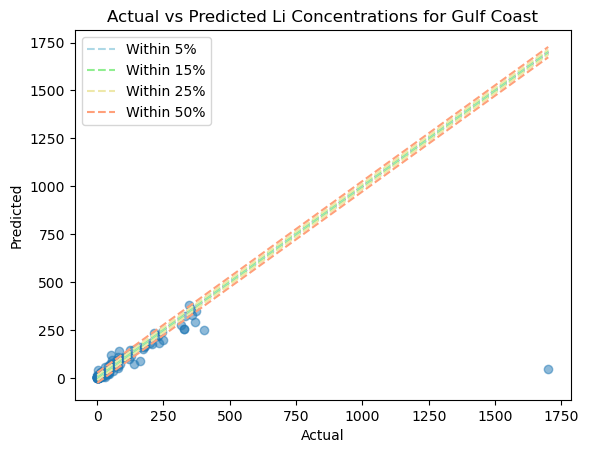

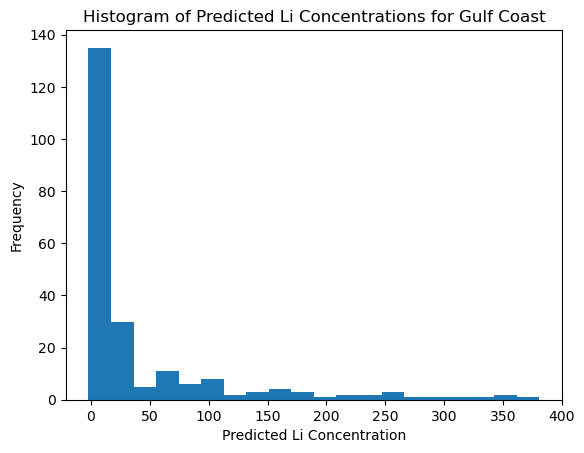

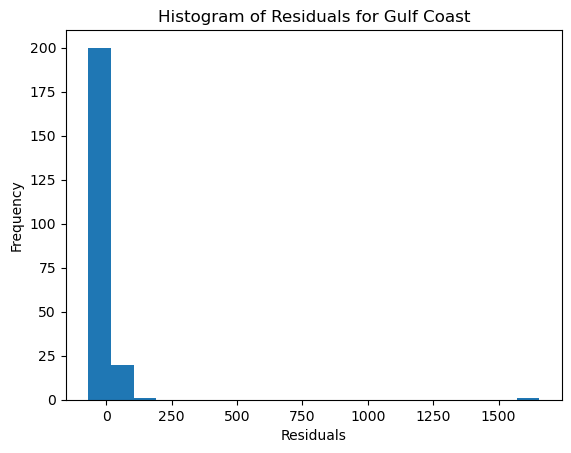

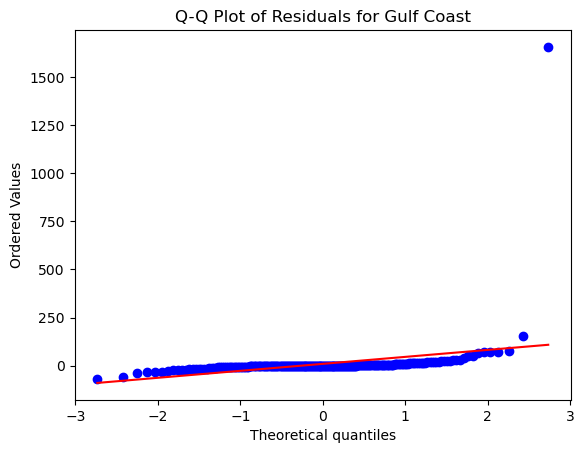

Williston
Number of data points:  502
Number of samples in the training dataset: 376
Best parameters: {'C': 50, 'epsilon': 0.2, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 2013.4464867274216
MSE of the model: 632.303044475057
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 25.145636688599815
MAE of the best SVR model: 11.367932941299609
-------------------------------
R-squared (Coefficient of Determination): 0.6859598461428302
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  22.22222222222222
±15%:  52.38095238095239
±25%:  65.87301587301587
±50%:  83.33333333333334
-------------------------------
Minimum percentage difference: 0.60%
Maximum percentage difference: 28384.84%
-------------------------------
Quantile r

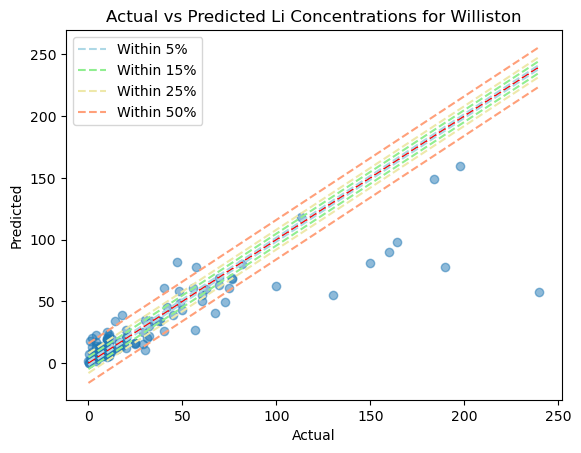

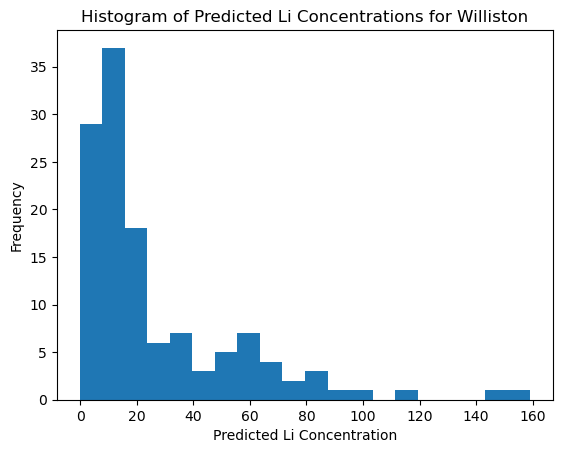

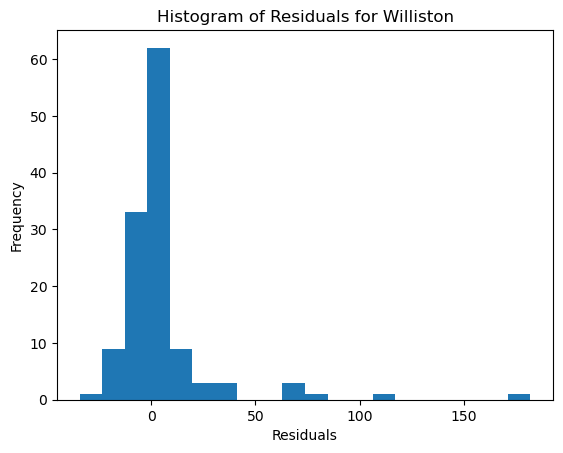

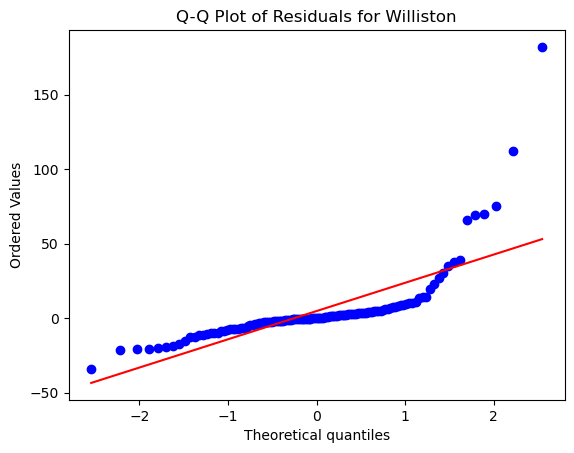

Michigan
Number of data points:  150
Number of samples in the training dataset: 112
Best parameters: {'C': 5, 'epsilon': 0.01, 'kernel': 'sigmoid'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 338.1750457756233
MSE of the model: 184.27216781246452
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 13.574688497805926
MAE of the best SVR model: 10.528028068459482
-------------------------------
R-squared (Coefficient of Determination): 0.4550982690345291
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  5.263157894736842
±15%:  18.421052631578945
±25%:  23.684210526315788
±50%:  76.31578947368422
-------------------------------
Minimum percentage difference: 0.88%
Maximum percentage difference: 1102.91%
-------------------------------
Quant

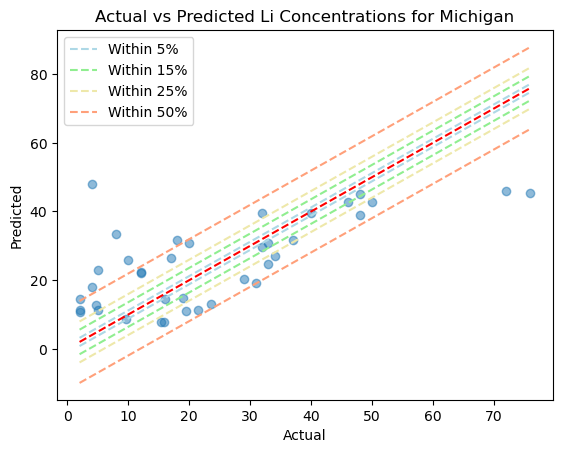

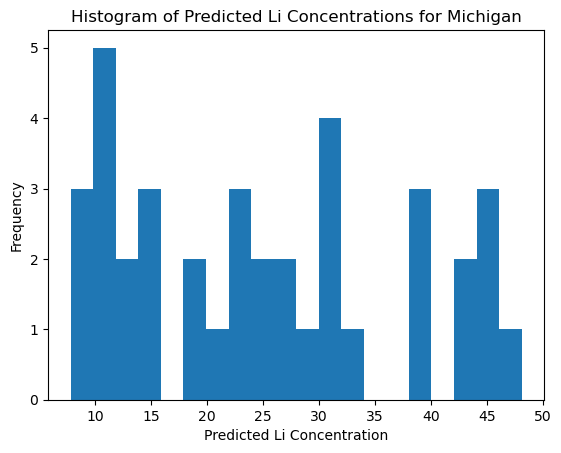

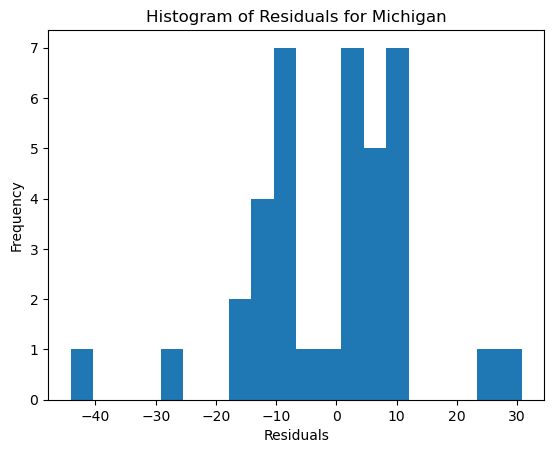

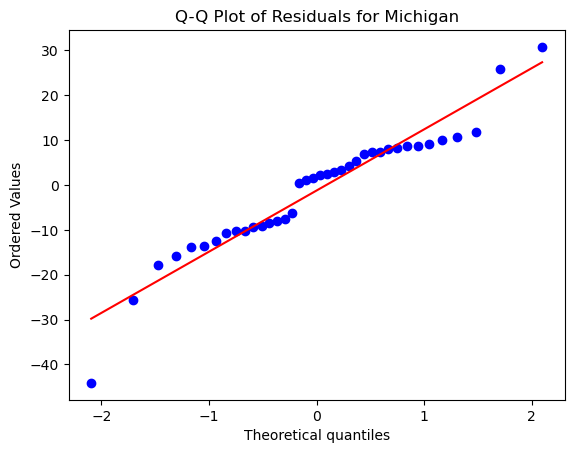

Pacific
Number of data points:  145
Number of samples in the training dataset: 108
Best parameters: {'C': 50, 'epsilon': 0.05, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 8.383484514243975
MSE of the model: 3.004972078561876
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 1.733485528800825
MAE of the best SVR model: 0.8931211147745718
-------------------------------
R-squared (Coefficient of Determination): 0.6415604903359369
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  18.91891891891892
±15%:  40.54054054054054
±25%:  62.16216216216216
±50%:  83.78378378378379
-------------------------------
Minimum percentage difference: 1.78%
Maximum percentage difference: 3952.91%
-------------------------------
Quantile regr

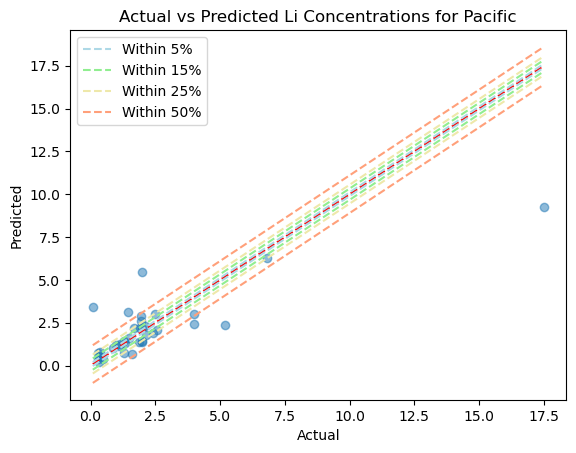

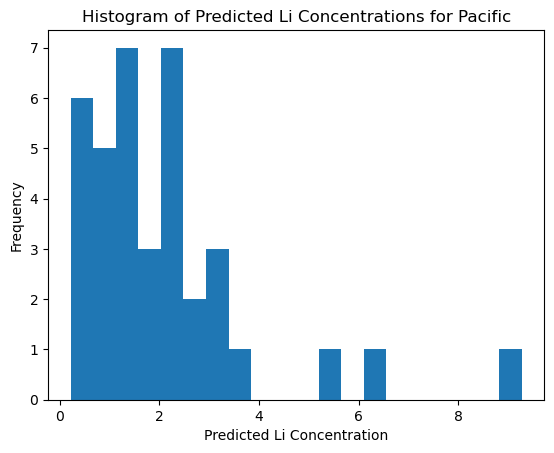

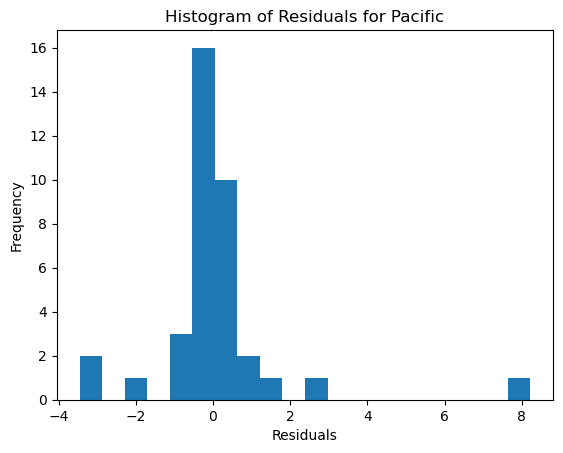

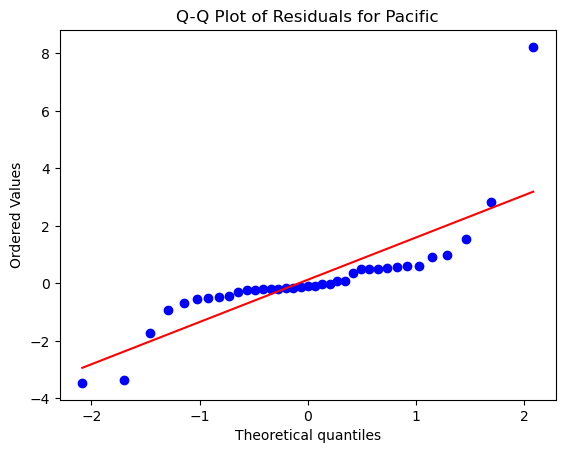

Illinois
Number of data points:  25
Number of samples in the training dataset: 18
Best parameters: {'C': 10, 'epsilon': 0.01, 'kernel': 'sigmoid'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 155.8923551020408
MSE of the model: 167.0564126966751
The model's MSE is close to or larger than the variance of the target variable.
The model's performance may be limited compared to the variability of the target variable.
RMSE of the model: 12.925030471789036
MAE of the best SVR model: 9.816166495311952
-------------------------------
R-squared (Coefficient of Determination): -0.07161388759138787
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  0.0
±15%:  14.285714285714285
±25%:  14.285714285714285
±50%:  57.14285714285714
-------------------------------
Minimum percentage difference: 9.61%
Maximum percentage difference: 381.85%
-------------------------------
Quantil

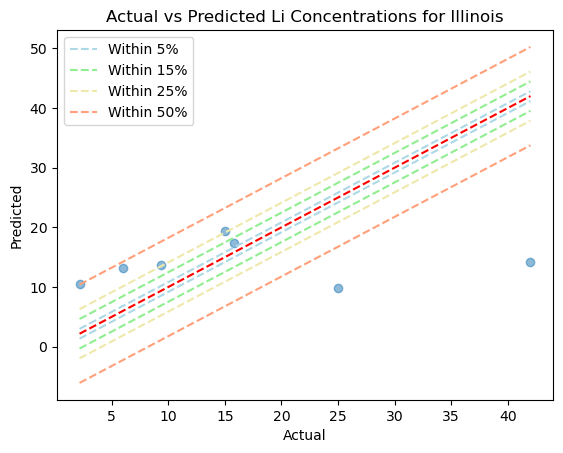

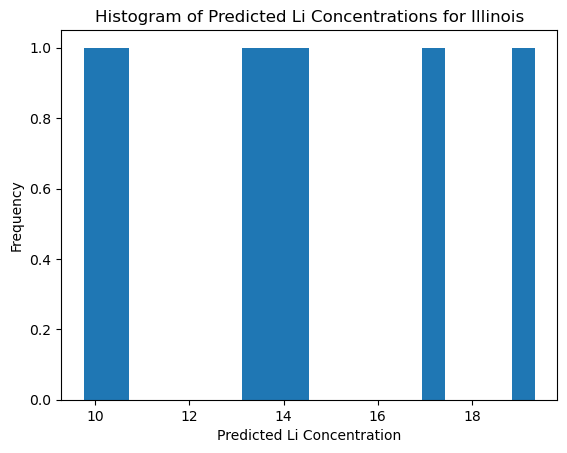

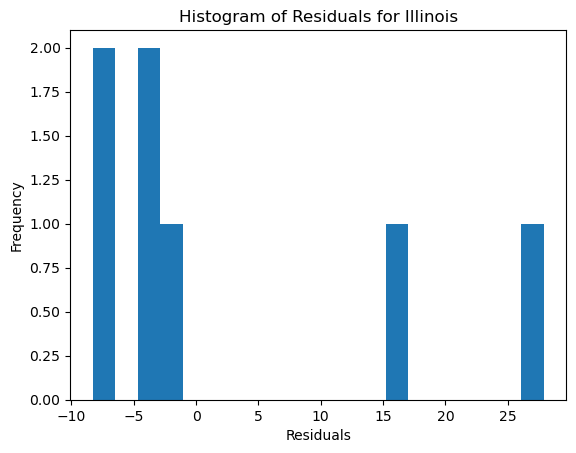

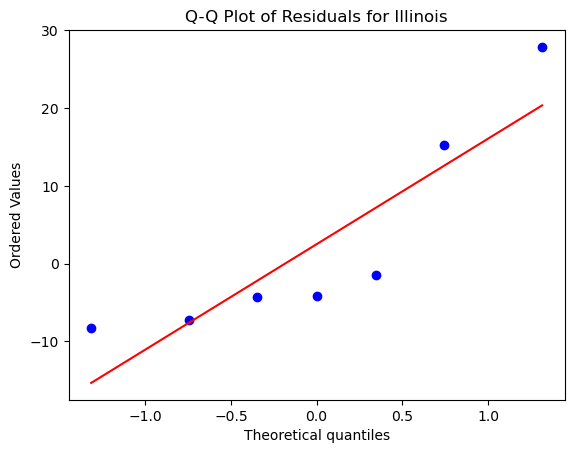

Great Plains
Number of data points:  62
Number of samples in the training dataset: 46
Best parameters: {'C': 50, 'epsilon': 0.1, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 30765.013448437494
MSE of the model: 32504.44769155123
The model's MSE is close to or larger than the variance of the target variable.
The model's performance may be limited compared to the variability of the target variable.
RMSE of the model: 180.28989902806876
MAE of the best SVR model: 47.13339523835176
-------------------------------
R-squared (Coefficient of Determination): -0.05653936235162216
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  56.25
±15%:  93.75
±25%:  93.75
±50%:  93.75
-------------------------------
Minimum percentage difference: 1.74%
Maximum percentage difference: 185.73%
-------------------------------
Quantile regression loss:
Quantile 0.25: 0.

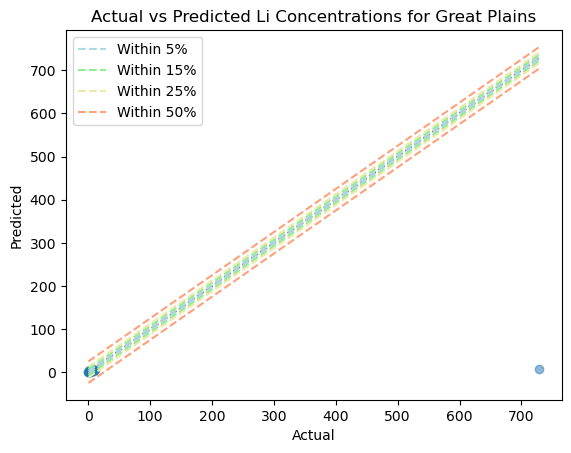

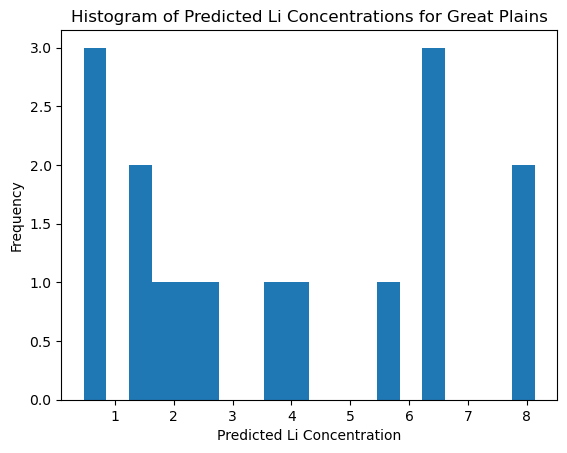

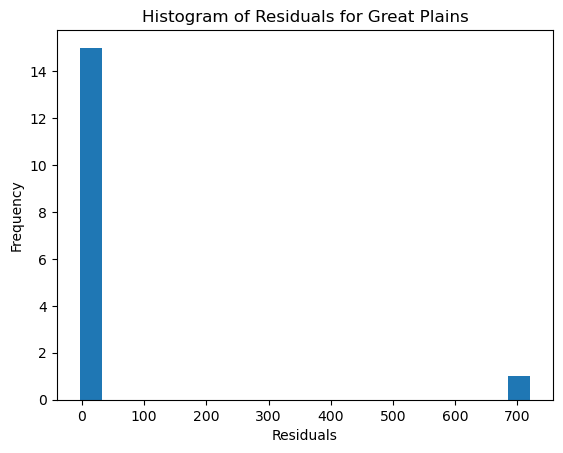

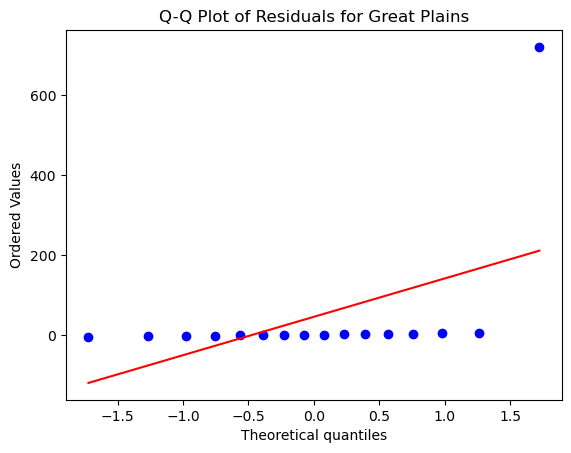

Anadarko
Number of data points:  262
Number of samples in the training dataset: 196
Best parameters: {'C': 50, 'epsilon': 0.2, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 8090.751883310373
MSE of the model: 5017.563201052185
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 70.83475983620036
MAE of the best SVR model: 18.430170816574872
-------------------------------
R-squared (Coefficient of Determination): 0.37983968938629453
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  37.878787878787875
±15%:  65.15151515151516
±25%:  72.72727272727273
±50%:  80.3030303030303
-------------------------------
Minimum percentage difference: 1.33%
Maximum percentage difference: 972.92%
-------------------------------
Quantile regr

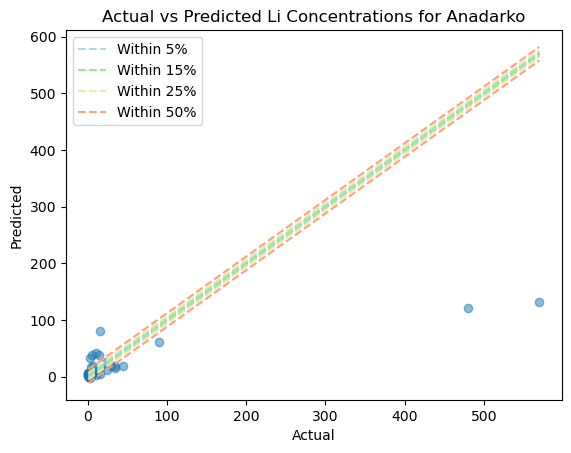

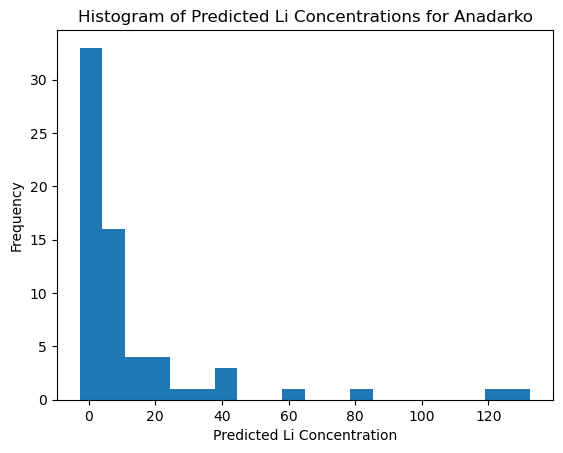

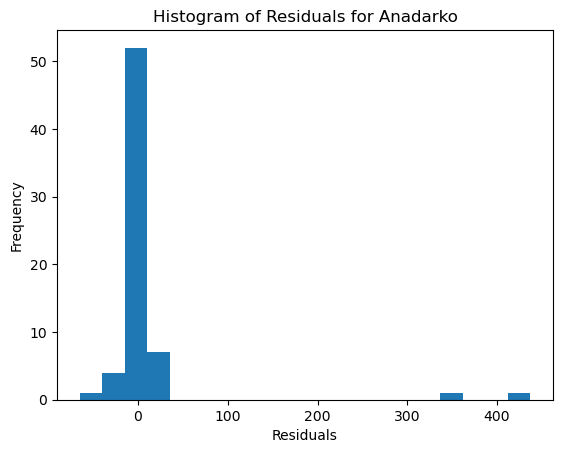

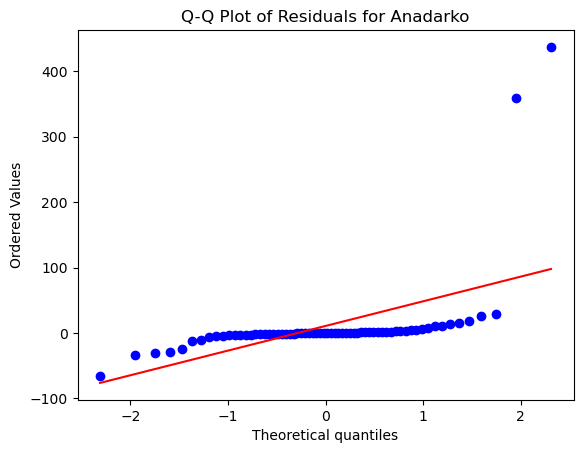

Rocky Mountain
Number of data points:  693
Number of samples in the training dataset: 519
Best parameters: {'C': 50, 'epsilon': 0.01, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 175.57252920134746
MSE of the model: 46.31649379677139
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 6.805622219663047
MAE of the best SVR model: 2.980864252287261
-------------------------------
R-squared (Coefficient of Determination): 0.7361973766200329
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  11.494252873563218
±15%:  40.804597701149426
±25%:  60.3448275862069
±50%:  81.60919540229885
-------------------------------
Minimum percentage difference: 0.03%
Maximum percentage difference: 1956.09%
-------------------------------
Quant

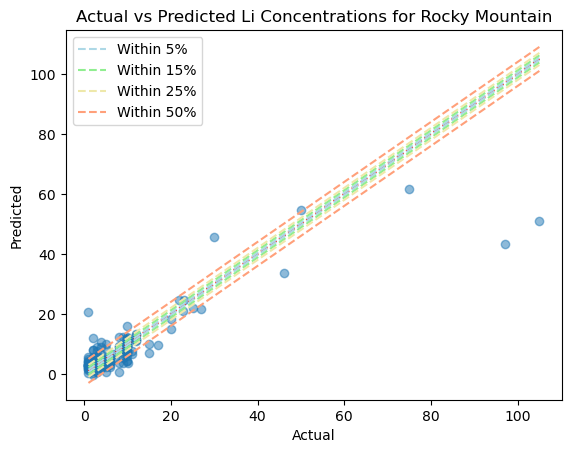

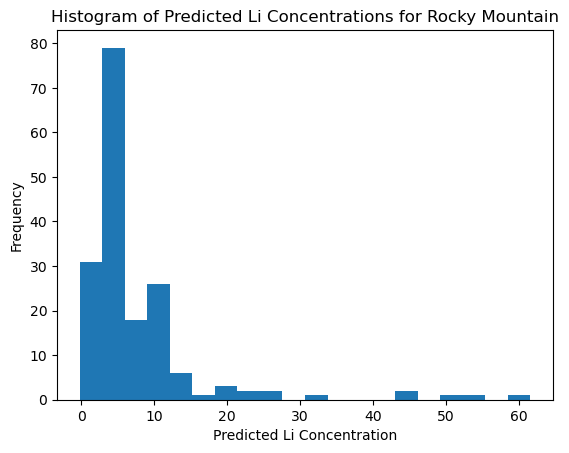

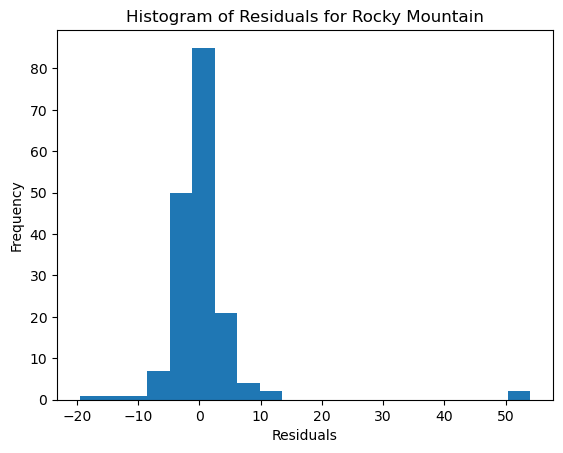

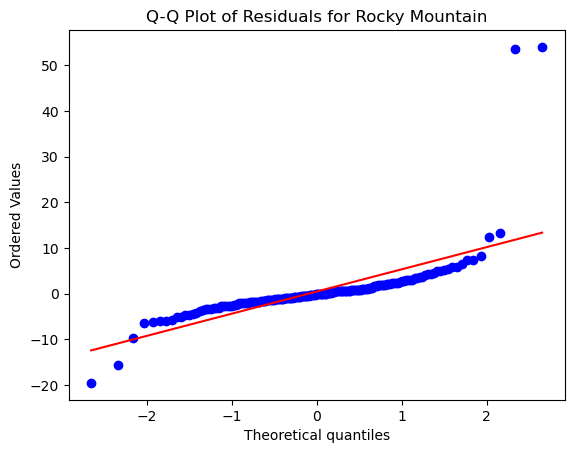

Fort Worth
Number of data points:  17
Number of samples in the training dataset: 12
Best parameters: {'C': 50, 'epsilon': 0.1, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 1038.8281839999997
MSE of the model: 930.6725126177774
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 30.50692565005162
MAE of the best SVR model: 17.006338404117166
-------------------------------
R-squared (Coefficient of Determination): 0.10411314695541829
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  0.0
±15%:  40.0
±25%:  60.0
±50%:  60.0
-------------------------------
Minimum percentage difference: 61.26%
Maximum percentage difference: 351.11%
-------------------------------
Quantile regression loss:
Quantile 0.25: 1.7432049311700024
Quan

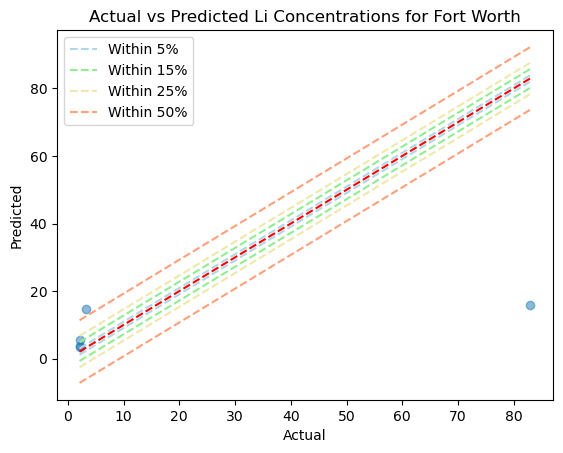

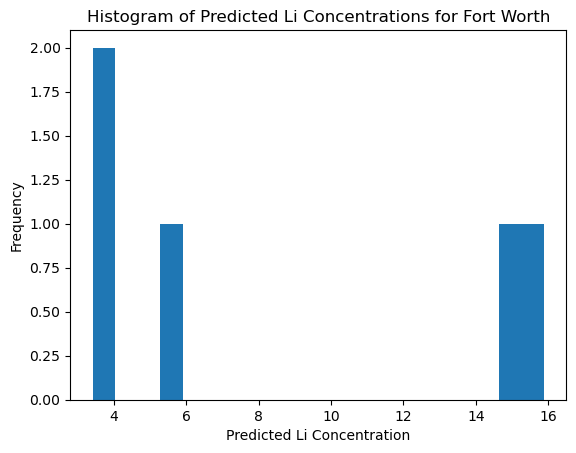

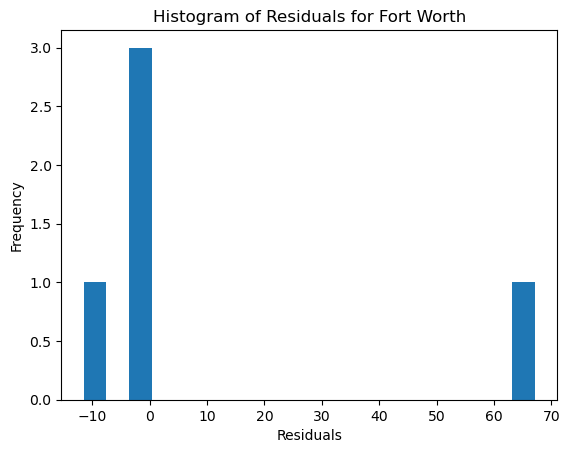

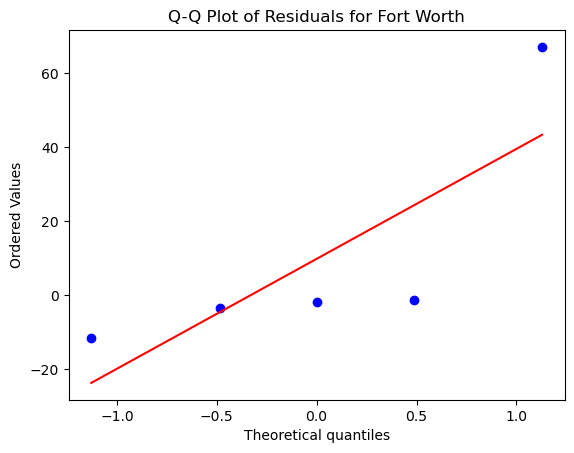

,round,basin,data_row_count,feature_quantity,feature_list,kernel_options,best_kernel,c_options,best_c,epsilon_options,...,within_5_percent,within_15_percent,within_25_percent,within_50_percent,results_min%_difference,results_max%_difference,0.25_quantile_loss,0.5_quantile_loss,0.75_quantile_loss,cross_val_mse
8,03_pca,Great Plains,62,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[0.1, 0.5, 1, 5, 10, 50]",50,"[0.01, 0.05, 0.1, 0.2]",...,56.25,93.75,93.75,93.75,1.74,185.73,0.61,2.38,3.72,5.69
3,03_pca,Gulf Coast,888,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[0.1, 0.5, 1, 5, 10, 50]",50,"[0.01, 0.05, 0.1, 0.2]",...,50.45,72.07,78.83,91.44,0.78,1538.96,0.93,2.67,10.61,4752.45
9,03_pca,Anadarko,262,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[0.1, 0.5, 1, 5, 10, 50]",50,"[0.01, 0.05, 0.1, 0.2]",...,37.88,65.15,72.73,80.30,1.33,972.92,0.74,1.69,7.26,8553.25
0,03_pca,Appalachian,652,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[0.1, 0.5, 1, 5, 10, 50]",50,"[0.01, 0.05, 0.1, 0.2]",...,26.99,59.51,69.94,82.82,0.28,4922.94,3.19,7.27,19.93,3156.63
4,03_pca,Williston,502,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[0.1, 0.5, 1, 5, 10, 50]",50,"[0.01, 0.05, 0.1, 0.2]",...,22.22,52.38,65.87,83.33,0.60,28384.84,1.94,4.35,10.35,2180.13
1,03_pca,Permian,481,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",sigmoid,"[0.1, 0.5, 1, 5, 10, 50]",5,"[0.01, 0.05, 0.1, 0.2]",...,15.70,46.28,63.64,81.82,0.51,1000.66,1.91,3.72,7.98,964.51
10,03_pca,Rocky Mountain,693,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[0.1, 0.5, 1, 5, 10, 50]",50,"[0.01, 0.05, 0.1, 0.2]",...,11.49,40.80,60.34,81.61,0.03,1956.09,0.71,1.66,3.07,76.47
6,03_pca,Pacific,145,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[0.1, 0.5, 1, 5, 10, 50]",50,"[0.01, 0.05, 0.1, 0.2]",...,18.92,40.54,62.16,83.78,1.78,3952.91,0.19,0.49,0.68,2.06
11,03_pca,Fort Worth,17,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[0.1, 0.5, 1, 5, 10, 50]",50,"[0.01, 0.05, 0.1, 0.2]",...,0.00,40.00,60.00,60.00,61.26,351.11,1.74,3.42,11.45,78.26
2,03_pca,Oklahoma Platform,254,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[0.1, 0.5, 1, 5, 10, 50]",50,"[0.01, 0.05, 0.1, 0.2]",...,12.50,23.44,39.06,67.19,5.11,330.54,3.64,7.75,13.84,133.90


In [48]:
# Define all the variables...
round = '03_pca'
test_size = 0.25
random_state = 42
kernel_values = ['rbf', 'poly', 'sigmoid']
c_values = [0.1, 0.5, 1, 5, 10, 50]
epsilon_values = [0.01, 0.05, 0.1, 0.2]

# Run the function...
df_round03_pca = generate_svr_models_by_basin(df=df, round=round, basins=basins, categorical_columns=categorical_columns, 
                                              test_size=test_size, random_state=random_state, kernel_values=kernel_values, 
                                              c_values=c_values, epsilon_values=epsilon_values)
df_round03_pca

#### ROUND 4

Appalachian
Number of data points:  652
Number of samples in the training dataset: 489
Best parameters: {'C': 5, 'epsilon': 0.1, 'kernel': 'sigmoid'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 3942.0189754375397
MSE of the model: 2457.2665919878727
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 49.570823999484546
MAE of the best SVR model: 29.87857380004202
-------------------------------
R-squared (Coefficient of Determination): 0.37664770075970233
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  11.65644171779141
±15%:  26.993865030674847
±25%:  42.331288343558285
±50%:  74.23312883435584
-------------------------------
Minimum percentage difference: 0.28%
Maximum percentage difference: 3830.20%
-------------------------------
Qu

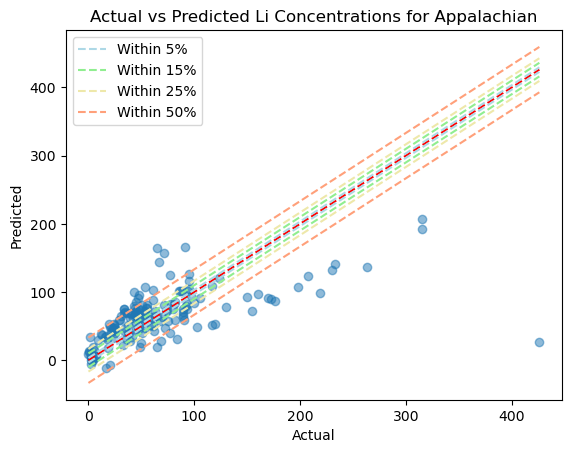

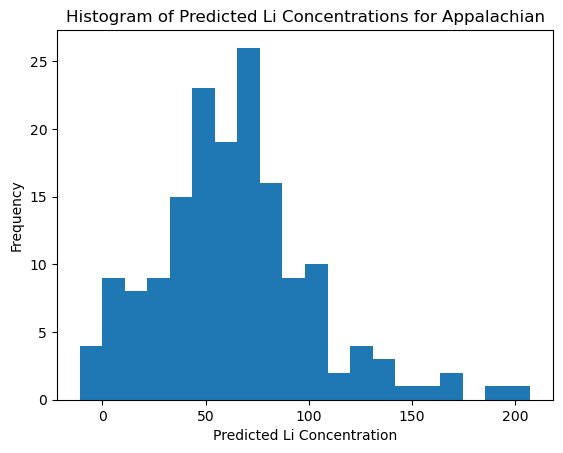

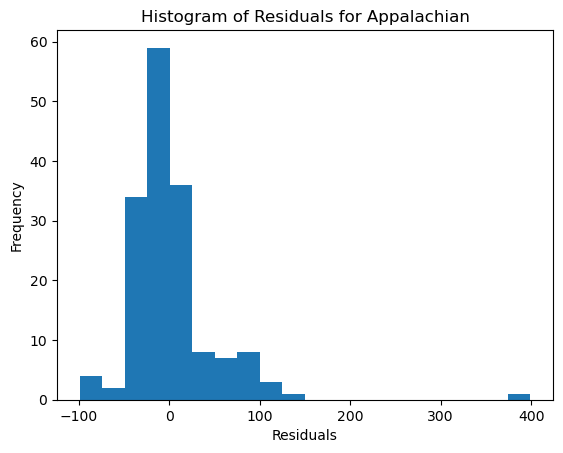

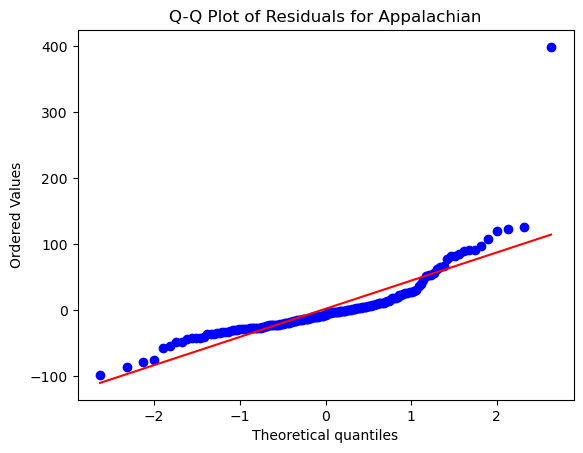

Permian
Number of data points:  481
Number of samples in the training dataset: 360
Best parameters: {'C': 5, 'epsilon': 0.01, 'kernel': 'sigmoid'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 4106.050815531726
MSE of the model: 4041.8479053474366
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 63.57552913934289
MAE of the best SVR model: 13.943078157483136
-------------------------------
R-squared (Coefficient of Determination): 0.015636170390642357
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  16.528925619834713
±15%:  46.28099173553719
±25%:  61.98347107438017
±50%:  80.99173553719008
-------------------------------
Minimum percentage difference: 0.13%
Maximum percentage difference: 1007.61%
-------------------------------
Quanti

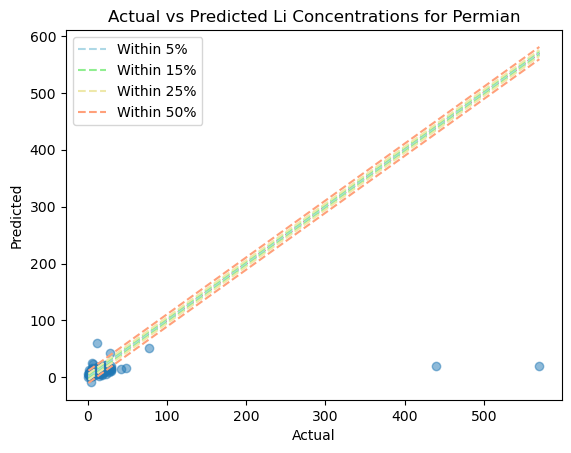

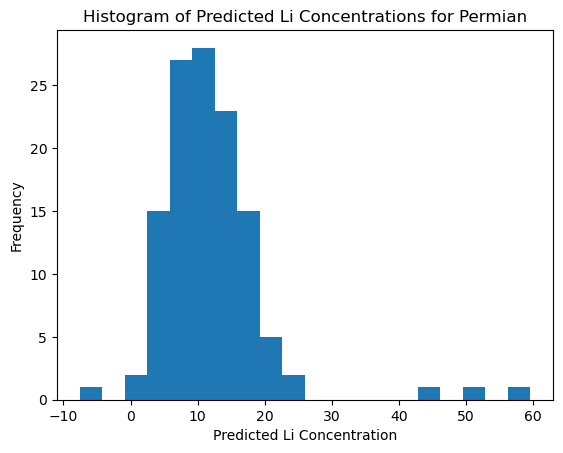

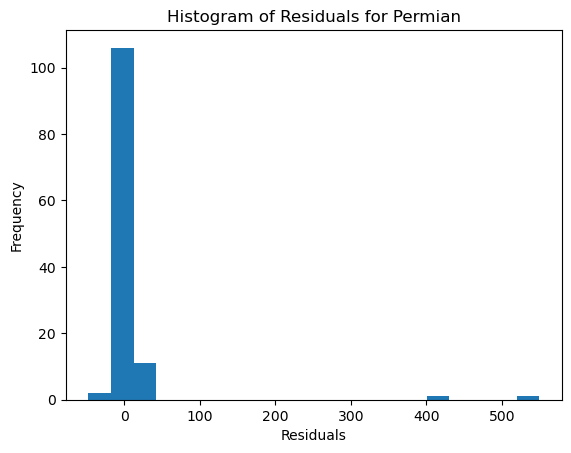

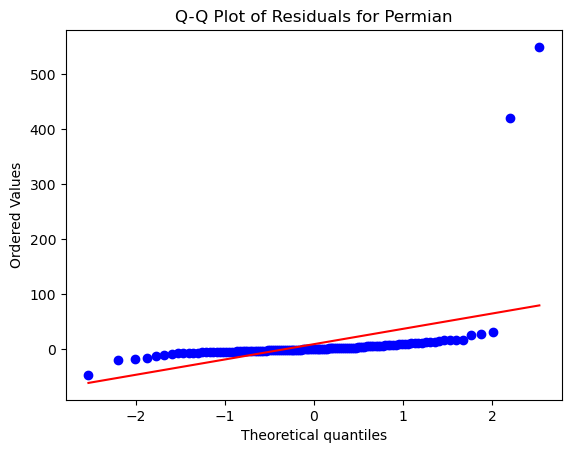

Oklahoma Platform
Number of data points:  254
Number of samples in the training dataset: 190
Best parameters: {'C': 10, 'epsilon': 0.01, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 308.3989183593751
MSE of the model: 218.38749316353687
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 14.777939408575774
MAE of the best SVR model: 9.979435078059595
-------------------------------
R-squared (Coefficient of Determination): 0.2918668641079618
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  14.0625
±15%:  35.9375
±25%:  46.875
±50%:  67.1875
-------------------------------
Minimum percentage difference: 0.73%
Maximum percentage difference: 241.37%
-------------------------------
Quantile regression loss:
Quantile 0.25: 2.6

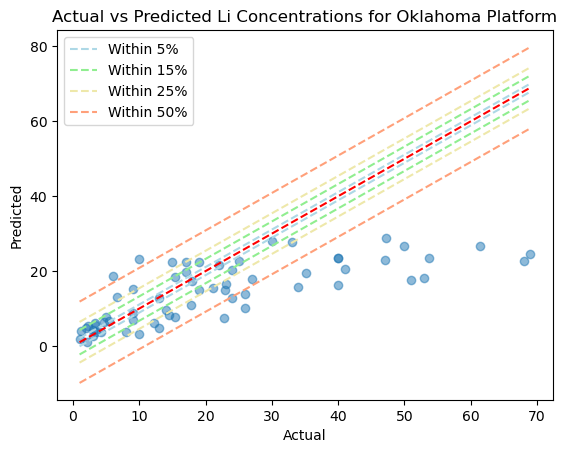

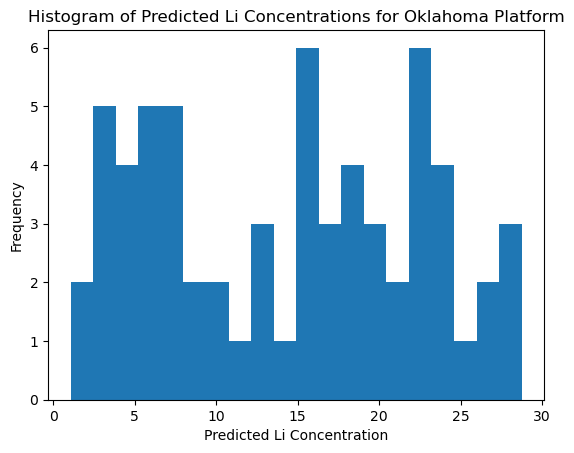

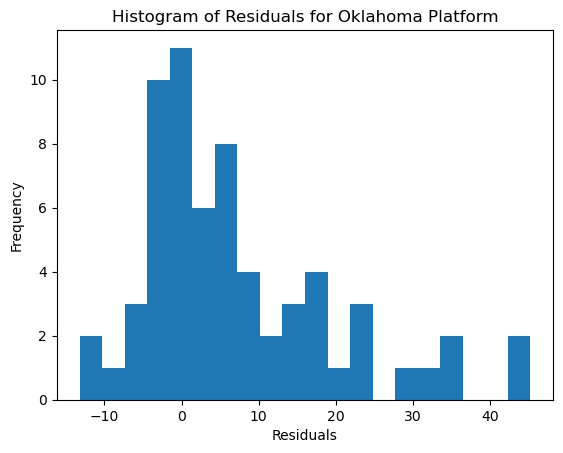

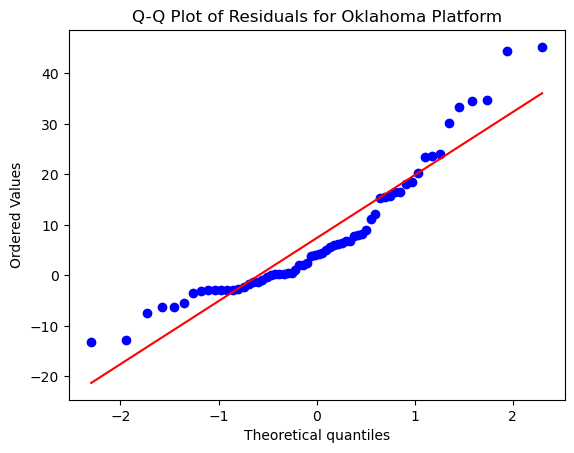

Gulf Coast
Number of data points:  888
Number of samples in the training dataset: 666
Best parameters: {'C': 1, 'epsilon': 0.1, 'kernel': 'poly'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 19313.61518772352
MSE of the model: 13093.411796819786
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 114.42644710389196
MAE of the best SVR model: 25.42877412643213
-------------------------------
R-squared (Coefficient of Determination): 0.3220631316532361
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  29.72972972972973
±15%:  64.41441441441441
±25%:  68.46846846846847
±50%:  79.72972972972973
-------------------------------
Minimum percentage difference: 0.28%
Maximum percentage difference: 840.68%
-------------------------------
Quantile re

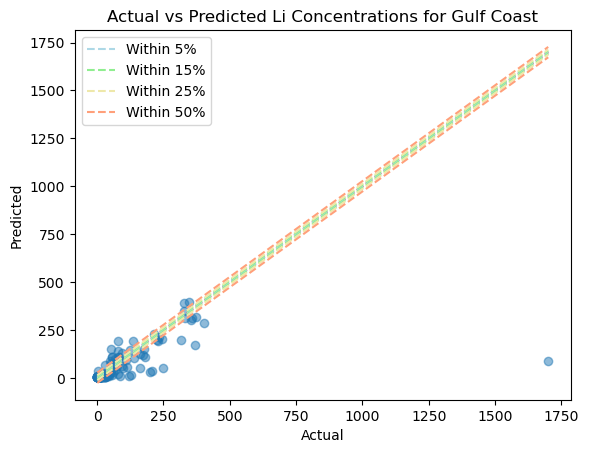

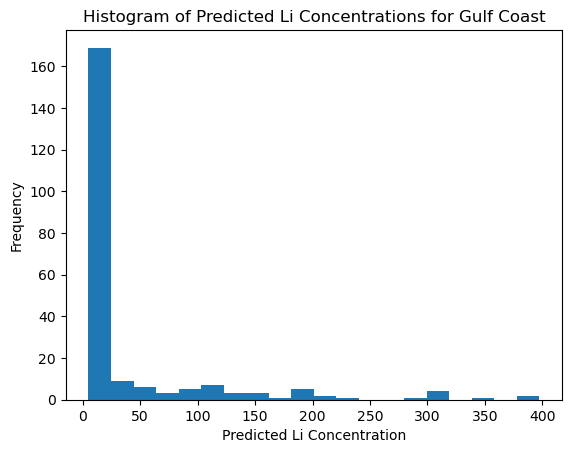

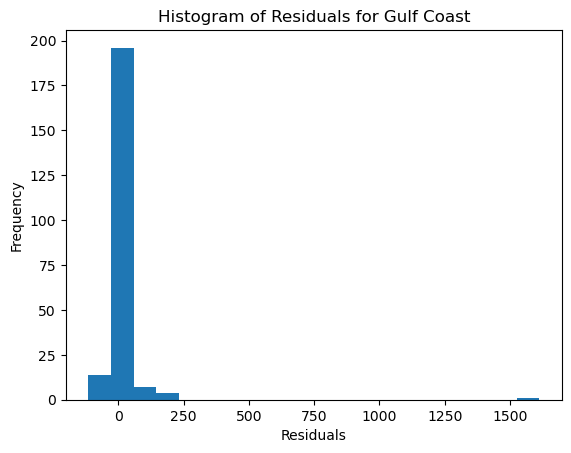

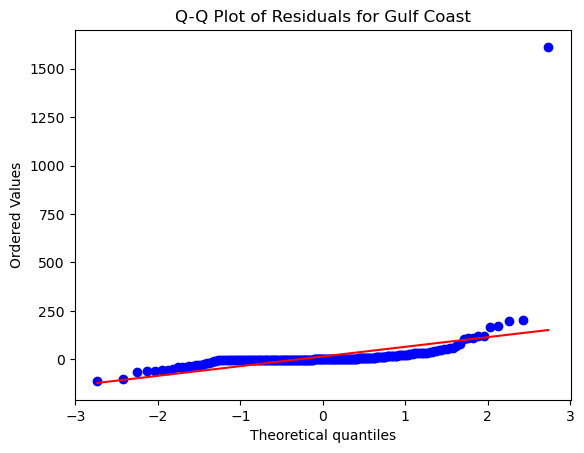

Williston
Number of data points:  502
Number of samples in the training dataset: 376
Best parameters: {'C': 10, 'epsilon': 0.1, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 2013.4464867274216
MSE of the model: 1028.214773990817
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 32.06578821720771
MAE of the best SVR model: 15.01881124591174
-------------------------------
R-squared (Coefficient of Determination): 0.48932599859555337
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  15.873015873015872
±15%:  40.476190476190474
±25%:  55.55555555555556
±50%:  78.57142857142857
-------------------------------
Minimum percentage difference: 0.27%
Maximum percentage difference: 132751.12%
-------------------------------
Quantil

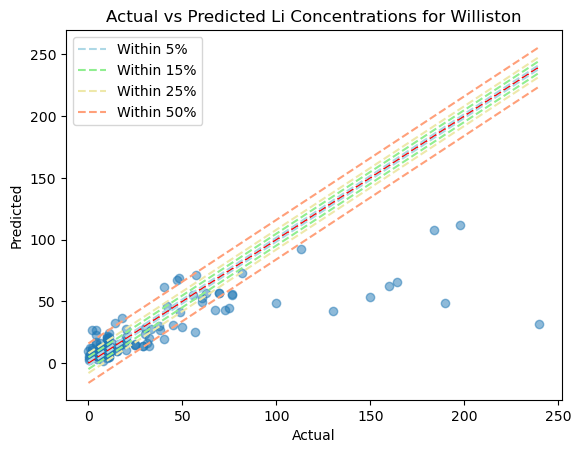

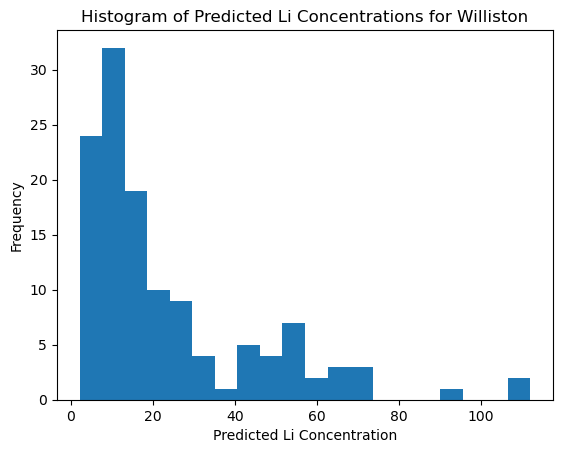

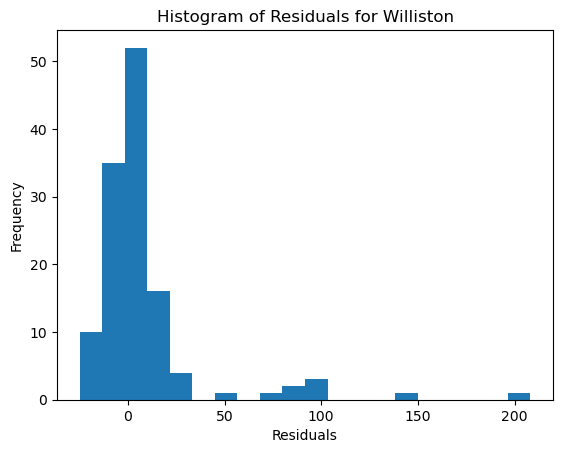

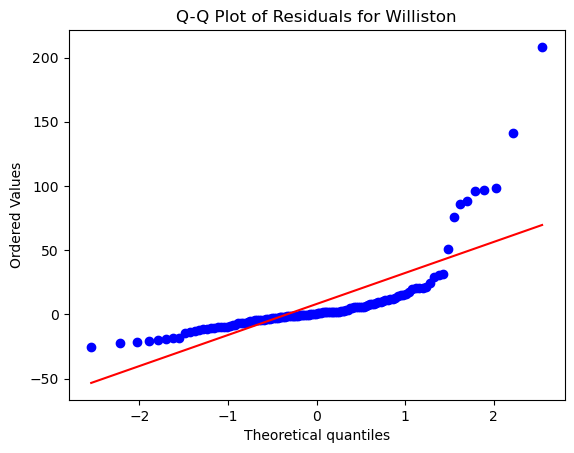

Michigan
Number of data points:  150
Number of samples in the training dataset: 112
Best parameters: {'C': 5, 'epsilon': 0.01, 'kernel': 'sigmoid'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 338.1750457756233
MSE of the model: 184.27216781246452
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 13.574688497805926
MAE of the best SVR model: 10.528028068459482
-------------------------------
R-squared (Coefficient of Determination): 0.4550982690345291
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  5.263157894736842
±15%:  18.421052631578945
±25%:  23.684210526315788
±50%:  76.31578947368422
-------------------------------
Minimum percentage difference: 0.88%
Maximum percentage difference: 1102.91%
-------------------------------
Quant

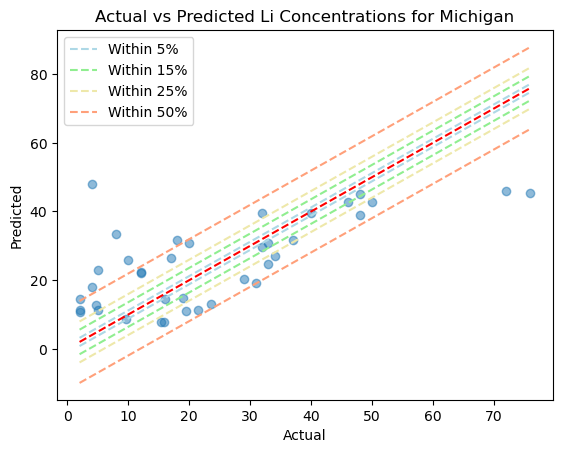

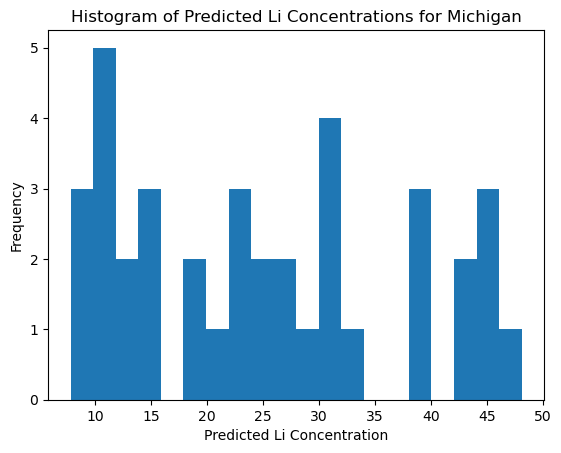

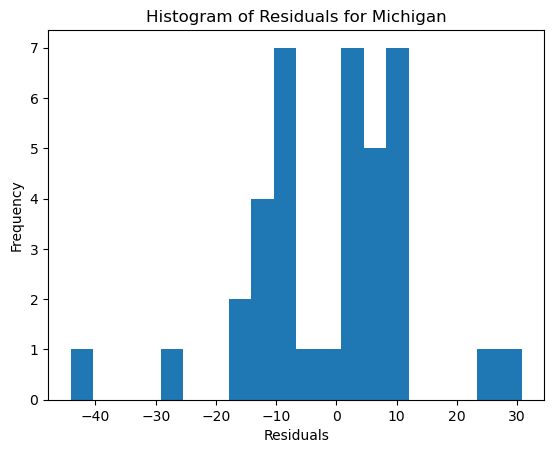

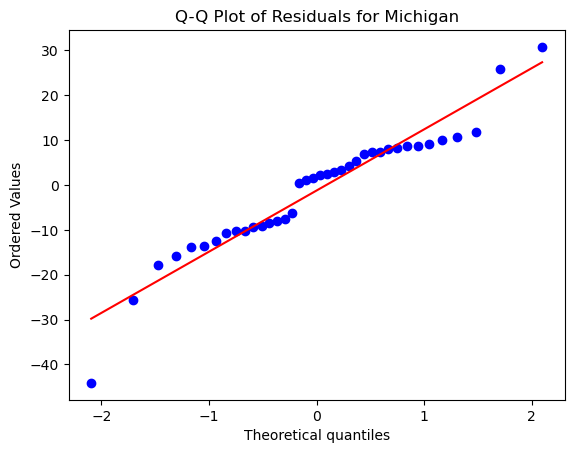

Pacific
Number of data points:  145
Number of samples in the training dataset: 108
Best parameters: {'C': 10, 'epsilon': 0.1, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 8.383484514243975
MSE of the model: 3.6085969297606537
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 1.89963073510634
MAE of the best SVR model: 1.032783791065885
-------------------------------
R-squared (Coefficient of Determination): 0.5695588244208645
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  13.513513513513514
±15%:  29.72972972972973
±25%:  48.64864864864865
±50%:  72.97297297297297
-------------------------------
Minimum percentage difference: 0.13%
Maximum percentage difference: 4600.56%
-------------------------------
Quantile regre

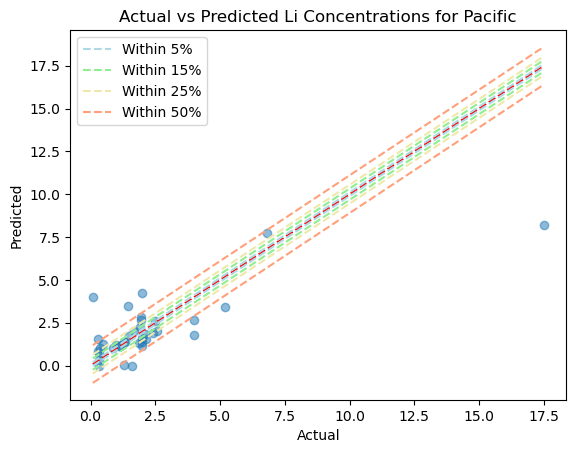

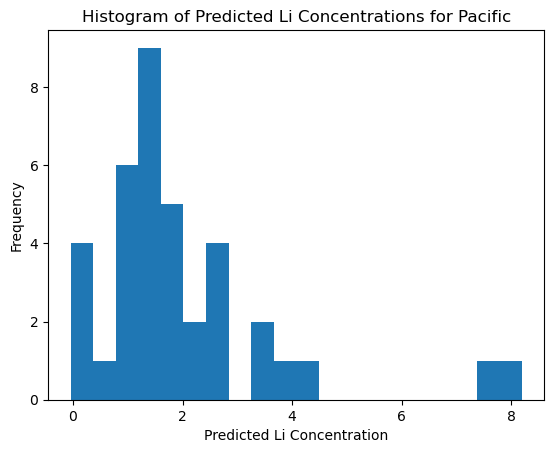

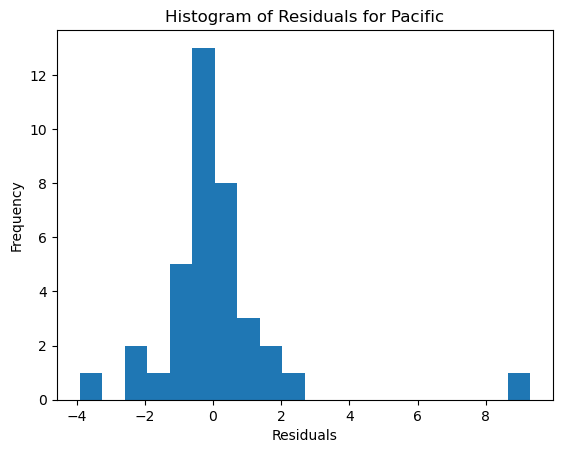

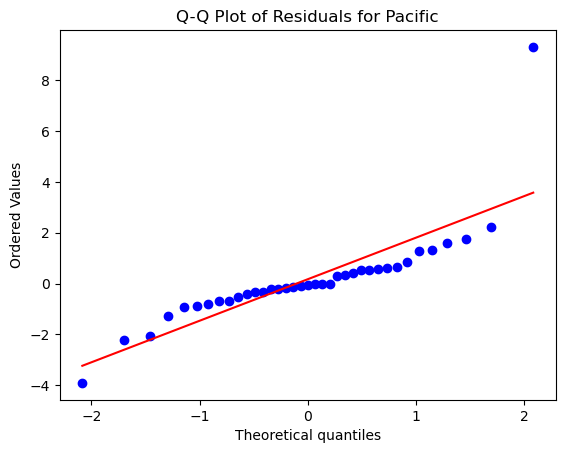

Illinois
Number of data points:  25
Number of samples in the training dataset: 18
Best parameters: {'C': 10, 'epsilon': 0.01, 'kernel': 'sigmoid'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 155.8923551020408
MSE of the model: 167.0564126966751
The model's MSE is close to or larger than the variance of the target variable.
The model's performance may be limited compared to the variability of the target variable.
RMSE of the model: 12.925030471789036
MAE of the best SVR model: 9.816166495311952
-------------------------------
R-squared (Coefficient of Determination): -0.07161388759138787
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  0.0
±15%:  14.285714285714285
±25%:  14.285714285714285
±50%:  57.14285714285714
-------------------------------
Minimum percentage difference: 9.61%
Maximum percentage difference: 381.85%
-------------------------------
Quantil

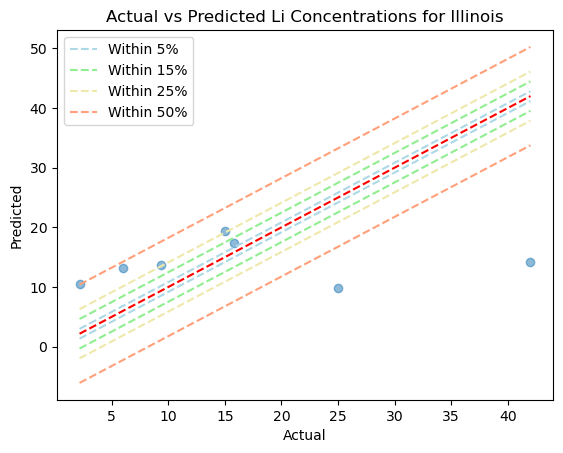

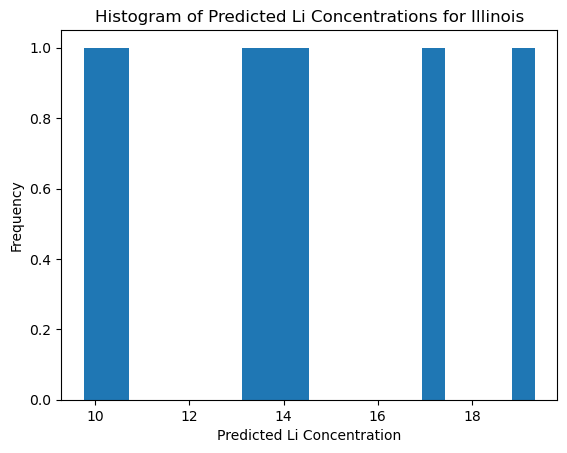

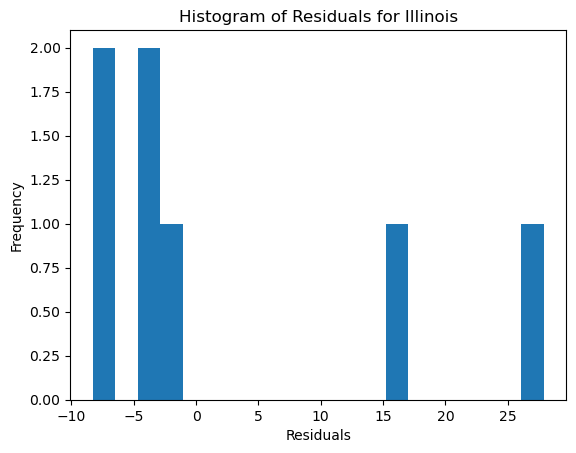

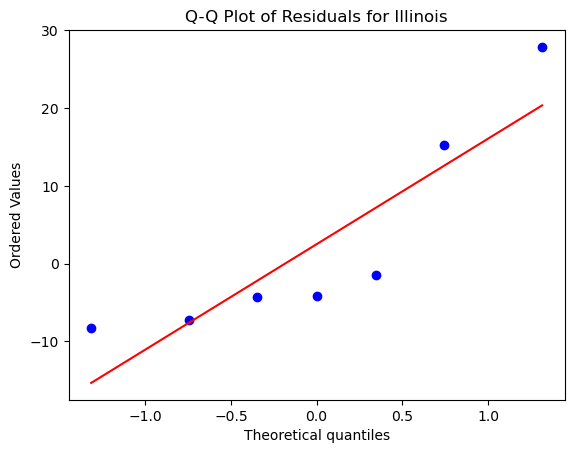

Great Plains
Number of data points:  62
Number of samples in the training dataset: 46
Best parameters: {'C': 10, 'epsilon': 0.1, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 30765.013448437494
MSE of the model: 32569.181059910934
The model's MSE is close to or larger than the variance of the target variable.
The model's performance may be limited compared to the variability of the target variable.
RMSE of the model: 180.46933551135754
MAE of the best SVR model: 47.08830066617765
-------------------------------
R-squared (Coefficient of Determination): -0.058643485220549074
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  62.5
±15%:  93.75
±25%:  93.75
±50%:  93.75
-------------------------------
Minimum percentage difference: 0.29%
Maximum percentage difference: 216.69%
-------------------------------
Quantile regression loss:
Quantile 0.25: 0

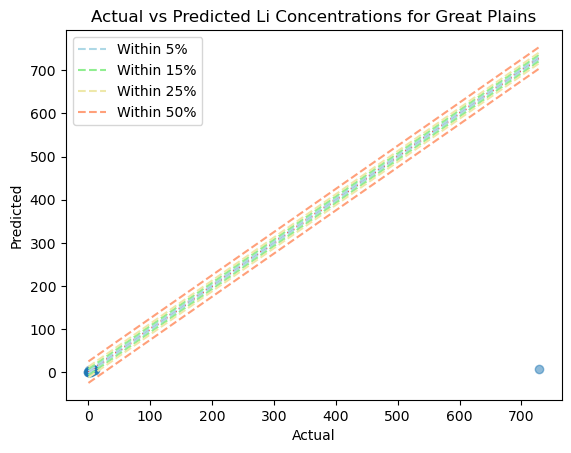

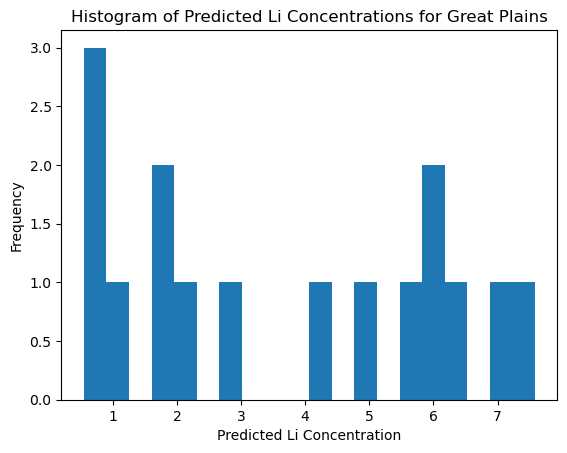

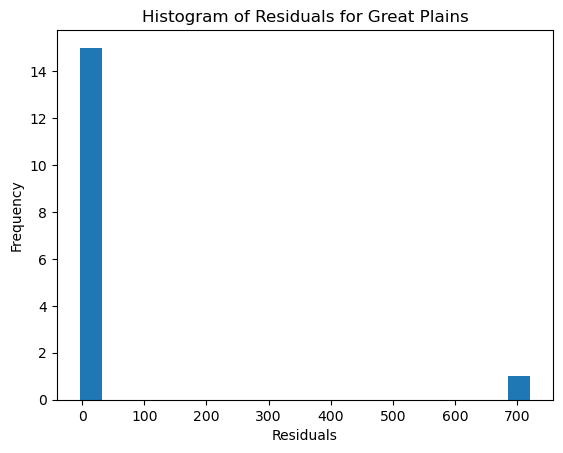

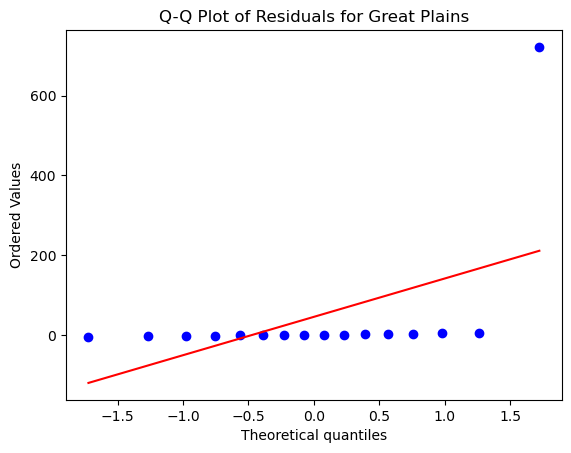

Anadarko
Number of data points:  262
Number of samples in the training dataset: 196
Best parameters: {'C': 0.1, 'epsilon': 0.1, 'kernel': 'poly'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 8090.751883310373
MSE of the model: 6079.058780347259
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 77.96831908119643
MAE of the best SVR model: 18.608573474549456
-------------------------------
R-squared (Coefficient of Determination): 0.24864105734262376
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  40.909090909090914
±15%:  74.24242424242425
±25%:  74.24242424242425
±50%:  84.84848484848484
-------------------------------
Minimum percentage difference: 0.14%
Maximum percentage difference: 240.72%
-------------------------------
Quantile r

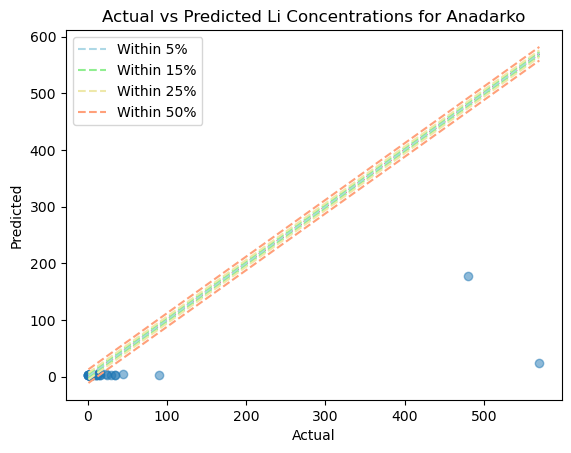

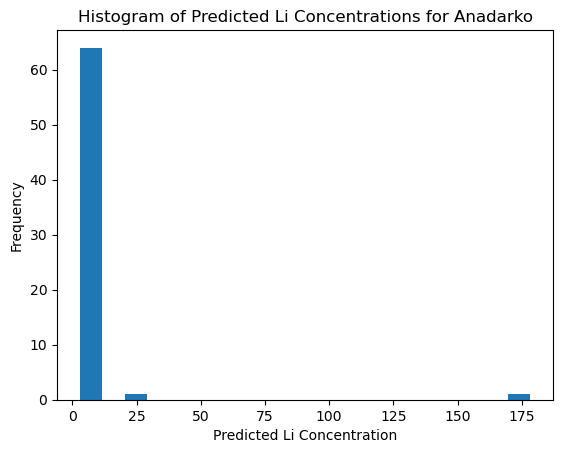

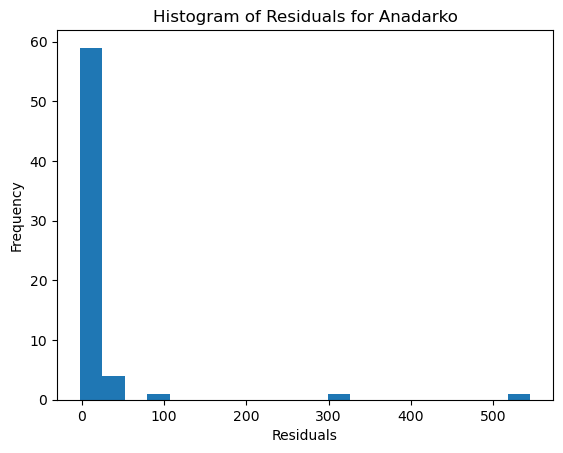

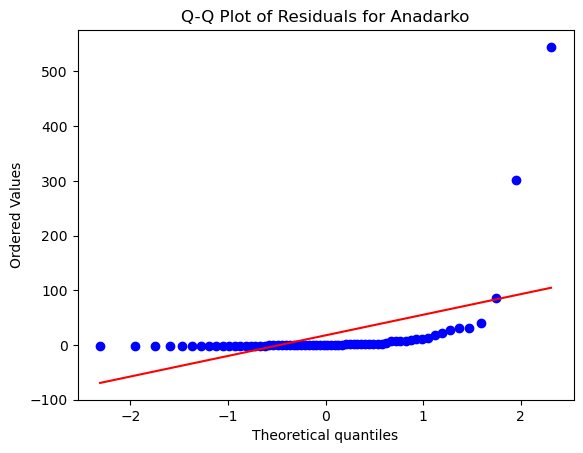

Rocky Mountain
Number of data points:  693
Number of samples in the training dataset: 519
Best parameters: {'C': 10, 'epsilon': 0.05, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 175.57252920134746
MSE of the model: 75.5545825720108
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 8.692213905099829
MAE of the best SVR model: 3.3341418704418766
-------------------------------
R-squared (Coefficient of Determination): 0.569667402322579
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  13.793103448275861
±15%:  33.90804597701149
±25%:  60.3448275862069
±50%:  83.9080459770115
-------------------------------
Minimum percentage difference: 0.32%
Maximum percentage difference: 1080.20%
-------------------------------
Quantile

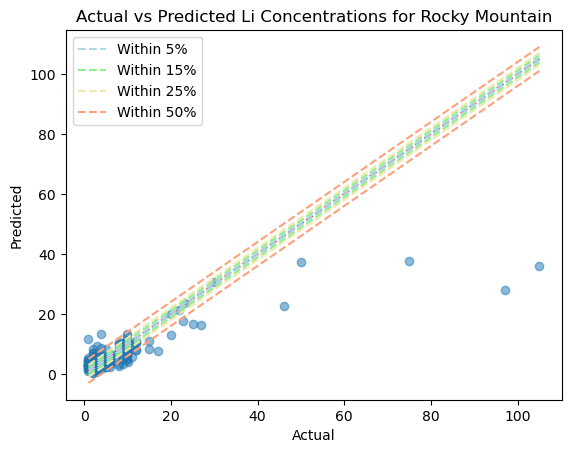

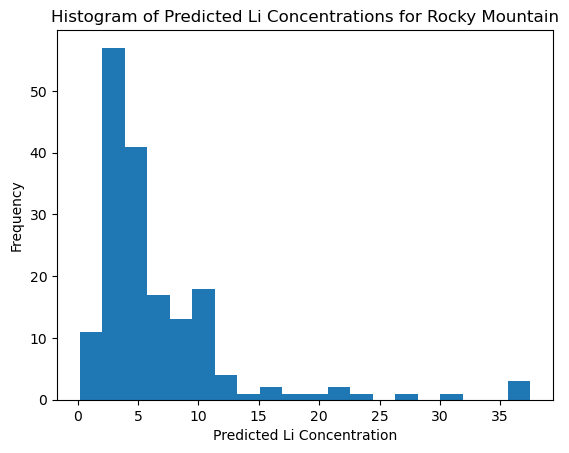

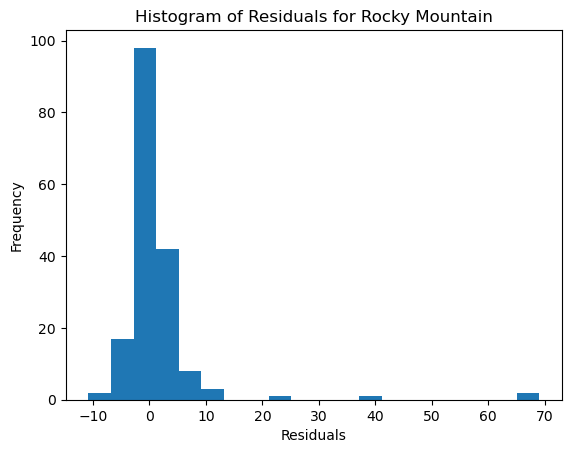

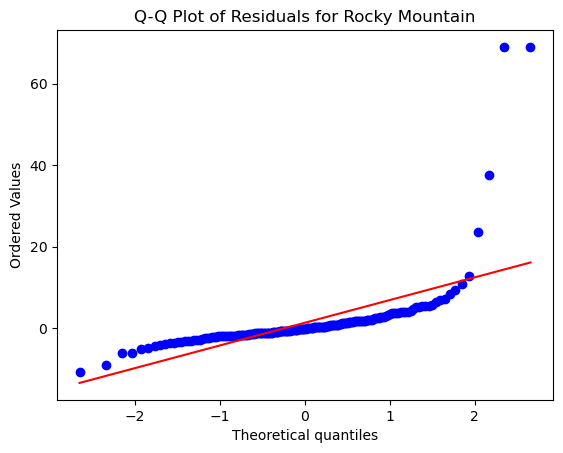

Fort Worth
Number of data points:  17
Number of samples in the training dataset: 12
Best parameters: {'C': 10, 'epsilon': 0.1, 'kernel': 'sigmoid'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 1038.8281839999997
MSE of the model: 673.5716350891377
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 25.953258660313498
MAE of the best SVR model: 14.327035097192498
-------------------------------
R-squared (Coefficient of Determination): 0.351604388999579
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  0.0
±15%:  40.0
±25%:  60.0
±50%:  80.0
-------------------------------
Minimum percentage difference: 52.74%
Maximum percentage difference: 191.71%
-------------------------------
Quantile regression loss:
Quantile 0.25: 2.6976072017885064
Q

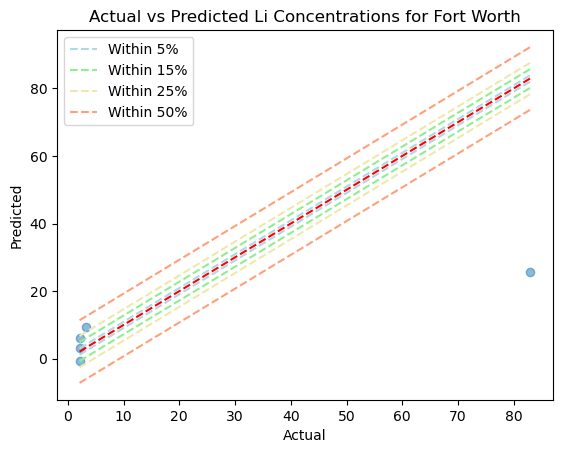

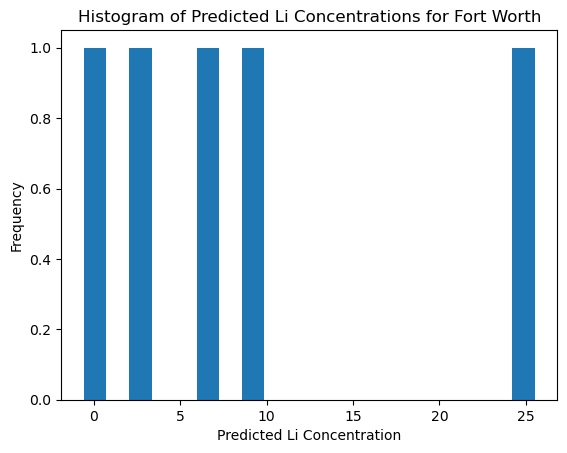

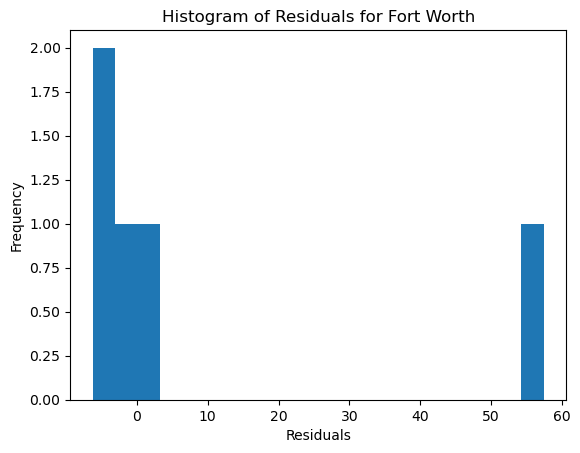

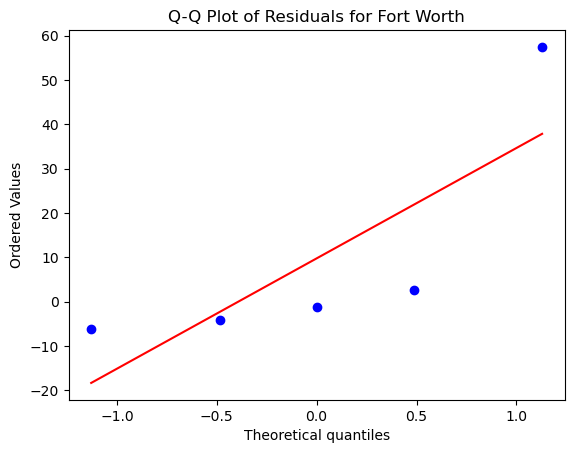

,round,basin,data_row_count,feature_quantity,feature_list,kernel_options,best_kernel,c_options,best_c,epsilon_options,...,within_5_percent,within_15_percent,within_25_percent,within_50_percent,results_min%_difference,results_max%_difference,0.25_quantile_loss,0.5_quantile_loss,0.75_quantile_loss,cross_val_mse
8,04_pca,Great Plains,62,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[0.1, 0.5, 1, 5, 10]",10.0,"[0.01, 0.05, 0.1]",...,62.50,93.75,93.75,93.75,0.29,216.69,0.66,1.90,4.28,5.71
9,04_pca,Anadarko,262,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",poly,"[0.1, 0.5, 1, 5, 10]",0.1,"[0.01, 0.05, 0.1]",...,40.91,74.24,74.24,84.85,0.14,240.72,0.53,1.89,5.52,12574.85
3,04_pca,Gulf Coast,888,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",poly,"[0.1, 0.5, 1, 5, 10]",1.0,"[0.01, 0.05, 0.1]",...,29.73,64.41,68.47,79.73,0.28,840.68,2.36,4.31,21.38,5138.58
1,04_pca,Permian,481,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",sigmoid,"[0.1, 0.5, 1, 5, 10]",5.0,"[0.01, 0.05, 0.1]",...,16.53,46.28,61.98,80.99,0.13,1007.61,1.75,3.54,8.13,963.64
4,04_pca,Williston,502,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[0.1, 0.5, 1, 5, 10]",10.0,"[0.01, 0.05, 0.1]",...,15.87,40.48,55.56,78.57,0.27,132751.12,2.09,6.39,14.20,2771.45
11,04_pca,Fort Worth,17,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",sigmoid,"[0.1, 0.5, 1, 5, 10]",10.0,"[0.01, 0.05, 0.1]",...,0.00,40.00,60.00,80.00,52.74,191.71,2.70,4.08,6.25,66.05
2,04_pca,Oklahoma Platform,254,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[0.1, 0.5, 1, 5, 10]",10.0,"[0.01, 0.05, 0.1]",...,14.06,35.94,46.88,67.19,0.73,241.37,2.66,6.10,15.46,141.59
10,04_pca,Rocky Mountain,693,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[0.1, 0.5, 1, 5, 10]",10.0,"[0.01, 0.05, 0.1]",...,13.79,33.91,60.34,83.91,0.32,1080.20,0.74,1.69,3.15,97.58
6,04_pca,Pacific,145,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[0.1, 0.5, 1, 5, 10]",10.0,"[0.01, 0.05, 0.1]",...,13.51,29.73,48.65,72.97,0.13,4600.56,0.28,0.56,1.28,2.04
0,04_pca,Appalachian,652,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",sigmoid,"[0.1, 0.5, 1, 5, 10]",5.0,"[0.01, 0.05, 0.1]",...,11.66,26.99,42.33,74.23,0.28,3830.20,9.49,20.99,33.69,3596.65


In [49]:
# Define all the variables...
round = '04_pca'
test_size = 0.25
random_state = 42
kernel_values = ['rbf', 'poly', 'sigmoid']
c_values = [0.1, 0.5, 1, 5, 10]
epsilon_values = [0.01, 0.05, 0.1]

# Run the function...
df_round04_pca = generate_svr_models_by_basin(df=df, round=round, basins=basins, categorical_columns=categorical_columns, 
                                              test_size=test_size, random_state=random_state, kernel_values=kernel_values, 
                                              c_values=c_values, epsilon_values=epsilon_values)
df_round04_pca

#### ROUND 5

Appalachian
Number of data points:  652
Number of samples in the training dataset: 391
Best parameters: {'C': 200, 'epsilon': 0.1, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 4226.988241849063
MSE of the model: 2341.661556147171
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 48.390717665138745
MAE of the best SVR model: 21.146486297900537
-------------------------------
R-squared (Coefficient of Determination): 0.44602127515669887
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  24.137931034482758
±15%:  51.34099616858238
±25%:  67.81609195402298
±50%:  85.82375478927203
-------------------------------
Minimum percentage difference: 0.00%
Maximum percentage difference: 4113.24%
-------------------------------
Quanti

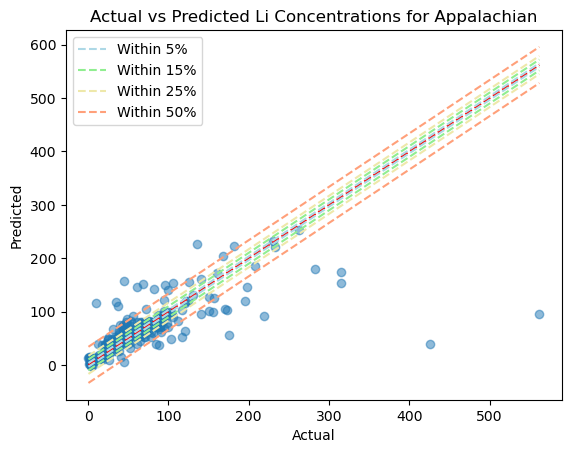

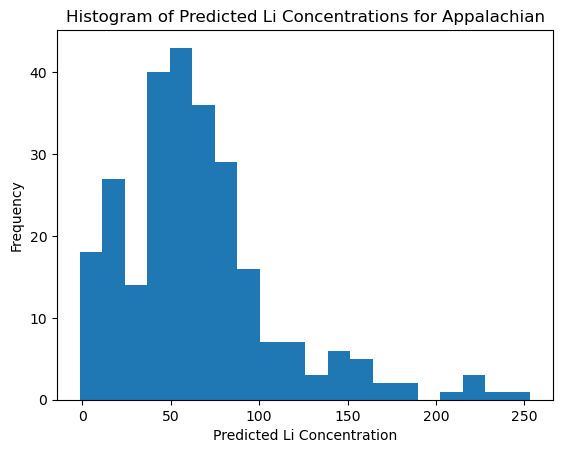

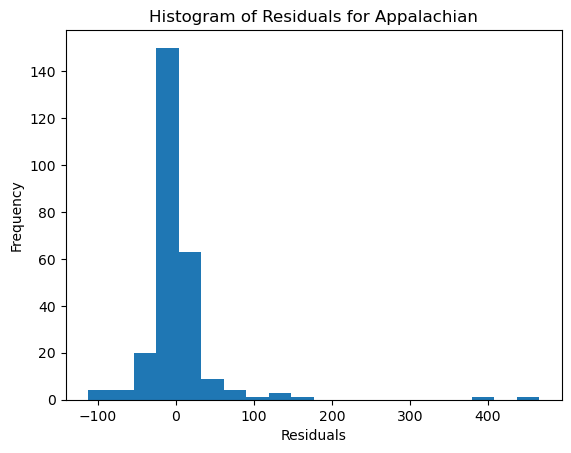

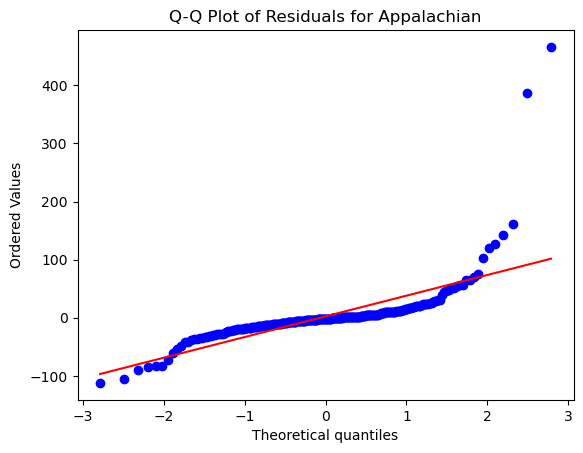

Permian
Number of data points:  481
Number of samples in the training dataset: 288
Best parameters: {'C': 150, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 4363.275946903273
MSE of the model: 4065.1069037665843
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 63.758190875891266
MAE of the best SVR model: 12.728472309740367
-------------------------------
R-squared (Coefficient of Determination): 0.0683360499691309
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  25.38860103626943
±15%:  58.549222797927456
±25%:  74.61139896373057
±50%:  89.11917098445595
-------------------------------
Minimum percentage difference: 0.32%
Maximum percentage difference: 691.31%
-------------------------------
Quantile re

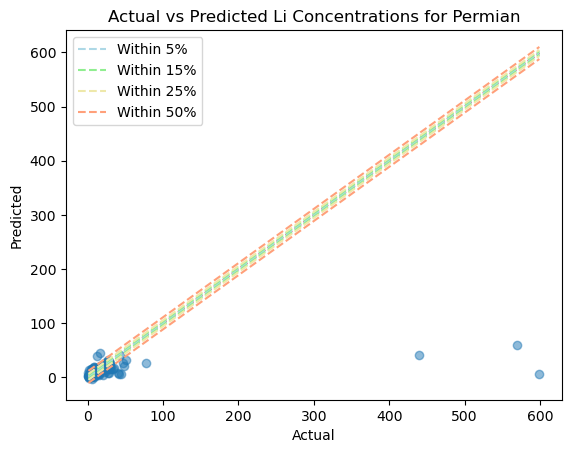

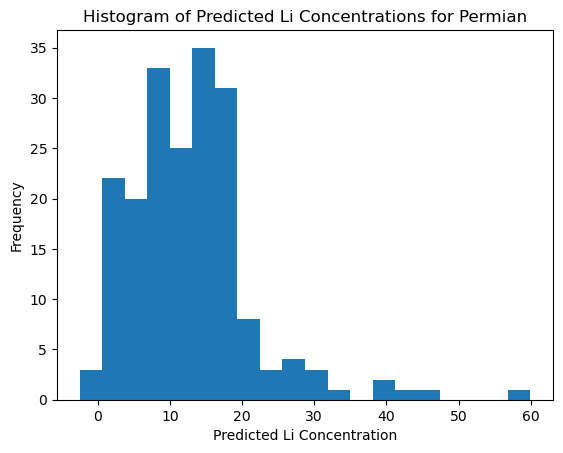

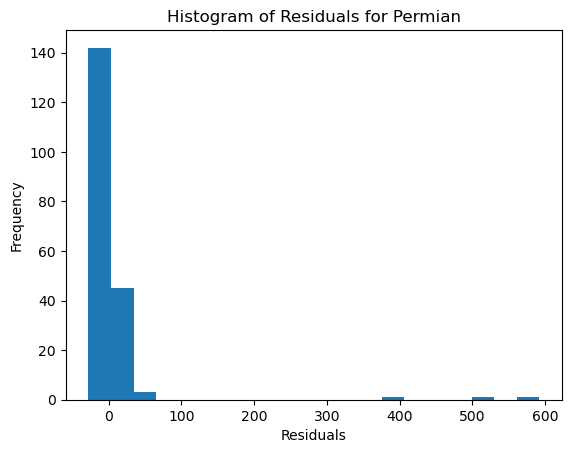

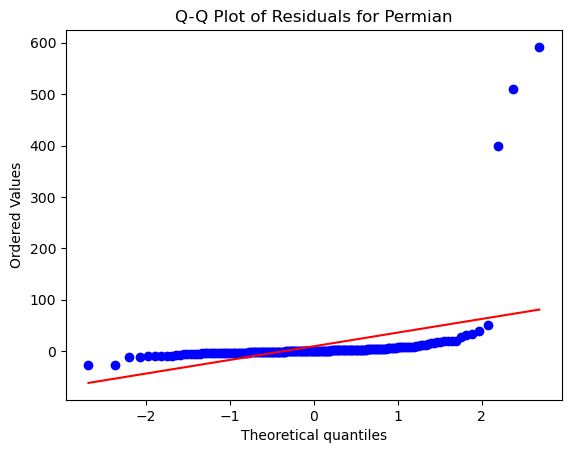

Oklahoma Platform
Number of data points:  254
Number of samples in the training dataset: 152
Best parameters: {'C': 150, 'epsilon': 0.2, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 262.25286420607455
MSE of the model: 146.5440325407746
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 12.105537267745476
MAE of the best SVR model: 8.879840122293558
-------------------------------
R-squared (Coefficient of Determination): 0.4412109359247175
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  11.76470588235294
±15%:  24.509803921568626
±25%:  33.33333333333333
±50%:  66.66666666666666
-------------------------------
Minimum percentage difference: 0.01%
Maximum percentage difference: 1055.68%
-------------------------------
Q

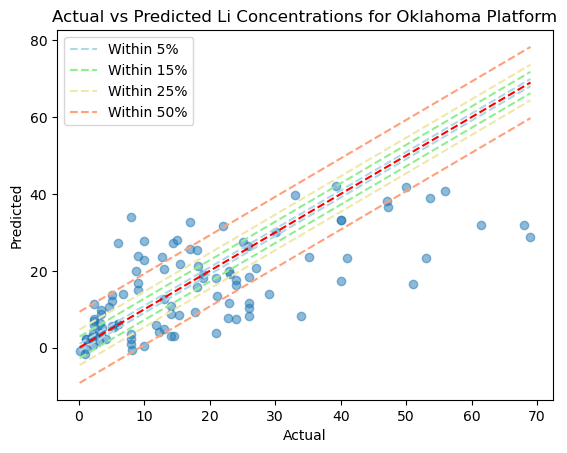

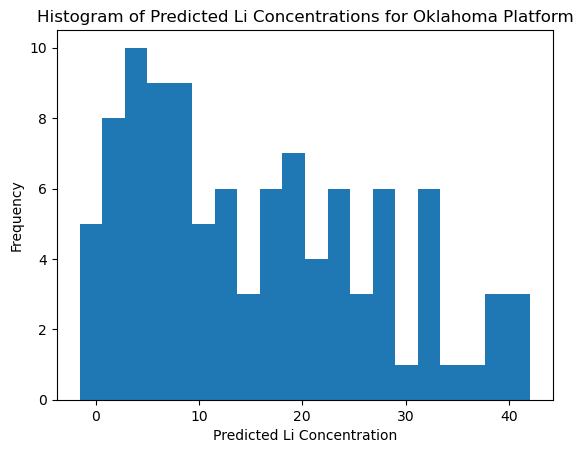

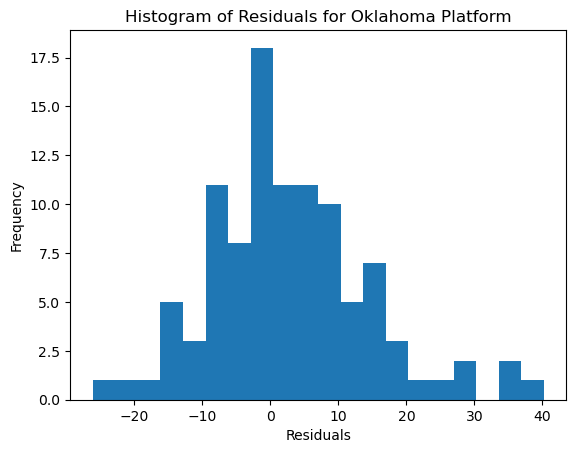

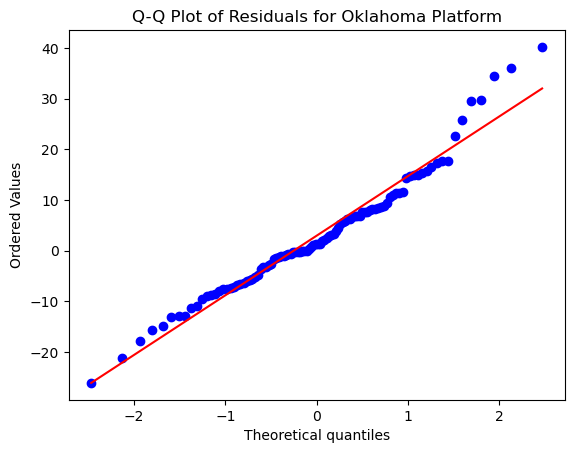

Gulf Coast
Number of data points:  888
Number of samples in the training dataset: 532
Best parameters: {'C': 150, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 15220.196403299024
MSE of the model: 8336.379371340092
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 91.30377523049138
MAE of the best SVR model: 15.050710713054626
-------------------------------
R-squared (Coefficient of Determination): 0.452281747853585
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  46.348314606741575
±15%:  71.06741573033707
±25%:  77.80898876404494
±50%:  90.73033707865169
-------------------------------
Minimum percentage difference: 0.36%
Maximum percentage difference: 1336.97%
-------------------------------
Quantile 

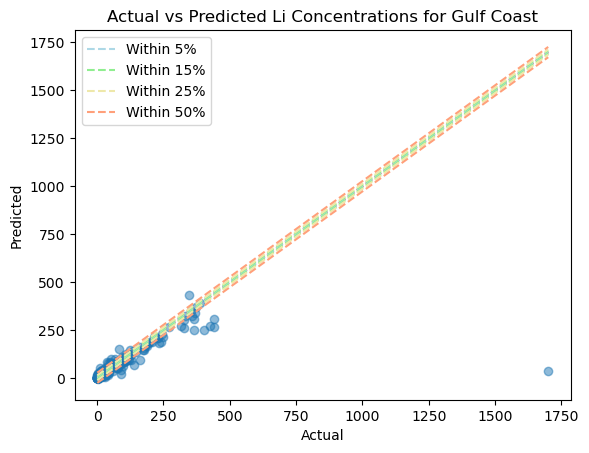

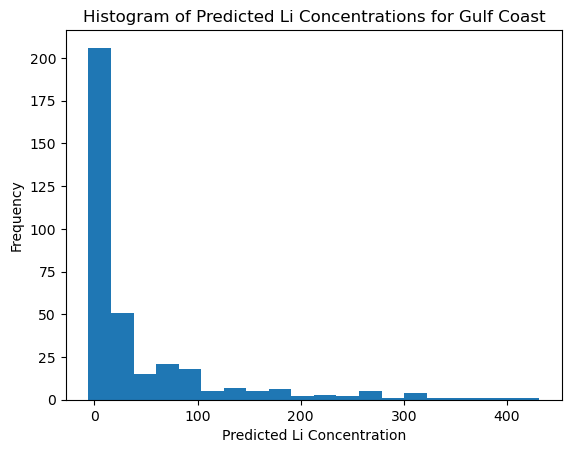

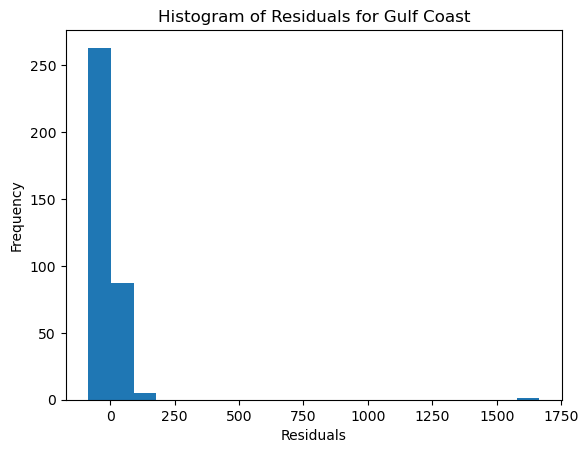

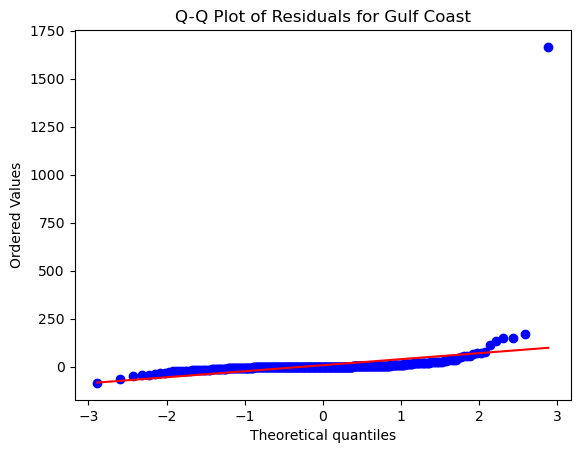

Williston
Number of data points:  502
Number of samples in the training dataset: 301
Best parameters: {'C': 200, 'epsilon': 0.2, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 3119.9766594525954
MSE of the model: 816.7306892215677
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 28.57850047188564
MAE of the best SVR model: 11.850073842972867
-------------------------------
R-squared (Coefficient of Determination): 0.7382253848768008
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  27.363184079601986
±15%:  60.19900497512438
±25%:  70.64676616915423
±50%:  82.58706467661692
-------------------------------
Minimum percentage difference: 0.18%
Maximum percentage difference: 28017.22%
-------------------------------
Quantile

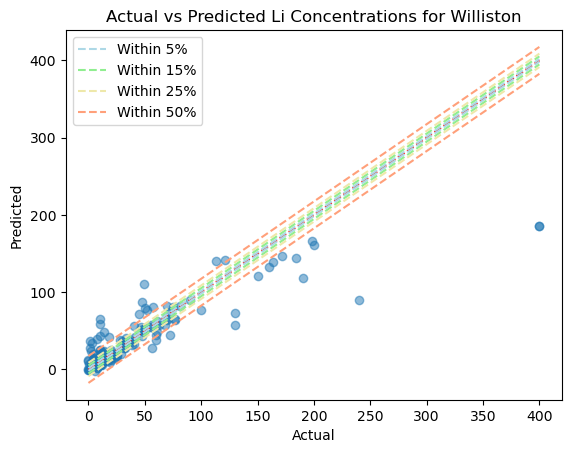

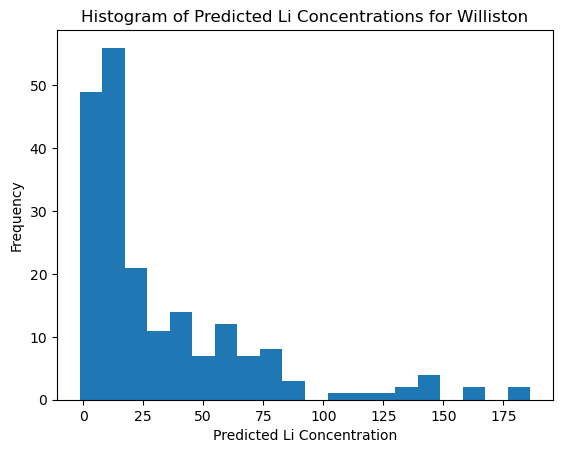

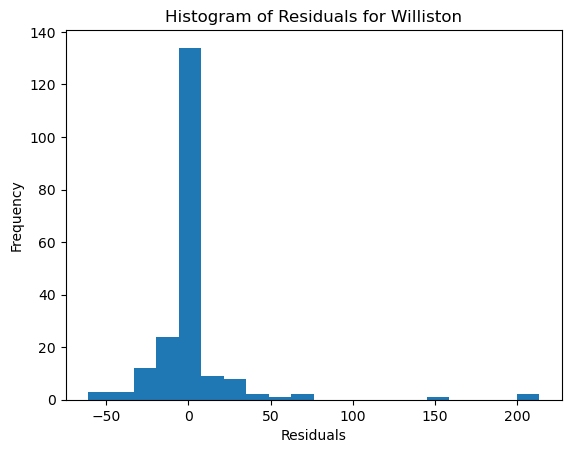

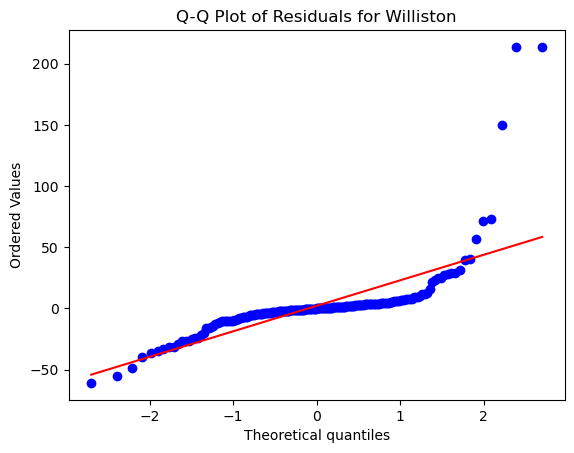

Michigan
Number of data points:  150
Number of samples in the training dataset: 90
Best parameters: {'C': 10, 'epsilon': 0.1, 'kernel': 'sigmoid'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 294.20372822222214
MSE of the model: 175.54234271614484
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 13.249239325944144
MAE of the best SVR model: 10.092488490041964
-------------------------------
R-squared (Coefficient of Determination): 0.40333066553272345
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  3.3333333333333335
±15%:  16.666666666666664
±25%:  31.666666666666664
±50%:  71.66666666666667
-------------------------------
Minimum percentage difference: 0.81%
Maximum percentage difference: 1115.41%
-------------------------------
Qua

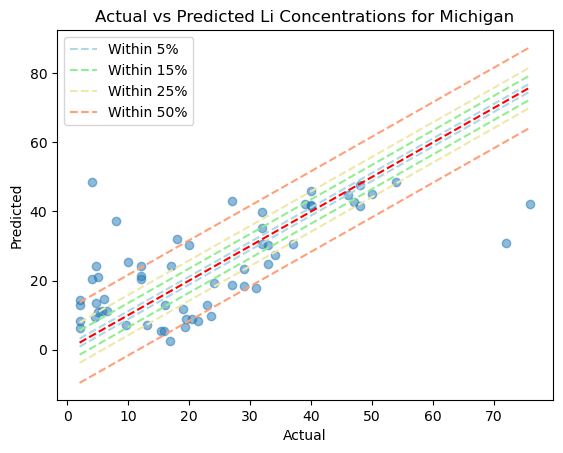

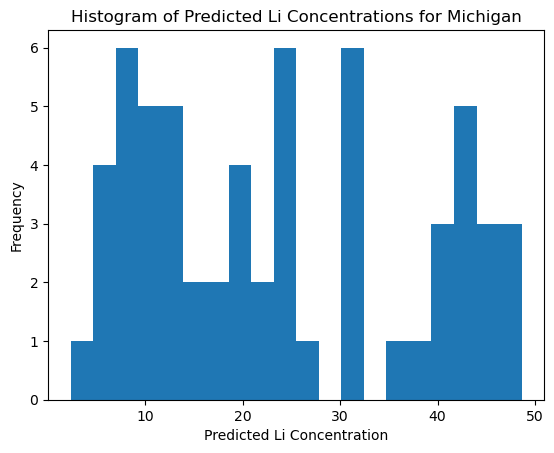

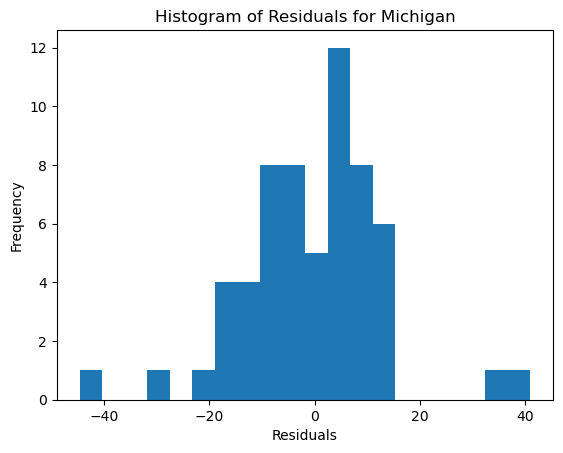

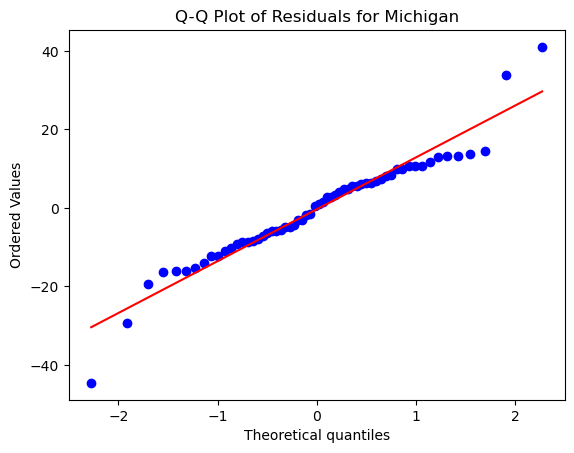

Pacific
Number of data points:  145
Number of samples in the training dataset: 87
Best parameters: {'C': 50, 'epsilon': 0.2, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 6.184807498513675
MSE of the model: 2.330326537435612
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 1.5265407093935006
MAE of the best SVR model: 0.8745589845789645
-------------------------------
R-squared (Coefficient of Determination): 0.6232176121899294
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  13.793103448275861
±15%:  34.48275862068966
±25%:  53.44827586206896
±50%:  75.86206896551724
-------------------------------
Minimum percentage difference: 0.80%
Maximum percentage difference: 4286.27%
-------------------------------
Quantile regr

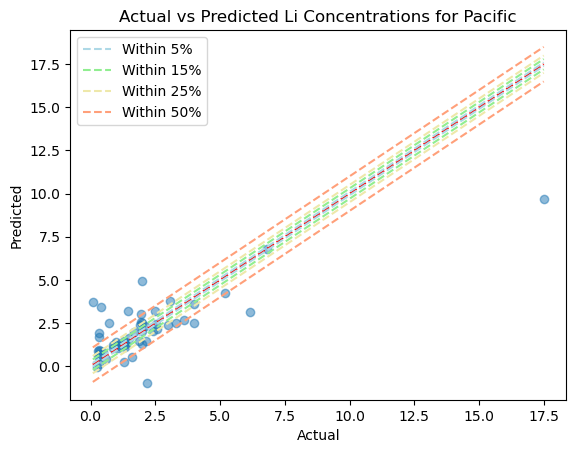

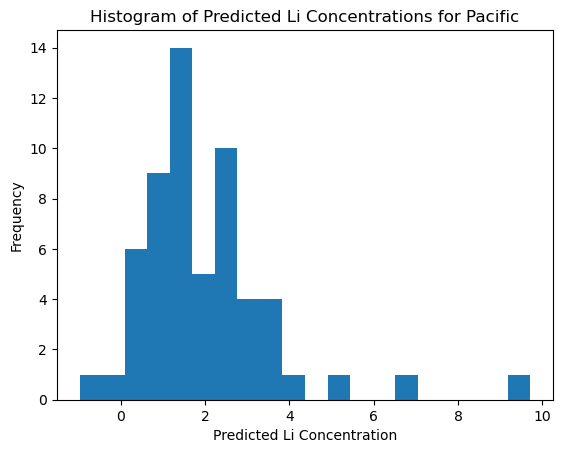

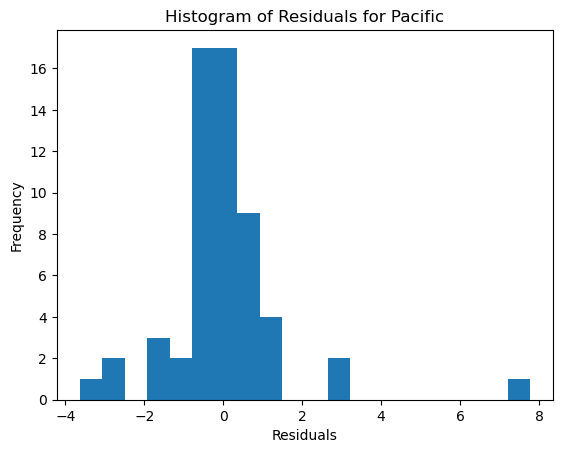

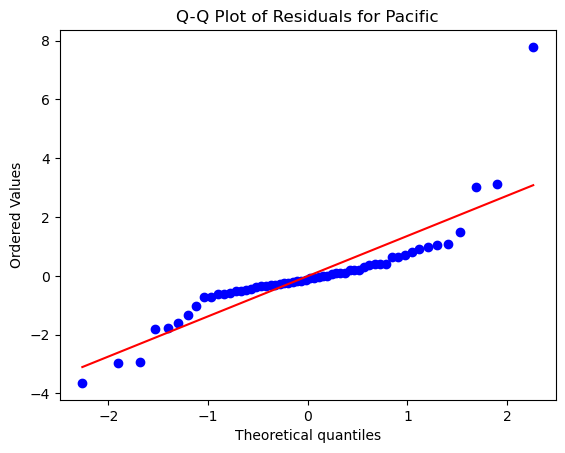

Illinois
Number of data points:  25
Number of samples in the training dataset: 15
Best parameters: {'C': 50, 'epsilon': 0.1, 'kernel': 'poly'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 114.36396100000002
MSE of the model: 314.73811958493036
The model's MSE is close to or larger than the variance of the target variable.
The model's performance may be limited compared to the variability of the target variable.
RMSE of the model: 17.740860170378728
MAE of the best SVR model: 10.734805161097182
-------------------------------
R-squared (Coefficient of Determination): -1.7520743146079938
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  0.0
±15%:  40.0
±25%:  60.0
±50%:  70.0
-------------------------------
Minimum percentage difference: 8.30%
Maximum percentage difference: 209.93%
-------------------------------
Quantile regression loss:
Quantile 0.25: 1.9338384

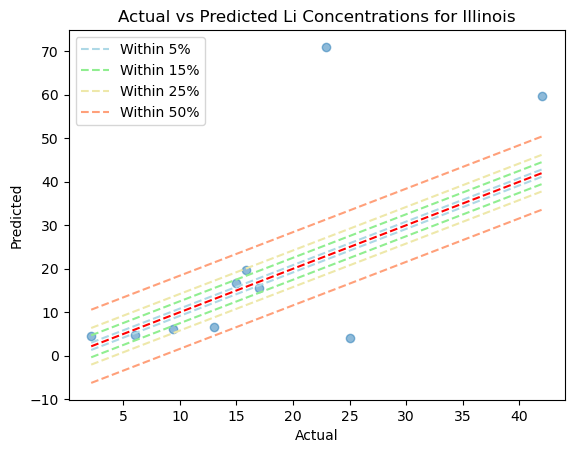

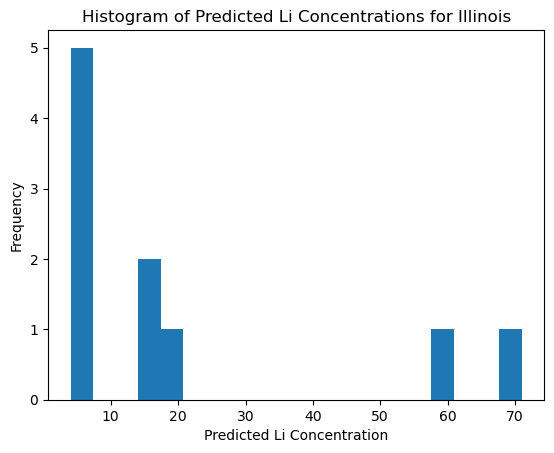

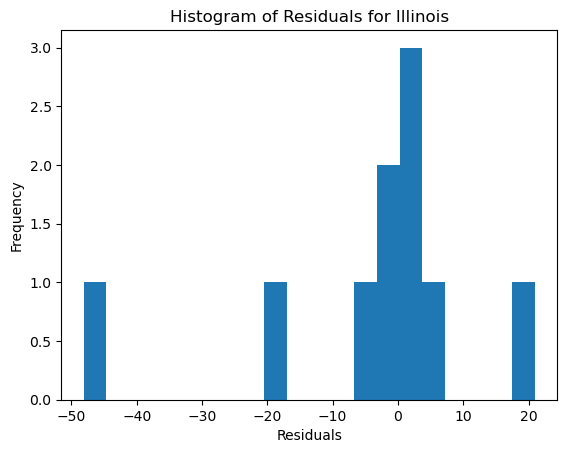

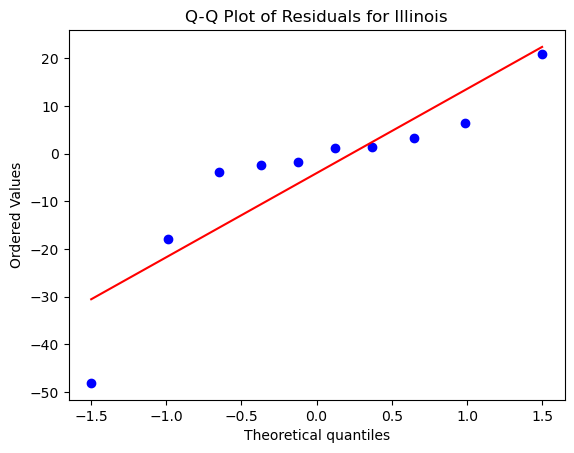

Great Plains
Number of data points:  62
Number of samples in the training dataset: 37
Best parameters: {'C': 50, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 20206.92695456
MSE of the model: 20826.35167448688
The model's MSE is close to or larger than the variance of the target variable.
The model's performance may be limited compared to the variability of the target variable.
RMSE of the model: 144.31338009514877
MAE of the best SVR model: 30.331945076026877
-------------------------------
R-squared (Coefficient of Determination): -0.030654078243554927
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  60.0
±15%:  92.0
±25%:  96.0
±50%:  96.0
-------------------------------
Minimum percentage difference: 1.31%
Maximum percentage difference: 152.83%
-------------------------------
Quantile regression loss:
Quantile 0.25: 0.465806

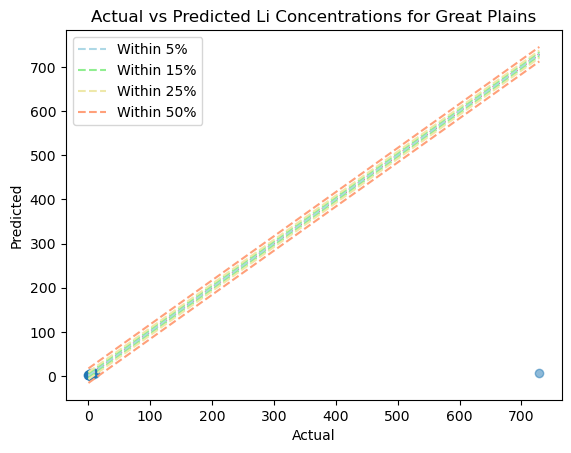

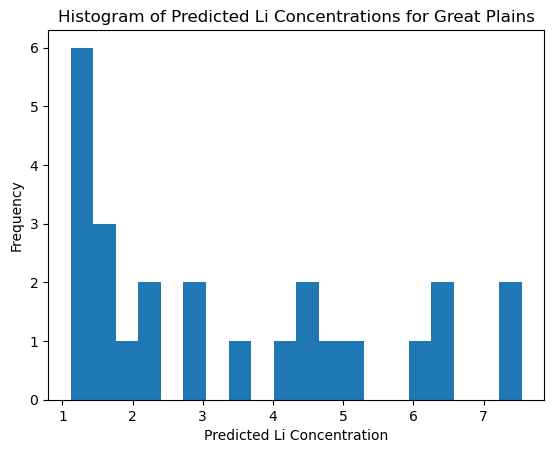

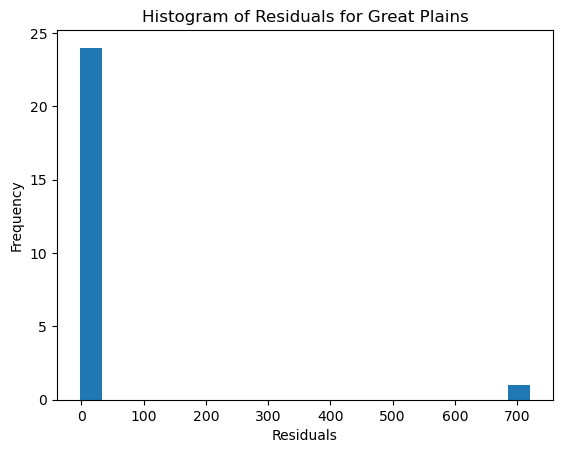

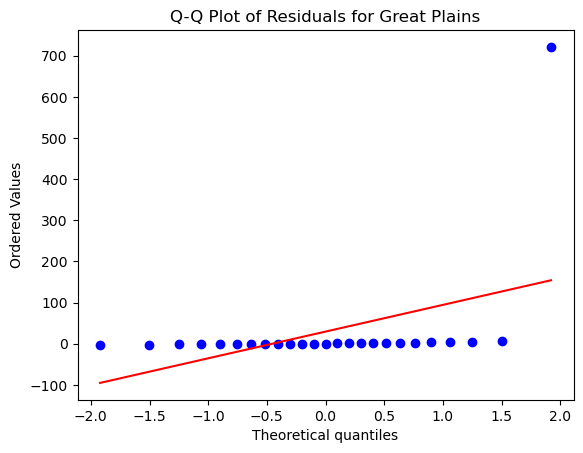

Anadarko
Number of data points:  262
Number of samples in the training dataset: 157
Best parameters: {'C': 200, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 15834.212353868477
MSE of the model: 9987.73444222199
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 99.93865339407967
MAE of the best SVR model: 24.302816998540933
-------------------------------
R-squared (Coefficient of Determination): 0.3692307379102523
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  51.42857142857142
±15%:  68.57142857142857
±25%:  73.33333333333333
±50%:  86.66666666666667
-------------------------------
Minimum percentage difference: 1.18%
Maximum percentage difference: 1260.21%
-------------------------------
Quantile reg

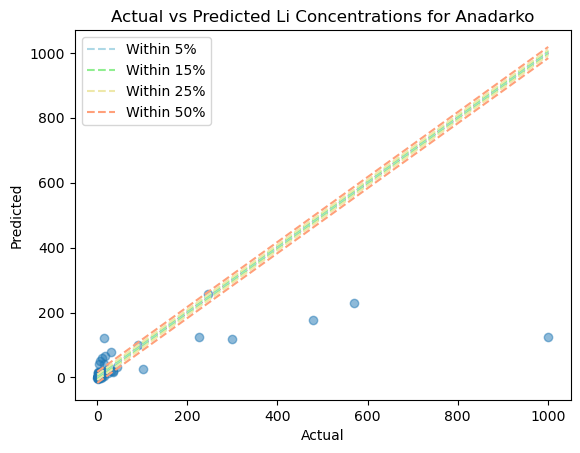

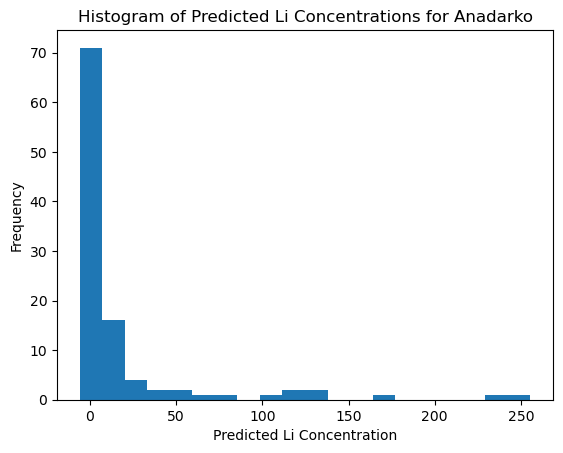

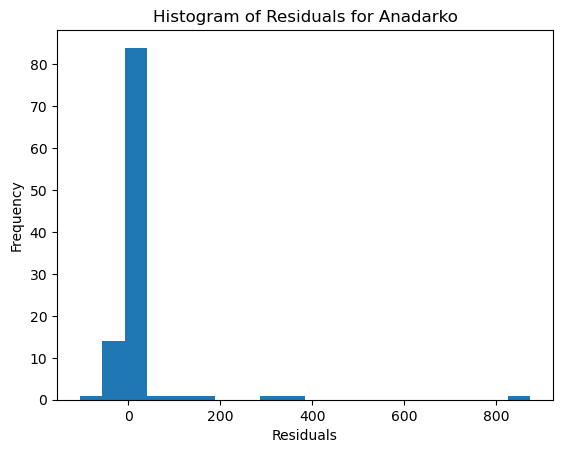

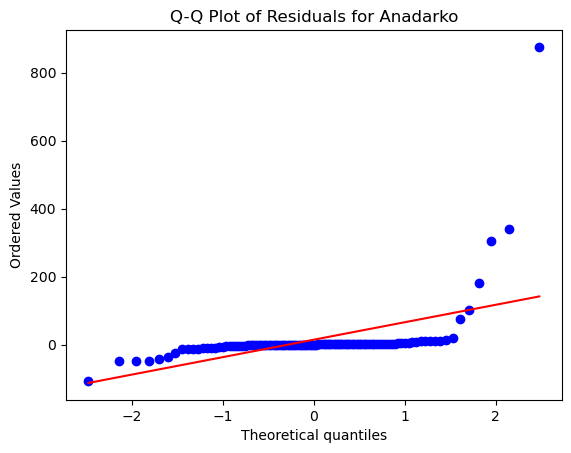

Rocky Mountain
Number of data points:  693
Number of samples in the training dataset: 415
Best parameters: {'C': 200, 'epsilon': 0.4, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 153.53934524092978
MSE of the model: 43.62448052781499
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 6.604883082070037
MAE of the best SVR model: 3.276908256485784
-------------------------------
R-squared (Coefficient of Determination): 0.7158742571204748
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  15.827338129496402
±15%:  37.76978417266187
±25%:  54.67625899280576
±50%:  81.65467625899281
-------------------------------
Minimum percentage difference: 0.14%
Maximum percentage difference: 2426.67%
-------------------------------
Quant

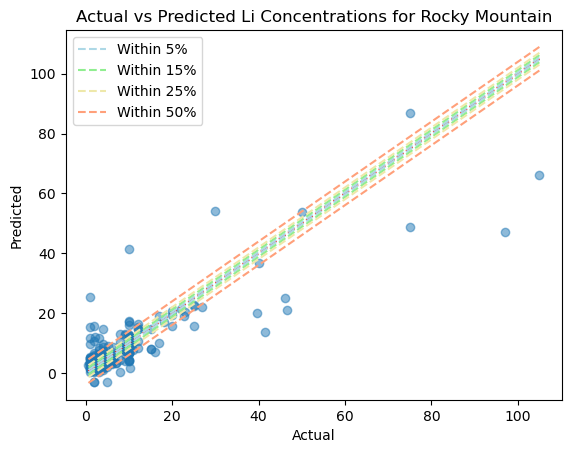

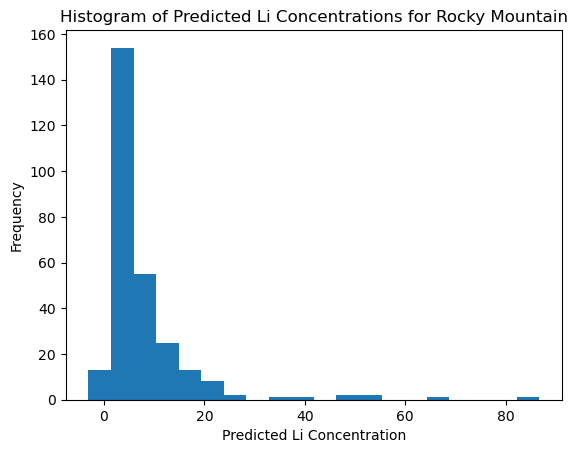

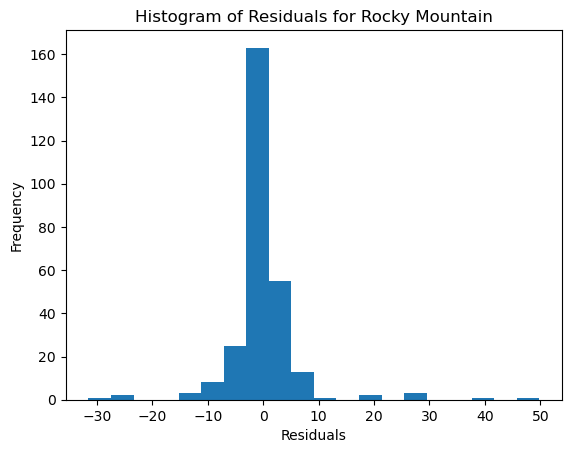

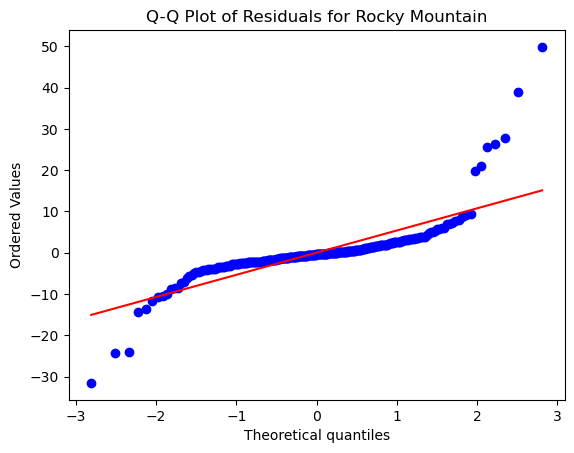

Fort Worth
Number of data points:  17
Number of samples in the training dataset: 10
Best parameters: {'C': 100, 'epsilon': 0.2, 'kernel': 'sigmoid'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 775.6835918367349
MSE of the model: 2320.0145013741558
The model's MSE is close to or larger than the variance of the target variable.
The model's performance may be limited compared to the variability of the target variable.
RMSE of the model: 48.16652884913086
MAE of the best SVR model: 30.866330384905275
-------------------------------
R-squared (Coefficient of Determination): -1.99092893776522
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  0.0
±15%:  0.0
±25%:  14.285714285714285
±50%:  42.857142857142854
-------------------------------
Minimum percentage difference: 10.54%
Maximum percentage difference: 998.21%
-------------------------------
Quantile regression 

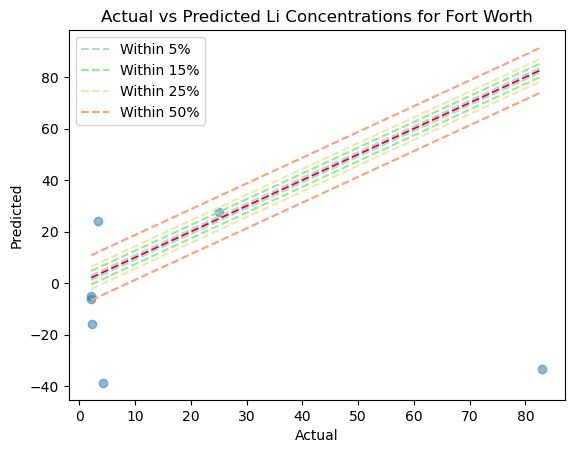

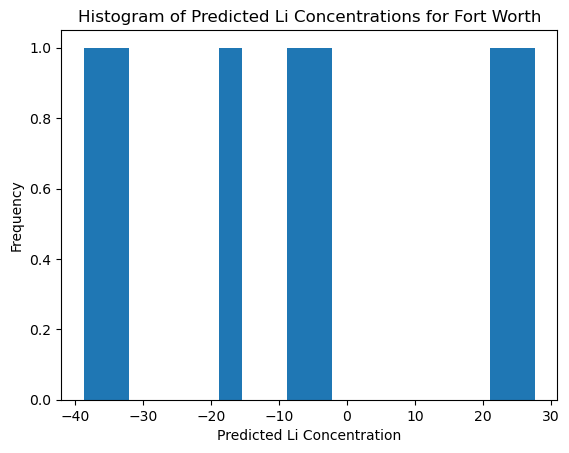

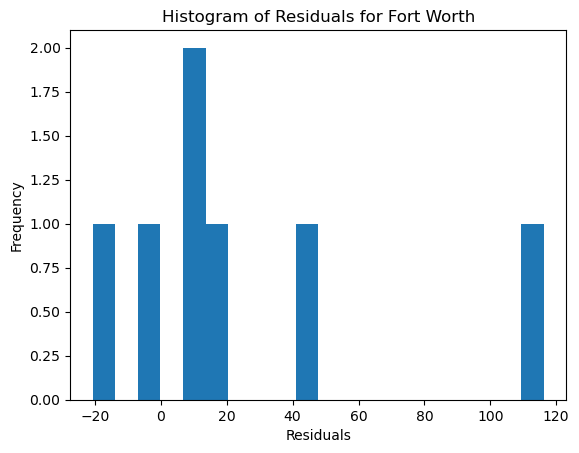

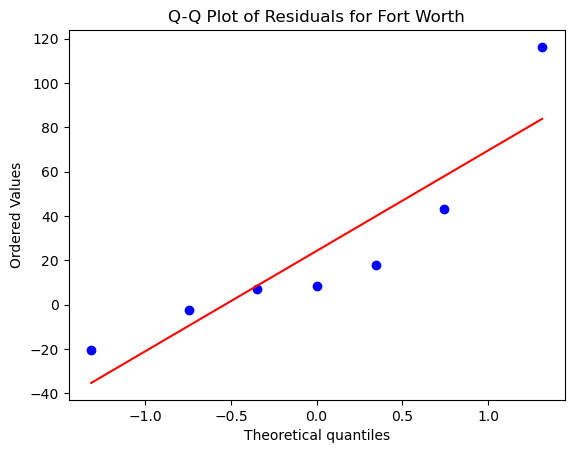

,round,basin,data_row_count,feature_quantity,feature_list,kernel_options,best_kernel,c_options,best_c,epsilon_options,...,within_5_percent,within_15_percent,within_25_percent,within_50_percent,results_min%_difference,results_max%_difference,0.25_quantile_loss,0.5_quantile_loss,0.75_quantile_loss,cross_val_mse
8,05_pca,Great Plains,62,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",50,"[0.1, 0.2, 0.3, 0.4, 0.5]",...,60.00,92.00,96.00,96.00,1.31,152.83,0.47,0.80,2.61,4.97
3,05_pca,Gulf Coast,888,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",150,"[0.1, 0.2, 0.3, 0.4, 0.5]",...,46.35,71.07,77.81,90.73,0.36,1336.97,1.04,3.00,11.10,5297.03
9,05_pca,Anadarko,262,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",200,"[0.1, 0.2, 0.3, 0.4, 0.5]",...,51.43,68.57,73.33,86.67,1.18,1260.21,0.83,1.63,9.34,3817.96
4,05_pca,Williston,502,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",200,"[0.1, 0.2, 0.3, 0.4, 0.5]",...,27.36,60.20,70.65,82.59,0.18,28017.22,1.55,3.85,10.22,1972.84
1,05_pca,Permian,481,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",150,"[0.1, 0.2, 0.3, 0.4, 0.5]",...,25.39,58.55,74.61,89.12,0.32,691.31,1.11,2.77,5.59,183.36
0,05_pca,Appalachian,652,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",200,"[0.1, 0.2, 0.3, 0.4, 0.5]",...,24.14,51.34,67.82,85.82,0.00,4113.24,3.85,9.77,20.72,2951.49
7,05_pca,Illinois,25,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",poly,"[10, 50, 100, 150, 200]",50,"[0.1, 0.2, 0.3, 0.4, 0.5]",...,0.00,40.00,60.00,70.00,8.30,209.93,1.93,3.59,14.97,37.14
10,05_pca,Rocky Mountain,693,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",200,"[0.1, 0.2, 0.3, 0.4, 0.5]",...,15.83,37.77,54.68,81.65,0.14,2426.67,0.70,1.78,3.28,87.90
6,05_pca,Pacific,145,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",50,"[0.1, 0.2, 0.3, 0.4, 0.5]",...,13.79,34.48,53.45,75.86,0.80,4286.27,0.21,0.43,0.96,2.22
2,05_pca,Oklahoma Platform,254,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",150,"[0.1, 0.2, 0.3, 0.4, 0.5]",...,11.76,24.51,33.33,66.67,0.01,1055.68,2.81,7.08,11.48,162.56


In [50]:
# Define all the variables...
round = '05_pca'
test_size = 0.4
random_state = 42
kernel_values = ['rbf', 'poly', 'sigmoid']
c_values = [10, 50, 100, 150, 200]
epsilon_values = [0.1, 0.2, 0.3, 0.4, 0.5]

# Run the function...
df_round05_pca = generate_svr_models_by_basin(df=df, round=round, basins=basins, categorical_columns=categorical_columns, 
                                              test_size=test_size, random_state=random_state, kernel_values=kernel_values, 
                                              c_values=c_values, epsilon_values=epsilon_values)
df_round05_pca

#### ROUND 6

Appalachian
Number of data points:  652
Number of samples in the training dataset: 489
Best parameters: {'C': 200, 'epsilon': 0.1, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 3942.0189754375397
MSE of the model: 1992.026624738473
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 44.63212547861095
MAE of the best SVR model: 20.391071628480418
-------------------------------
R-squared (Coefficient of Determination): 0.494668433320423
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  25.766871165644172
±15%:  56.44171779141104
±25%:  73.00613496932516
±50%:  85.2760736196319
-------------------------------
Minimum percentage difference: 0.06%
Maximum percentage difference: 4267.06%
-------------------------------
Quantile 

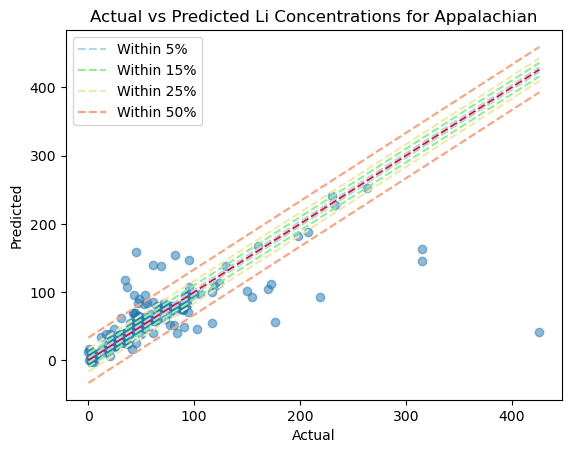

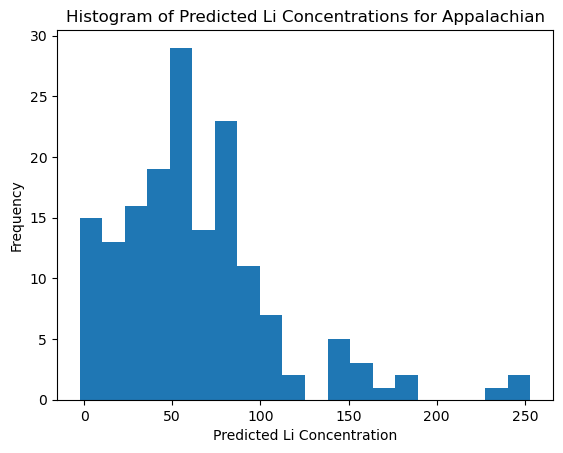

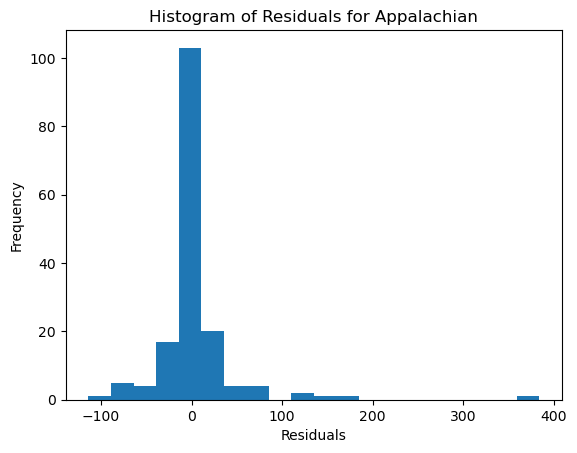

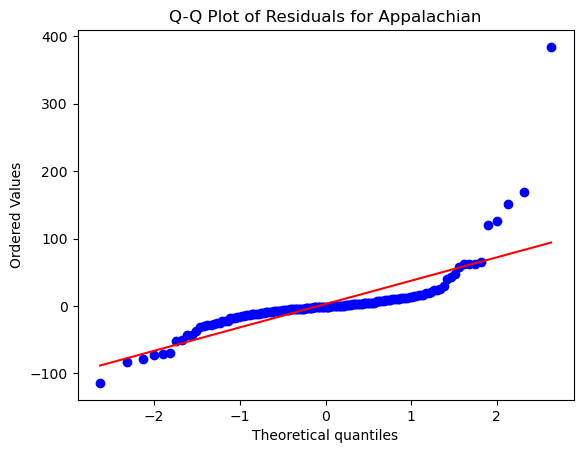

Permian
Number of data points:  481
Number of samples in the training dataset: 360
Best parameters: {'C': 50, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 4106.050815531726
MSE of the model: 3579.0886710261016
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 59.82548512988509
MAE of the best SVR model: 11.559605112160758
-------------------------------
R-squared (Coefficient of Determination): 0.1283379500595353
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  23.140495867768596
±15%:  60.33057851239669
±25%:  75.20661157024794
±50%:  91.73553719008265
-------------------------------
Minimum percentage difference: 0.02%
Maximum percentage difference: 940.75%
-------------------------------
Quantile regr

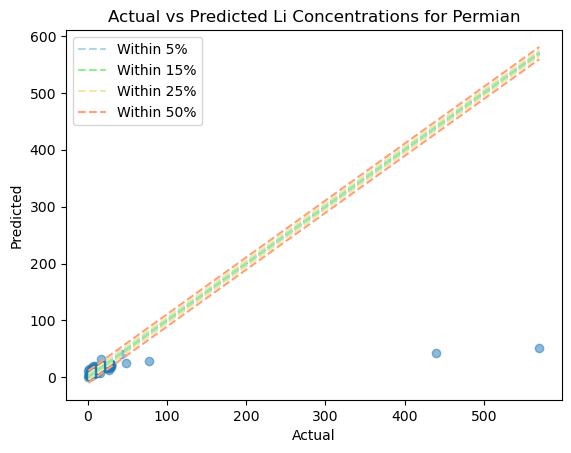

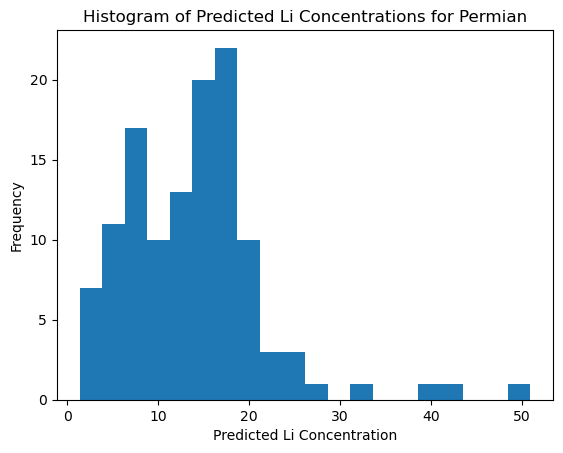

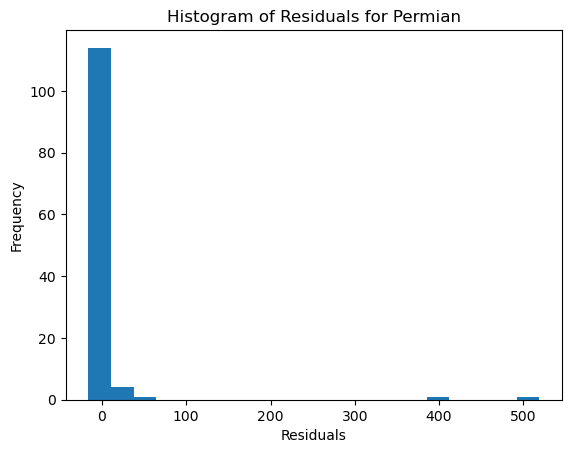

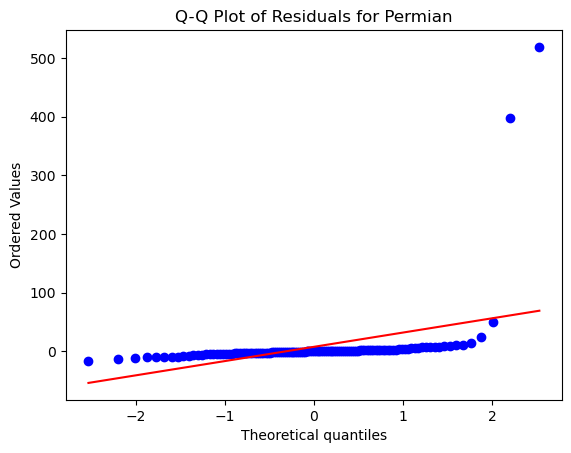

Oklahoma Platform
Number of data points:  254
Number of samples in the training dataset: 190
Best parameters: {'C': 100, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 308.3989183593751
MSE of the model: 177.18316057350077
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 13.311016511653074
MAE of the best SVR model: 10.017439201567665
-------------------------------
R-squared (Coefficient of Determination): 0.4254741180154512
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  10.9375
±15%:  21.875
±25%:  32.8125
±50%:  67.1875
-------------------------------
Minimum percentage difference: 1.92%
Maximum percentage difference: 508.72%
-------------------------------
Quantile regression loss:
Quantile 0.25: 3.

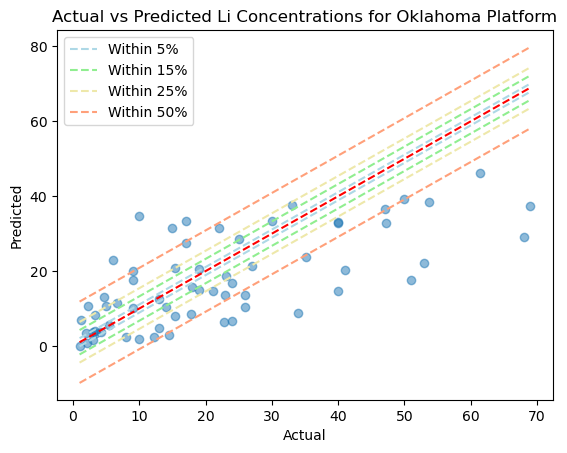

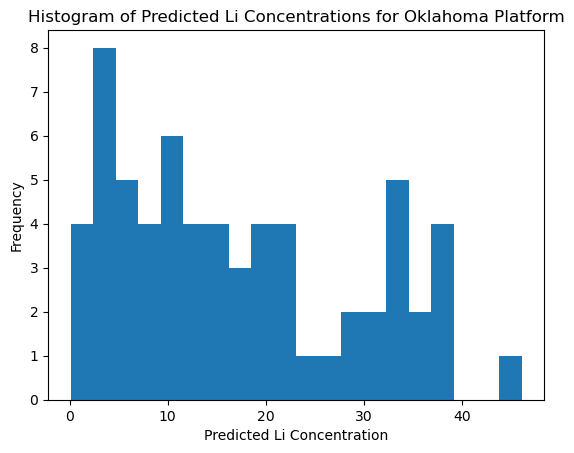

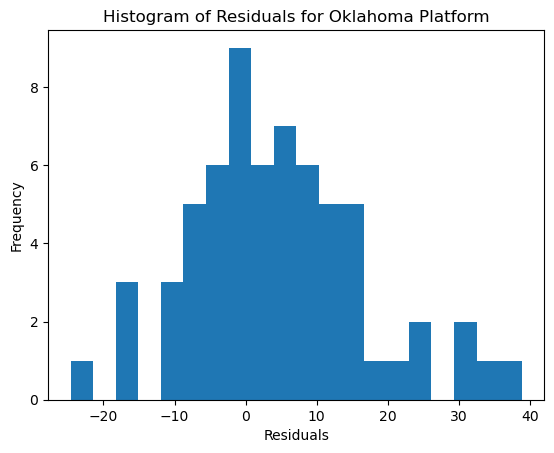

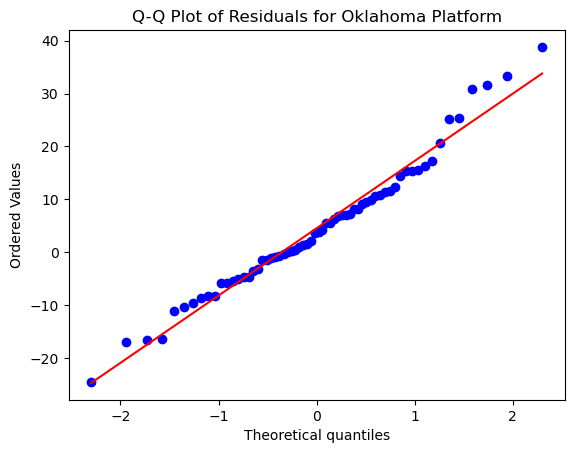

Gulf Coast
Number of data points:  888
Number of samples in the training dataset: 666
Best parameters: {'C': 200, 'epsilon': 0.4, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 19313.61518772352
MSE of the model: 13109.015892268666
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 114.49461075643983
MAE of the best SVR model: 15.922251568895312
-------------------------------
R-squared (Coefficient of Determination): 0.3212551992543966
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  51.35135135135135
±15%:  73.87387387387388
±25%:  78.37837837837837
±50%:  92.7927927927928
-------------------------------
Minimum percentage difference: 0.01%
Maximum percentage difference: 1567.18%
-------------------------------
Quantile 

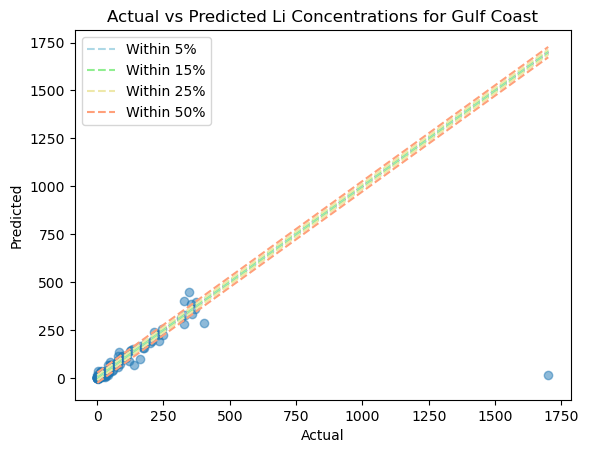

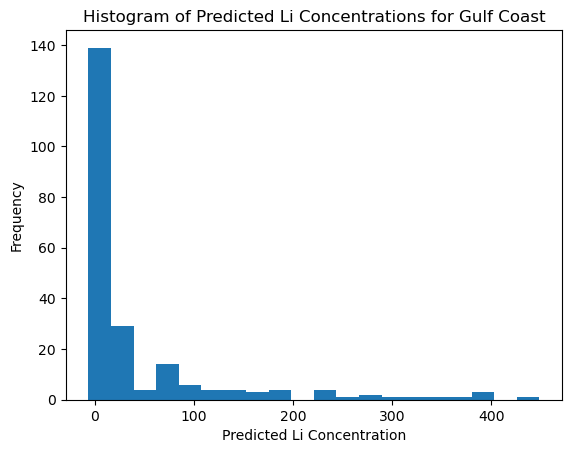

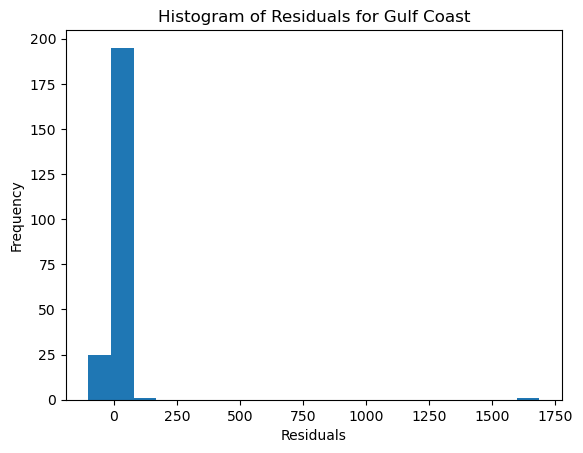

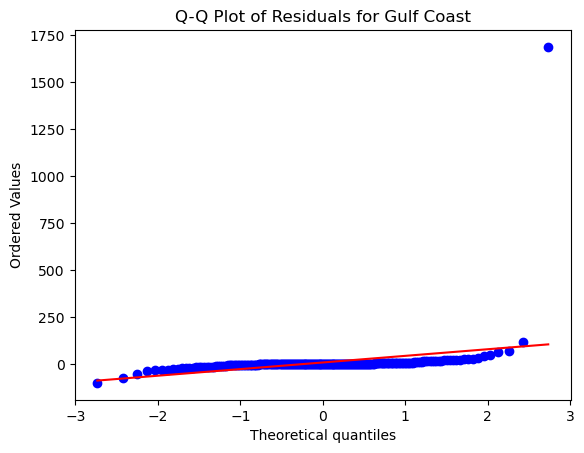

Williston
Number of data points:  502
Number of samples in the training dataset: 376
Best parameters: {'C': 200, 'epsilon': 0.1, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 2013.4464867274216
MSE of the model: 389.2051079334515
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 19.728281930605398
MAE of the best SVR model: 9.39547920669302
-------------------------------
R-squared (Coefficient of Determination): 0.8066970686834342
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  24.6031746031746
±15%:  56.34920634920635
±25%:  68.25396825396825
±50%:  84.12698412698413
-------------------------------
Minimum percentage difference: 0.08%
Maximum percentage difference: 32025.63%
-------------------------------
Quantile re

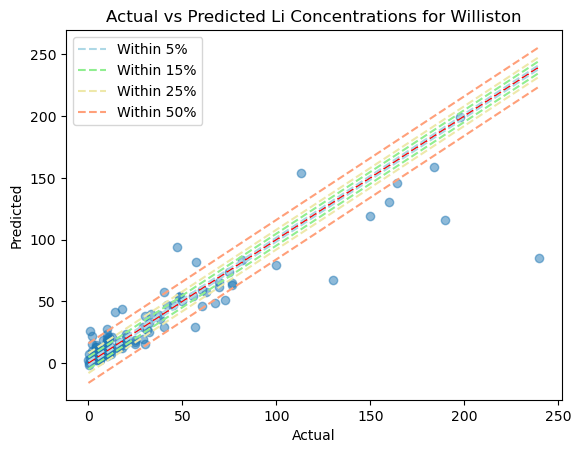

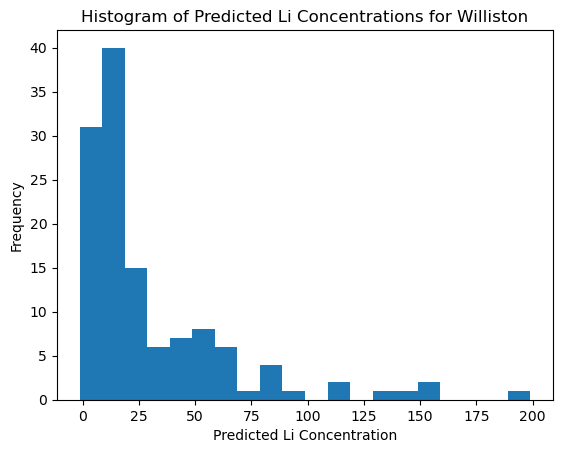

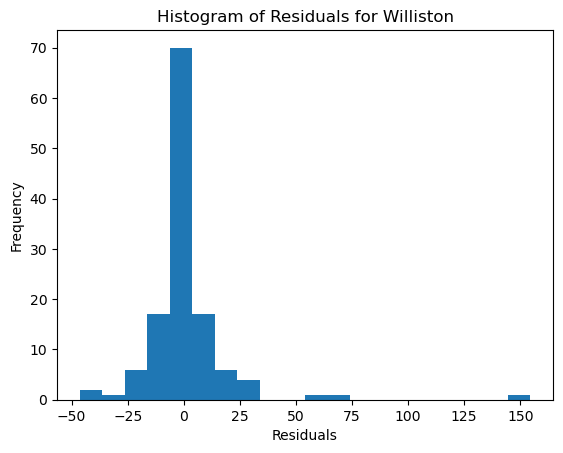

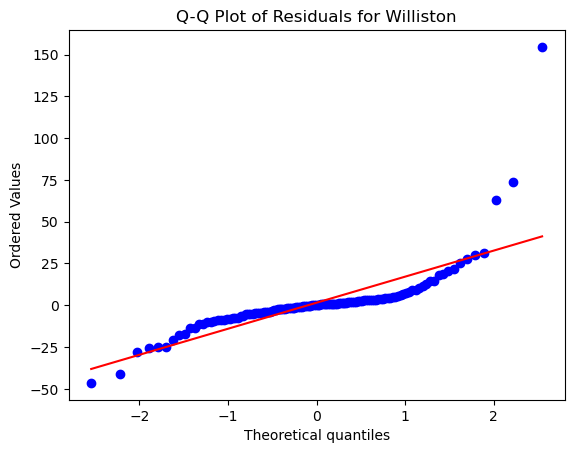

Michigan
Number of data points:  150
Number of samples in the training dataset: 112
Best parameters: {'C': 50, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 338.1750457756233
MSE of the model: 82.22936762080211
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 9.068041002377642
MAE of the best SVR model: 6.7219138679271255
-------------------------------
R-squared (Coefficient of Determination): 0.7568437747019314
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  18.421052631578945
±15%:  34.21052631578947
±25%:  42.10526315789473
±50%:  89.47368421052632
-------------------------------
Minimum percentage difference: 0.48%
Maximum percentage difference: 734.11%
-------------------------------
Quantile regr

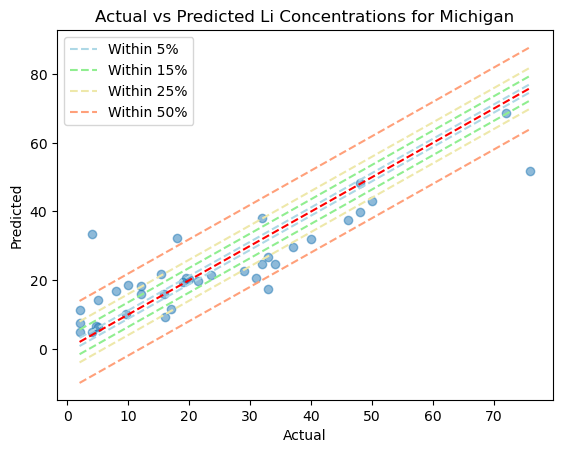

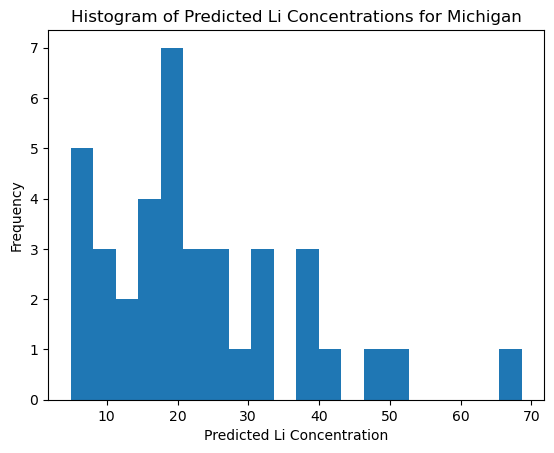

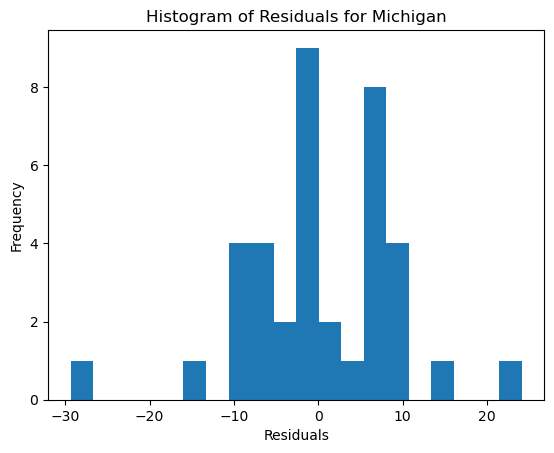

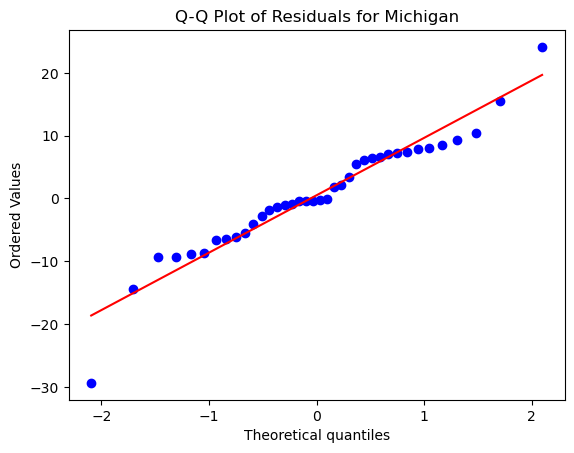

Pacific
Number of data points:  145
Number of samples in the training dataset: 108
Best parameters: {'C': 50, 'epsilon': 0.1, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 8.383484514243975
MSE of the model: 2.9652642216925176
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 1.7219942571601443
MAE of the best SVR model: 0.8787026442629353
-------------------------------
R-squared (Coefficient of Determination): 0.646296928603568
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  18.91891891891892
±15%:  37.83783783783784
±25%:  64.86486486486487
±50%:  83.78378378378379
-------------------------------
Minimum percentage difference: 0.84%
Maximum percentage difference: 3982.15%
-------------------------------
Quantile regr

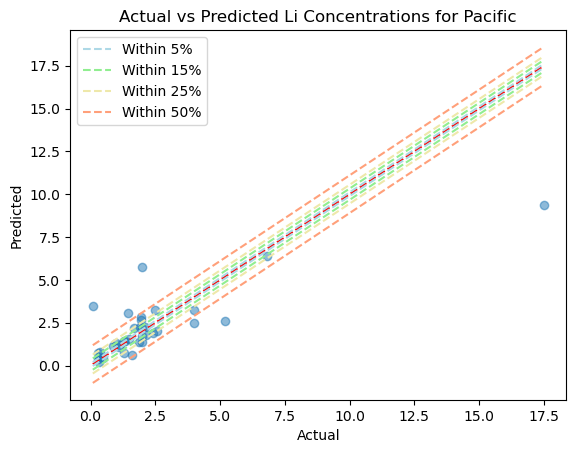

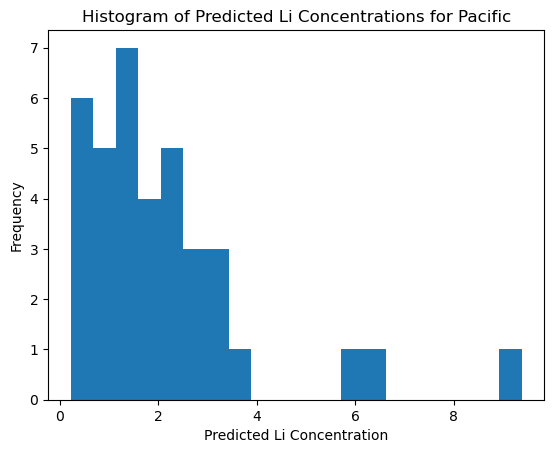

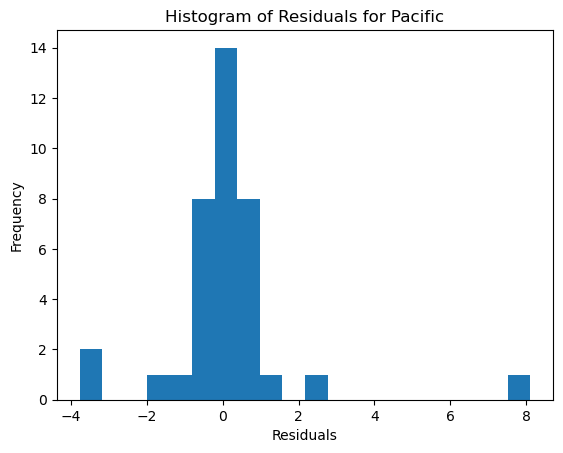

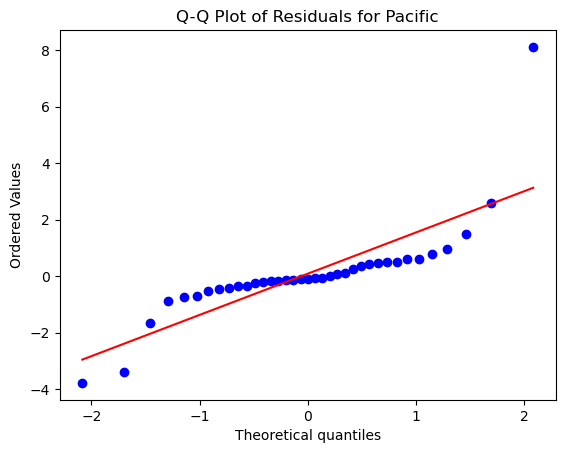

Illinois
Number of data points:  25
Number of samples in the training dataset: 18
Best parameters: {'C': 10, 'epsilon': 0.1, 'kernel': 'sigmoid'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 155.8923551020408
MSE of the model: 167.0852793456433
The model's MSE is close to or larger than the variance of the target variable.
The model's performance may be limited compared to the variability of the target variable.
RMSE of the model: 12.92614711913969
MAE of the best SVR model: 9.823621285390633
-------------------------------
R-squared (Coefficient of Determination): -0.07179905798636543
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  0.0
±15%:  14.285714285714285
±25%:  14.285714285714285
±50%:  57.14285714285714
-------------------------------
Minimum percentage difference: 8.81%
Maximum percentage difference: 382.23%
-------------------------------
Quantile 

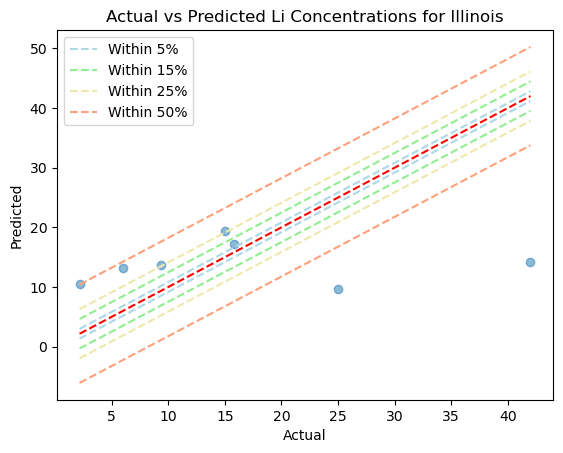

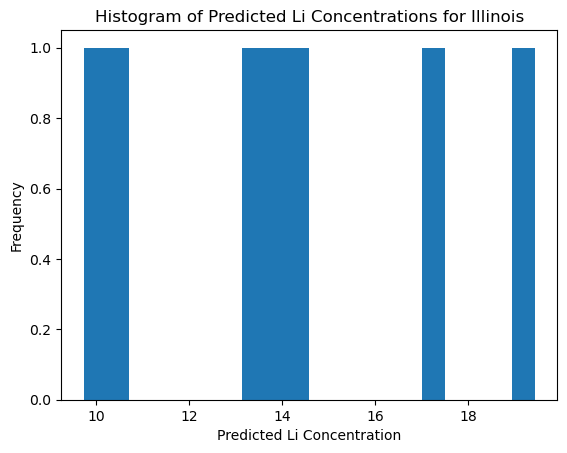

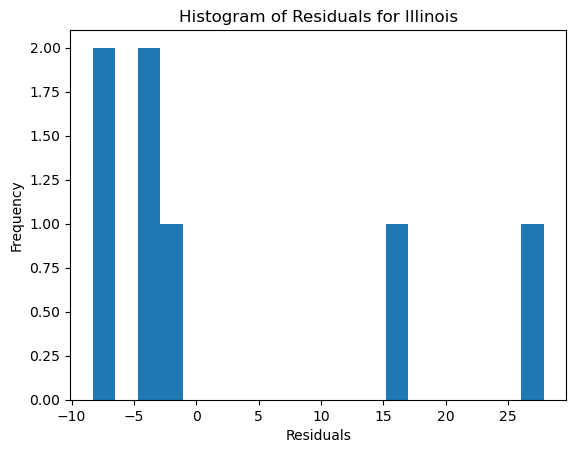

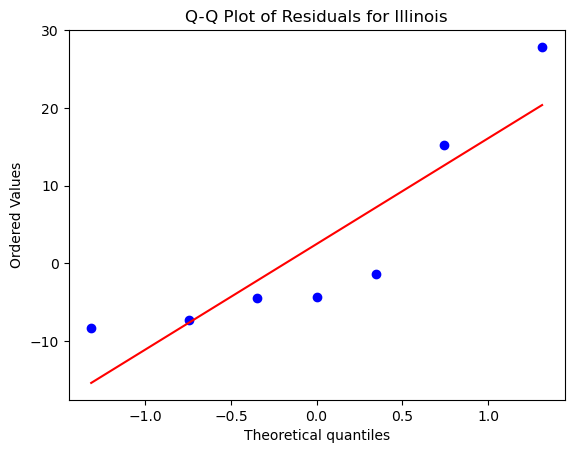

Great Plains
Number of data points:  62
Number of samples in the training dataset: 46
Best parameters: {'C': 150, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 30765.013448437494
MSE of the model: 32515.417488969135
The model's MSE is close to or larger than the variance of the target variable.
The model's performance may be limited compared to the variability of the target variable.
RMSE of the model: 180.32031912396656
MAE of the best SVR model: 47.04068374547006
-------------------------------
R-squared (Coefficient of Determination): -0.0568959296398599
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  50.0
±15%:  93.75
±25%:  93.75
±50%:  93.75
-------------------------------
Minimum percentage difference: 1.56%
Maximum percentage difference: 141.92%
-------------------------------
Quantile regression loss:
Quantile 0.25: 0.

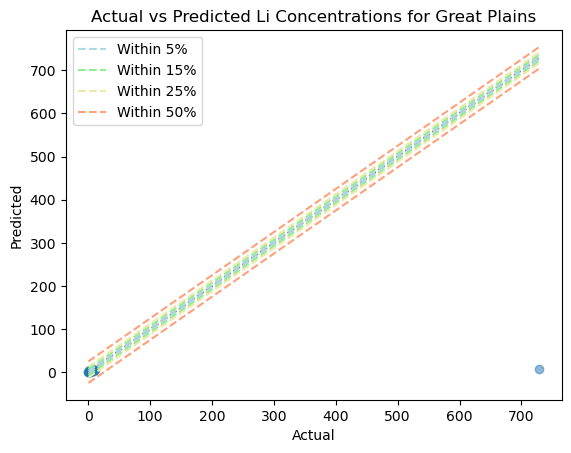

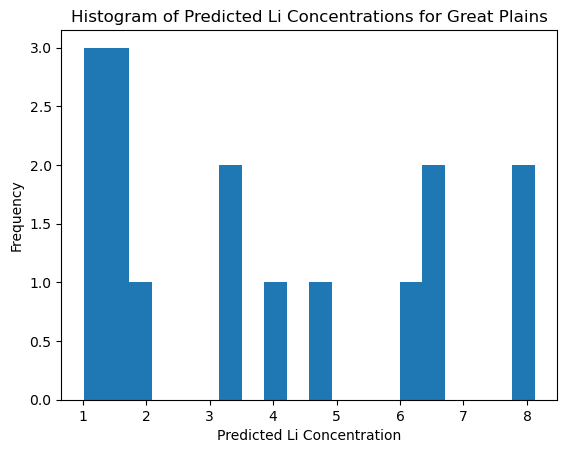

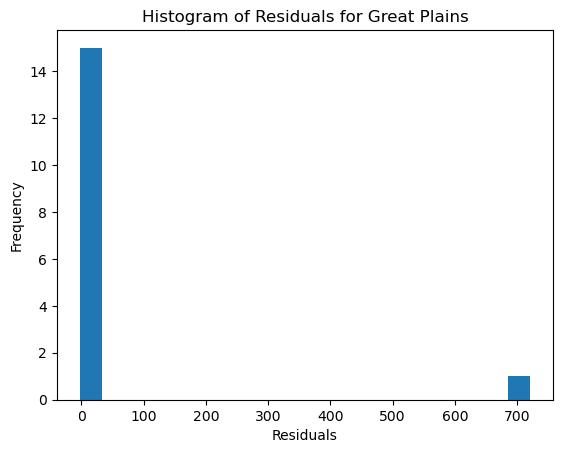

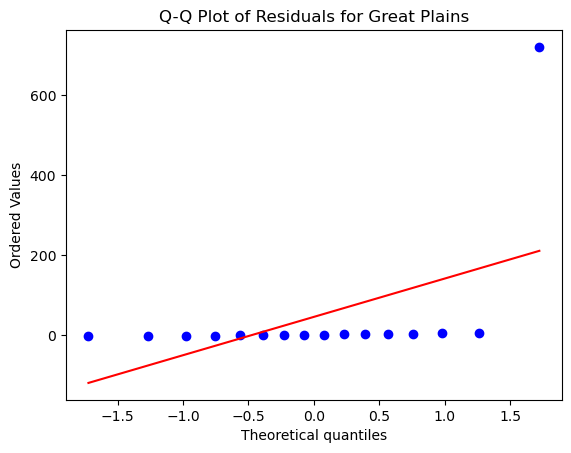

Anadarko
Number of data points:  262
Number of samples in the training dataset: 196
Best parameters: {'C': 200, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 8090.751883310373
MSE of the model: 2699.5950050255415
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 51.95762701495846
MAE of the best SVR model: 15.187445114147003
-------------------------------
R-squared (Coefficient of Determination): 0.6663357072419593
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  42.42424242424242
±15%:  57.57575757575758
±25%:  71.21212121212122
±50%:  81.81818181818183
-------------------------------
Minimum percentage difference: 1.53%
Maximum percentage difference: 1274.98%
-------------------------------
Quantile re

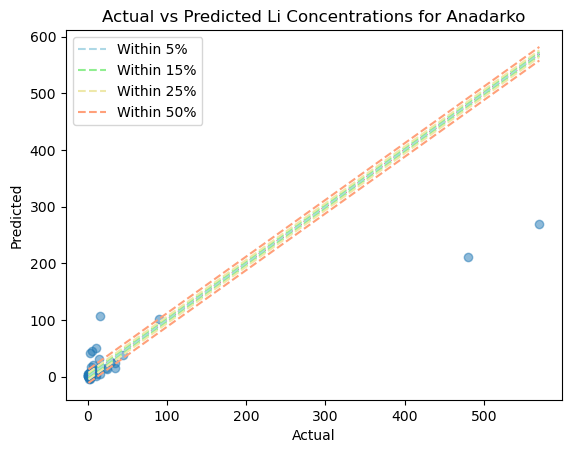

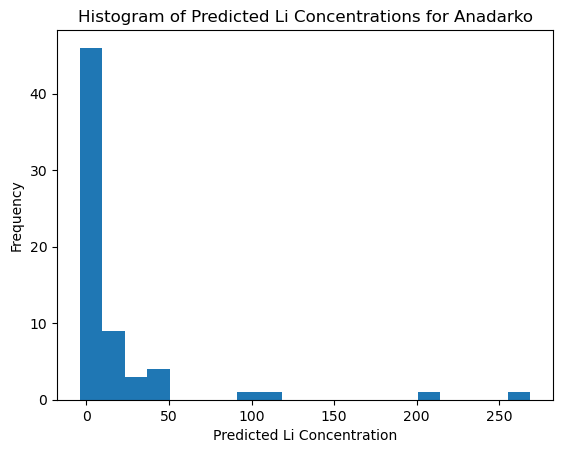

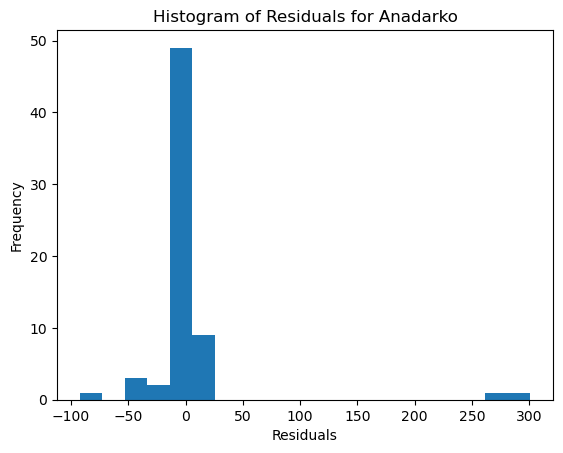

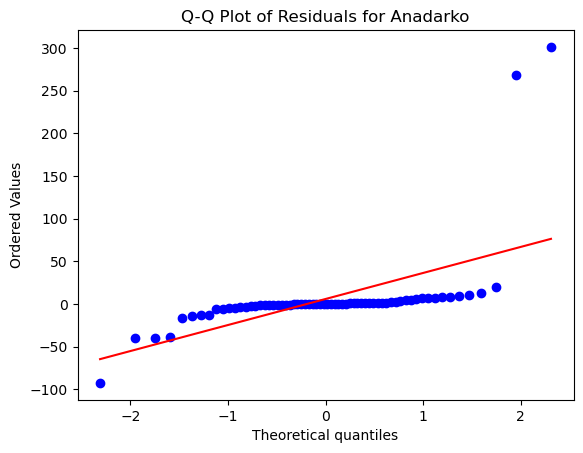

Rocky Mountain
Number of data points:  693
Number of samples in the training dataset: 519
Best parameters: {'C': 150, 'epsilon': 0.1, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 175.57252920134746
MSE of the model: 44.29355391236105
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 6.655340255190643
MAE of the best SVR model: 3.029239811930335
-------------------------------
R-squared (Coefficient of Determination): 0.7477193379064162
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  12.068965517241379
±15%:  40.229885057471265
±25%:  57.47126436781609
±50%:  82.75862068965517
-------------------------------
Minimum percentage difference: 0.37%
Maximum percentage difference: 2348.34%
-------------------------------
Quan

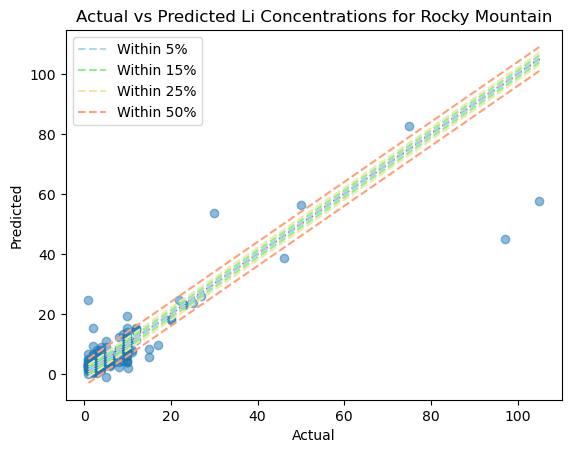

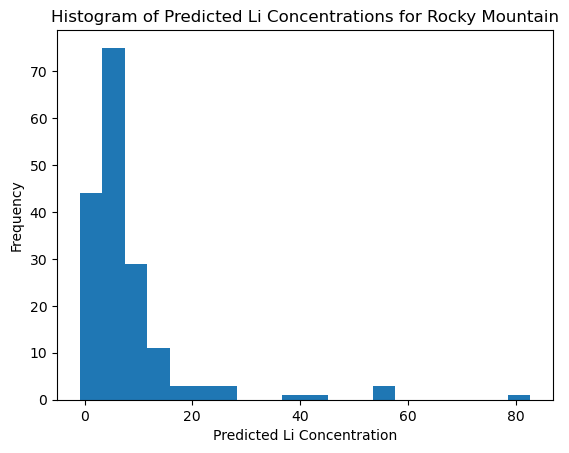

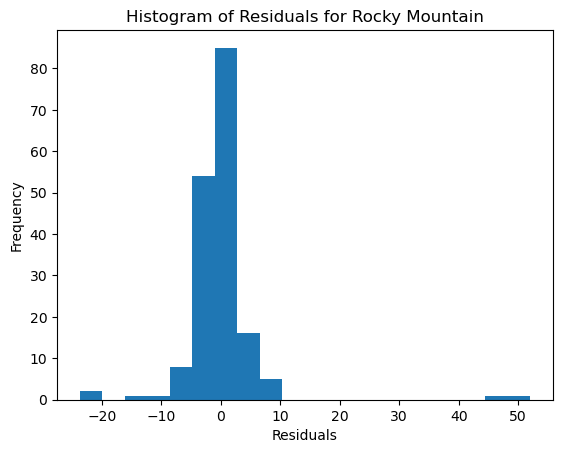

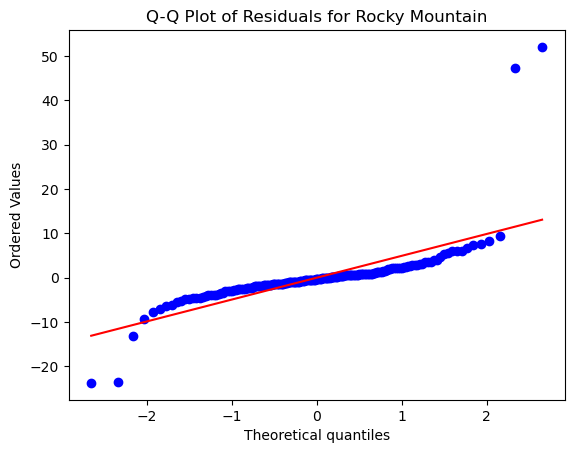

Fort Worth
Number of data points:  17
Number of samples in the training dataset: 12
Best parameters: {'C': 100, 'epsilon': 0.1, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 1038.8281839999997
MSE of the model: 930.6725126177774
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 30.50692565005162
MAE of the best SVR model: 17.006338404117166
-------------------------------
R-squared (Coefficient of Determination): 0.10411314695541829
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  0.0
±15%:  40.0
±25%:  60.0
±50%:  60.0
-------------------------------
Minimum percentage difference: 61.26%
Maximum percentage difference: 351.11%
-------------------------------
Quantile regression loss:
Quantile 0.25: 1.7432049311700024
Qua

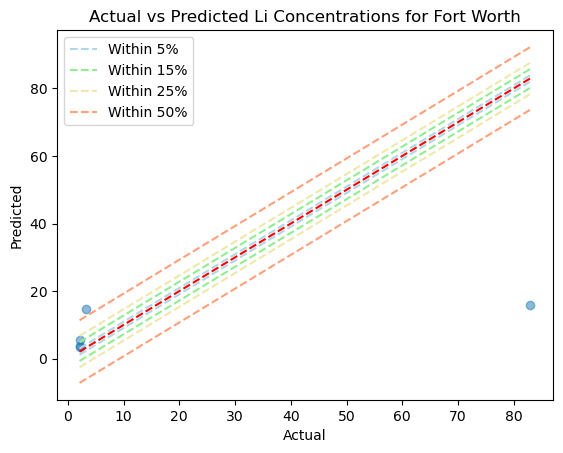

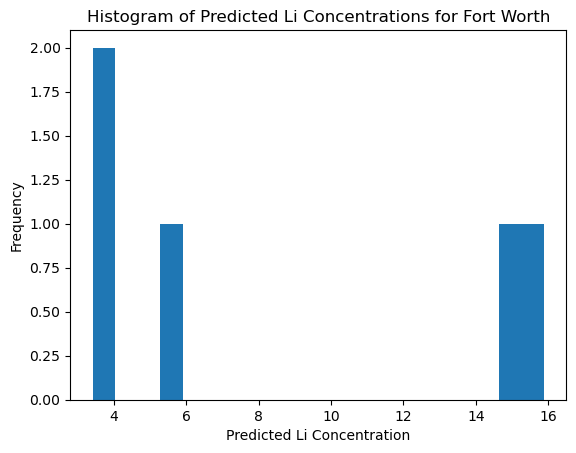

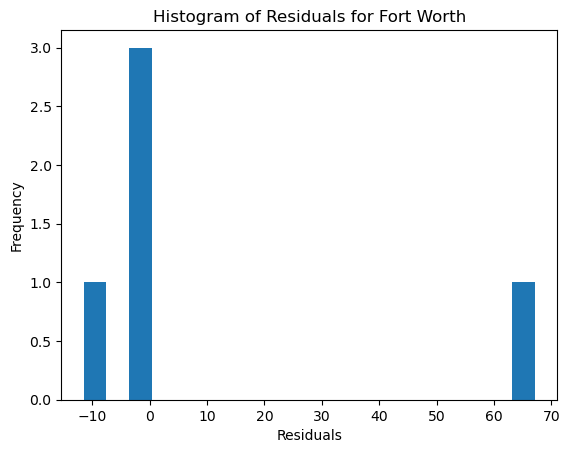

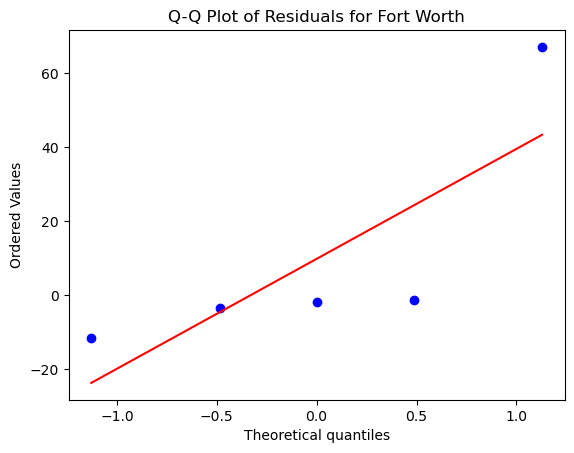

,round,basin,data_row_count,feature_quantity,feature_list,kernel_options,best_kernel,c_options,best_c,epsilon_options,...,within_5_percent,within_15_percent,within_25_percent,within_50_percent,results_min%_difference,results_max%_difference,0.25_quantile_loss,0.5_quantile_loss,0.75_quantile_loss,cross_val_mse
8,06_pca,Great Plains,62,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",150,"[0.1, 0.2, 0.3, 0.4, 0.5]",...,50.00,93.75,93.75,93.75,1.56,141.92,0.67,2.27,3.48,5.46
3,06_pca,Gulf Coast,888,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",200,"[0.1, 0.2, 0.3, 0.4, 0.5]",...,51.35,73.87,78.38,92.79,0.01,1567.18,0.94,2.47,9.38,4266.12
1,06_pca,Permian,481,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",50,"[0.1, 0.2, 0.3, 0.4, 0.5]",...,23.14,60.33,75.21,91.74,0.02,940.75,1.12,2.24,5.30,1122.37
9,06_pca,Anadarko,262,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",200,"[0.1, 0.2, 0.3, 0.4, 0.5]",...,42.42,57.58,71.21,81.82,1.53,1274.98,0.73,1.79,7.25,6963.05
0,06_pca,Appalachian,652,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",200,"[0.1, 0.2, 0.3, 0.4, 0.5]",...,25.77,56.44,73.01,85.28,0.06,4267.06,3.09,8.41,18.78,2881.38
4,06_pca,Williston,502,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",200,"[0.1, 0.2, 0.3, 0.4, 0.5]",...,24.60,56.35,68.25,84.13,0.08,32025.63,1.64,4.00,9.35,1756.97
10,06_pca,Rocky Mountain,693,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",150,"[0.1, 0.2, 0.3, 0.4, 0.5]",...,12.07,40.23,57.47,82.76,0.37,2348.34,0.76,1.61,3.06,73.74
11,06_pca,Fort Worth,17,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",100,"[0.1, 0.2, 0.3, 0.4, 0.5]",...,0.00,40.00,60.00,60.00,61.26,351.11,1.74,3.42,11.45,77.38
6,06_pca,Pacific,145,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",50,"[0.1, 0.2, 0.3, 0.4, 0.5]",...,18.92,37.84,64.86,83.78,0.84,3982.15,0.16,0.43,0.74,2.04
5,06_pca,Michigan,150,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",50,"[0.1, 0.2, 0.3, 0.4, 0.5]",...,18.42,34.21,42.11,89.47,0.48,734.11,1.93,6.43,8.63,177.71


In [51]:
# Define all the variables...
round = '06_pca'
test_size = 0.25
random_state = 42
kernel_values = ['rbf', 'poly', 'sigmoid']
c_values = [10, 50, 100, 150, 200]
epsilon_values = [0.1, 0.2, 0.3, 0.4, 0.5]

# Run the function...
df_round06_pca = generate_svr_models_by_basin(df=df, round=round, basins=basins, categorical_columns=categorical_columns, 
                                              test_size=test_size, random_state=random_state, kernel_values=kernel_values, 
                                              c_values=c_values, epsilon_values=epsilon_values)
df_round06_pca

#### ROUND 7

Appalachian
Number of data points:  652
Number of samples in the training dataset: 489
Best parameters: {'C': 50, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 3942.0189754375397
MSE of the model: 2126.226965886204
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 46.11102867954915
MAE of the best SVR model: 20.732207216372206
-------------------------------
R-squared (Coefficient of Determination): 0.4606248779788772
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  25.153374233128833
±15%:  59.50920245398773
±25%:  69.93865030674846
±50%:  82.82208588957054
-------------------------------
Minimum percentage difference: 0.12%
Maximum percentage difference: 4837.35%
-------------------------------
Quantile

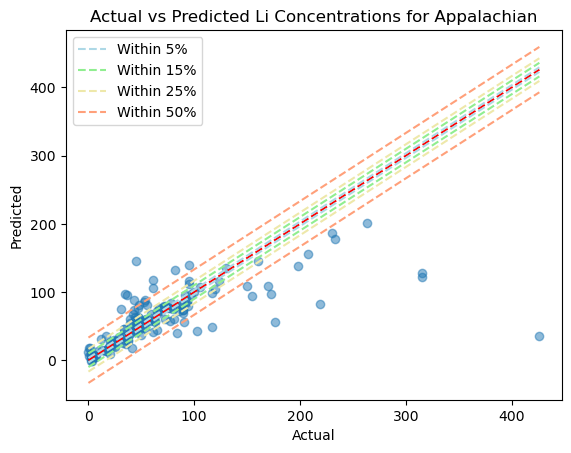

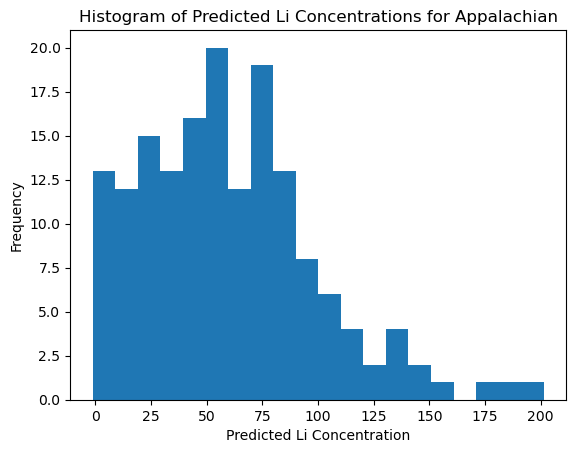

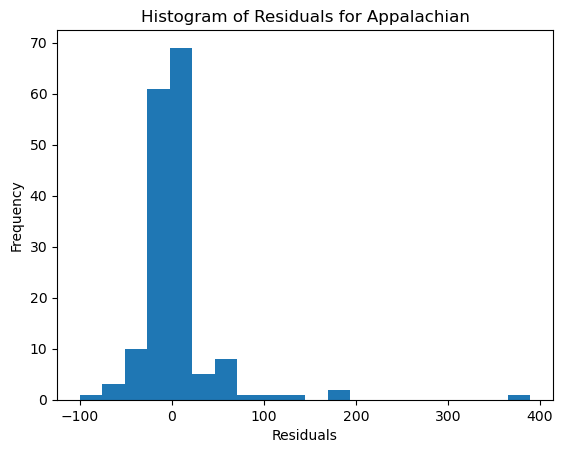

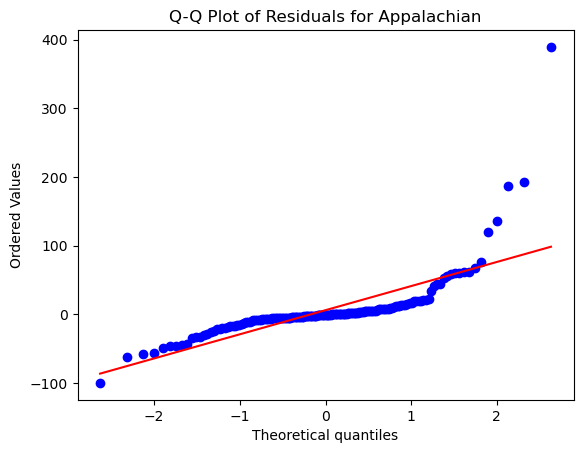

Permian
Number of data points:  481
Number of samples in the training dataset: 360
Best parameters: {'C': 40, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 4106.050815531726
MSE of the model: 3596.0467953047137
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 59.96704757868869
MAE of the best SVR model: 11.59170280496283
-------------------------------
R-squared (Coefficient of Determination): 0.12420791732480507
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  23.96694214876033
±15%:  60.33057851239669
±25%:  74.3801652892562
±50%:  91.73553719008265
-------------------------------
Minimum percentage difference: 0.74%
Maximum percentage difference: 958.72%
-------------------------------
Quantile regres

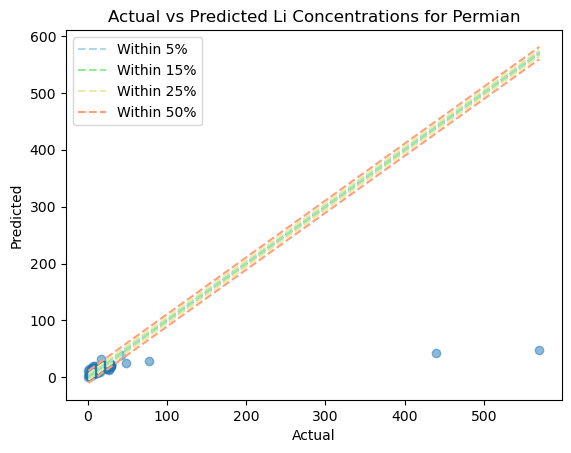

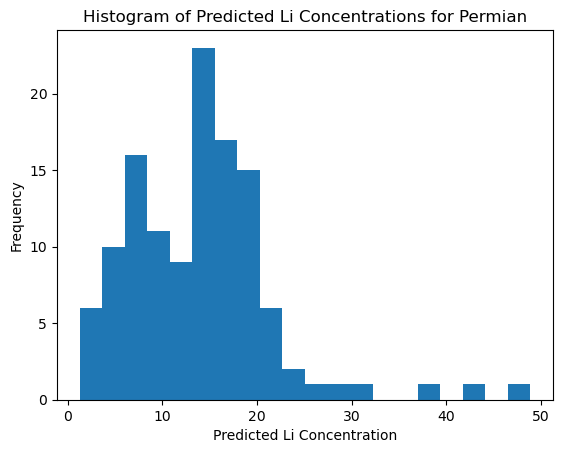

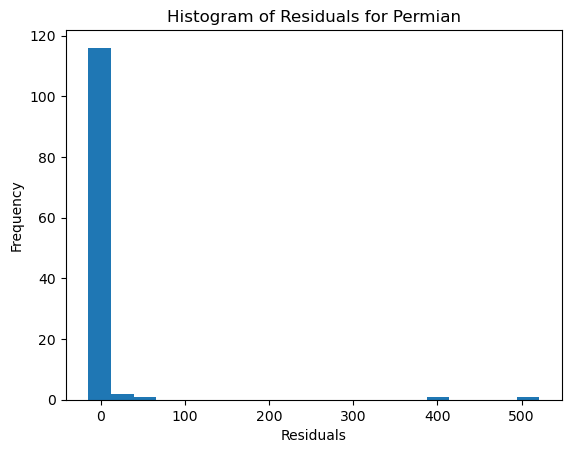

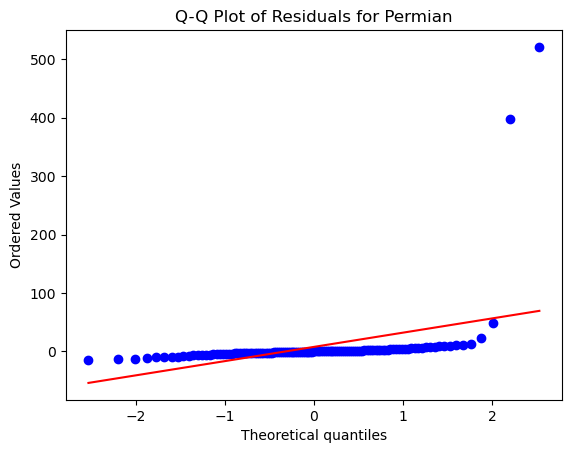

Oklahoma Platform
Number of data points:  254
Number of samples in the training dataset: 190
Best parameters: {'C': 50, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 308.3989183593751
MSE of the model: 188.86267964748413
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 13.742731884435646
MAE of the best SVR model: 10.021034439551059
-------------------------------
R-squared (Coefficient of Determination): 0.38760265226545365
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  10.9375
±15%:  23.4375
±25%:  39.0625
±50%:  67.1875
-------------------------------
Minimum percentage difference: 0.62%
Maximum percentage difference: 342.10%
-------------------------------
Quantile regression loss:
Quantile 0.25: 3

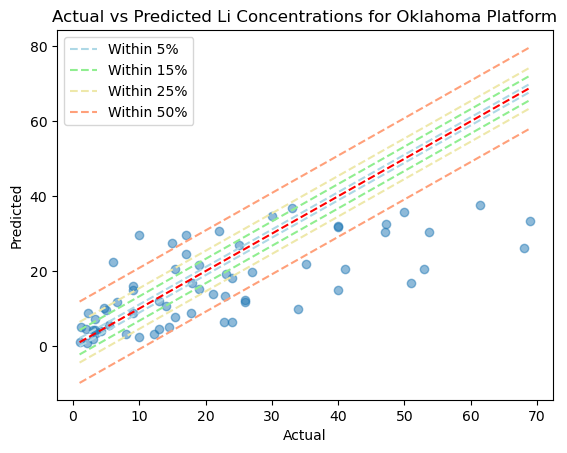

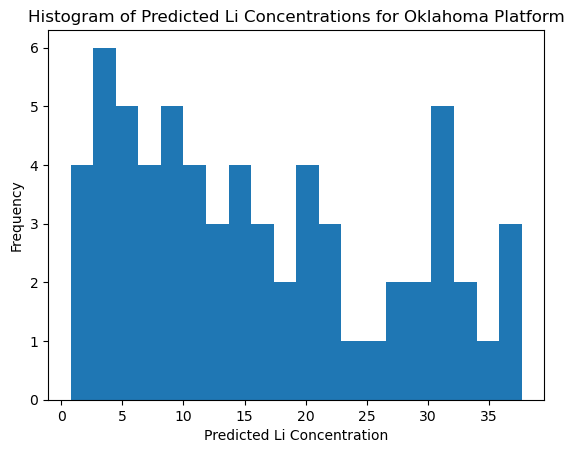

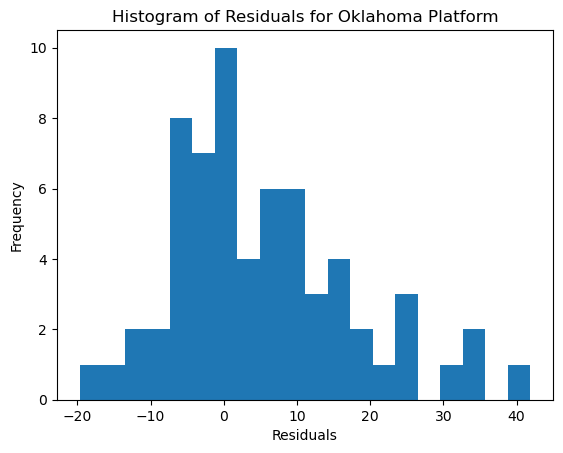

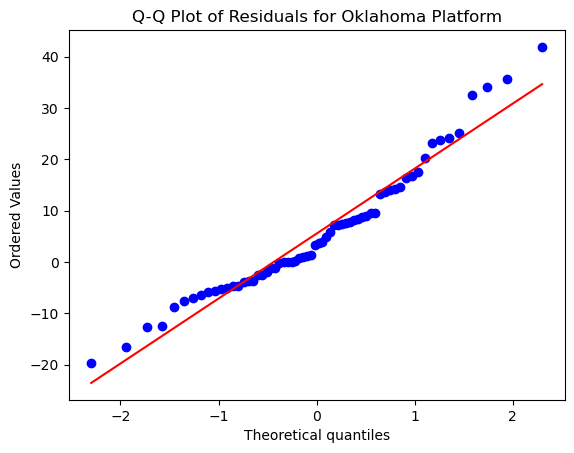

Gulf Coast
Number of data points:  888
Number of samples in the training dataset: 666
Best parameters: {'C': 50, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 19313.61518772352
MSE of the model: 12738.15360949178
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 112.86342901707258
MAE of the best SVR model: 16.686119560893317
-------------------------------
R-squared (Coefficient of Determination): 0.3404573154388705
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  50.0
±15%:  71.62162162162163
±25%:  78.82882882882883
±50%:  91.44144144144144
-------------------------------
Minimum percentage difference: 0.43%
Maximum percentage difference: 1582.19%
-------------------------------
Quantile regression los

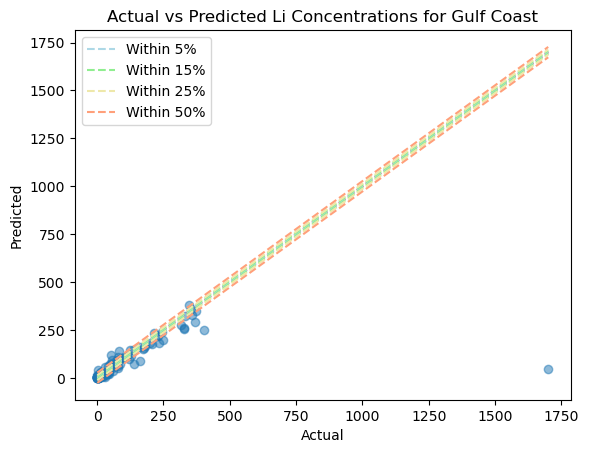

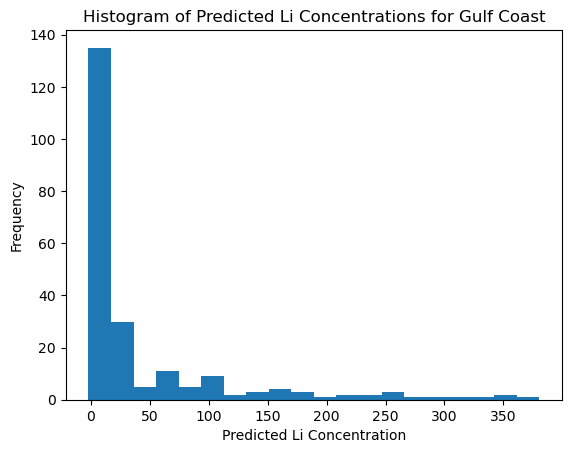

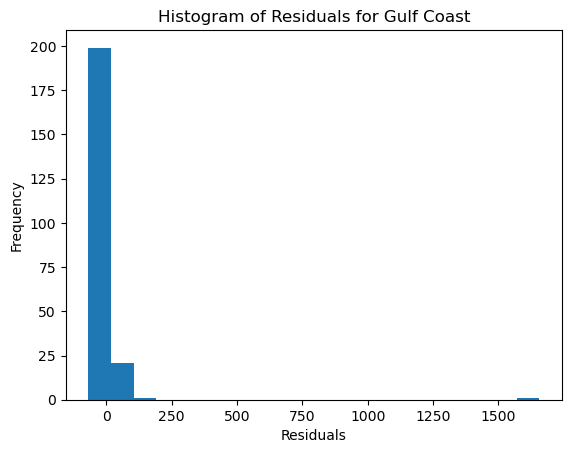

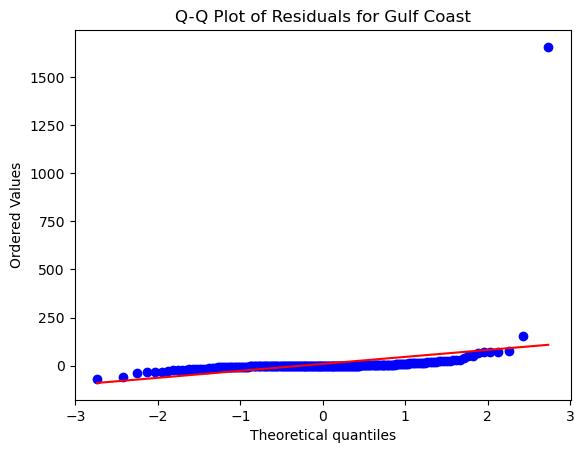

Williston
Number of data points:  502
Number of samples in the training dataset: 376
Best parameters: {'C': 50, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 2013.4464867274216
MSE of the model: 636.5779081638888
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 25.230495598855935
MAE of the best SVR model: 11.43104504834137
-------------------------------
R-squared (Coefficient of Determination): 0.6838366888019168
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  21.428571428571427
±15%:  53.17460317460318
±25%:  65.07936507936508
±50%:  83.33333333333334
-------------------------------
Minimum percentage difference: 0.21%
Maximum percentage difference: 34007.49%
-------------------------------
Quantile 

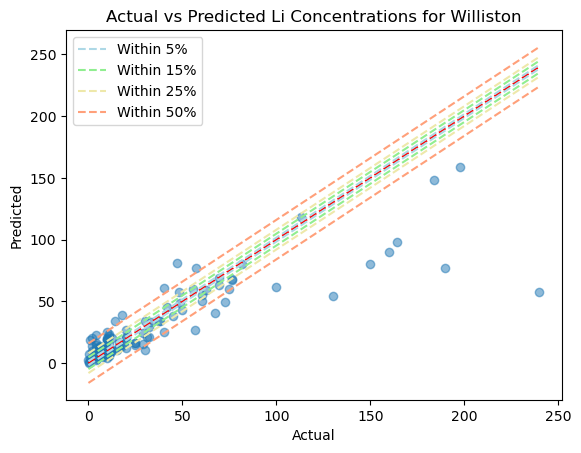

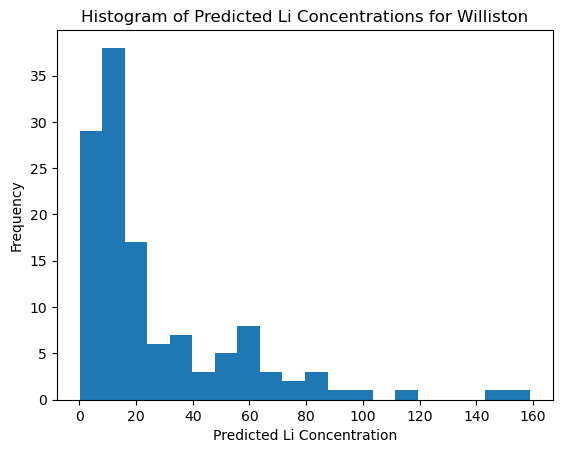

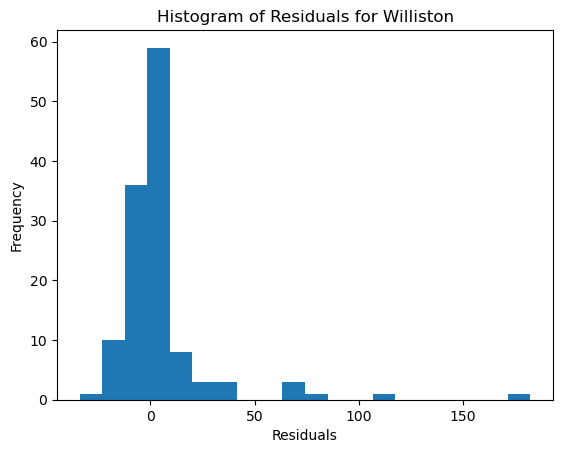

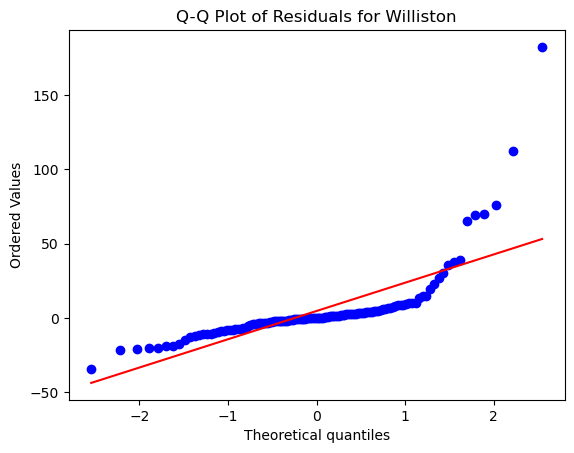

Michigan
Number of data points:  150
Number of samples in the training dataset: 112
Best parameters: {'C': 50, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 338.1750457756233
MSE of the model: 82.22936762080211
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 9.068041002377642
MAE of the best SVR model: 6.7219138679271255
-------------------------------
R-squared (Coefficient of Determination): 0.7568437747019314
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  18.421052631578945
±15%:  34.21052631578947
±25%:  42.10526315789473
±50%:  89.47368421052632
-------------------------------
Minimum percentage difference: 0.48%
Maximum percentage difference: 734.11%
-------------------------------
Quantile regr

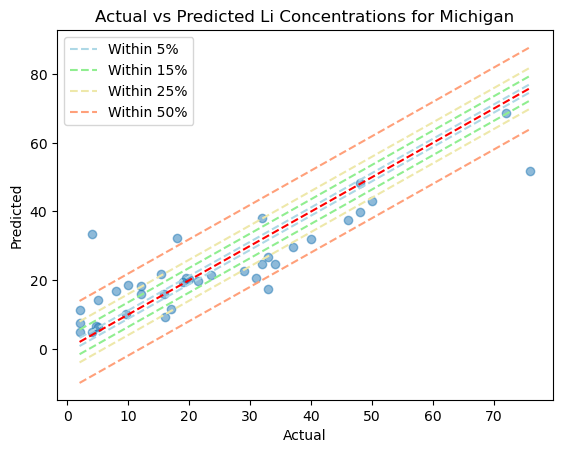

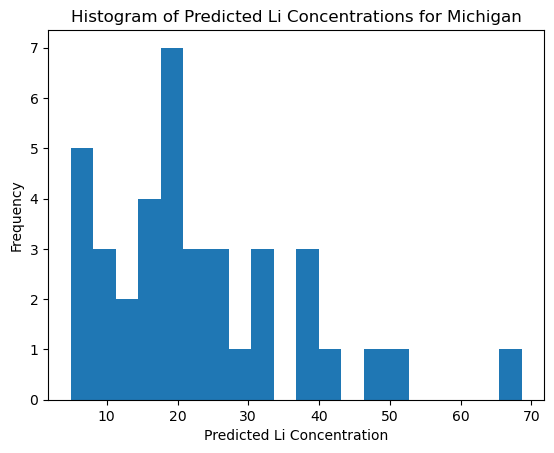

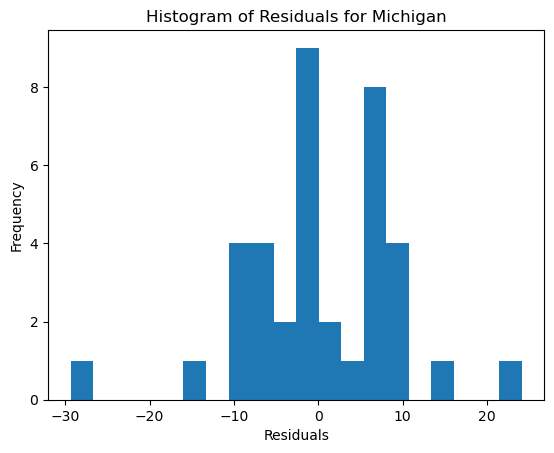

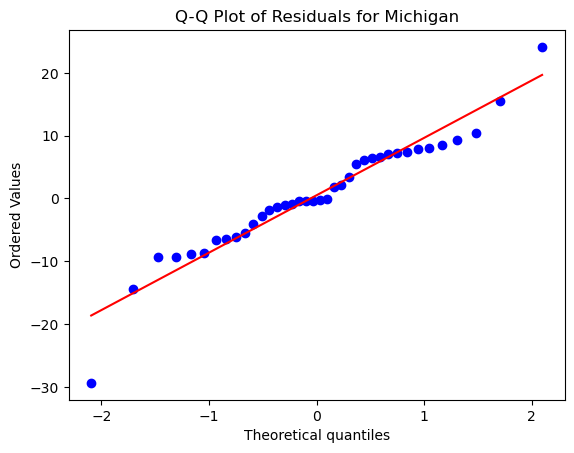

Pacific
Number of data points:  145
Number of samples in the training dataset: 108
Best parameters: {'C': 40, 'epsilon': 0.1, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 8.383484514243975
MSE of the model: 3.104343259869613
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 1.7619146573740776
MAE of the best SVR model: 0.9053667112312077
-------------------------------
R-squared (Coefficient of Determination): 0.6297072828613004
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  18.91891891891892
±15%:  40.54054054054054
±25%:  62.16216216216216
±50%:  81.08108108108108
-------------------------------
Minimum percentage difference: 1.97%
Maximum percentage difference: 3939.56%
-------------------------------
Quantile regr

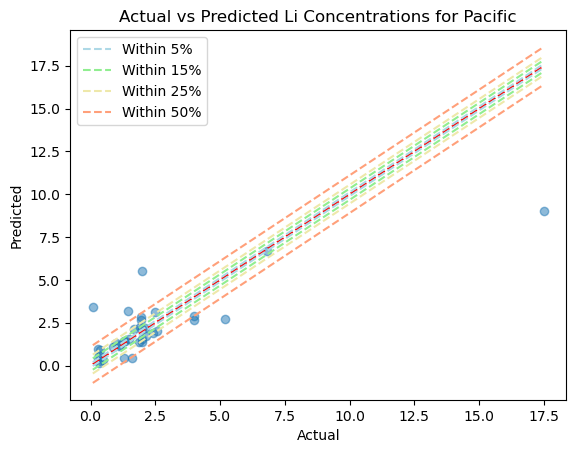

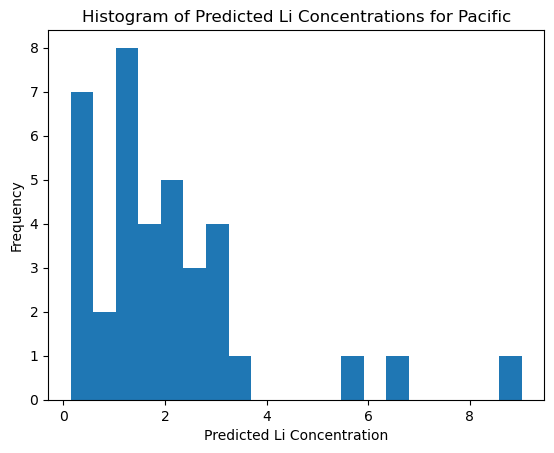

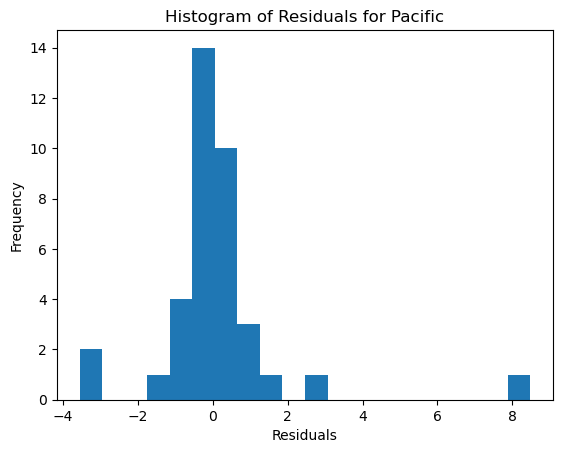

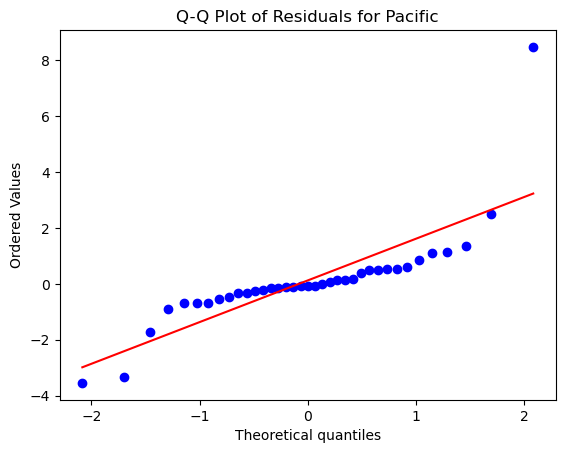

Illinois
Number of data points:  25
Number of samples in the training dataset: 18
Best parameters: {'C': 10, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 155.8923551020408
MSE of the model: 96.77128627209102
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 9.83723976896421
MAE of the best SVR model: 6.848943613907979
-------------------------------
R-squared (Coefficient of Determination): 0.3792428999565216
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  14.285714285714285
±15%:  28.57142857142857
±25%:  57.14285714285714
±50%:  71.42857142857143
-------------------------------
Minimum percentage difference: 11.91%
Maximum percentage difference: 143.24%
-------------------------------
Quantile regress

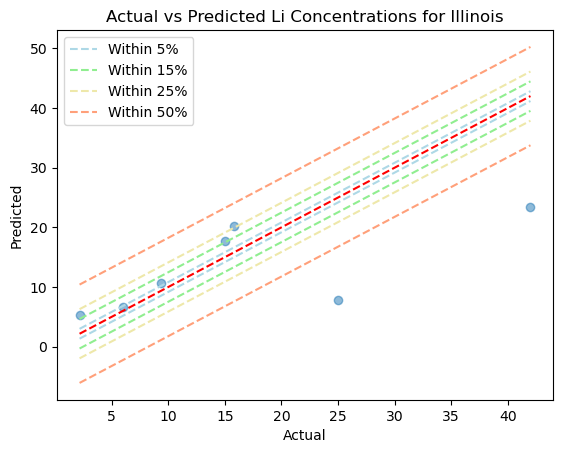

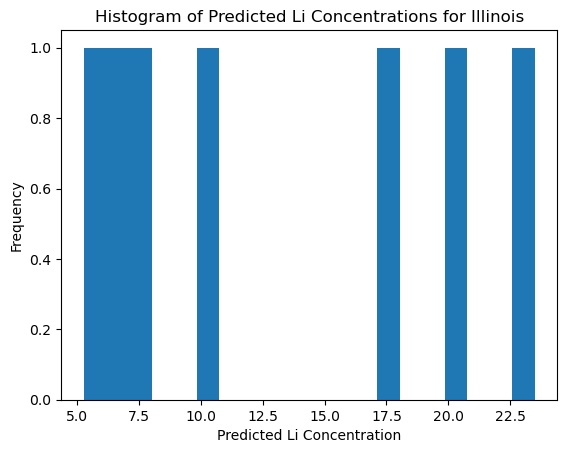

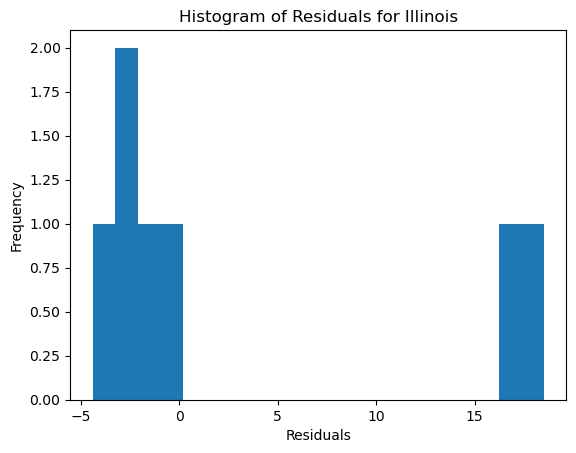

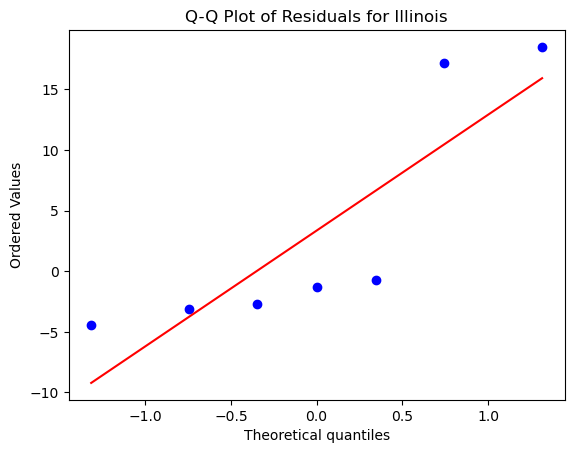

Great Plains
Number of data points:  62
Number of samples in the training dataset: 46
Best parameters: {'C': 50, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 30765.013448437494
MSE of the model: 32538.535313278917
The model's MSE is close to or larger than the variance of the target variable.
The model's performance may be limited compared to the variability of the target variable.
RMSE of the model: 180.384409839872
MAE of the best SVR model: 47.05810338498997
-------------------------------
R-squared (Coefficient of Determination): -0.057647361923435
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  56.25
±15%:  93.75
±25%:  93.75
±50%:  93.75
-------------------------------
Minimum percentage difference: 3.80%
Maximum percentage difference: 149.00%
-------------------------------
Quantile regression loss:
Quantile 0.25: 0.654

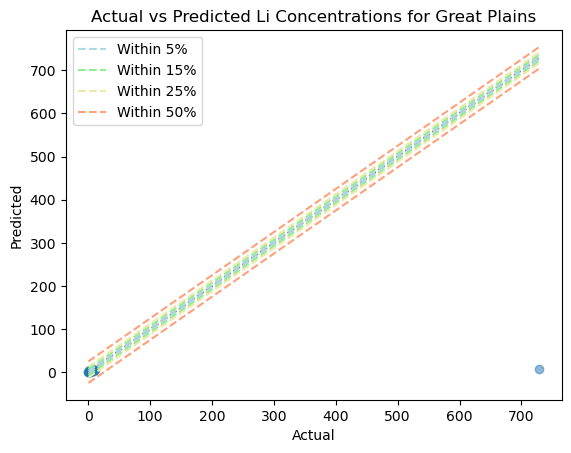

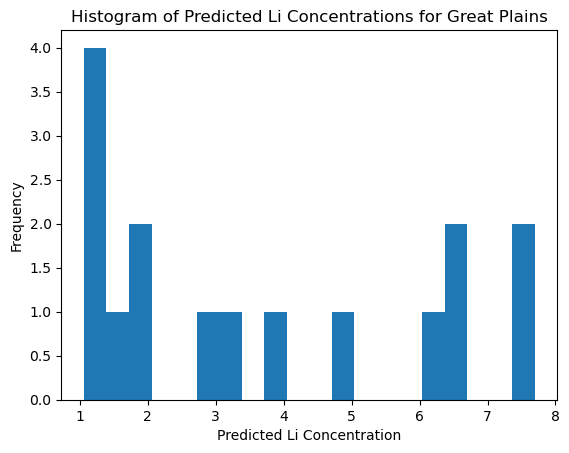

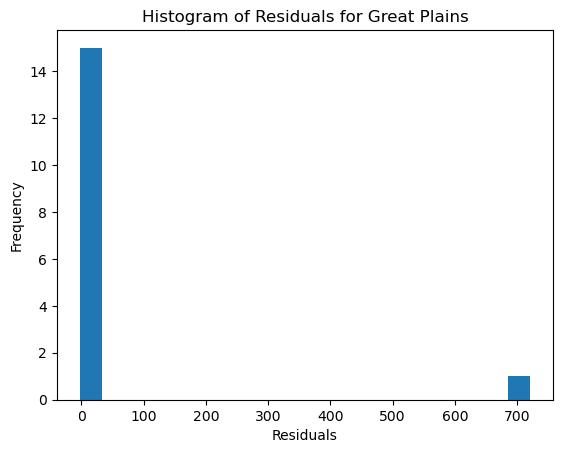

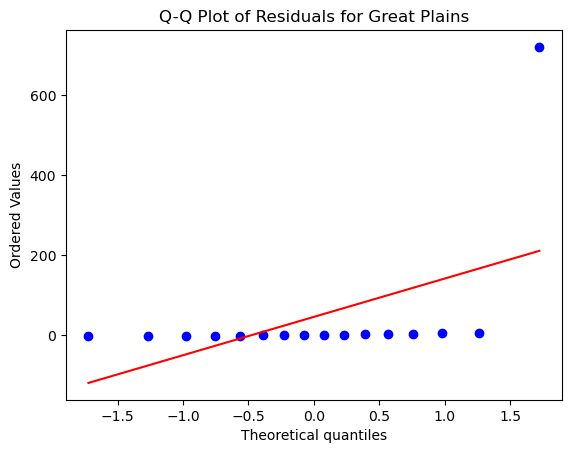

Anadarko
Number of data points:  262
Number of samples in the training dataset: 196
Best parameters: {'C': 50, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 8090.751883310373
MSE of the model: 5006.119174031974
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 70.75393398272617
MAE of the best SVR model: 18.481689257000955
-------------------------------
R-squared (Coefficient of Determination): 0.38125414717529404
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  37.878787878787875
±15%:  63.63636363636363
±25%:  72.72727272727273
±50%:  81.81818181818183
-------------------------------
Minimum percentage difference: 0.35%
Maximum percentage difference: 984.76%
-------------------------------
Quantile reg

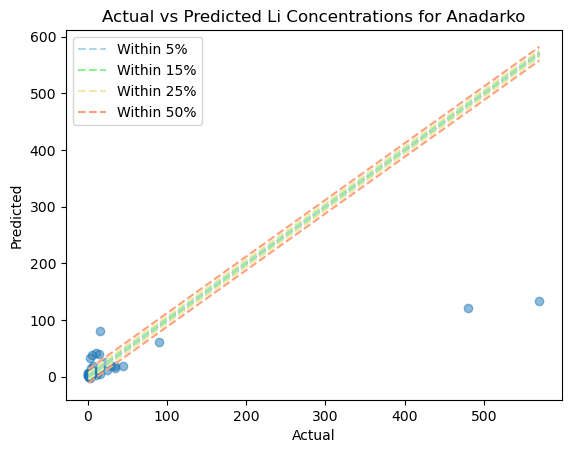

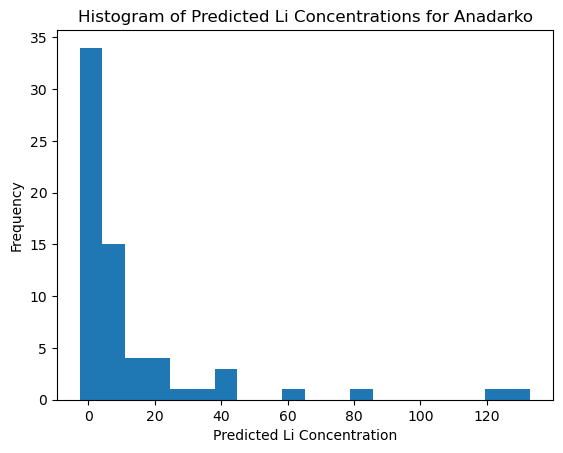

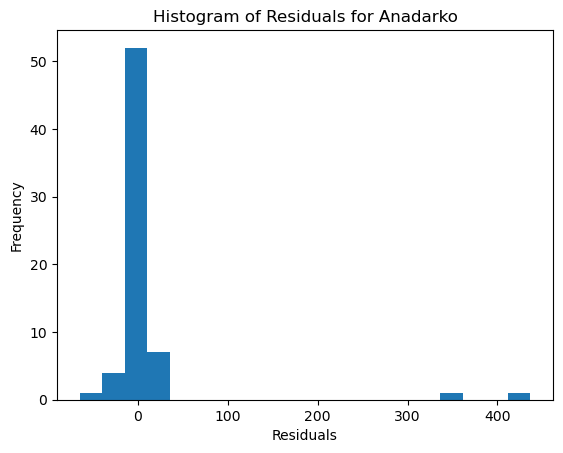

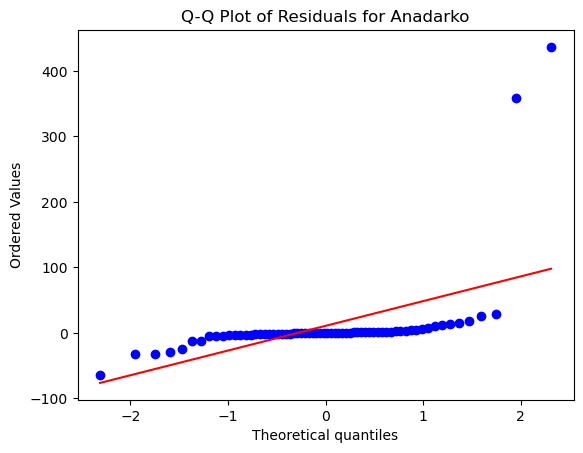

Rocky Mountain
Number of data points:  693
Number of samples in the training dataset: 519
Best parameters: {'C': 50, 'epsilon': 0.3, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 175.57252920134746
MSE of the model: 46.52555538140712
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 6.820964402590525
MAE of the best SVR model: 2.9778145862129692
-------------------------------
R-squared (Coefficient of Determination): 0.7350066346196372
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  13.218390804597702
±15%:  40.804597701149426
±25%:  59.195402298850574
±50%:  81.60919540229885
-------------------------------
Minimum percentage difference: 0.27%
Maximum percentage difference: 1961.43%
-------------------------------
Qua

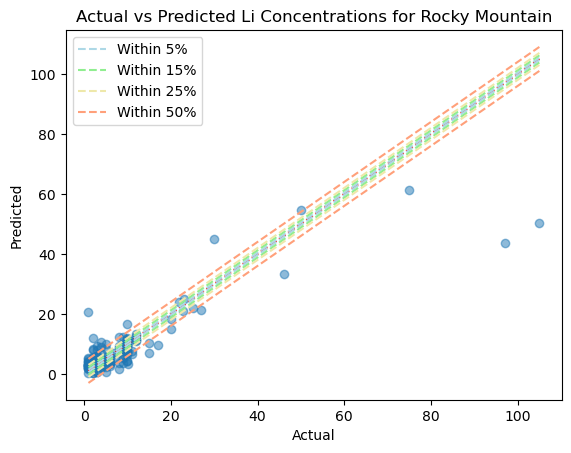

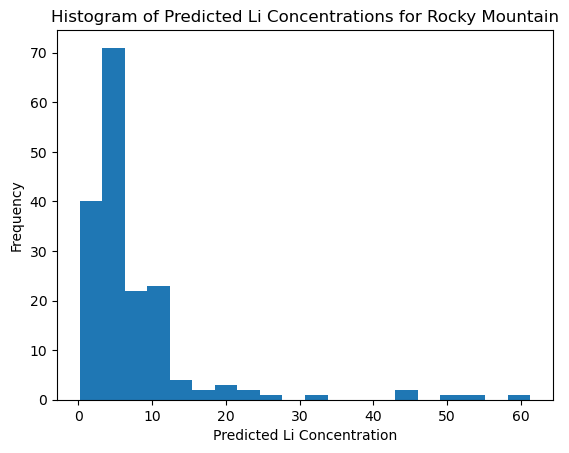

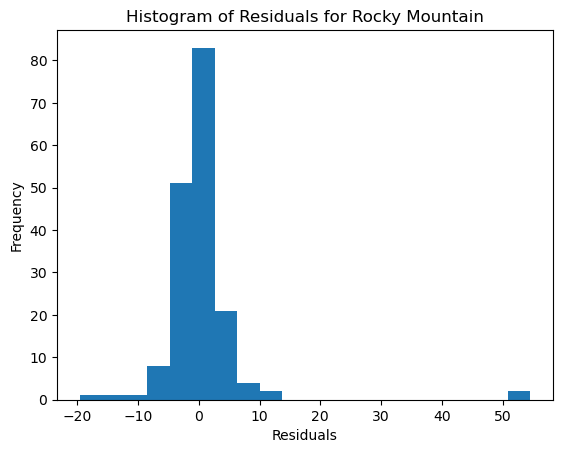

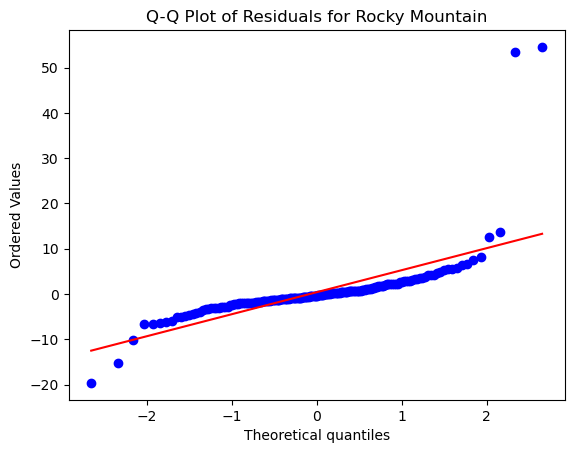

Fort Worth
Number of data points:  17
Number of samples in the training dataset: 12
Best parameters: {'C': 20, 'epsilon': 0.1, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 1038.8281839999997
MSE of the model: 988.5882712732646
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 31.44182359967794
MAE of the best SVR model: 17.147743533729717
-------------------------------
R-squared (Coefficient of Determination): 0.04836210020148546
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  0.0
±15%:  40.0
±25%:  60.0
±50%:  80.0
-------------------------------
Minimum percentage difference: 79.37%
Maximum percentage difference: 278.65%
-------------------------------
Quantile regression loss:
Quantile 0.25: 2.271593850558548
Quant

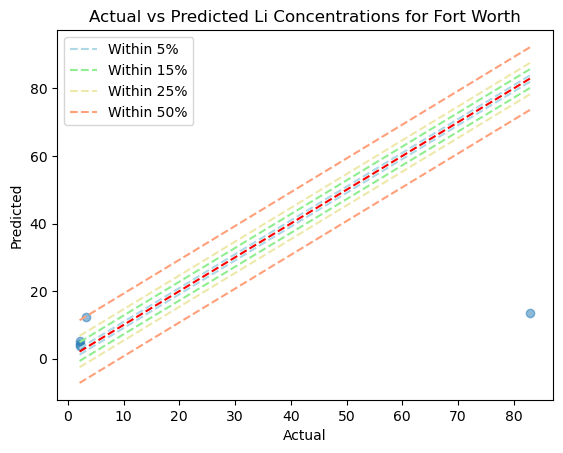

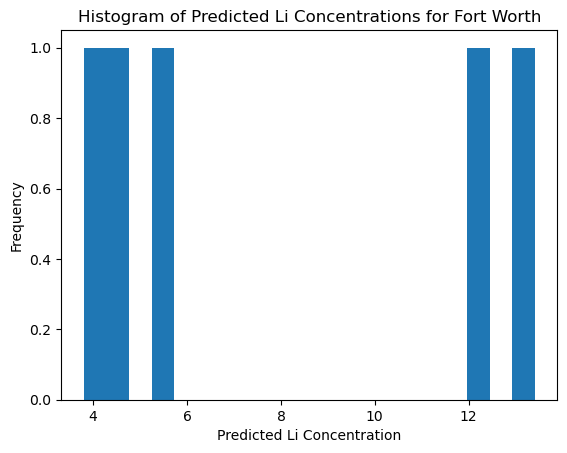

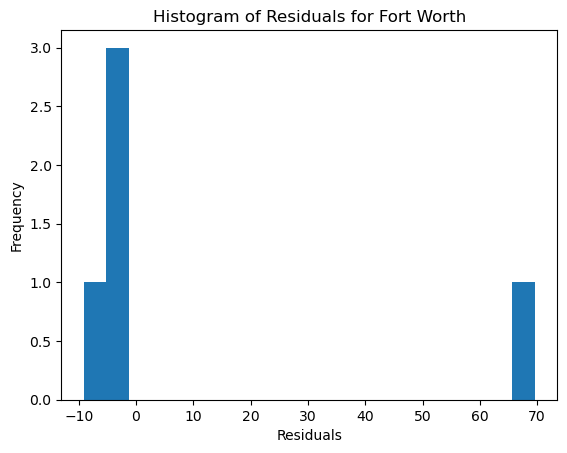

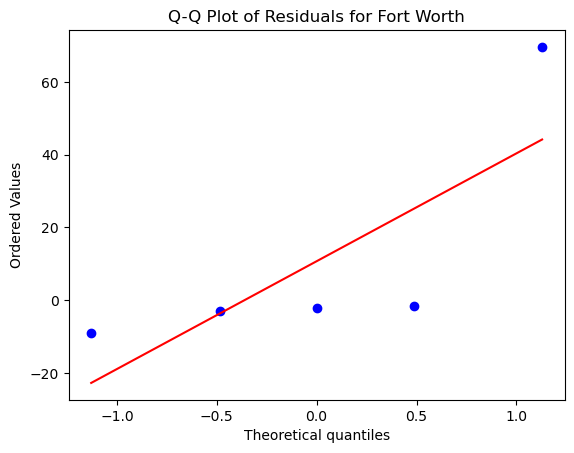

,round,basin,data_row_count,feature_quantity,feature_list,kernel_options,best_kernel,c_options,best_c,epsilon_options,...,within_5_percent,within_15_percent,within_25_percent,within_50_percent,results_min%_difference,results_max%_difference,0.25_quantile_loss,0.5_quantile_loss,0.75_quantile_loss,cross_val_mse
8,07_pca,Great Plains,62,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly]",rbf,"[10, 20, 30, 40, 50]",50,"[0.1, 0.2, 0.3, 0.4, 0.5]",...,56.25,93.75,93.75,93.75,3.80,149.00,0.65,2.08,3.35,5.56
3,07_pca,Gulf Coast,888,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly]",rbf,"[10, 20, 30, 40, 50]",50,"[0.1, 0.2, 0.3, 0.4, 0.5]",...,50.00,71.62,78.83,91.44,0.43,1582.19,0.96,2.71,10.40,4753.40
9,07_pca,Anadarko,262,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly]",rbf,"[10, 20, 30, 40, 50]",50,"[0.1, 0.2, 0.3, 0.4, 0.5]",...,37.88,63.64,72.73,81.82,0.35,984.76,0.80,1.60,7.21,8536.04
1,07_pca,Permian,481,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly]",rbf,"[10, 20, 30, 40, 50]",40,"[0.1, 0.2, 0.3, 0.4, 0.5]",...,23.97,60.33,74.38,91.74,0.74,958.72,1.11,2.32,5.40,1121.38
0,07_pca,Appalachian,652,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly]",rbf,"[10, 20, 30, 40, 50]",50,"[0.1, 0.2, 0.3, 0.4, 0.5]",...,25.15,59.51,69.94,82.82,0.12,4837.35,3.34,7.10,19.83,3154.81
4,07_pca,Williston,502,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly]",rbf,"[10, 20, 30, 40, 50]",50,"[0.1, 0.2, 0.3, 0.4, 0.5]",...,21.43,53.17,65.08,83.33,0.21,34007.49,2.00,4.23,10.41,2180.59
10,07_pca,Rocky Mountain,693,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly]",rbf,"[10, 20, 30, 40, 50]",50,"[0.1, 0.2, 0.3, 0.4, 0.5]",...,13.22,40.80,59.20,81.61,0.27,1961.43,0.71,1.61,3.13,76.49
6,07_pca,Pacific,145,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly]",rbf,"[10, 20, 30, 40, 50]",40,"[0.1, 0.2, 0.3, 0.4, 0.5]",...,18.92,40.54,62.16,81.08,1.97,3939.56,0.15,0.48,0.85,1.96
11,07_pca,Fort Worth,17,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly]",rbf,"[10, 20, 30, 40, 50]",20,"[0.1, 0.2, 0.3, 0.4, 0.5]",...,0.00,40.00,60.00,80.00,79.37,278.65,2.27,3.11,9.08,76.18
5,07_pca,Michigan,150,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly]",rbf,"[10, 20, 30, 40, 50]",50,"[0.1, 0.2, 0.3, 0.4, 0.5]",...,18.42,34.21,42.11,89.47,0.48,734.11,1.93,6.43,8.63,177.71


In [52]:
# Define all the variables...
round = '07_pca'
test_size = 0.25
random_state = 42
kernel_values = ['rbf', 'poly']
c_values = [10, 20, 30, 40, 50]
epsilon_values = [0.1, 0.2, 0.3, 0.4, 0.5]

# Run the function...
df_round07_pca = generate_svr_models_by_basin(df=df, round=round, basins=basins, categorical_columns=categorical_columns, 
                                              test_size=test_size, random_state=random_state, kernel_values=kernel_values, 
                                              c_values=c_values, epsilon_values=epsilon_values)
df_round07_pca

### INPUT: Base df (w/ imputed values) (w/ categorical columns)

In [53]:
# Define the input df for this section
df = df_with_imputed.copy()

# Drop the 'IDUSGS' column as it is not needed
columns_to_drop = ['IDUSGS', 'API', 'DATESAMPLE']
df.drop(columns_to_drop, axis=1, inplace=True)

# Define variables that are common to all rounds
basins = df['BASIN_CATEGORY'].unique()
categorical_columns = ['PLAYTYPE', 'WELLTYPE', 'FORMSIMPLE', 'STATE', 'COUNTY', 
                       'PROVINCE', 'REGION', 'WELLNAME', 'PERIOD']

#### ROUND 1

Appalachian
Number of data points:  71
Number of samples in the training dataset: 49
Best parameters: {'C': 10, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 1270.1135743801653
MSE of the model: 1343.8350401120117
The model's MSE is close to or larger than the variance of the target variable.
The model's performance may be limited compared to the variability of the target variable.
RMSE of the model: 36.658355665687075
MAE of the best SVR model: 23.44240691426434
-------------------------------
R-squared (Coefficient of Determination): -0.058043207488608806
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  4.545454545454546
±15%:  31.818181818181817
±25%:  45.45454545454545
±50%:  59.09090909090909
-------------------------------
Minimum percentage difference: 11.66%
Maximum percentage difference: 101.24%
------------------------

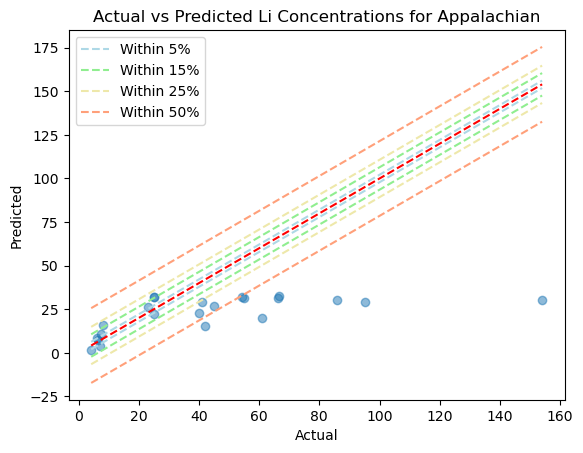

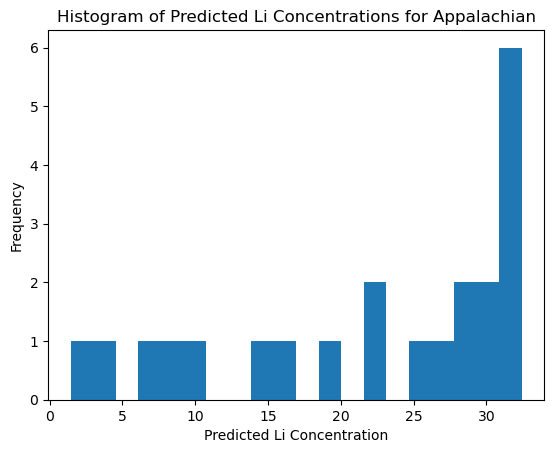

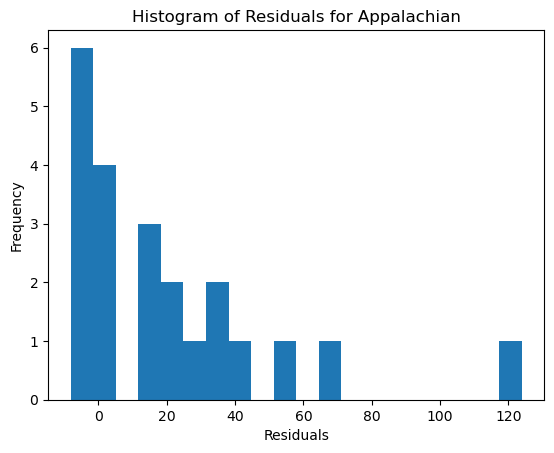

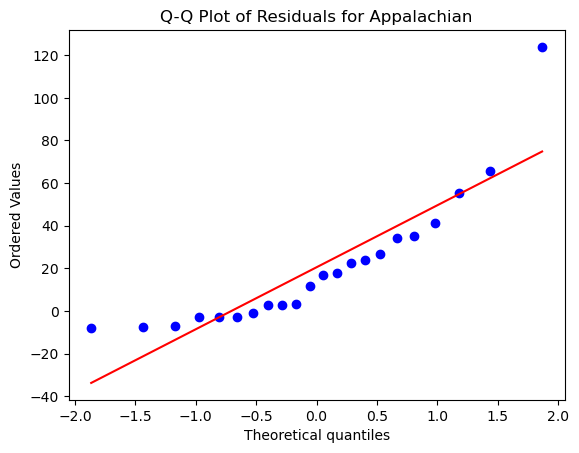

Permian
Number of data points:  184
Number of samples in the training dataset: 128
Best parameters: {'C': 10, 'epsilon': 0.01, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 79.06179170918368
MSE of the model: 67.60536006086872
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 8.222247871529337
MAE of the best SVR model: 5.900914486785511
-------------------------------
R-squared (Coefficient of Determination): 0.1449047814455765
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  7.142857142857142
±15%:  25.0
±25%:  35.714285714285715
±50%:  58.92857142857143
-------------------------------
Minimum percentage difference: 0.98%
Maximum percentage difference: 1391.27%
-------------------------------
Quantile regression loss:


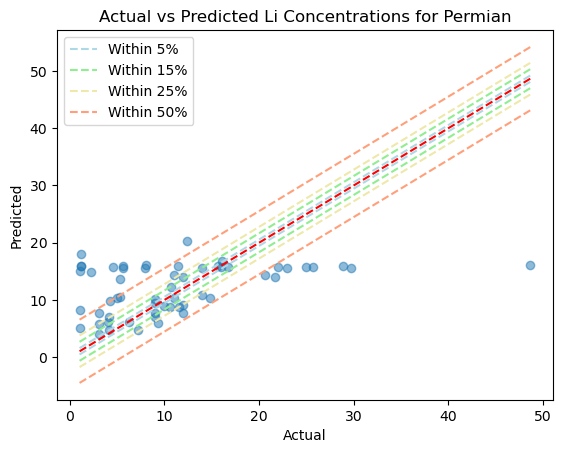

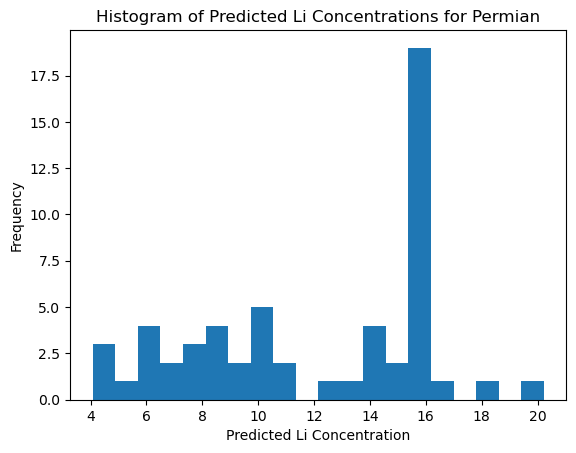

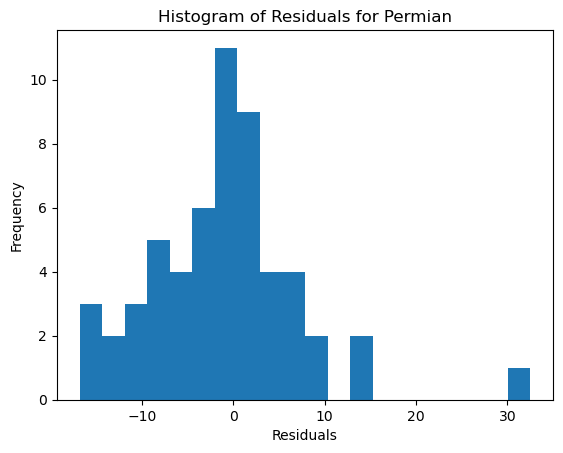

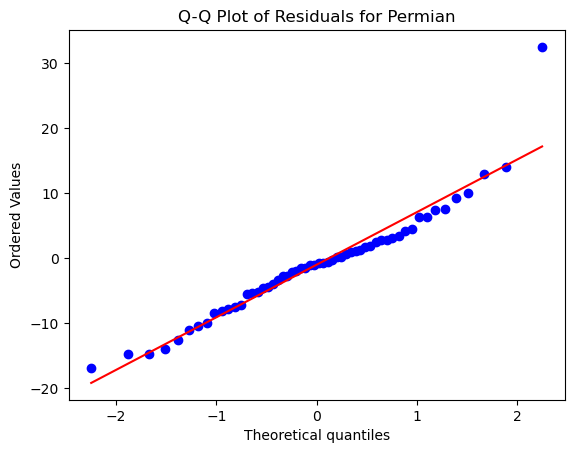

Oklahoma Platform
Number of data points:  105
Number of samples in the training dataset: 73
Best parameters: {'C': 0.1, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 106.31090615234375
MSE of the model: 108.59519941331726
The model's MSE is close to or larger than the variance of the target variable.
The model's performance may be limited compared to the variability of the target variable.
RMSE of the model: 10.420902044128294
MAE of the best SVR model: 8.923522800361743
-------------------------------
R-squared (Coefficient of Determination): -0.021486913653996353
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  0.0
±15%:  6.25
±25%:  12.5
±50%:  31.25
-------------------------------
Minimum percentage difference: 10.15%
Maximum percentage difference: 1157.92%
-------------------------------
Quantile regression loss:
Quantile 0

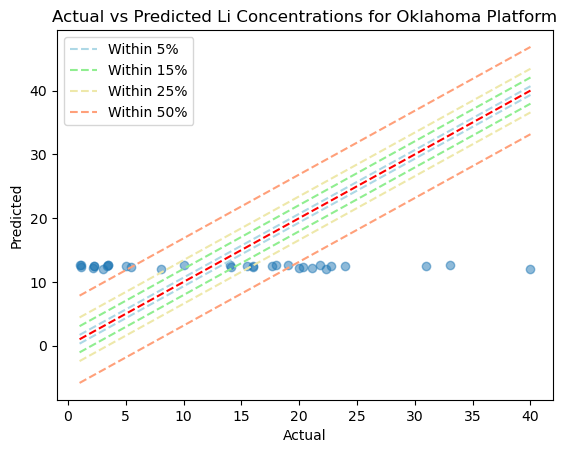

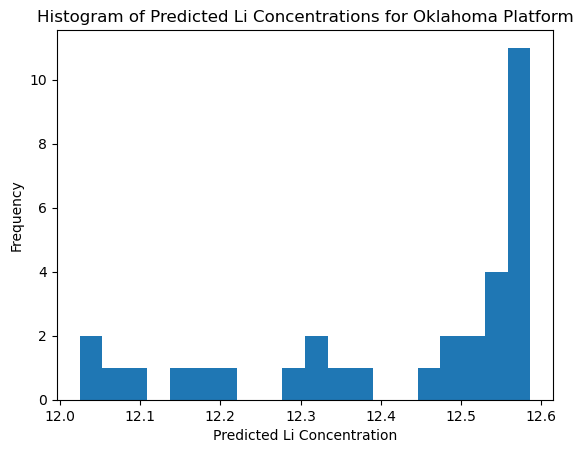

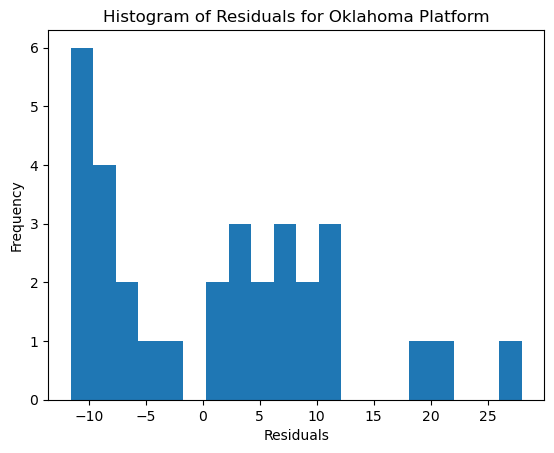

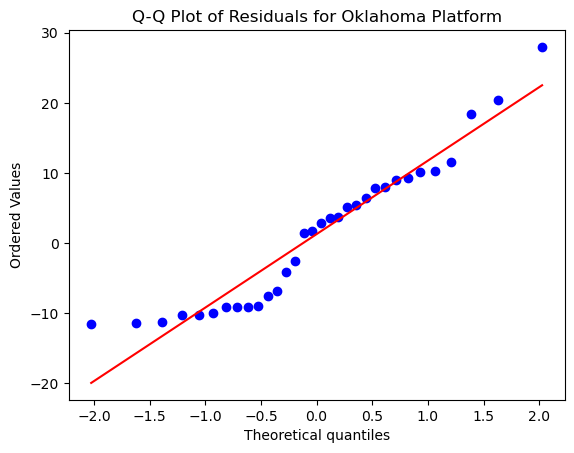

Gulf Coast
Number of data points:  222
Number of samples in the training dataset: 155
Best parameters: {'C': 10, 'epsilon': 0.01, 'kernel': 'poly'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 54595.38489329473
MSE of the model: 48566.59675470415
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 220.3783037295281
MAE of the best SVR model: 73.74080431443905
-------------------------------
R-squared (Coefficient of Determination): 0.11042669907673841
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  38.80597014925373
±15%:  64.17910447761194
±25%:  70.1492537313433
±50%:  74.6268656716418
-------------------------------
Minimum percentage difference: 0.87%
Maximum percentage difference: 3534.70%
-------------------------------
Quantile re

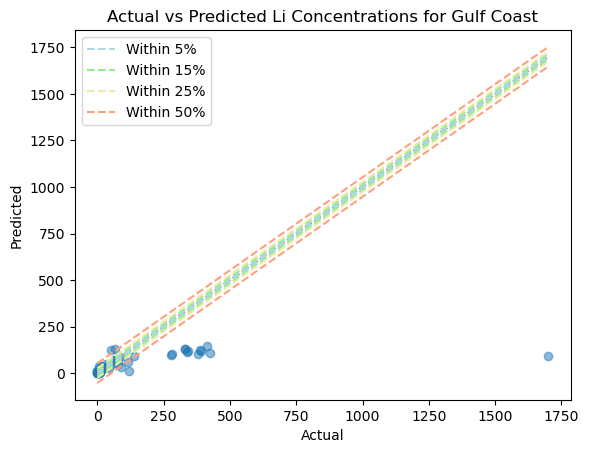

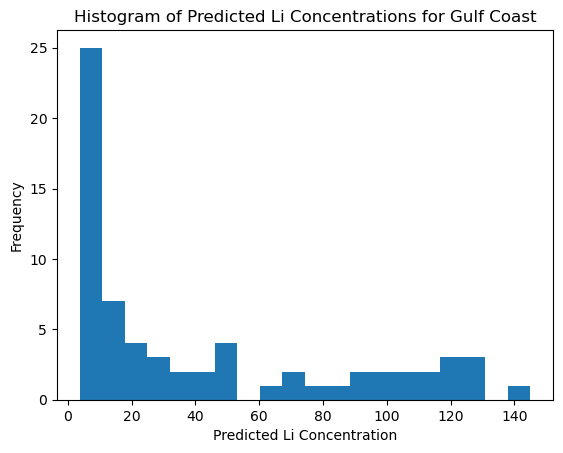

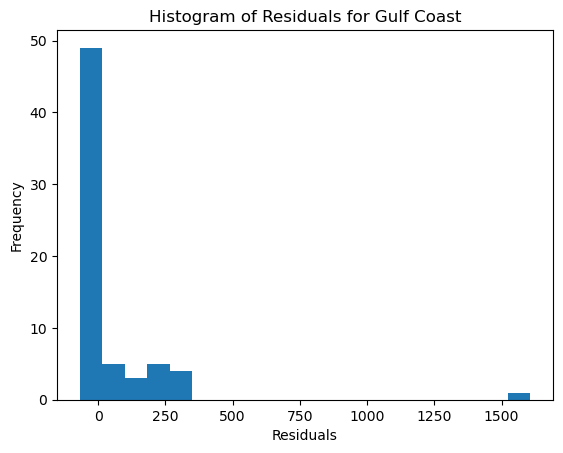

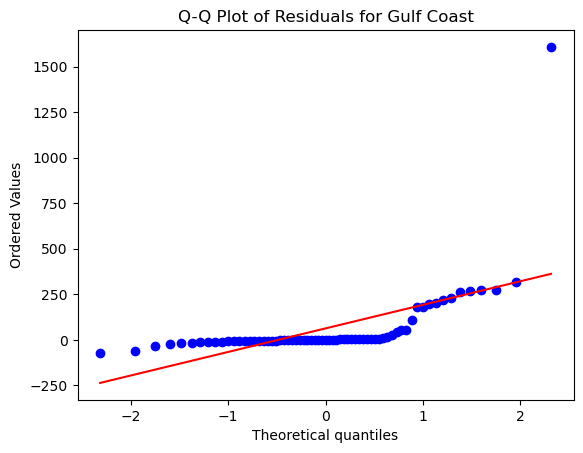

Williston
Number of data points:  269
Number of samples in the training dataset: 188
Best parameters: {'C': 10, 'epsilon': 0.01, 'kernel': 'poly'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 5247.220916323734
MSE of the model: 5731.7413894198
The model's MSE is close to or larger than the variance of the target variable.
The model's performance may be limited compared to the variability of the target variable.
RMSE of the model: 75.70826500072367
MAE of the best SVR model: 29.05786661833547
-------------------------------
R-squared (Coefficient of Determination): -0.09233849323720289
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  39.50617283950617
±15%:  58.0246913580247
±25%:  75.30864197530865
±50%:  80.24691358024691
-------------------------------
Minimum percentage difference: 0.03%
Maximum percentage difference: 366.87%
-------------------------------

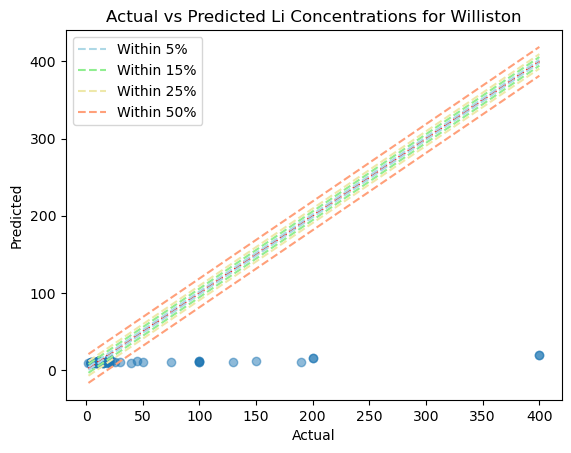

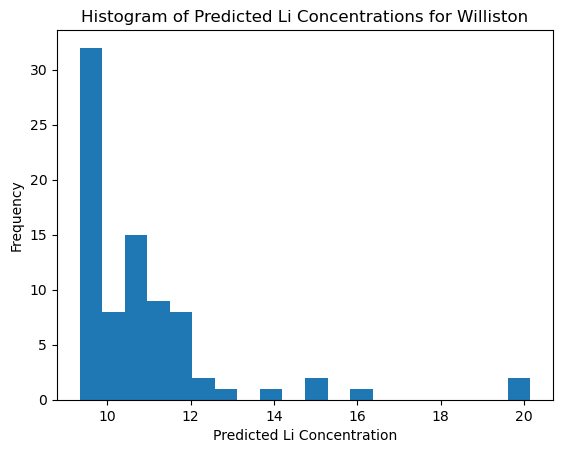

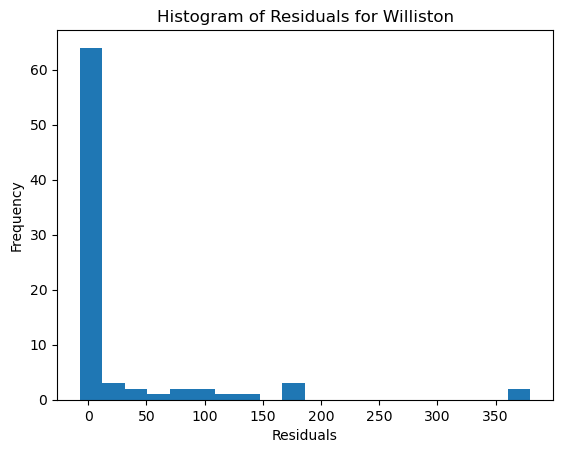

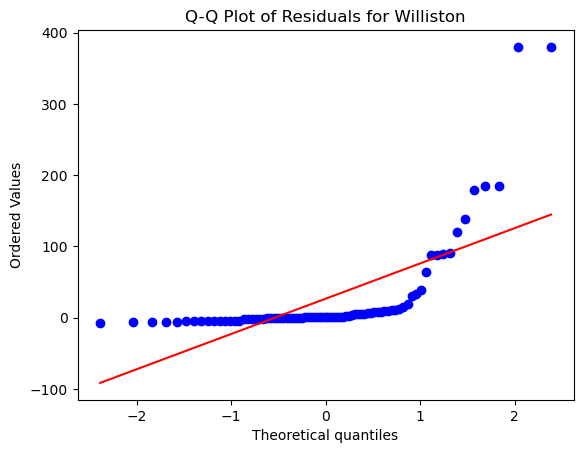

Michigan
Number of data points:  52
Number of samples in the training dataset: 36
Best parameters: {'C': 10, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 49.40038749999999
MSE of the model: 25.188814628844682
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 5.018845945916719
MAE of the best SVR model: 3.3354374173260704
-------------------------------
R-squared (Coefficient of Determination): 0.4901089666787597
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  43.75
±15%:  56.25
±25%:  56.25
±50%:  75.0
-------------------------------
Minimum percentage difference: 0.86%
Maximum percentage difference: 113.40%
-------------------------------
Quantile regression loss:
Quantile 0.25: 0.34376524890582516
Qua

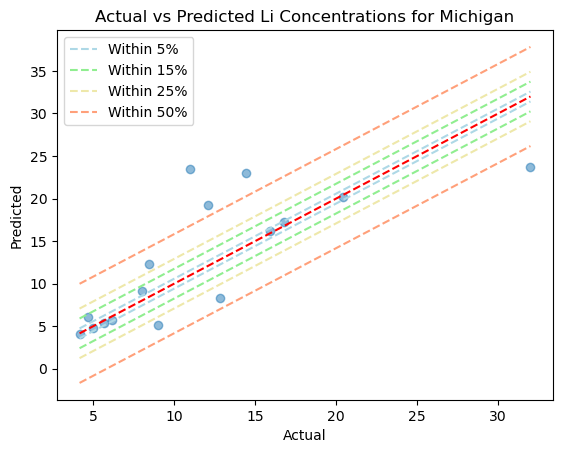

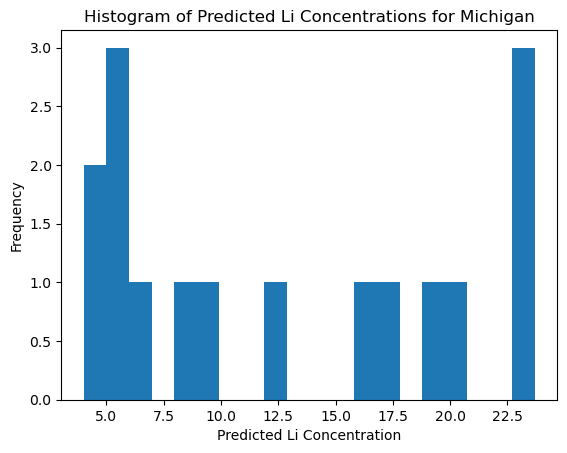

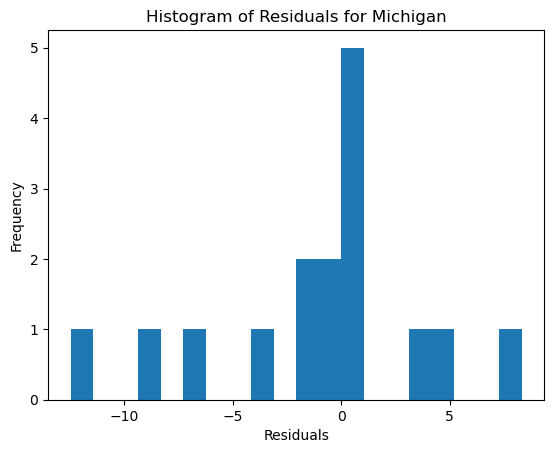

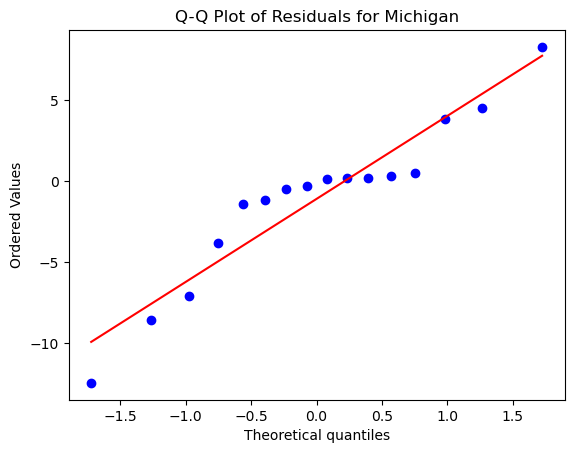

Pacific
Number of data points:  62
Number of samples in the training dataset: 43
Best parameters: {'C': 10, 'epsilon': 0.1, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 0.3101218836565098
MSE of the model: 0.13468238650377562
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 0.3669909896765527
MAE of the best SVR model: 0.2516567498930531
-------------------------------
R-squared (Coefficient of Determination): 0.5657114392709237
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  31.57894736842105
±15%:  63.1578947368421
±25%:  73.68421052631578
±50%:  89.47368421052632
-------------------------------
Minimum percentage difference: 2.09%
Maximum percentage difference: 59.46%
-------------------------------
Quantile regres

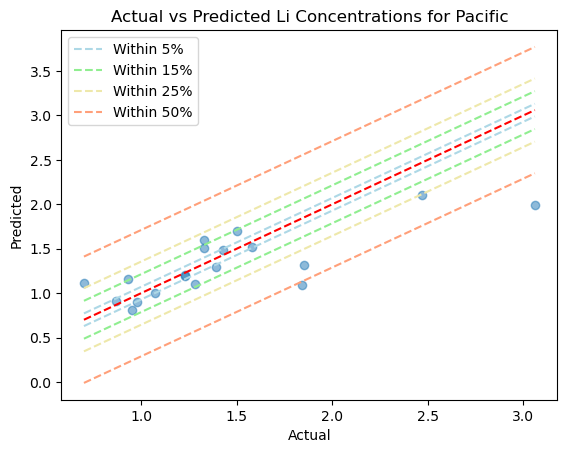

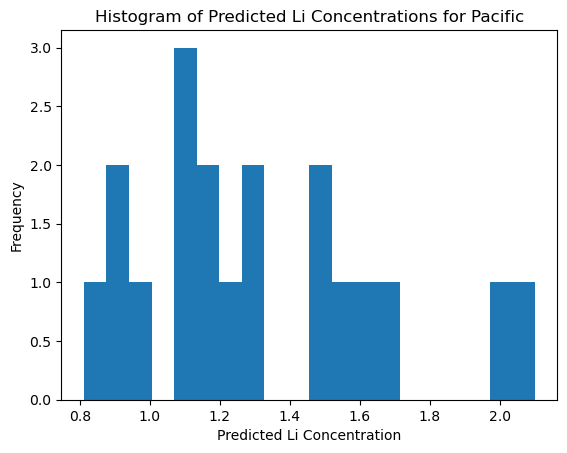

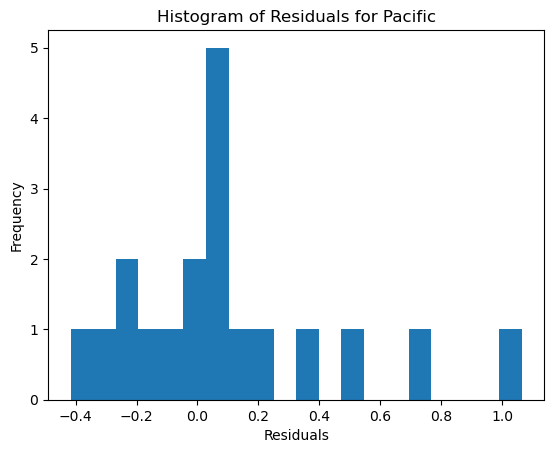

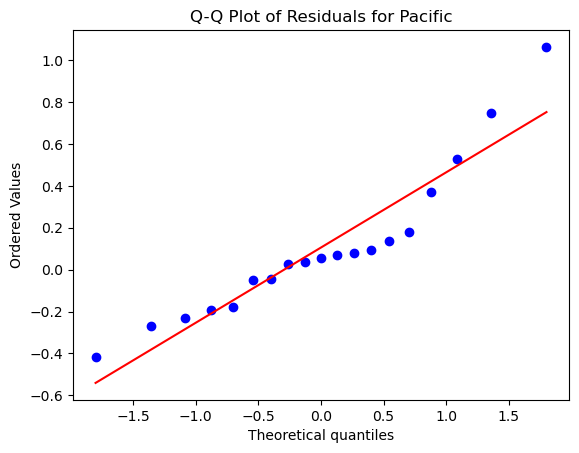

Illinois
Number of data points:  6
Number of samples in the training dataset: 4
Best parameters: {'C': 0.1, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 398.601225
MSE of the model: 622.6086098146226
The model's MSE is close to or larger than the variance of the target variable.
The model's performance may be limited compared to the variability of the target variable.
RMSE of the model: 24.952126358581598
MAE of the best SVR model: 19.929707542864428
-------------------------------
R-squared (Coefficient of Determination): -0.5619836838550172
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  0.0
±15%:  0.0
±25%:  50.0
±50%:  50.0
-------------------------------
Minimum percentage difference: 83.20%
Maximum percentage difference: 237.48%
-------------------------------
Quantile regression loss:
Quantile 0.25: 12.422787950406487
Q

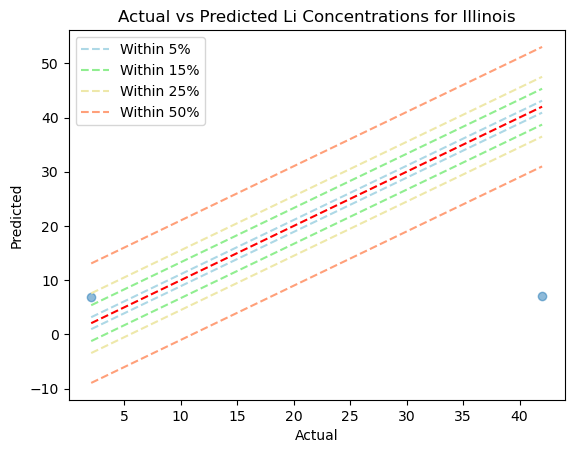

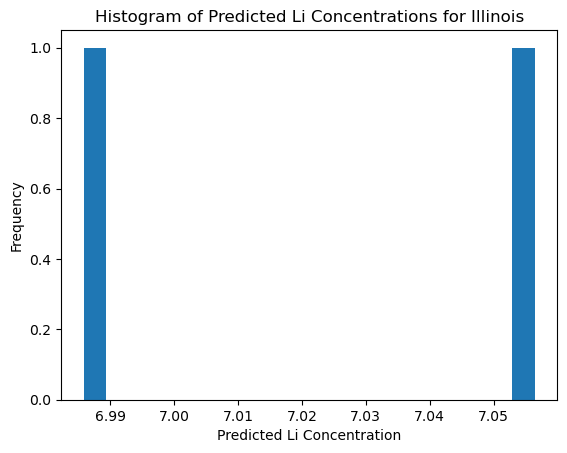

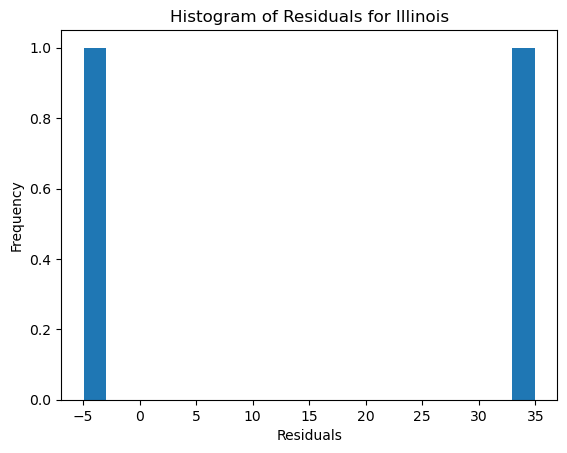

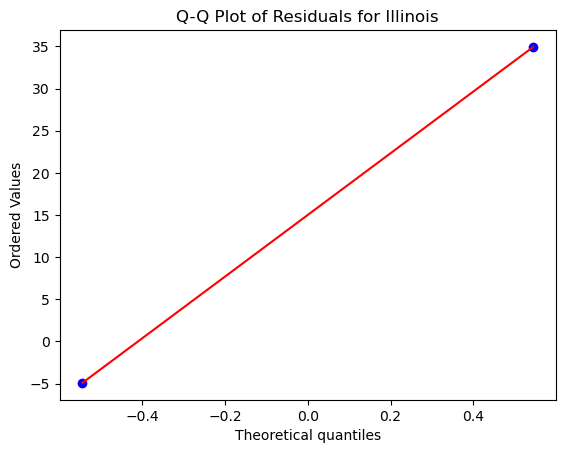

Great Plains
Number of data points:  29
Number of samples in the training dataset: 20
Best parameters: {'C': 10, 'epsilon': 0.01, 'kernel': 'poly'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 51631.32033580248
MSE of the model: 58411.35786303622
The model's MSE is close to or larger than the variance of the target variable.
The model's performance may be limited compared to the variability of the target variable.
RMSE of the model: 241.6844179152562
MAE of the best SVR model: 83.02172208104834
-------------------------------
R-squared (Coefficient of Determination): -0.13131636927232115
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  66.66666666666666
±15%:  88.88888888888889
±25%:  88.88888888888889
±50%:  88.88888888888889
-------------------------------
Minimum percentage difference: 11.87%
Maximum percentage difference: 118.41%
--------------------------

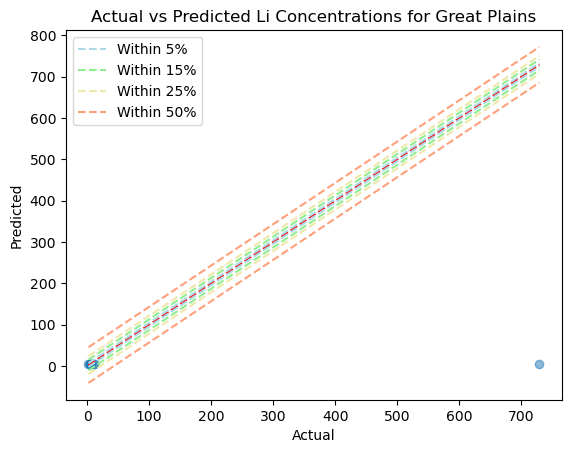

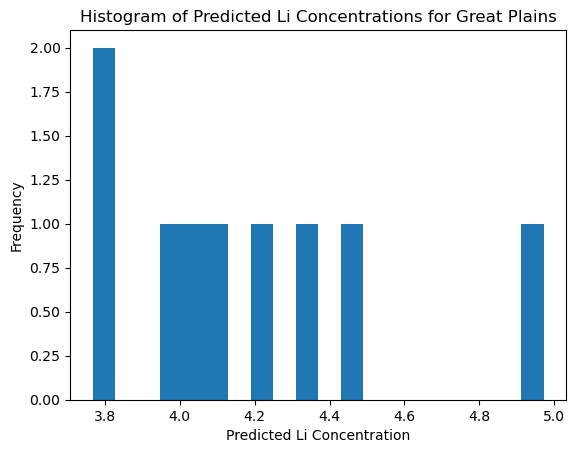

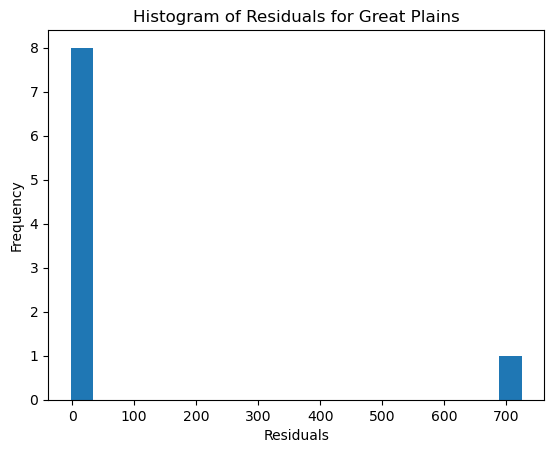

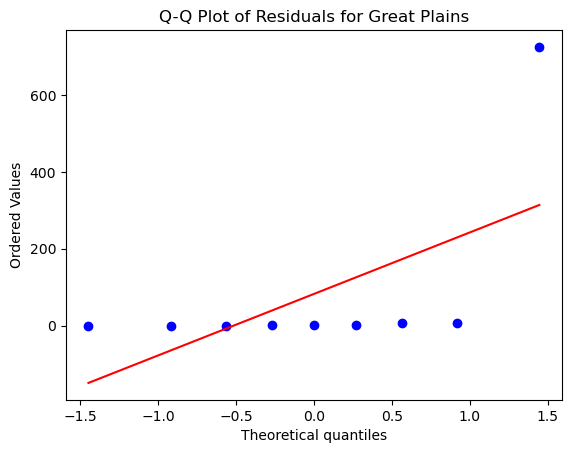

Anadarko
Number of data points:  180
Number of samples in the training dataset: 126
Best parameters: {'C': 10, 'epsilon': 0.01, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 164.170249691358
MSE of the model: 167.68662373351228
The model's MSE is close to or larger than the variance of the target variable.
The model's performance may be limited compared to the variability of the target variable.
RMSE of the model: 12.949387002229576
MAE of the best SVR model: 4.4530587181208565
-------------------------------
R-squared (Coefficient of Determination): -0.021419069830039827
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  14.814814814814813
±15%:  27.77777777777778
±25%:  50.0
±50%:  83.33333333333334
-------------------------------
Minimum percentage difference: 0.26%
Maximum percentage difference: 1089.63%
-------------------------------
Quanti

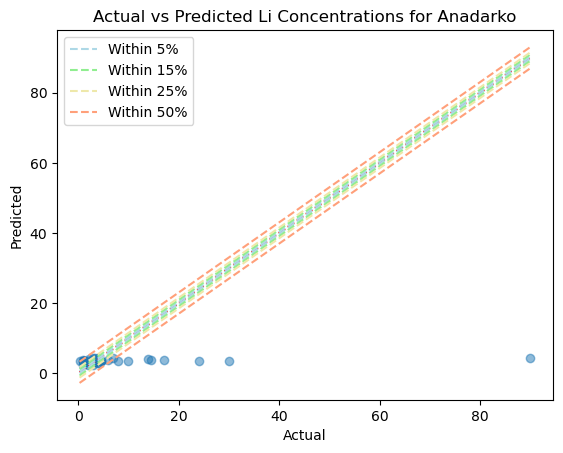

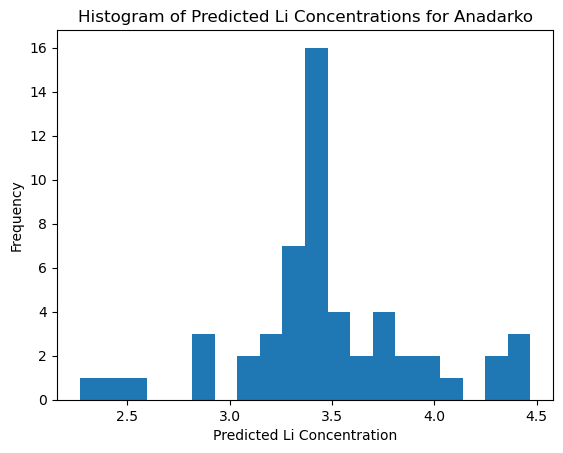

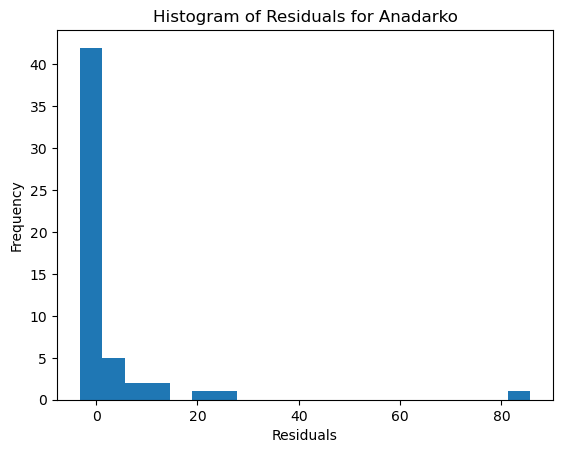

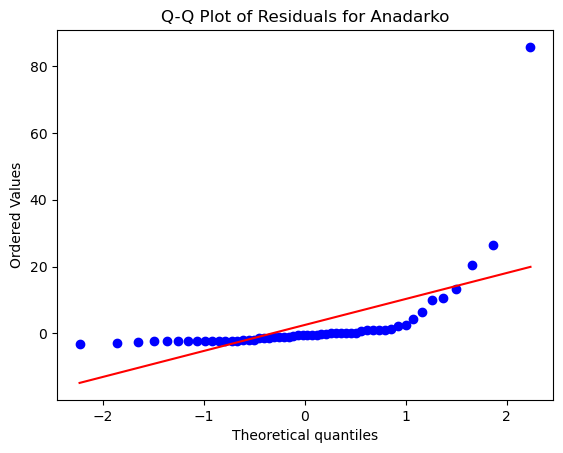

Rocky Mountain
Number of data points:  539
Number of samples in the training dataset: 377
Best parameters: {'C': 10, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 211.78796921201044
MSE of the model: 205.70551413390578
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 14.342437524141626
MAE of the best SVR model: 5.9178869465386486
-------------------------------
R-squared (Coefficient of Determination): 0.028719549560512148
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  12.345679012345679
±15%:  41.9753086419753
±25%:  58.64197530864198
±50%:  72.22222222222221
-------------------------------
Minimum percentage difference: 0.42%
Maximum percentage difference: 444.57%
-------------------------------
Qua

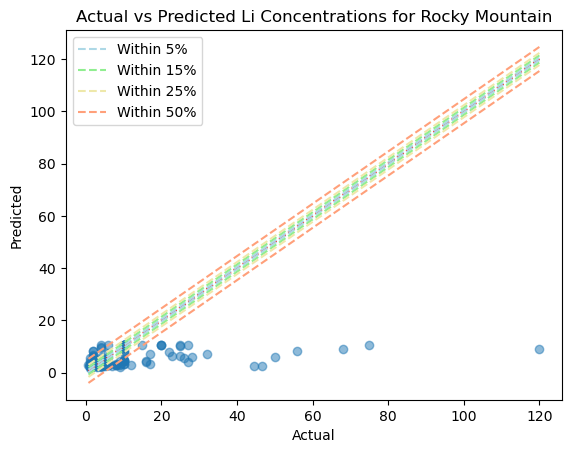

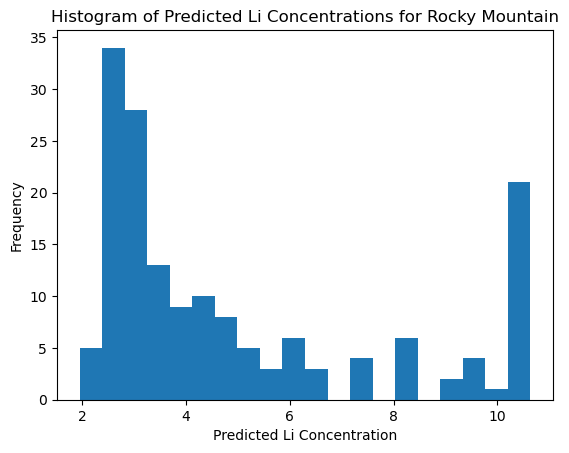

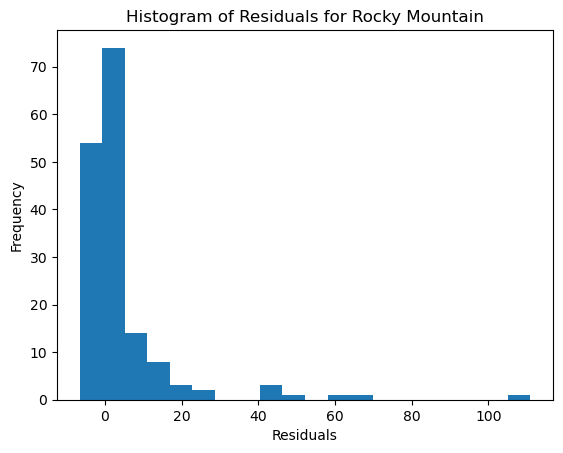

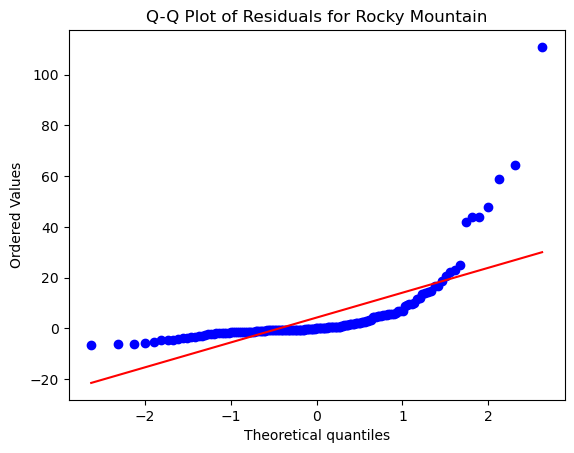

Fort Worth
Number of data points:  4
Number of samples in the training dataset: 2
Best parameters: {'C': 0.1, 'epsilon': 0.01, 'kernel': 'linear'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 4.0
MSE of the model: 5.372217778076344
The model's MSE is close to or larger than the variance of the target variable.
The model's performance may be limited compared to the variability of the target variable.
RMSE of the model: 2.3178045167952246
MAE of the best SVR model: 2.1661254028777535
-------------------------------
R-squared (Coefficient of Determination): -0.34305444451908595
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  50.0
±15%:  100.0
±25%:  100.0
±50%:  100.0
-------------------------------
Minimum percentage difference: 4.63%
Maximum percentage difference: 11.96%
-------------------------------
Quantile regression loss:
Quantile 0.25: 1.753778911112625

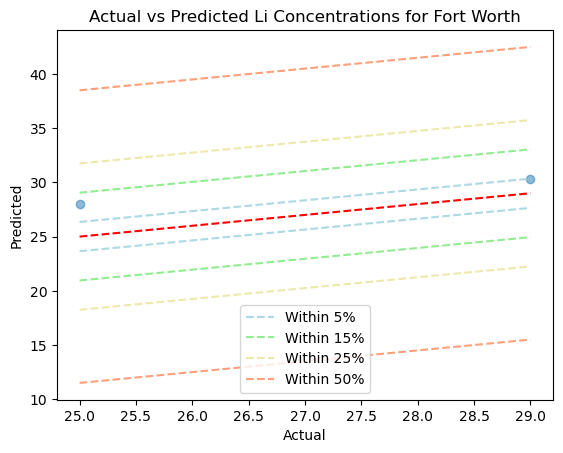

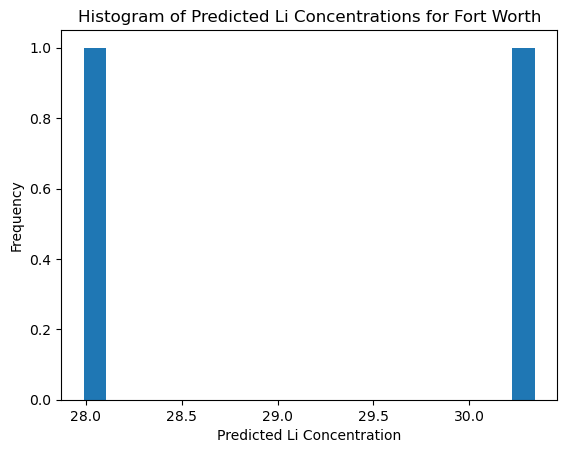

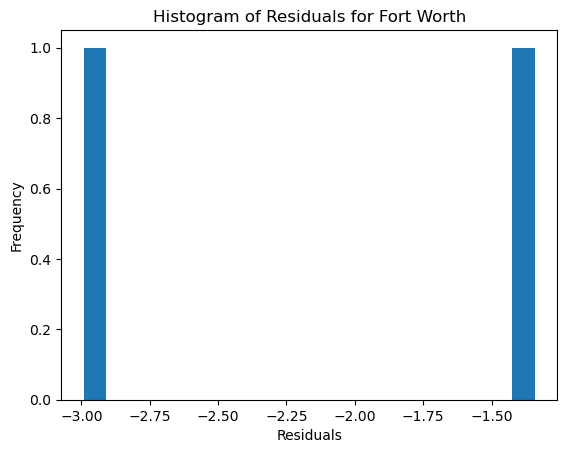

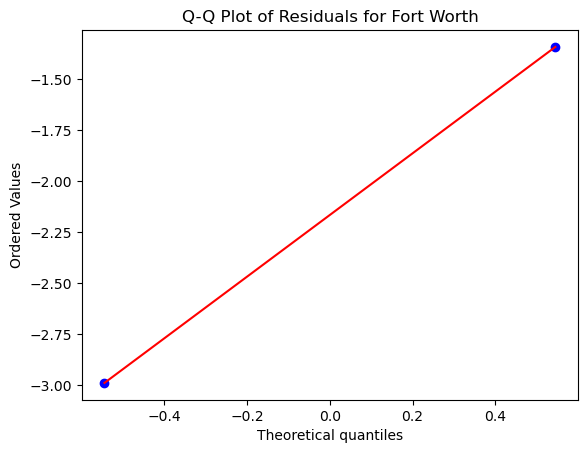

,round,basin,data_row_count,feature_quantity,feature_list,kernel_options,best_kernel,c_options,best_c,epsilon_options,...,within_5_percent,within_15_percent,within_25_percent,within_50_percent,results_min%_difference,results_max%_difference,0.25_quantile_loss,0.5_quantile_loss,0.75_quantile_loss,cross_val_mse
11,01_wi_wc,Fort Worth,4,35,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",linear,"[0.1, 1, 10]",0.1,"[0.01, 0.1, 0.5]",...,50.00,100.00,100.00,100.00,4.63,11.96,1.75,2.17,2.58,289.00
8,01_wi_wc,Great Plains,29,95,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",poly,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",...,66.67,88.89,88.89,88.89,11.87,118.41,0.97,1.80,7.23,34.66
3,01_wi_wc,Gulf Coast,222,343,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",poly,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",...,38.81,64.18,70.15,74.63,0.87,3534.70,2.96,6.67,49.60,21893.47
6,01_wi_wc,Pacific,62,79,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",...,31.58,63.16,73.68,89.47,2.09,59.46,0.06,0.18,0.32,0.29
4,01_wi_wc,Williston,269,253,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",poly,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",...,39.51,58.02,75.31,80.25,0.03,366.87,0.90,5.34,9.07,3516.76
5,01_wi_wc,Michigan,52,93,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",...,43.75,56.25,56.25,75.00,0.86,113.40,0.34,1.30,5.17,9.93
10,01_wi_wc,Rocky Mountain,539,538,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",...,12.35,41.98,58.64,72.22,0.42,444.57,0.67,1.62,5.07,147.24
0,01_wi_wc,Appalachian,71,137,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",...,4.55,31.82,45.45,59.09,11.66,101.24,3.08,14.43,32.29,2239.31
9,01_wi_wc,Anadarko,180,167,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",...,14.81,27.78,50.00,83.33,0.26,1089.63,0.79,1.70,2.25,1948.58
1,01_wi_wc,Permian,184,257,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",...,7.14,25.00,35.71,58.93,0.98,1391.27,1.64,4.33,8.16,452.97


In [54]:
# Define all the variables...
round = '01_wi_wc'
test_size = 0.3
random_state = 42
kernel_values = ['linear', 'rbf', 'poly']
c_values = [0.1, 1, 10]
epsilon_values = [0.01, 0.1, 0.5]

# Run the function...
df_round01_wi_wc = generate_svr_models_by_basin(df=df, round=round, basins=basins, categorical_columns=categorical_columns, 
                                              test_size=test_size, random_state=random_state, kernel_values=kernel_values, 
                                              c_values=c_values, epsilon_values=epsilon_values)
df_round01_wi_wc

#### ROUND 2

In [55]:
# # Define all the variables...
# round = '02_wi_wc'
# test_size = 0.3
# random_state = 42
# kernel_values = ['linear', 'rbf', 'poly', 'sigmoid']
# c_values = [0.1, 0.5, 1, 5, 10, 50, 100]
# epsilon_values = [0.01, 0.05, 0.1, 0.2, 0.5]

# # Run the function...
# df_round02_wi_wc = generate_svr_models_by_basin(df=df, round=round, basins=basins, categorical_columns=categorical_columns, 
#                                               test_size=test_size, random_state=random_state, kernel_values=kernel_values, 
#                                               c_values=c_values, epsilon_values=epsilon_values)
# df_round02_wi_wc

#### ROUND 3

In [56]:
# # Define all the variables...
# round = '03_wi_wc'
# test_size = 0.25
# random_state = 42
# kernel_values = ['rbf', 'poly', 'sigmoid']
# c_values = [0.1, 0.5, 1, 5, 10, 50]
# epsilon_values = [0.01, 0.05, 0.1, 0.2]

# # Run the function...
# df_round03_wi_wc = generate_svr_models_by_basin(df=df, round=round, basins=basins, categorical_columns=categorical_columns, 
#                                               test_size=test_size, random_state=random_state, kernel_values=kernel_values, 
#                                               c_values=c_values, epsilon_values=epsilon_values)
# df_round03_wi_wc

#### ROUND 4

In [57]:
# # Define all the variables...
# round = '04_wi_wc'
# test_size = 0.25
# random_state = 42
# kernel_values = ['rbf', 'poly', 'sigmoid']
# c_values = [0.1, 0.5, 1, 5, 10]
# epsilon_values = [0.01, 0.05, 0.1]

# # Run the function...
# df_round04_wi_wc = generate_svr_models_by_basin(df=df, round=round, basins=basins, categorical_columns=categorical_columns, 
#                                               test_size=test_size, random_state=random_state, kernel_values=kernel_values, 
#                                               c_values=c_values, epsilon_values=epsilon_values)
# df_round04_wi_wc

#### ROUND 5

In [58]:
# # Define all the variables...
# round = '05_wi_wc'
# test_size = 0.4
# random_state = 42
# kernel_values = ['rbf', 'poly', 'sigmoid']
# c_values = [10, 50, 100, 150, 200]
# epsilon_values = [0.1, 0.2, 0.3, 0.4, 0.5]

# # Run the function...
# df_round05_wi_wc = generate_svr_models_by_basin(df=df, round=round, basins=basins, categorical_columns=categorical_columns, 
#                                               test_size=test_size, random_state=random_state, kernel_values=kernel_values, 
#                                               c_values=c_values, epsilon_values=epsilon_values)
# df_round05_wi_wc

#### ROUND 6

In [59]:
# # Define all the variables...
# round = '06_wi_wc'
# test_size = 0.25
# random_state = 42
# kernel_values = ['rbf', 'poly', 'sigmoid']
# c_values = [10, 50, 100, 150, 200]
# epsilon_values = [0.1, 0.2, 0.3, 0.4, 0.5]

# # Run the function...
# df_round06_wi_wc = generate_svr_models_by_basin(df=df, round=round, basins=basins, categorical_columns=categorical_columns, 
#                                               test_size=test_size, random_state=random_state, kernel_values=kernel_values, 
#                                               c_values=c_values, epsilon_values=epsilon_values)
# df_round06_wi_wc

#### ROUND 7

In [60]:
# # Define all the variables...
# round = '07_wi_wc'
# test_size = 0.25
# random_state = 42
# kernel_values = ['rbf', 'poly']
# c_values = [10, 20, 30, 40, 50]
# epsilon_values = [0.1, 0.2, 0.3, 0.4, 0.5]

# # Run the function...
# df_round07_wi_wc = generate_svr_models_by_basin(df=df, round=round, basins=basins, categorical_columns=categorical_columns, 
#                                               test_size=test_size, random_state=random_state, kernel_values=kernel_values, 
#                                               c_values=c_values, epsilon_values=epsilon_values)
# df_round07_wi_wc

### INPUT: Base df (w/ imputed values) (no categorical columns)

In [61]:
# Define the input df for this section
df = df_with_imputed.copy()

# Drop the 'IDUSGS' column as it is not needed
columns_to_drop = ['IDUSGS', 'API', 'DATESAMPLE', 'PLAYTYPE', 'WELLTYPE', 
                   'FORMSIMPLE', 'STATE', 'COUNTY', 'PROVINCE', 'REGION', 
                   'WELLNAME', 'PERIOD']
df.drop(columns_to_drop, axis=1, inplace=True)

# Define variables that are common to all rounds
basins = df['BASIN_CATEGORY'].unique()
categorical_columns = []

#### ROUND 1

Appalachian
Number of data points:  115
Number of samples in the training dataset: 80
Best parameters: {'C': 10, 'epsilon': 0.01, 'kernel': 'poly'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 17082.28191020408
MSE of the model: 16376.692398077845
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 127.97145149633118
MAE of the best SVR model: 52.17654650305432
-------------------------------
R-squared (Coefficient of Determination): 0.04130534291819343
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  17.142857142857142
±15%:  48.57142857142857
±25%:  54.285714285714285
±50%:  68.57142857142857
-------------------------------
Minimum percentage difference: 7.81%
Maximum percentage difference: 1743.83%
-------------------------------
Quant

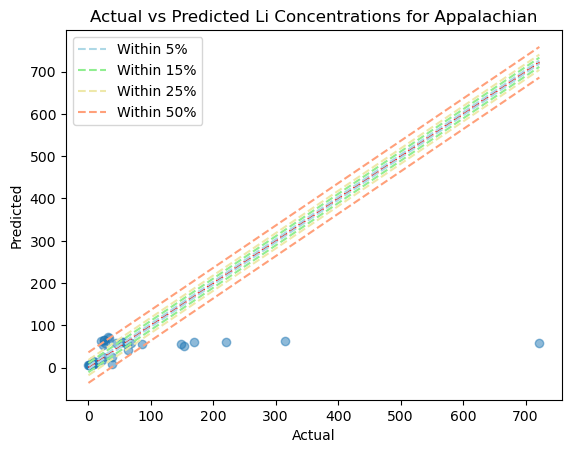

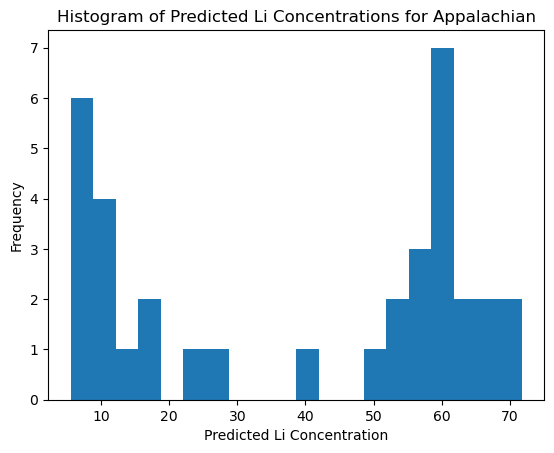

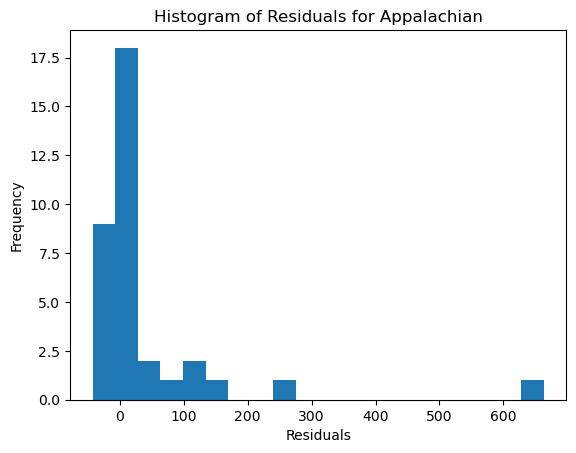

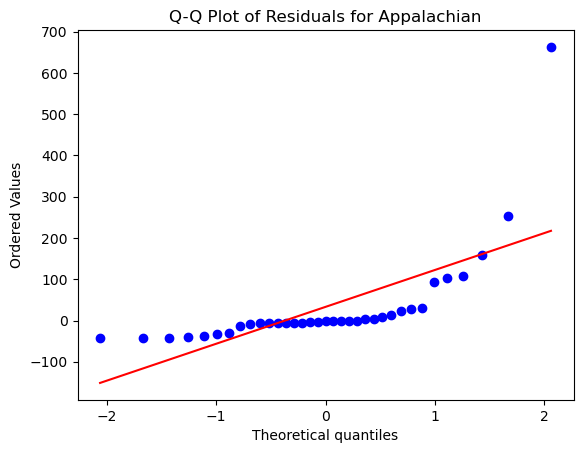

Permian
Number of data points:  210
Number of samples in the training dataset: 147
Best parameters: {'C': 10, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 153.15241259763167
MSE of the model: 157.95642974138826
The model's MSE is close to or larger than the variance of the target variable.
The model's performance may be limited compared to the variability of the target variable.
RMSE of the model: 12.56807183864686
MAE of the best SVR model: 7.303071284434816
-------------------------------
R-squared (Coefficient of Determination): -0.031367557730728635
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  14.285714285714285
±15%:  31.746031746031743
±25%:  47.61904761904761
±50%:  66.66666666666666
-------------------------------
Minimum percentage difference: 0.55%
Maximum percentage difference: 527.35%
---------------------------

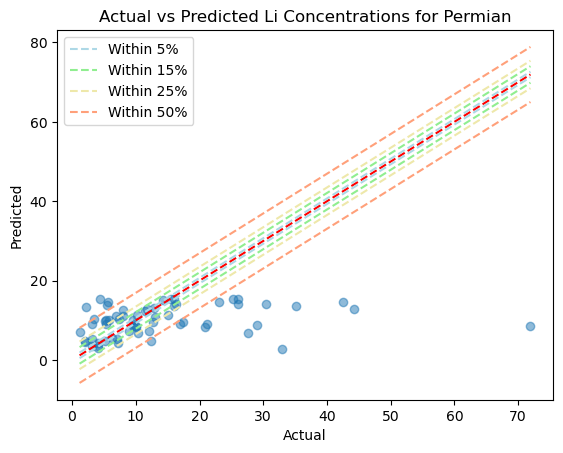

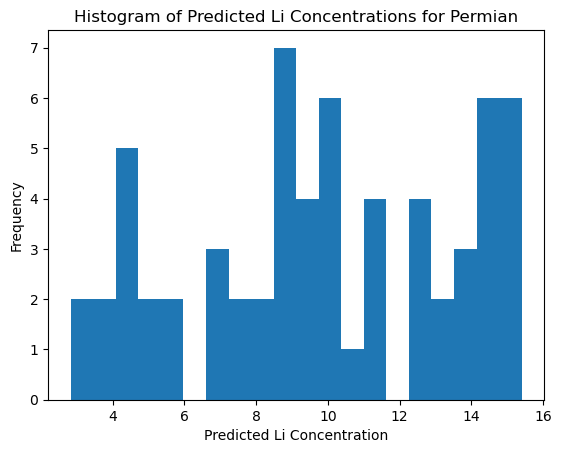

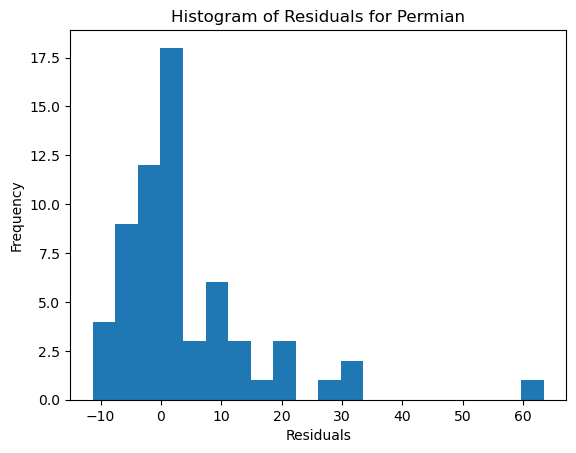

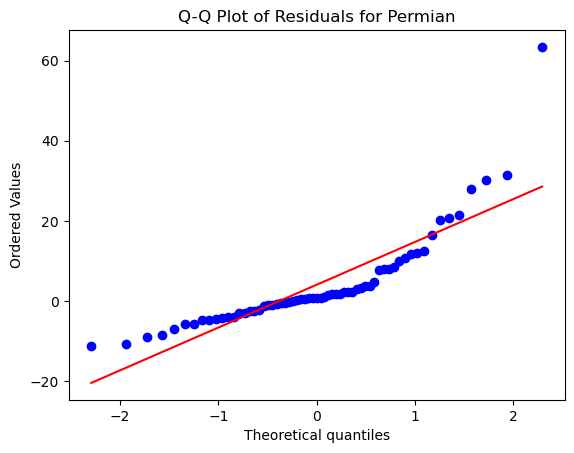

Oklahoma Platform
Number of data points:  155
Number of samples in the training dataset: 108
Best parameters: {'C': 10, 'epsilon': 0.01, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 231.84076215482116
MSE of the model: 272.2768842864925
The model's MSE is close to or larger than the variance of the target variable.
The model's performance may be limited compared to the variability of the target variable.
RMSE of the model: 16.500814655237253
MAE of the best SVR model: 11.550979433140123
-------------------------------
R-squared (Coefficient of Determination): -0.17441334196731306
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  4.25531914893617
±15%:  19.148936170212767
±25%:  29.78723404255319
±50%:  53.191489361702125
-------------------------------
Minimum percentage difference: 0.85%
Maximum percentage difference: 863.02%
-----------------

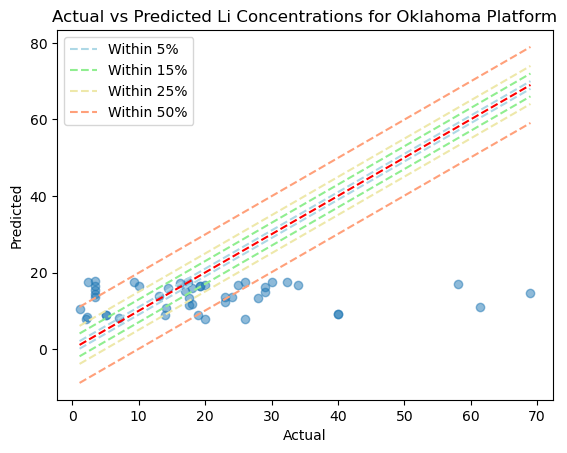

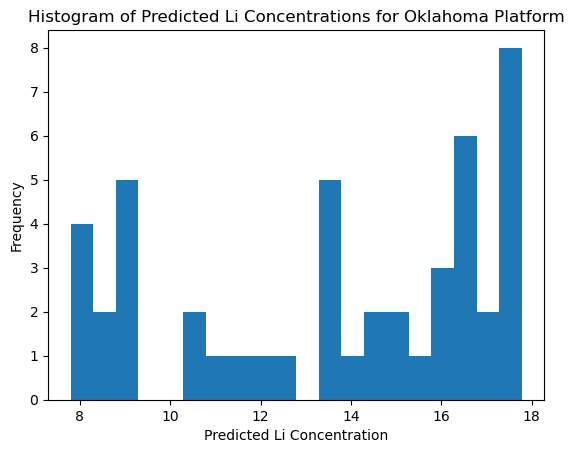

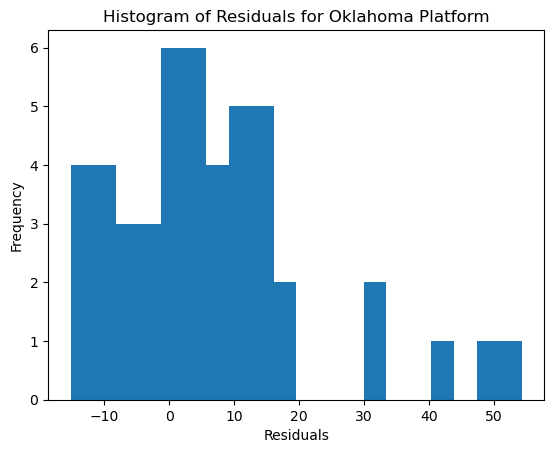

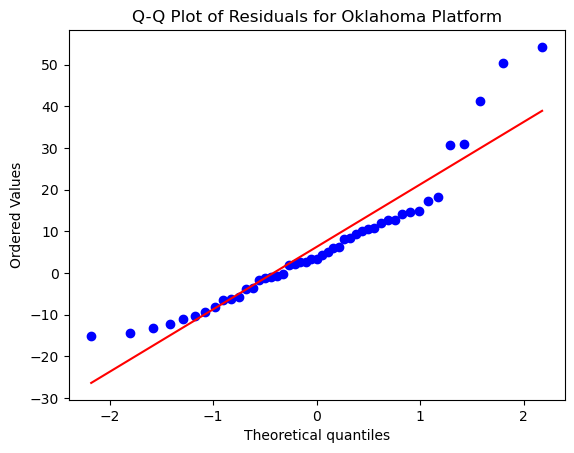

Gulf Coast
Number of data points:  326
Number of samples in the training dataset: 228
Best parameters: {'C': 10, 'epsilon': 0.5, 'kernel': 'poly'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 9346.212241024572
MSE of the model: 4963.416706394285
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 70.45152025609018
MAE of the best SVR model: 33.1574543231118
-------------------------------
R-squared (Coefficient of Determination): 0.46893815607913325
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  39.795918367346935
±15%:  56.12244897959183
±25%:  64.28571428571429
±50%:  75.51020408163265
-------------------------------
Minimum percentage difference: 2.07%
Maximum percentage difference: 603.05%
-------------------------------
Quantile re

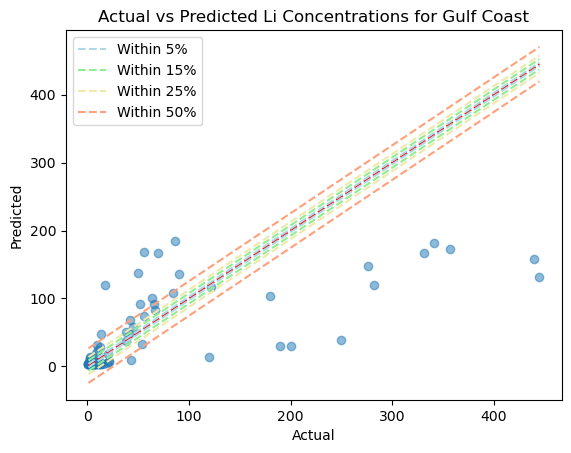

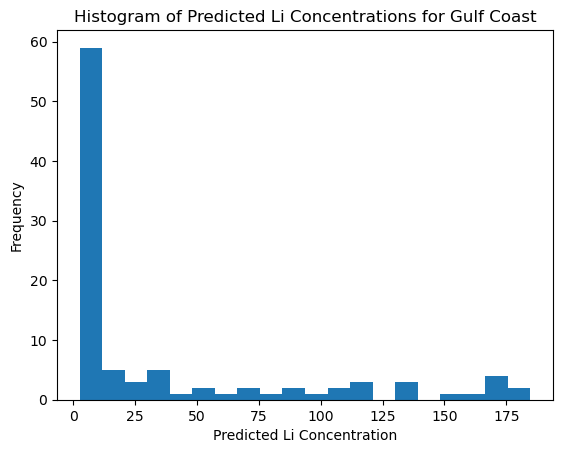

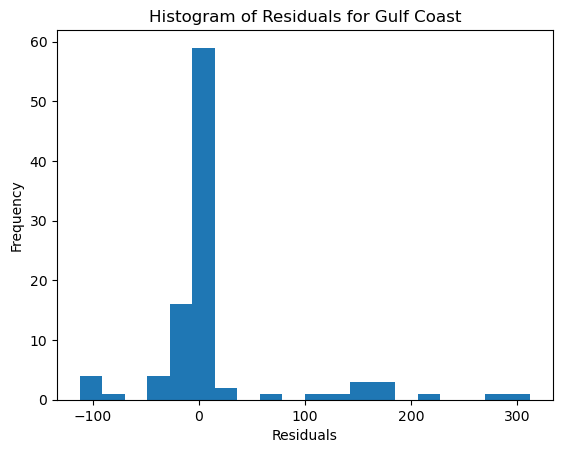

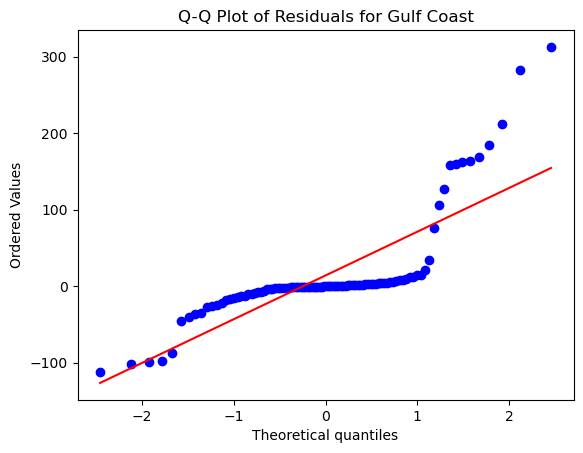

Williston
Number of data points:  292
Number of samples in the training dataset: 204
Best parameters: {'C': 10, 'epsilon': 0.5, 'kernel': 'poly'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 5469.250903925622
MSE of the model: 5923.861413407126
The model's MSE is close to or larger than the variance of the target variable.
The model's performance may be limited compared to the variability of the target variable.
RMSE of the model: 76.96662532167515
MAE of the best SVR model: 27.671953187212704
-------------------------------
R-squared (Coefficient of Determination): -0.0831211654881665
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  34.090909090909086
±15%:  50.0
±25%:  73.86363636363636
±50%:  80.68181818181817
-------------------------------
Minimum percentage difference: 0.32%
Maximum percentage difference: 367.31%
-------------------------------
Quantile 

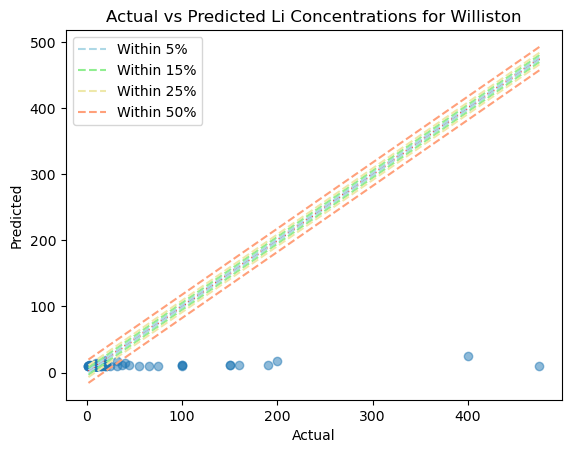

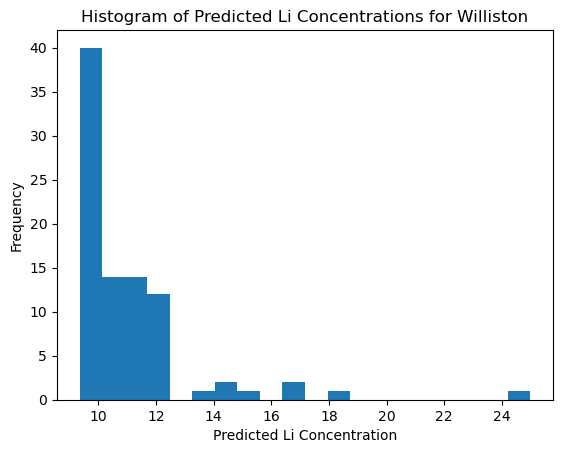

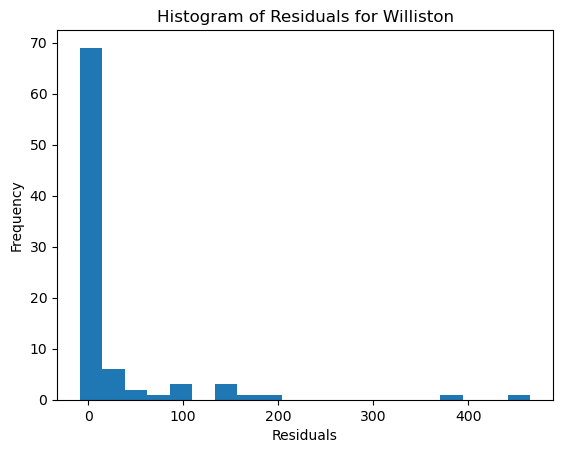

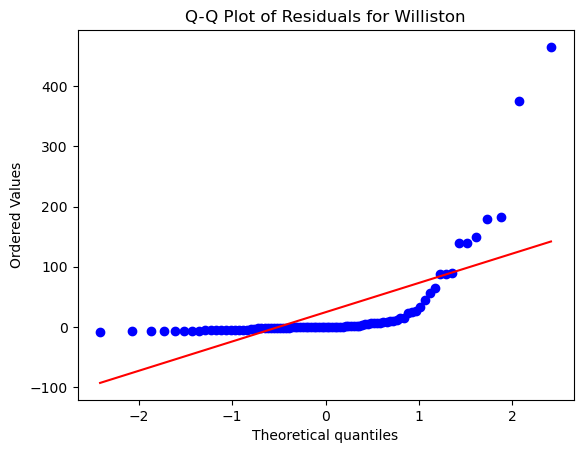

Michigan
Number of data points:  64
Number of samples in the training dataset: 44
Best parameters: {'C': 10, 'epsilon': 0.01, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 179.13776875000002
MSE of the model: 61.67831916906488
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 7.853554556318105
MAE of the best SVR model: 4.530605013060316
-------------------------------
R-squared (Coefficient of Determination): 0.6556933828111842
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  30.0
±15%:  65.0
±25%:  70.0
±50%:  85.0
-------------------------------
Minimum percentage difference: 0.86%
Maximum percentage difference: 158.71%
-------------------------------
Quantile regression loss:
Quantile 0.25: 0.6714434426763181
Quantil

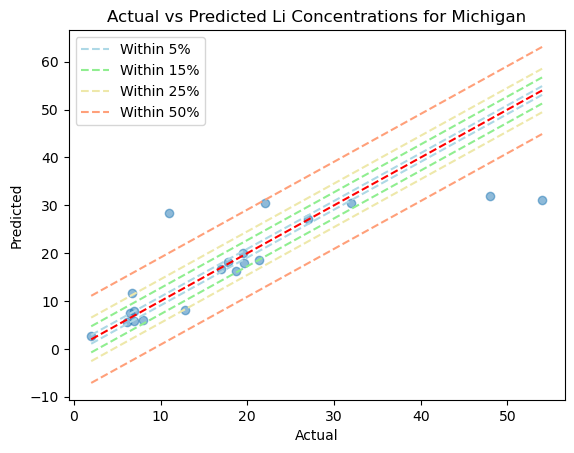

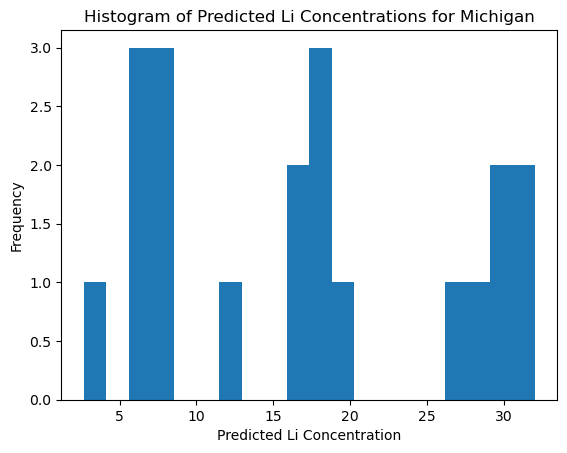

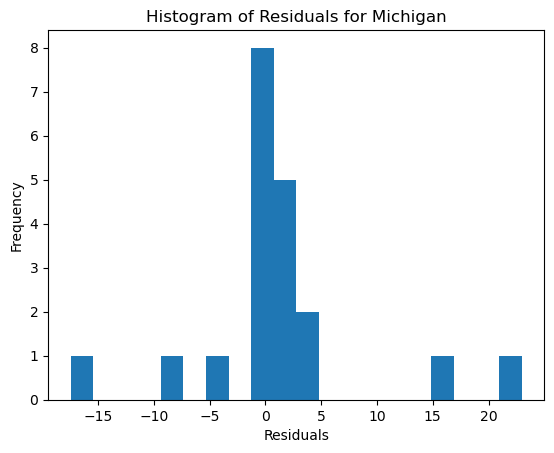

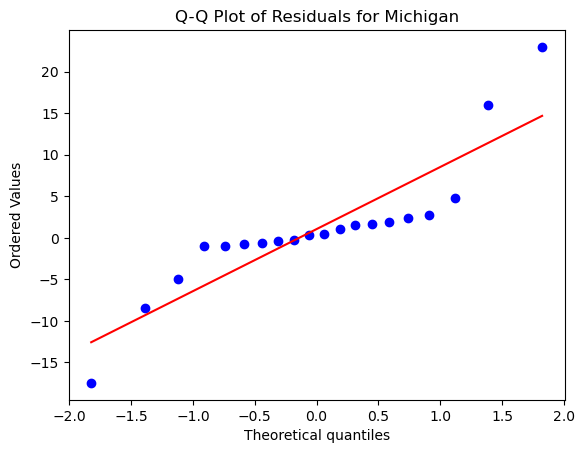

Pacific
Number of data points:  111
Number of samples in the training dataset: 77
Best parameters: {'C': 10, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 1.464879952422145
MSE of the model: 0.9639029477770187
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 0.9817855915509347
MAE of the best SVR model: 0.5994462917214007
-------------------------------
R-squared (Coefficient of Determination): 0.3419918497872626
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  8.823529411764707
±15%:  26.47058823529412
±25%:  61.76470588235294
±50%:  76.47058823529412
-------------------------------
Minimum percentage difference: 1.78%
Maximum percentage difference: 543.25%
-------------------------------
Quantile regre

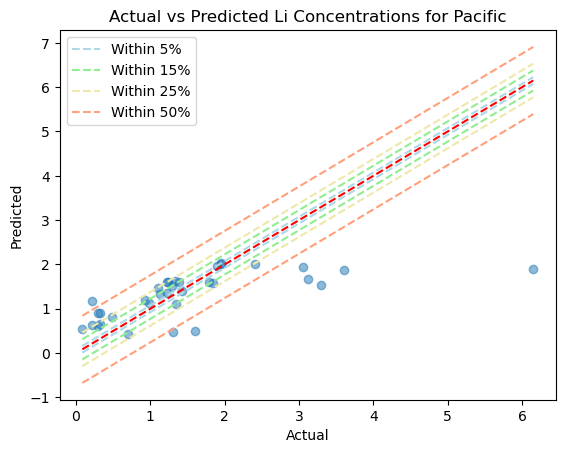

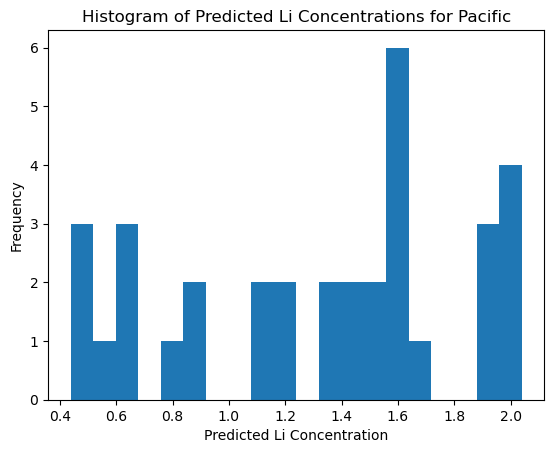

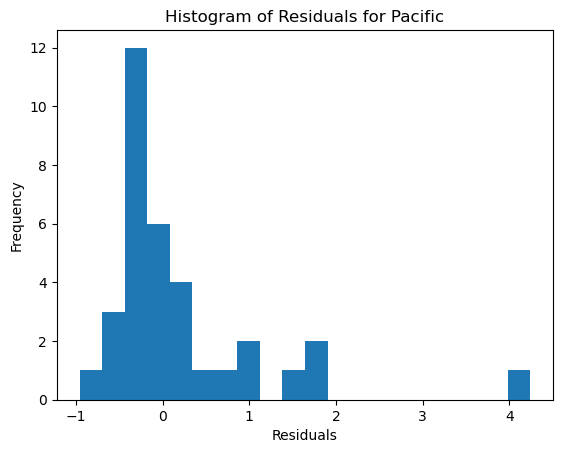

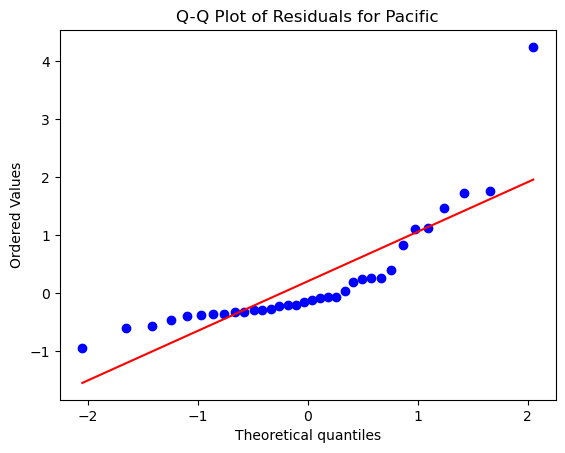

Illinois
Number of data points:  12
Number of samples in the training dataset: 8
Best parameters: {'C': 0.1, 'epsilon': 0.5, 'kernel': 'poly'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 146.5
MSE of the model: 517.7528634240131
The model's MSE is close to or larger than the variance of the target variable.
The model's performance may be limited compared to the variability of the target variable.
RMSE of the model: 22.75418342687808
MAE of the best SVR model: 19.816876933204426
-------------------------------
R-squared (Coefficient of Determination): -2.5341492383891677
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  0.0
±15%:  0.0
±25%:  0.0
±50%:  50.0
-------------------------------
Minimum percentage difference: 77.21%
Maximum percentage difference: 91.53%
-------------------------------
Quantile regression loss:
Quantile 0.25: 10.04471686800857
Quantile

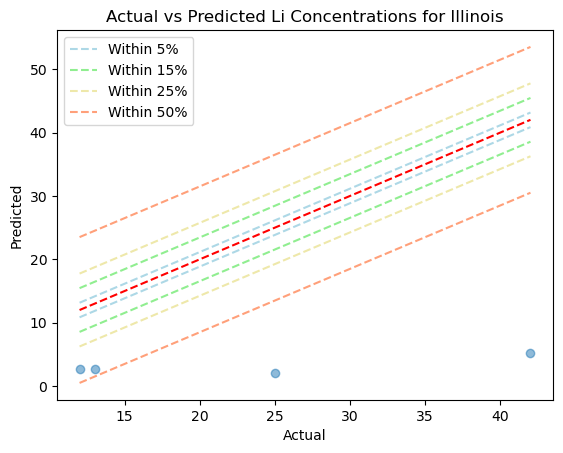

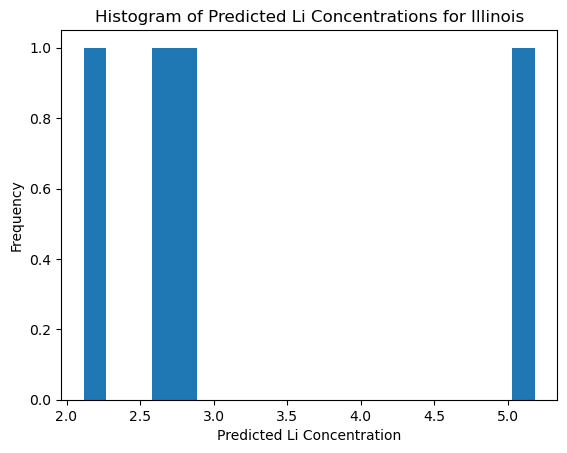

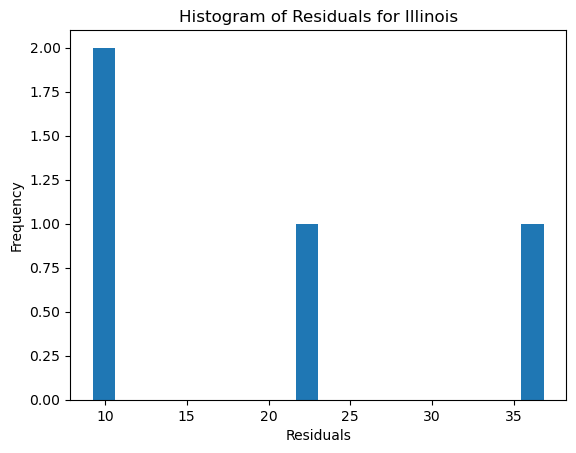

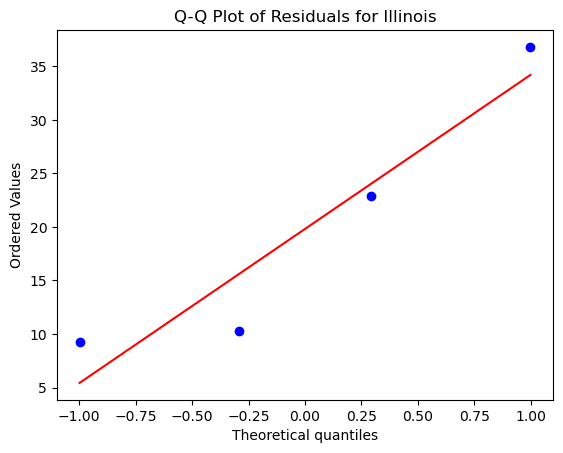

Great Plains
Number of data points:  35
Number of samples in the training dataset: 24
Best parameters: {'C': 1, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 43348.202347107435
MSE of the model: 47732.35365412745
The model's MSE is close to or larger than the variance of the target variable.
The model's performance may be limited compared to the variability of the target variable.
RMSE of the model: 218.47735272592317
MAE of the best SVR model: 68.07863380844879
-------------------------------
R-squared (Coefficient of Determination): -0.10113801887133067
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  63.63636363636363
±15%:  90.9090909090909
±25%:  90.9090909090909
±50%:  90.9090909090909
-------------------------------
Minimum percentage difference: 6.24%
Maximum percentage difference: 140.68%
-------------------------------

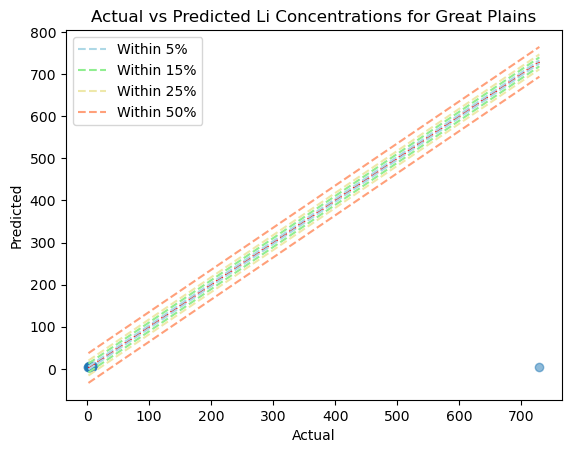

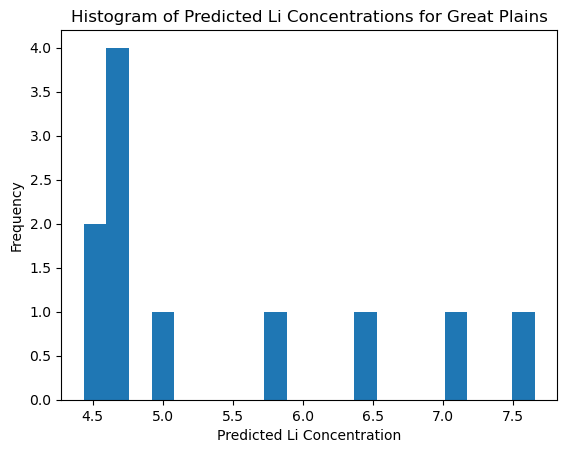

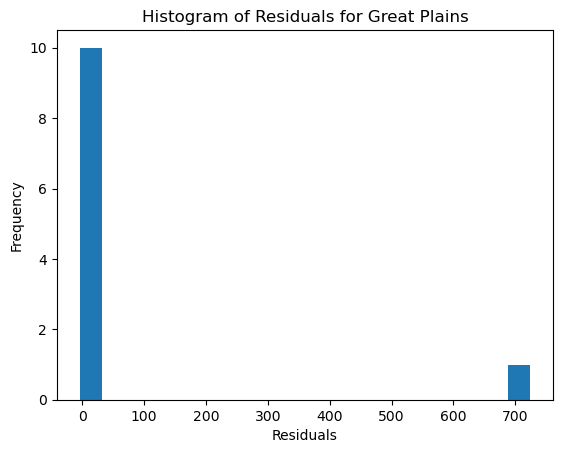

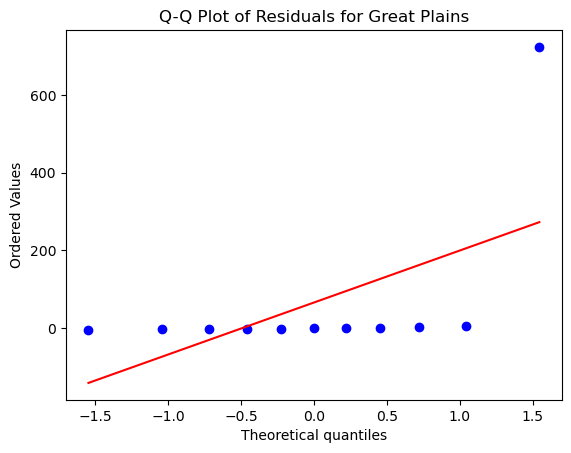

Anadarko
Number of data points:  205
Number of samples in the training dataset: 143
Best parameters: {'C': 10, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 1925.8742789021853
MSE of the model: 1972.5249226698181
The model's MSE is close to or larger than the variance of the target variable.
The model's performance may be limited compared to the variability of the target variable.
RMSE of the model: 44.413116561099585
MAE of the best SVR model: 8.614289487307133
-------------------------------
R-squared (Coefficient of Determination): -0.02422309923274213
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  12.903225806451612
±15%:  61.29032258064516
±25%:  83.87096774193549
±50%:  87.09677419354838
-------------------------------
Minimum percentage difference: 1.44%
Maximum percentage difference: 265.73%
---------------------------

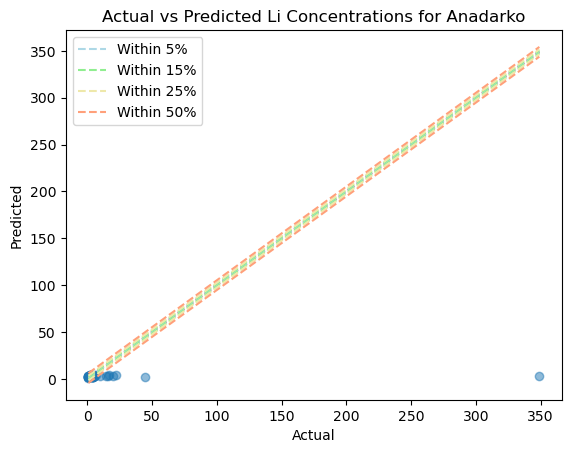

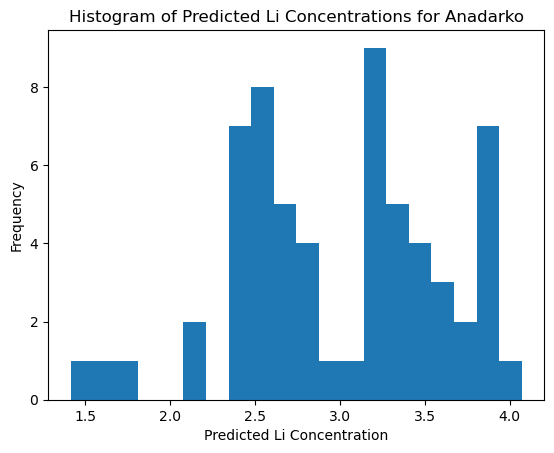

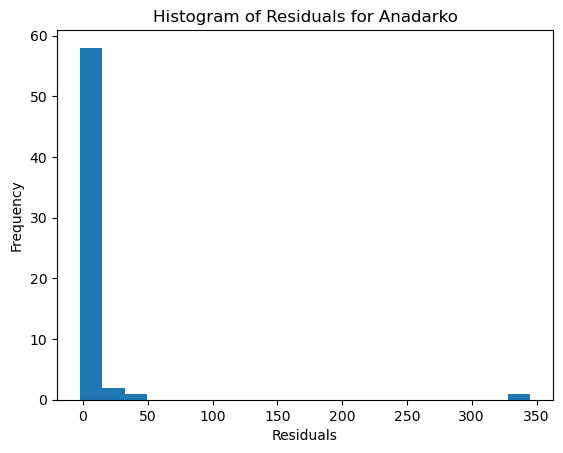

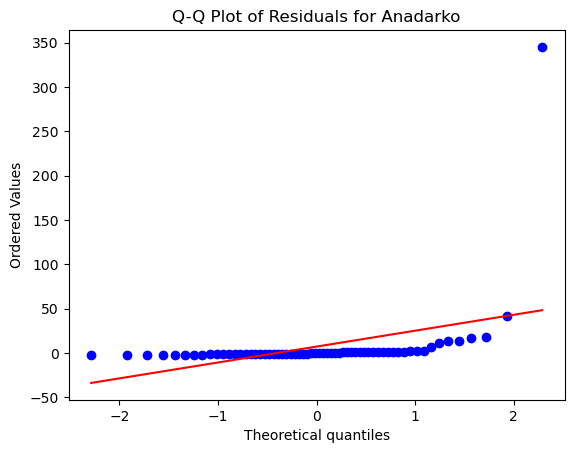

Rocky Mountain
Number of data points:  575
Number of samples in the training dataset: 402
Best parameters: {'C': 10, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 97.92849928831566
MSE of the model: 84.55232979860375
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 9.195234080685697
MAE of the best SVR model: 4.063300712408989
-------------------------------
R-squared (Coefficient of Determination): 0.13659118220866995
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  10.404624277456648
±15%:  33.52601156069364
±25%:  49.71098265895954
±50%:  75.72254335260115
-------------------------------
Minimum percentage difference: 0.33%
Maximum percentage difference: 930.87%
-------------------------------
Quantil

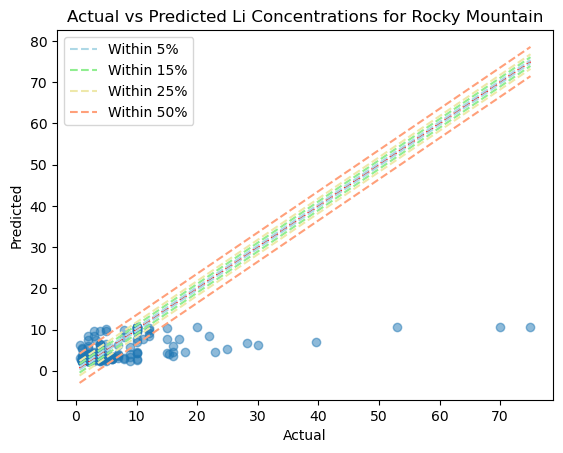

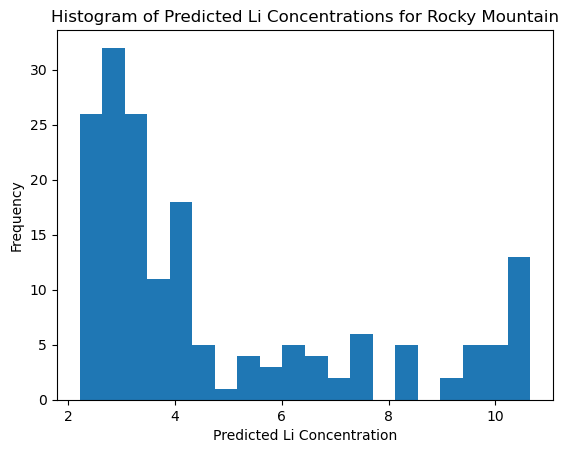

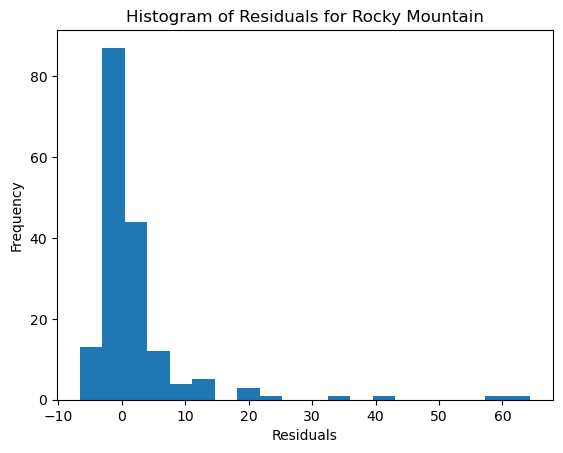

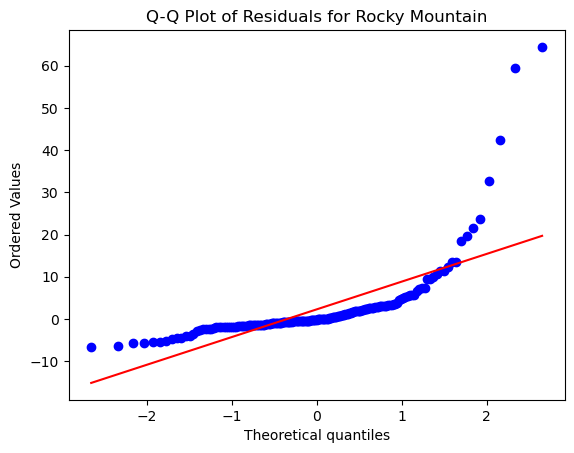

Fort Worth
Number of data points:  10
Number of samples in the training dataset: 7
Best parameters: {'C': 0.1, 'epsilon': 0.5, 'kernel': 'linear'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 101.5424888888889
MSE of the model: 252.8113731386553
The model's MSE is close to or larger than the variance of the target variable.
The model's performance may be limited compared to the variability of the target variable.
RMSE of the model: 15.900043180402225
MAE of the best SVR model: 10.060958082048012
-------------------------------
R-squared (Coefficient of Determination): -1.4897102277578576
-------------------------------
Percentage of predictions within different tolerance levels:
±5%:  33.33333333333333
±15%:  33.33333333333333
±25%:  66.66666666666666
±50%:  66.66666666666666
-------------------------------
Minimum percentage difference: 9.66%
Maximum percentage difference: 495.15%
---------------------------

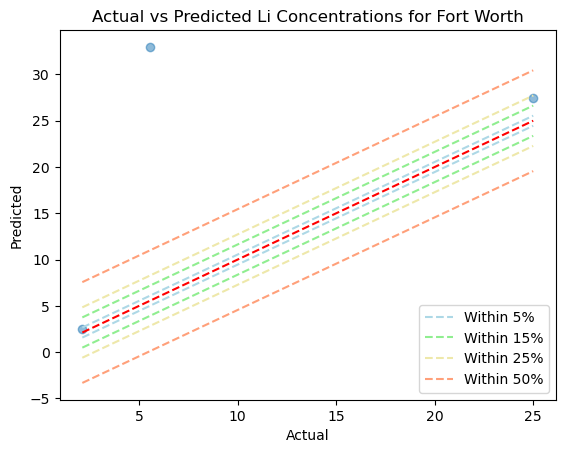

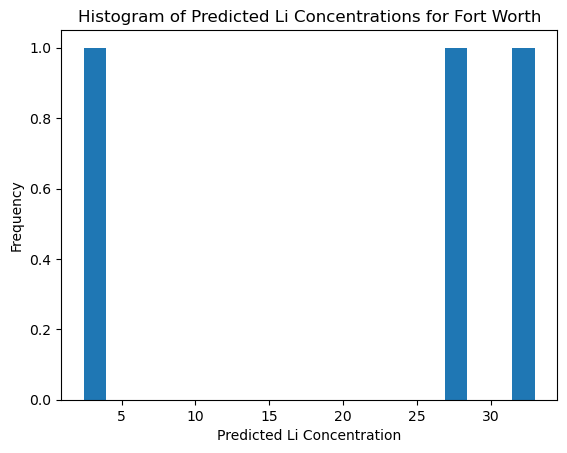

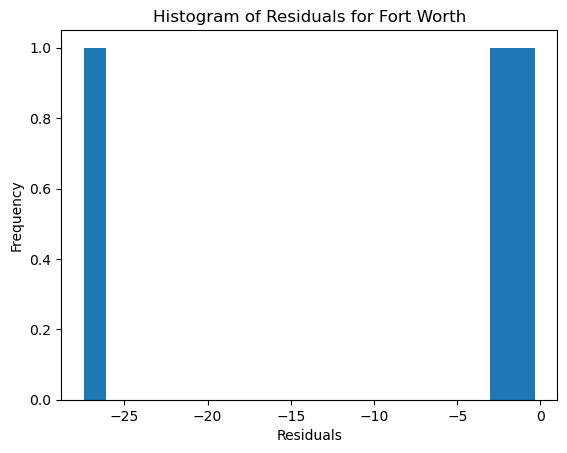

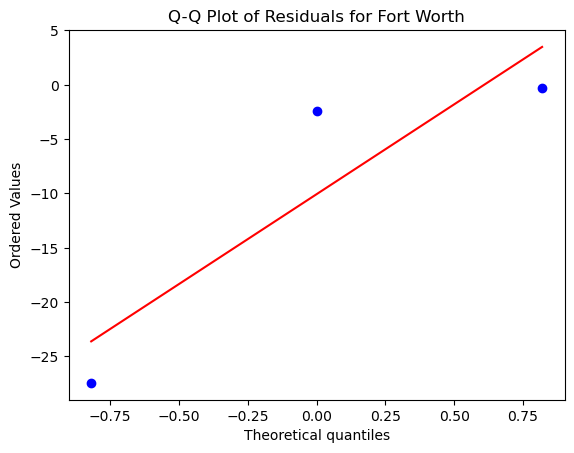

,round,basin,data_row_count,feature_quantity,feature_list,kernel_options,best_kernel,c_options,best_c,epsilon_options,...,within_5_percent,within_15_percent,within_25_percent,within_50_percent,results_min%_difference,results_max%_difference,0.25_quantile_loss,0.5_quantile_loss,0.75_quantile_loss,cross_val_mse
8,01_wi_nc,Great Plains,35,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",1.0,"[0.01, 0.1, 0.5]",...,63.64,90.91,90.91,90.91,6.24,140.68,1.21,2.66,4.19,9.66
5,01_wi_nc,Michigan,64,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",...,30.00,65.00,70.00,85.00,0.86,158.71,0.67,1.59,4.82,66.59
9,01_wi_nc,Anadarko,205,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",...,12.90,61.29,83.87,87.10,1.44,265.73,0.81,1.38,1.74,959.39
3,01_wi_nc,Gulf Coast,326,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",poly,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",...,39.80,56.12,64.29,75.51,2.07,603.05,1.59,4.89,23.95,25109.72
4,01_wi_nc,Williston,292,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",poly,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",...,34.09,50.00,73.86,80.68,0.32,367.31,0.93,5.07,9.08,4291.40
0,01_wi_nc,Appalachian,115,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",poly,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",...,17.14,48.57,54.29,68.57,7.81,1743.83,4.88,12.69,40.46,3024.39
10,01_wi_nc,Rocky Mountain,575,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",...,10.40,33.53,49.71,75.72,0.33,930.87,0.73,1.79,3.53,197.46
11,01_wi_nc,Fort Worth,10,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",linear,"[0.1, 1, 10]",0.1,"[0.01, 0.1, 0.5]",...,33.33,33.33,66.67,66.67,9.66,495.15,1.38,2.41,14.92,18.65
1,01_wi_nc,Permian,210,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",...,14.29,31.75,47.62,66.67,0.55,527.35,1.31,3.71,8.74,356.97
6,01_wi_nc,Pacific,111,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",...,8.82,26.47,61.76,76.47,1.78,543.25,0.22,0.33,0.60,0.39


In [62]:
# Define all the variables...
round = '01_wi_nc'
test_size = 0.3
random_state = 42
kernel_values = ['linear', 'rbf', 'poly']
c_values = [0.1, 1, 10]
epsilon_values = [0.01, 0.1, 0.5]

# Run the function...
df_round01_wi_nc = generate_svr_models_by_basin(df=df, round=round, basins=basins, categorical_columns=categorical_columns, 
                                              test_size=test_size, random_state=random_state, kernel_values=kernel_values, 
                                              c_values=c_values, epsilon_values=epsilon_values)
df_round01_wi_nc

#### ROUND 2

In [63]:
# # Define all the variables...
# round = '02_wi_nc'
# test_size = 0.3
# random_state = 42
# kernel_values = ['linear', 'rbf', 'poly', 'sigmoid']
# c_values = [0.1, 0.5, 1, 5, 10, 50, 100]
# epsilon_values = [0.01, 0.05, 0.1, 0.2, 0.5]

# # Run the function...
# df_round02_wi_nc = generate_svr_models_by_basin(df=df, round=round, basins=basins, categorical_columns=categorical_columns, 
#                                               test_size=test_size, random_state=random_state, kernel_values=kernel_values, 
#                                               c_values=c_values, epsilon_values=epsilon_values)
# df_round02_wi_nc

#### ROUND 3 - NOT RUN

In [64]:
# # Define all the variables...
# round = '03_wi_nc'
# test_size = 0.25
# random_state = 42
# kernel_values = ['rbf', 'poly', 'sigmoid']
# c_values = [0.1, 0.5, 1, 5, 10, 50]
# epsilon_values = [0.01, 0.05, 0.1, 0.2]

# # Run the function...
# df_round03_wi_nc = generate_svr_models_by_basin(df=df, round=round, basins=basins, categorical_columns=categorical_columns, 
#                                               test_size=test_size, random_state=random_state, kernel_values=kernel_values, 
#                                               c_values=c_values, epsilon_values=epsilon_values)
# df_round03_wi_nc

#### ROUND 4 - NOT RUN

In [65]:
# # Define all the variables...
# round = '04_wi_nc'
# test_size = 0.25
# random_state = 42
# kernel_values = ['rbf', 'poly', 'sigmoid']
# c_values = [0.1, 0.5, 1, 5, 10]
# epsilon_values = [0.01, 0.05, 0.1]

# # Run the function...
# df_round04_wi_nc = generate_svr_models_by_basin(df=df, round=round, basins=basins, categorical_columns=categorical_columns, 
#                                               test_size=test_size, random_state=random_state, kernel_values=kernel_values, 
#                                               c_values=c_values, epsilon_values=epsilon_values)
# df_round04_wi_nc

#### ROUND 5 - NOT RUN

In [66]:
# # Define all the variables...
# round = '05_wi_nc'
# test_size = 0.4
# random_state = 42
# kernel_values = ['rbf', 'poly', 'sigmoid']
# c_values = [10, 50, 100, 150, 200]
# epsilon_values = [0.1, 0.2, 0.3, 0.4, 0.5]

# # Run the function...
# df_round05_wi_nc = generate_svr_models_by_basin(df=df, round=round, basins=basins, categorical_columns=categorical_columns, 
#                                               test_size=test_size, random_state=random_state, kernel_values=kernel_values, 
#                                               c_values=c_values, epsilon_values=epsilon_values)
# df_round05_wi_nc

#### ROUND 6 - NOT RUN

In [67]:
# # Define all the variables...
# round = '06_wi_nc'
# test_size = 0.25
# random_state = 42
# kernel_values = ['rbf', 'poly', 'sigmoid']
# c_values = [10, 50, 100, 150, 200]
# epsilon_values = [0.1, 0.2, 0.3, 0.4, 0.5]

# # Run the function...
# df_round06_wi_nc = generate_svr_models_by_basin(df=df, round=round, basins=basins, categorical_columns=categorical_columns, 
#                                               test_size=test_size, random_state=random_state, kernel_values=kernel_values, 
#                                               c_values=c_values, epsilon_values=epsilon_values)
# df_round06_wi_nc

#### ROUND 7 - NOT RUN

In [68]:
# # Define all the variables...
# round = '07_wi_nc'
# test_size = 0.25
# random_state = 42
# kernel_values = ['rbf', 'poly']
# c_values = [10, 20, 30, 40, 50]
# epsilon_values = [0.1, 0.2, 0.3, 0.4, 0.5]

# # Run the function...
# df_round07_wi_nc = generate_svr_models_by_basin(df=df, round=round, basins=basins, categorical_columns=categorical_columns, 
#                                               test_size=test_size, random_state=random_state, kernel_values=kernel_values, 
#                                               c_values=c_values, epsilon_values=epsilon_values)
# df_round07_wi_nc

### INPUT: Base df (no imputed values) (w/ categorical columns)

In [69]:
# Define the input df for this section
df = df_no_imputed.copy()

# Drop the 'IDUSGS' column as it is not needed
columns_to_drop = ['IDUSGS', 'API', 'DATESAMPLE']
df.drop(columns_to_drop, axis=1, inplace=True)

# Define variables that are common to all rounds
basins = df['BASIN_CATEGORY'].unique()
categorical_columns = ['PLAYTYPE', 'WELLTYPE', 'FORMSIMPLE', 'STATE', 'COUNTY', 
                       'PROVINCE', 'REGION', 'WELLNAME', 'PERIOD']

#### ROUND 1

In [70]:
# # Define all the variables...
# round = '01_ni_wc'
# test_size = 0.3
# random_state = 42
# kernel_values = ['linear', 'rbf', 'poly']
# c_values = [0.1, 1, 10]
# epsilon_values = [0.01, 0.1, 0.5]

# # Run the function...
# df_round01_ni_wc = generate_svr_models_by_basin(df=df, round=round, basins=basins, categorical_columns=categorical_columns, 
#                                               test_size=test_size, random_state=random_state, kernel_values=kernel_values, 
#                                               c_values=c_values, epsilon_values=epsilon_values)
# df_round01_ni_wc

#### ROUND 2

In [71]:
# # Define all the variables...
# round = '02_ni_wc'
# test_size = 0.3
# random_state = 42
# kernel_values = ['linear', 'rbf', 'poly', 'sigmoid']
# c_values = [0.1, 0.5, 1, 5, 10, 50, 100]
# epsilon_values = [0.01, 0.05, 0.1, 0.2, 0.5]

# # Run the function...
# df_round02_ni_wc = generate_svr_models_by_basin(df=df, round=round, basins=basins, categorical_columns=categorical_columns, 
#                                               test_size=test_size, random_state=random_state, kernel_values=kernel_values, 
#                                               c_values=c_values, epsilon_values=epsilon_values)
# df_round02_ni_wc

#### ROUND 3

In [72]:
# # Define all the variables...
# round = '03_ni_wc'
# test_size = 0.25
# random_state = 42
# kernel_values = ['rbf', 'poly', 'sigmoid']
# c_values = [0.1, 0.5, 1, 5, 10, 50]
# epsilon_values = [0.01, 0.05, 0.1, 0.2]

# # Run the function...
# df_round03_ni_wc = generate_svr_models_by_basin(df=df, round=round, basins=basins, categorical_columns=categorical_columns, 
#                                               test_size=test_size, random_state=random_state, kernel_values=kernel_values, 
#                                               c_values=c_values, epsilon_values=epsilon_values)
# df_round03_ni_wc

#### ROUND 4

In [73]:
# # Define all the variables...
# round = '04_ni_wc'
# test_size = 0.25
# random_state = 42
# kernel_values = ['rbf', 'poly', 'sigmoid']
# c_values = [0.1, 0.5, 1, 5, 10]
# epsilon_values = [0.01, 0.05, 0.1]

# # Run the function...
# df_round04_ni_wc = generate_svr_models_by_basin(df=df, round=round, basins=basins, categorical_columns=categorical_columns, 
#                                               test_size=test_size, random_state=random_state, kernel_values=kernel_values, 
#                                               c_values=c_values, epsilon_values=epsilon_values)
# df_round04_ni_wc

#### ROUND 5

In [74]:
# # Define all the variables...
# round = '05_ni_wc'
# test_size = 0.4
# random_state = 42
# kernel_values = ['rbf', 'poly', 'sigmoid']
# c_values = [10, 50, 100, 150, 200]
# epsilon_values = [0.1, 0.2, 0.3, 0.4, 0.5]

# # Run the function...
# df_round05_ni_wc = generate_svr_models_by_basin(df=df, round=round, basins=basins, categorical_columns=categorical_columns, 
#                                               test_size=test_size, random_state=random_state, kernel_values=kernel_values, 
#                                               c_values=c_values, epsilon_values=epsilon_values)
# df_round05_ni_wc

#### ROUND 6

In [75]:
# # Define all the variables...
# round = '06_ni_wc'
# test_size = 0.25
# random_state = 42
# kernel_values = ['rbf', 'poly', 'sigmoid']
# c_values = [10, 50, 100, 150, 200]
# epsilon_values = [0.1, 0.2, 0.3, 0.4, 0.5]

# # Run the function...
# df_round06_ni_wc = generate_svr_models_by_basin(df=df, round=round, basins=basins, categorical_columns=categorical_columns, 
#                                               test_size=test_size, random_state=random_state, kernel_values=kernel_values, 
#                                               c_values=c_values, epsilon_values=epsilon_values)
# df_round06_ni_wc

#### ROUND 7

In [76]:
# # Define all the variables...
# round = '07_ni_wc'
# test_size = 0.25
# random_state = 42
# kernel_values = ['rbf', 'poly']
# c_values = [10, 20, 30, 40, 50]
# epsilon_values = [0.1, 0.2, 0.3, 0.4, 0.5]

# # Run the function...
# df_round07_ni_wc = generate_svr_models_by_basin(df=df, round=round, basins=basins, categorical_columns=categorical_columns, 
#                                               test_size=test_size, random_state=random_state, kernel_values=kernel_values, 
#                                               c_values=c_values, epsilon_values=epsilon_values)
# df_round07_ni_wc

### INPUT: Base df (no imputed values) (no categorical columns)

In [77]:
# Define the input df for this section
df = df_no_imputed.copy()

# Drop the 'IDUSGS' column as it is not needed
columns_to_drop = ['IDUSGS', 'API', 'DATESAMPLE', 'PLAYTYPE', 'WELLTYPE', 
                   'FORMSIMPLE', 'STATE', 'COUNTY', 'PROVINCE', 'REGION', 
                   'WELLNAME', 'PERIOD']
df.drop(columns_to_drop, axis=1, inplace=True)

# Define variables that are common to all rounds
basins = df['BASIN_CATEGORY'].unique()
categorical_columns = []

#### ROUND 1

Appalachian
Number of data points:  0
No round01_ni_nc model generated for Appalachian.
Permian
Number of data points:  0
No round01_ni_nc model generated for Permian.
Oklahoma Platform
Number of data points:  0
No round01_ni_nc model generated for Oklahoma Platform.
Gulf Coast
Number of data points:  78
Number of samples in the training dataset: 54
Best parameters: {'C': 10, 'epsilon': 0.01, 'kernel': 'poly'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 22587.945815972216
MSE of the model: 1665.981600564676
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 40.81643787207154
MAE of the best SVR model: 22.044626732052134
-------------------------------
R-squared (Coefficient of Determination): 0.9262446610179735
-------------------------------
Percentage of predictions within different 

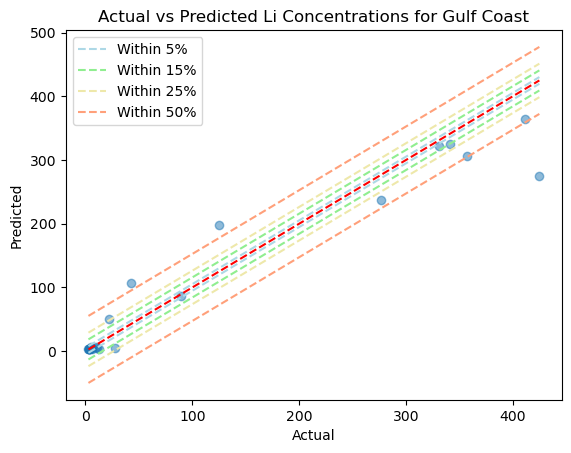

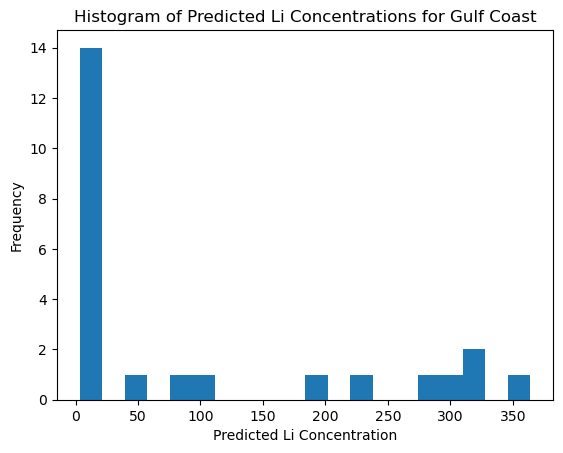

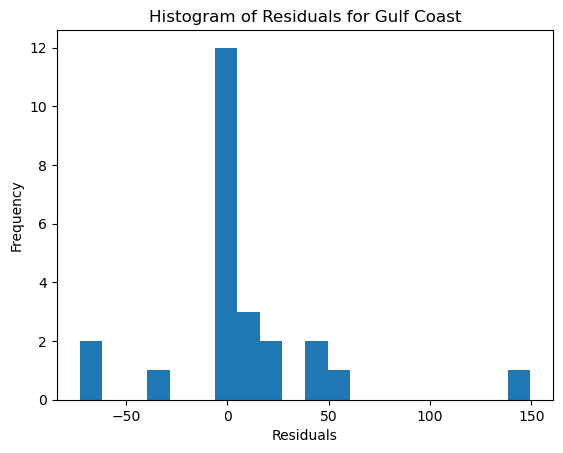

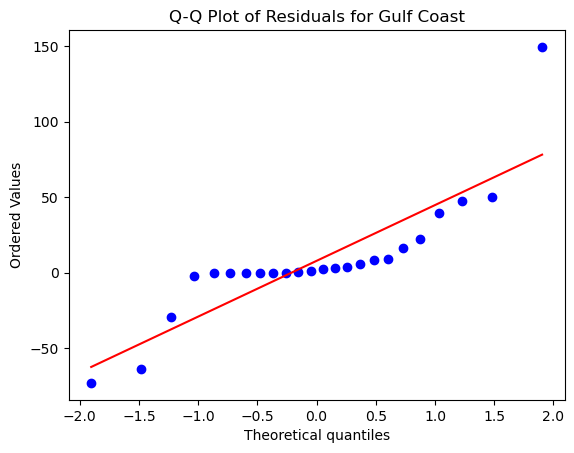

Williston
Number of data points:  0
No round01_ni_nc model generated for Williston.
Michigan
Number of data points:  0
No round01_ni_nc model generated for Michigan.
Pacific
Number of data points:  0
No round01_ni_nc model generated for Pacific.
Illinois
Number of data points:  0
No round01_ni_nc model generated for Illinois.
Great Plains
Number of data points:  0
No round01_ni_nc model generated for Great Plains.
Anadarko
Number of data points:  0
No round01_ni_nc model generated for Anadarko.
Rocky Mountain
Number of data points:  7
Number of samples in the training dataset: 4
Best parameters: {'C': 0.1, 'epsilon': 0.01, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 953.5555555555557
MSE of the model: 1409.0668157722664
The model's MSE is close to or larger than the variance of the target variable.
The model's performance may be limited compared to the variability of the target variable.
RMS

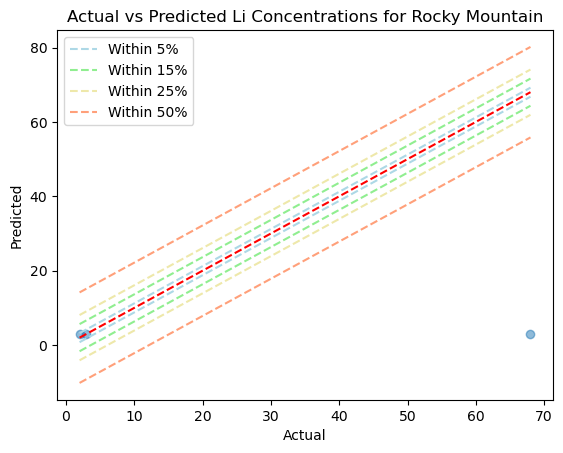

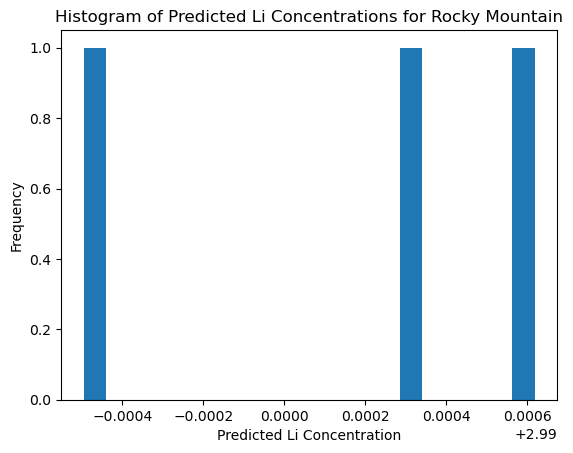

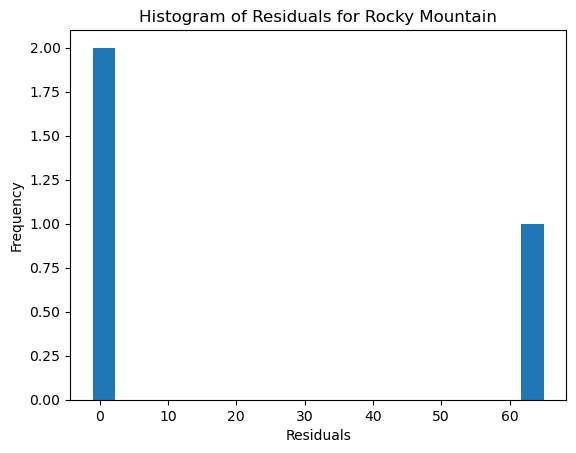

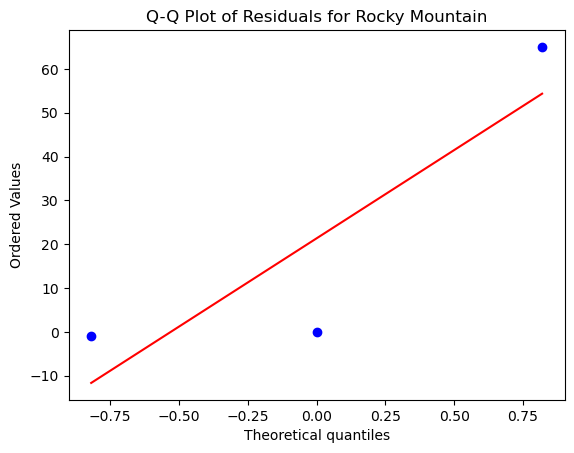

Fort Worth
Number of data points:  0
No round01_ni_nc model generated for Fort Worth.


,round,basin,data_row_count,feature_quantity,feature_list,kernel_options,best_kernel,c_options,best_c,epsilon_options,...,within_5_percent,within_15_percent,within_25_percent,within_50_percent,results_min%_difference,results_max%_difference,0.25_quantile_loss,0.5_quantile_loss,0.75_quantile_loss,cross_val_mse
1,01_ni_nc,Rocky Mountain,7,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",0.1,"[0.01, 0.1, 0.5]",...,66.67,66.67,66.67,66.67,0.35,95.6,0.50,0.99,33.00,0.25
0,01_ni_nc,Gulf Coast,78,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",poly,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",...,50.00,62.50,70.83,87.50,0.35,148.6,0.45,4.86,31.75,37823.29


In [78]:
# Define all the variables...
round = '01_ni_nc'
test_size = 0.3
random_state = 42
kernel_values = ['linear', 'rbf', 'poly']
c_values = [0.1, 1, 10]
epsilon_values = [0.01, 0.1, 0.5]

# Run the function...
df_round01_ni_nc = generate_svr_models_by_basin(df=df, round=round, basins=basins, categorical_columns=categorical_columns, 
                                              test_size=test_size, random_state=random_state, kernel_values=kernel_values, 
                                              c_values=c_values, epsilon_values=epsilon_values)
df_round01_ni_nc

#### ROUND 2

Appalachian
Number of data points:  0
No round02_ni_nc model generated for Appalachian.
Permian
Number of data points:  0
No round02_ni_nc model generated for Permian.
Oklahoma Platform
Number of data points:  0
No round02_ni_nc model generated for Oklahoma Platform.
Gulf Coast
Number of data points:  78
Number of samples in the training dataset: 54
Best parameters: {'C': 100, 'epsilon': 0.5, 'kernel': 'poly'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 22587.945815972216
MSE of the model: 1430.4411279793196
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 37.82117301167852
MAE of the best SVR model: 18.83675500123543
-------------------------------
R-squared (Coefficient of Determination): 0.93667236765869
-------------------------------
Percentage of predictions within different to

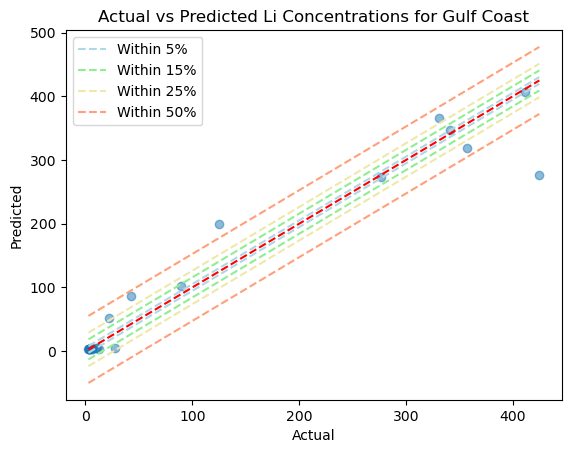

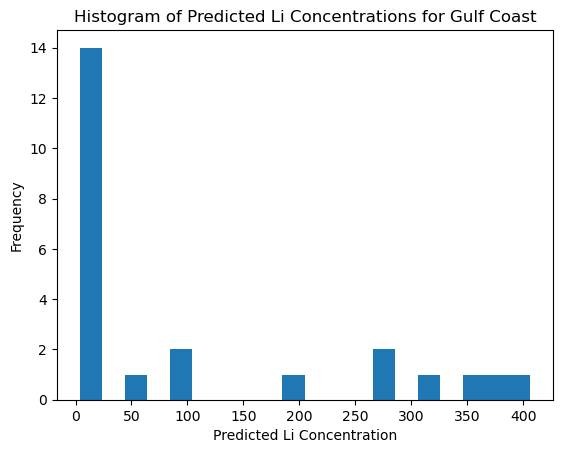

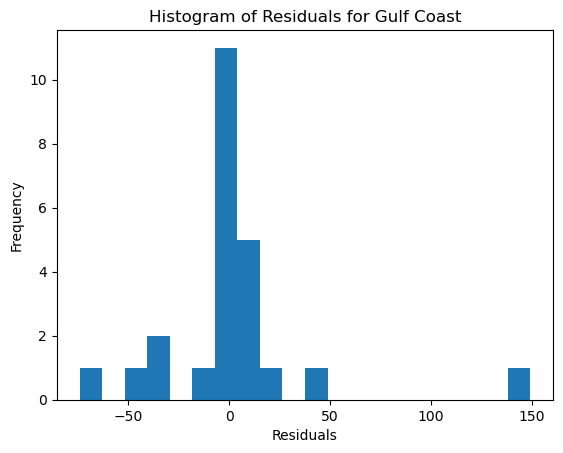

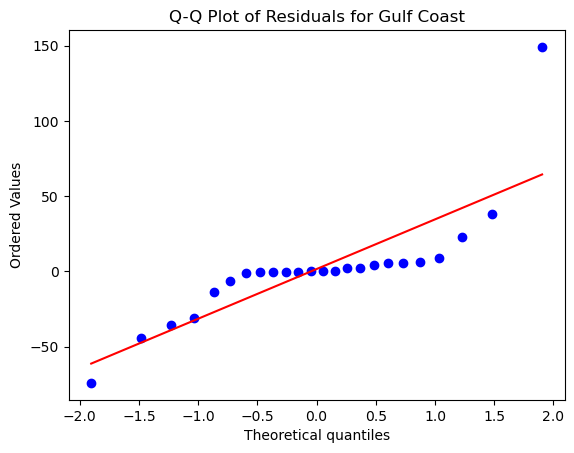

Williston
Number of data points:  0
No round02_ni_nc model generated for Williston.
Michigan
Number of data points:  0
No round02_ni_nc model generated for Michigan.
Pacific
Number of data points:  0
No round02_ni_nc model generated for Pacific.
Illinois
Number of data points:  0
No round02_ni_nc model generated for Illinois.
Great Plains
Number of data points:  0
No round02_ni_nc model generated for Great Plains.
Anadarko
Number of data points:  0
No round02_ni_nc model generated for Anadarko.
Rocky Mountain
Number of data points:  7
Number of samples in the training dataset: 4
Best parameters: {'C': 0.1, 'epsilon': 0.01, 'kernel': 'sigmoid'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 953.5555555555557
MSE of the model: 1408.5981502298055
The model's MSE is close to or larger than the variance of the target variable.
The model's performance may be limited compared to the variability of the target variable.

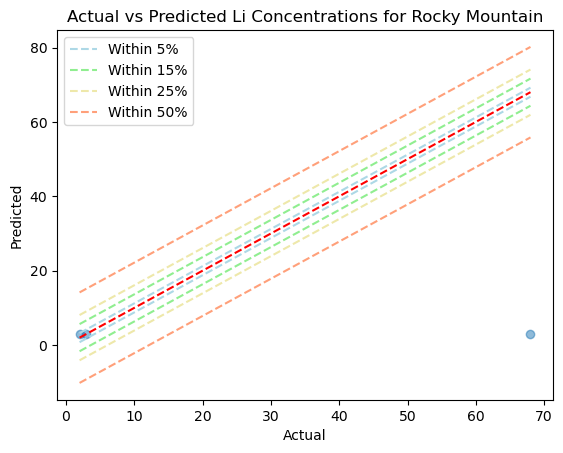

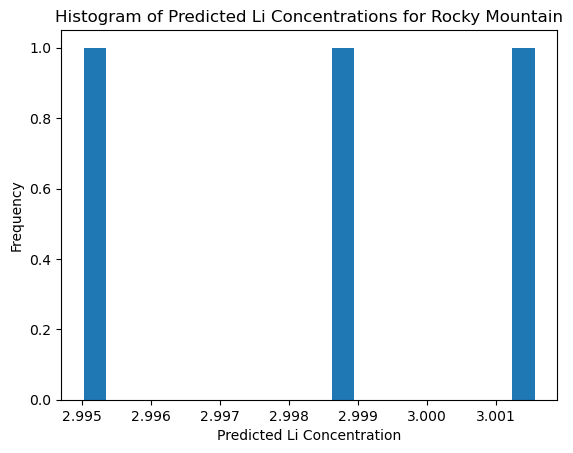

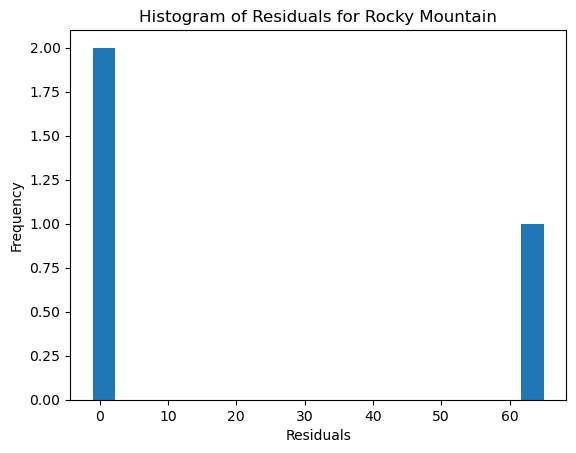

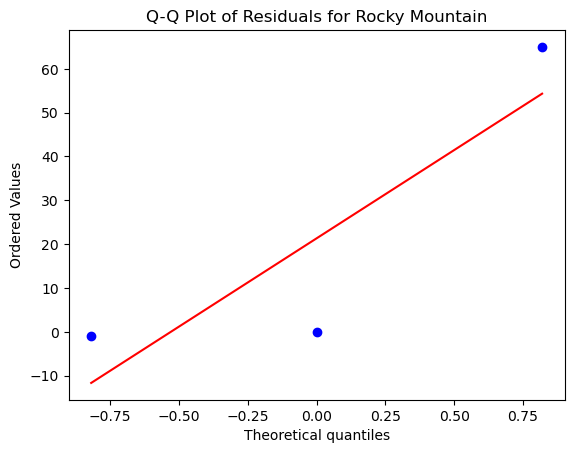

Fort Worth
Number of data points:  0
No round02_ni_nc model generated for Fort Worth.


,round,basin,data_row_count,feature_quantity,feature_list,kernel_options,best_kernel,c_options,best_c,epsilon_options,...,within_5_percent,within_15_percent,within_25_percent,within_50_percent,results_min%_difference,results_max%_difference,0.25_quantile_loss,0.5_quantile_loss,0.75_quantile_loss,cross_val_mse
0,02_ni_nc,Gulf Coast,78,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly, sigmoid]",poly,"[0.1, 0.5, 1, 5, 10, 50, 100]",100.0,"[0.01, 0.05, 0.1, 0.2, 0.5]",...,45.83,70.83,75.00,91.67,0.67,140.26,0.7,5.38,24.65,36325.49
1,02_ni_nc,Rocky Mountain,7,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly, sigmoid]",sigmoid,"[0.1, 0.5, 1, 5, 10, 50, 100]",0.1,"[0.01, 0.05, 0.1, 0.2, 0.5]",...,66.67,66.67,66.67,66.67,0.17,95.59,0.5,1.00,33.00,0.25


In [79]:
# Define all the variables...
round = '02_ni_nc'
test_size = 0.3
random_state = 42
kernel_values = ['linear', 'rbf', 'poly', 'sigmoid']
c_values = [0.1, 0.5, 1, 5, 10, 50, 100]
epsilon_values = [0.01, 0.05, 0.1, 0.2, 0.5]

# Run the function...
df_round02_ni_nc = generate_svr_models_by_basin(df=df, round=round, basins=basins, categorical_columns=categorical_columns, 
                                              test_size=test_size, random_state=random_state, kernel_values=kernel_values, 
                                              c_values=c_values, epsilon_values=epsilon_values)
df_round02_ni_nc

#### ROUND 3 - NOT RUN

In [80]:
# # Define all the variables...
# round = '03_ni_nc'
# test_size = 0.25
# random_state = 42
# kernel_values = ['rbf', 'poly', 'sigmoid']
# c_values = [0.1, 0.5, 1, 5, 10, 50]
# epsilon_values = [0.01, 0.05, 0.1, 0.2]

# # Run the function...
# df_round03_ni_nc = generate_svr_models_by_basin(df=df, round=round, basins=basins, categorical_columns=categorical_columns, 
#                                               test_size=test_size, random_state=random_state, kernel_values=kernel_values, 
#                                               c_values=c_values, epsilon_values=epsilon_values)
# df_round03_ni_nc

#### ROUND 4 - NOT RUN

In [81]:
# # Define all the variables...
# round = '04_ni_nc'
# test_size = 0.25
# random_state = 42
# kernel_values = ['rbf', 'poly', 'sigmoid']
# c_values = [0.1, 0.5, 1, 5, 10]
# epsilon_values = [0.01, 0.05, 0.1]

# # Run the function...
# df_round04_ni_nc = generate_svr_models_by_basin(df=df, round=round, basins=basins, categorical_columns=categorical_columns, 
#                                               test_size=test_size, random_state=random_state, kernel_values=kernel_values, 
#                                               c_values=c_values, epsilon_values=epsilon_values)
# df_round04_ni_nc

#### ROUND 5 - NOT RUN

In [82]:
# # Define all the variables...
# round = '05_ni_nc'
# test_size = 0.4
# random_state = 42
# kernel_values = ['rbf', 'poly', 'sigmoid']
# c_values = [10, 50, 100, 150, 200]
# epsilon_values = [0.1, 0.2, 0.3, 0.4, 0.5]

# # Run the function...
# df_round05_ni_nc = generate_svr_models_by_basin(df=df, round=round, basins=basins, categorical_columns=categorical_columns, 
#                                               test_size=test_size, random_state=random_state, kernel_values=kernel_values, 
#                                               c_values=c_values, epsilon_values=epsilon_values)
# df_round05_ni_nc

#### ROUND 6 - NOT RUN

In [83]:
# # Define all the variables...
# round = '06_ni_nc'
# test_size = 0.25
# random_state = 42
# kernel_values = ['rbf', 'poly', 'sigmoid']
# c_values = [10, 50, 100, 150, 200]
# epsilon_values = [0.1, 0.2, 0.3, 0.4, 0.5]

# # Run the function...
# df_round06_ni_nc = generate_svr_models_by_basin(df=df, round=round, basins=basins, categorical_columns=categorical_columns, 
#                                               test_size=test_size, random_state=random_state, kernel_values=kernel_values, 
#                                               c_values=c_values, epsilon_values=epsilon_values)
# df_round06_ni_nc

#### ROUND 7 - NOT RUN

In [84]:
# # Define all the variables...
# round = '07_ni_nc'
# test_size = 0.25
# random_state = 42
# kernel_values = ['rbf', 'poly']
# c_values = [10, 20, 30, 40, 50]
# epsilon_values = [0.1, 0.2, 0.3, 0.4, 0.5]

# # Run the function...
# df_round07_ni_nc = generate_svr_models_by_basin(df=df, round=round, basins=basins, categorical_columns=categorical_columns, 
#                                               test_size=test_size, random_state=random_state, kernel_values=kernel_values, 
#                                               c_values=c_values, epsilon_values=epsilon_values)
# df_round07_ni_nc

### INPUT: Base df (w/ imputed) (no categorical) (element concentrations only)

In [104]:
# Define the input df for this section
df = df_with_imputed.copy()

# Drop the 'IDUSGS' column as it is not needed
columns_to_drop = ['IDUSGS', 'API', 'DATESAMPLE', 'PLAYTYPE', 'WELLTYPE', 
                   'FORMSIMPLE', 'STATE', 'COUNTY', 'PROVINCE', 'REGION', 
                   'WELLNAME', 'PERIOD', 'LATITUDE', 'LONGITUDE', 
                   'DEPTHUPPER', 'DEPTHLOWER', 'CHARGEBAL']
df.drop(columns_to_drop, axis=1, inplace=True)

# Define variables that are common to all rounds
basins = df['BASIN_CATEGORY'].unique()
categorical_columns = []

#### ROUND 2

In [ ]:
# Define all the variables...
round = '02_wi_nc_eo'
test_size = 0.3
random_state = 42
kernel_values = ['linear', 'rbf', 'poly', 'sigmoid']
c_values = [0.1, 0.5, 1, 5, 10, 50, 100]
epsilon_values = [0.01, 0.05, 0.1, 0.2, 0.5]

# Run the function...
df_round02_ni_nc_eo = generate_svr_models_by_basin(df=df, round=round, basins=basins, categorical_columns=categorical_columns, 
                                              test_size=test_size, random_state=random_state, kernel_values=kernel_values, 
                                              c_values=c_values, epsilon_values=epsilon_values)
df_round02_ni_nc_eo

## <ins>Evaluate results

### PCA

#### Merge all results dfs into 1 large df for evaluation

In [85]:
rounds = [df_round01_pca, df_round02_pca, df_round03_pca, df_round04_pca, df_round05_pca, df_round06_pca, df_round07_pca]

# Concatenate the list of DataFrames into one large DataFrame
df_results_pca = pd.concat(rounds)

# Resetting index to avoid duplicate indices
df_results_pca.reset_index(drop=True, inplace=True)

df_results_pca

,round,basin,data_row_count,feature_quantity,feature_list,kernel_options,best_kernel,c_options,best_c,epsilon_options,...,within_5_percent,within_15_percent,within_25_percent,within_50_percent,results_min%_difference,results_max%_difference,0.25_quantile_loss,0.5_quantile_loss,0.75_quantile_loss,cross_val_mse
0,01_pca,Great Plains,62,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",...,63.16,94.74,94.74,94.74,14.45,202.52,0.58,1.16,3.34,5.17
1,01_pca,Anadarko,262,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[linear, rbf, poly]",linear,"[0.1, 1, 10]",1.0,"[0.01, 0.1, 0.5]",...,26.58,62.03,65.82,81.01,1.21,1714.82,1.67,3.29,12.14,5654.93
2,01_pca,Gulf Coast,888,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[linear, rbf, poly]",poly,"[0.1, 1, 10]",1.0,"[0.01, 0.1, 0.5]",...,27.34,61.80,67.42,78.28,0.30,874.13,2.55,4.61,21.59,5375.06
3,01_pca,Permian,481,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",...,21.38,56.55,71.03,88.97,0.35,879.90,1.45,3.28,6.68,182.84
4,01_pca,Appalachian,652,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[linear, rbf, poly]",linear,"[0.1, 1, 10]",1.0,"[0.01, 0.1, 0.5]",...,17.35,43.37,63.27,79.08,0.01,4015.79,5.38,11.66,26.23,3594.79
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79,07_pca,Pacific,145,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly]",rbf,"[10, 20, 30, 40, 50]",40.0,"[0.1, 0.2, 0.3, 0.4, 0.5]",...,18.92,40.54,62.16,81.08,1.97,3939.56,0.15,0.48,0.85,1.96
80,07_pca,Fort Worth,17,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly]",rbf,"[10, 20, 30, 40, 50]",20.0,"[0.1, 0.2, 0.3, 0.4, 0.5]",...,0.00,40.00,60.00,80.00,79.37,278.65,2.27,3.11,9.08,76.18
81,07_pca,Michigan,150,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly]",rbf,"[10, 20, 30, 40, 50]",50.0,"[0.1, 0.2, 0.3, 0.4, 0.5]",...,18.42,34.21,42.11,89.47,0.48,734.11,1.93,6.43,8.63,177.71
82,07_pca,Illinois,25,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly]",rbf,"[10, 20, 30, 40, 50]",10.0,"[0.1, 0.2, 0.3, 0.4, 0.5]",...,14.29,28.57,57.14,71.43,11.91,143.24,2.00,3.11,10.81,81.13


#### Create df with which model generated highest value within 15% for each basin

In [86]:
# Grouping by 'basin' and finding the maximum value in 'within_15_percent' column
best_models_within_15_percent_pca = df_results_pca.groupby('basin')['within_15_percent'].max()

# Merge the max_values with df_results to get the corresponding row for each maximum value
df_best_models_within_15_percent_pca = pd.merge(best_models_within_15_percent_pca, df_results_pca, on=['basin', 'within_15_percent'], how='inner')

# Sort the DataFrame by 'basin' for clarity
df_best_models_within_15_percent_pca.sort_values(by='within_15_percent',ascending=False, inplace=True)

# Resetting index for clarity
df_best_models_within_15_percent_pca.reset_index(drop=True, inplace=True)
df_best_models_within_15_percent_pca

,basin,within_15_percent,round,data_row_count,feature_quantity,feature_list,kernel_options,best_kernel,c_options,best_c,...,r2,within_5_percent,within_25_percent,within_50_percent,results_min%_difference,results_max%_difference,0.25_quantile_loss,0.5_quantile_loss,0.75_quantile_loss,cross_val_mse
0,Great Plains,94.74,01_pca,62,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,...,-0.05,63.16,94.74,94.74,14.45,202.52,0.58,1.16,3.34,5.17
1,Great Plains,94.74,02_pca,62,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[linear, rbf, poly, sigmoid]",rbf,"[0.1, 0.5, 1, 5, 10, 50, 100]",50.0,...,-0.05,57.89,94.74,94.74,6.24,153.47,0.55,0.88,2.99,4.70
2,Anadarko,74.24,04_pca,262,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",poly,"[0.1, 0.5, 1, 5, 10]",0.1,...,0.25,40.91,74.24,84.85,0.14,240.72,0.53,1.89,5.52,12574.85
3,Gulf Coast,73.87,06_pca,888,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",200.0,...,0.32,51.35,78.38,92.79,0.01,1567.18,0.94,2.47,9.38,4266.12
4,Permian,60.33,07_pca,481,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly]",rbf,"[10, 20, 30, 40, 50]",40.0,...,0.12,23.97,74.38,91.74,0.74,958.72,1.11,2.32,5.40,1121.38
5,Permian,60.33,06_pca,481,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",50.0,...,0.13,23.14,75.21,91.74,0.02,940.75,1.12,2.24,5.30,1122.37
6,Williston,60.20,05_pca,502,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",200.0,...,0.74,27.36,70.65,82.59,0.18,28017.22,1.55,3.85,10.22,1972.84
7,Appalachian,59.51,03_pca,652,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[0.1, 0.5, 1, 5, 10, 50]",50.0,...,0.46,26.99,69.94,82.82,0.28,4922.94,3.19,7.27,19.93,3156.63
8,Appalachian,59.51,07_pca,652,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly]",rbf,"[10, 20, 30, 40, 50]",50.0,...,0.46,25.15,69.94,82.82,0.12,4837.35,3.34,7.10,19.83,3154.81
9,Pacific,45.45,02_pca,145,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[linear, rbf, poly, sigmoid]",rbf,"[0.1, 0.5, 1, 5, 10, 50, 100]",50.0,...,0.64,20.45,65.91,81.82,0.18,3942.88,0.17,0.42,0.68,2.16


#### Create df with which model generated highest value of r2 for each basin

In [87]:
# Grouping by 'basin' and finding the maximum value in 'within_15_percent' column
best_models_r2_pca = df_results_pca.groupby('basin')['r2'].max()

# Merge the max_values with df_results to get the corresponding row for each maximum value
df_best_models_r2_pca = pd.merge(best_models_r2_pca, df_results_pca, on=['basin', 'r2'], how='inner')

# Sort the DataFrame by 'basin' for clarity
df_best_models_r2_pca.sort_values(by='r2',ascending=False, inplace=True)

# Resetting index for clarity
df_best_models_r2_pca.reset_index(drop=True, inplace=True)
df_best_models_r2_pca

,basin,r2,round,data_row_count,feature_quantity,feature_list,kernel_options,best_kernel,c_options,best_c,...,within_5_percent,within_15_percent,within_25_percent,within_50_percent,results_min%_difference,results_max%_difference,0.25_quantile_loss,0.5_quantile_loss,0.75_quantile_loss,cross_val_mse
0,Williston,0.81,06_pca,502,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",200.0,...,24.60,56.35,68.25,84.13,0.08,32025.63,1.64,4.00,9.35,1756.97
1,Michigan,0.76,06_pca,150,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",50.0,...,18.42,34.21,42.11,89.47,0.48,734.11,1.93,6.43,8.63,177.71
2,Michigan,0.76,07_pca,150,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly]",rbf,"[10, 20, 30, 40, 50]",50.0,...,18.42,34.21,42.11,89.47,0.48,734.11,1.93,6.43,8.63,177.71
3,Rocky Mountain,0.75,06_pca,693,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",150.0,...,12.07,40.23,57.47,82.76,0.37,2348.34,0.76,1.61,3.06,73.74
4,Anadarko,0.67,06_pca,262,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",200.0,...,42.42,57.58,71.21,81.82,1.53,1274.98,0.73,1.79,7.25,6963.05
5,Pacific,0.65,06_pca,145,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",50.0,...,18.92,37.84,64.86,83.78,0.84,3982.15,0.16,0.43,0.74,2.04
6,Fort Worth,0.56,01_pca,17,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[linear, rbf, poly]",linear,"[0.1, 1, 10]",10.0,...,16.67,16.67,16.67,50.00,23.07,643.23,4.66,10.41,24.65,68.53
7,Appalachian,0.54,01_pca,652,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[linear, rbf, poly]",linear,"[0.1, 1, 10]",1.0,...,17.35,43.37,63.27,79.08,0.01,4015.79,5.38,11.66,26.23,3594.79
8,Gulf Coast,0.45,05_pca,888,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",150.0,...,46.35,71.07,77.81,90.73,0.36,1336.97,1.04,3.00,11.10,5297.03
9,Oklahoma Platform,0.44,05_pca,254,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",150.0,...,11.76,24.51,33.33,66.67,0.01,1055.68,2.81,7.08,11.48,162.56


### WI_WC

#### Merge all results dfs into 1 large df for evaluation

In [88]:
rounds = [df_round01_wi_wc]#, df_round02_wi_wc, df_round03_wi_wc, df_round04_wi_wc, df_round05_wi_wc, df_round06_wi_wc, df_round07_wi_wc]

# Concatenate the list of DataFrames into one large DataFrame
df_results_wi_wc = pd.concat(rounds)

# Resetting index to avoid duplicate indices
df_results_wi_wc.reset_index(drop=True, inplace=True)

df_results_wi_wc

,round,basin,data_row_count,feature_quantity,feature_list,kernel_options,best_kernel,c_options,best_c,epsilon_options,...,within_5_percent,within_15_percent,within_25_percent,within_50_percent,results_min%_difference,results_max%_difference,0.25_quantile_loss,0.5_quantile_loss,0.75_quantile_loss,cross_val_mse
0,01_wi_wc,Fort Worth,4,35,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",linear,"[0.1, 1, 10]",0.1,"[0.01, 0.1, 0.5]",...,50.00,100.00,100.00,100.00,4.63,11.96,1.75,2.17,2.58,289.00
1,01_wi_wc,Great Plains,29,95,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",poly,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",...,66.67,88.89,88.89,88.89,11.87,118.41,0.97,1.80,7.23,34.66
2,01_wi_wc,Gulf Coast,222,343,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",poly,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",...,38.81,64.18,70.15,74.63,0.87,3534.70,2.96,6.67,49.60,21893.47
3,01_wi_wc,Pacific,62,79,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",...,31.58,63.16,73.68,89.47,2.09,59.46,0.06,0.18,0.32,0.29
4,01_wi_wc,Williston,269,253,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",poly,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",...,39.51,58.02,75.31,80.25,0.03,366.87,0.90,5.34,9.07,3516.76
5,01_wi_wc,Michigan,52,93,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",...,43.75,56.25,56.25,75.00,0.86,113.40,0.34,1.30,5.17,9.93
6,01_wi_wc,Rocky Mountain,539,538,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",...,12.35,41.98,58.64,72.22,0.42,444.57,0.67,1.62,5.07,147.24
7,01_wi_wc,Appalachian,71,137,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",...,4.55,31.82,45.45,59.09,11.66,101.24,3.08,14.43,32.29,2239.31
8,01_wi_wc,Anadarko,180,167,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",...,14.81,27.78,50.00,83.33,0.26,1089.63,0.79,1.70,2.25,1948.58
9,01_wi_wc,Permian,184,257,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",...,7.14,25.00,35.71,58.93,0.98,1391.27,1.64,4.33,8.16,452.97


#### Create df with which model generated highest value within 15% for each basin

In [89]:
# Grouping by 'basin' and finding the maximum value in 'within_15_percent' column
best_models_within_15_percent_wi_wc = df_results_wi_wc.groupby('basin')['within_15_percent'].max()

# Merge the max_values with df_results to get the corresponding row for each maximum value
df_best_models_within_15_percent_wi_wc = pd.merge(best_models_within_15_percent_wi_wc, df_results_wi_wc, on=['basin', 'within_15_percent'], how='inner')

# Sort the DataFrame by 'basin' for clarity
df_best_models_within_15_percent_wi_wc.sort_values(by='within_15_percent',ascending=False, inplace=True)

# Resetting index for clarity
df_best_models_within_15_percent_wi_wc.reset_index(drop=True, inplace=True)
df_best_models_within_15_percent_wi_wc

,basin,within_15_percent,round,data_row_count,feature_quantity,feature_list,kernel_options,best_kernel,c_options,best_c,...,r2,within_5_percent,within_25_percent,within_50_percent,results_min%_difference,results_max%_difference,0.25_quantile_loss,0.5_quantile_loss,0.75_quantile_loss,cross_val_mse
0,Fort Worth,100.00,01_wi_wc,4,35,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",linear,"[0.1, 1, 10]",0.1,...,-0.34,50.00,100.00,100.00,4.63,11.96,1.75,2.17,2.58,289.00
1,Great Plains,88.89,01_wi_wc,29,95,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",poly,"[0.1, 1, 10]",10.0,...,-0.13,66.67,88.89,88.89,11.87,118.41,0.97,1.80,7.23,34.66
2,Gulf Coast,64.18,01_wi_wc,222,343,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",poly,"[0.1, 1, 10]",10.0,...,0.11,38.81,70.15,74.63,0.87,3534.70,2.96,6.67,49.60,21893.47
3,Pacific,63.16,01_wi_wc,62,79,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,...,0.57,31.58,73.68,89.47,2.09,59.46,0.06,0.18,0.32,0.29
4,Williston,58.02,01_wi_wc,269,253,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",poly,"[0.1, 1, 10]",10.0,...,-0.09,39.51,75.31,80.25,0.03,366.87,0.90,5.34,9.07,3516.76
5,Michigan,56.25,01_wi_wc,52,93,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,...,0.49,43.75,56.25,75.00,0.86,113.40,0.34,1.30,5.17,9.93
6,Rocky Mountain,41.98,01_wi_wc,539,538,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,...,0.03,12.35,58.64,72.22,0.42,444.57,0.67,1.62,5.07,147.24
7,Appalachian,31.82,01_wi_wc,71,137,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,...,-0.06,4.55,45.45,59.09,11.66,101.24,3.08,14.43,32.29,2239.31
8,Anadarko,27.78,01_wi_wc,180,167,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,...,-0.02,14.81,50.00,83.33,0.26,1089.63,0.79,1.70,2.25,1948.58
9,Permian,25.00,01_wi_wc,184,257,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,...,0.14,7.14,35.71,58.93,0.98,1391.27,1.64,4.33,8.16,452.97


#### Create df with which model generated highest value of r2 for each basin

In [90]:
# Grouping by 'basin' and finding the maximum value in 'within_15_percent' column
best_models_r2_wi_wc = df_results_wi_wc.groupby('basin')['r2'].max()

# Merge the max_values with df_results to get the corresponding row for each maximum value
df_best_models_r2_wi_wc = pd.merge(best_models_r2_wi_wc, df_results_wi_wc, on=['basin', 'r2'], how='inner')

# Sort the DataFrame by 'basin' for clarity
df_best_models_r2_wi_wc.sort_values(by='r2',ascending=False, inplace=True)

# Resetting index for clarity
df_best_models_r2_wi_wc.reset_index(drop=True, inplace=True)
df_best_models_r2_wi_wc

,basin,r2,round,data_row_count,feature_quantity,feature_list,kernel_options,best_kernel,c_options,best_c,...,within_5_percent,within_15_percent,within_25_percent,within_50_percent,results_min%_difference,results_max%_difference,0.25_quantile_loss,0.5_quantile_loss,0.75_quantile_loss,cross_val_mse
0,Pacific,0.57,01_wi_wc,62,79,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,...,31.58,63.16,73.68,89.47,2.09,59.46,0.06,0.18,0.32,0.29
1,Michigan,0.49,01_wi_wc,52,93,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,...,43.75,56.25,56.25,75.00,0.86,113.40,0.34,1.30,5.17,9.93
2,Permian,0.14,01_wi_wc,184,257,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,...,7.14,25.00,35.71,58.93,0.98,1391.27,1.64,4.33,8.16,452.97
3,Gulf Coast,0.11,01_wi_wc,222,343,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",poly,"[0.1, 1, 10]",10.0,...,38.81,64.18,70.15,74.63,0.87,3534.70,2.96,6.67,49.60,21893.47
4,Rocky Mountain,0.03,01_wi_wc,539,538,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,...,12.35,41.98,58.64,72.22,0.42,444.57,0.67,1.62,5.07,147.24
5,Anadarko,-0.02,01_wi_wc,180,167,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,...,14.81,27.78,50.00,83.33,0.26,1089.63,0.79,1.70,2.25,1948.58
6,Oklahoma Platform,-0.02,01_wi_wc,105,160,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",0.1,...,0.00,6.25,12.50,31.25,10.15,1157.92,5.33,9.10,10.29,353.76
7,Appalachian,-0.06,01_wi_wc,71,137,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,...,4.55,31.82,45.45,59.09,11.66,101.24,3.08,14.43,32.29,2239.31
8,Williston,-0.09,01_wi_wc,269,253,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",poly,"[0.1, 1, 10]",10.0,...,39.51,58.02,75.31,80.25,0.03,366.87,0.90,5.34,9.07,3516.76
9,Great Plains,-0.13,01_wi_wc,29,95,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",poly,"[0.1, 1, 10]",10.0,...,66.67,88.89,88.89,88.89,11.87,118.41,0.97,1.80,7.23,34.66


### WI_NC

#### Merge all results dfs into 1 large df for evaluation

In [91]:
rounds = [df_round01_wi_nc]#, df_round02_wi_nc, df_round03_wi_nc, df_round04_wi_nc, df_round05_wi_nc, df_round06_wi_nc, df_round07_wi_nc]

# Concatenate the list of DataFrames into one large DataFrame
df_results_wi_nc = pd.concat(rounds)

# Resetting index to avoid duplicate indices
df_results_wi_nc.reset_index(drop=True, inplace=True)

df_results_wi_nc

,round,basin,data_row_count,feature_quantity,feature_list,kernel_options,best_kernel,c_options,best_c,epsilon_options,...,within_5_percent,within_15_percent,within_25_percent,within_50_percent,results_min%_difference,results_max%_difference,0.25_quantile_loss,0.5_quantile_loss,0.75_quantile_loss,cross_val_mse
0,01_wi_nc,Great Plains,35,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",1.0,"[0.01, 0.1, 0.5]",...,63.64,90.91,90.91,90.91,6.24,140.68,1.21,2.66,4.19,9.66
1,01_wi_nc,Michigan,64,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",...,30.00,65.00,70.00,85.00,0.86,158.71,0.67,1.59,4.82,66.59
2,01_wi_nc,Anadarko,205,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",...,12.90,61.29,83.87,87.10,1.44,265.73,0.81,1.38,1.74,959.39
3,01_wi_nc,Gulf Coast,326,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",poly,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",...,39.80,56.12,64.29,75.51,2.07,603.05,1.59,4.89,23.95,25109.72
4,01_wi_nc,Williston,292,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",poly,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",...,34.09,50.00,73.86,80.68,0.32,367.31,0.93,5.07,9.08,4291.40
5,01_wi_nc,Appalachian,115,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",poly,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",...,17.14,48.57,54.29,68.57,7.81,1743.83,4.88,12.69,40.46,3024.39
6,01_wi_nc,Rocky Mountain,575,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",...,10.40,33.53,49.71,75.72,0.33,930.87,0.73,1.79,3.53,197.46
7,01_wi_nc,Fort Worth,10,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",linear,"[0.1, 1, 10]",0.1,"[0.01, 0.1, 0.5]",...,33.33,33.33,66.67,66.67,9.66,495.15,1.38,2.41,14.92,18.65
8,01_wi_nc,Permian,210,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",...,14.29,31.75,47.62,66.67,0.55,527.35,1.31,3.71,8.74,356.97
9,01_wi_nc,Pacific,111,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",...,8.82,26.47,61.76,76.47,1.78,543.25,0.22,0.33,0.60,0.39


#### Create df with which model generated highest value within 15% for each basin

In [92]:
# Grouping by 'basin' and finding the maximum value in 'within_15_percent' column
best_models_within_15_percent_wi_nc = df_results_wi_nc.groupby('basin')['within_15_percent'].max()

# Merge the max_values with df_results to get the corresponding row for each maximum value
df_best_models_within_15_percent_wi_nc = pd.merge(best_models_within_15_percent_wi_nc, df_results_wi_nc, on=['basin', 'within_15_percent'], how='inner')

# Sort the DataFrame by 'basin' for clarity
df_best_models_within_15_percent_wi_nc.sort_values(by='within_15_percent',ascending=False, inplace=True)

# Resetting index for clarity
df_best_models_within_15_percent_wi_nc.reset_index(drop=True, inplace=True)
df_best_models_within_15_percent_wi_nc

,basin,within_15_percent,round,data_row_count,feature_quantity,feature_list,kernel_options,best_kernel,c_options,best_c,...,r2,within_5_percent,within_25_percent,within_50_percent,results_min%_difference,results_max%_difference,0.25_quantile_loss,0.5_quantile_loss,0.75_quantile_loss,cross_val_mse
0,Great Plains,90.91,01_wi_nc,35,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",1.0,...,-0.10,63.64,90.91,90.91,6.24,140.68,1.21,2.66,4.19,9.66
1,Michigan,65.00,01_wi_nc,64,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,...,0.66,30.00,70.00,85.00,0.86,158.71,0.67,1.59,4.82,66.59
2,Anadarko,61.29,01_wi_nc,205,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,...,-0.02,12.90,83.87,87.10,1.44,265.73,0.81,1.38,1.74,959.39
3,Gulf Coast,56.12,01_wi_nc,326,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",poly,"[0.1, 1, 10]",10.0,...,0.47,39.80,64.29,75.51,2.07,603.05,1.59,4.89,23.95,25109.72
4,Williston,50.00,01_wi_nc,292,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",poly,"[0.1, 1, 10]",10.0,...,-0.08,34.09,73.86,80.68,0.32,367.31,0.93,5.07,9.08,4291.40
5,Appalachian,48.57,01_wi_nc,115,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",poly,"[0.1, 1, 10]",10.0,...,0.04,17.14,54.29,68.57,7.81,1743.83,4.88,12.69,40.46,3024.39
6,Rocky Mountain,33.53,01_wi_nc,575,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,...,0.14,10.40,49.71,75.72,0.33,930.87,0.73,1.79,3.53,197.46
7,Fort Worth,33.33,01_wi_nc,10,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",linear,"[0.1, 1, 10]",0.1,...,-1.49,33.33,66.67,66.67,9.66,495.15,1.38,2.41,14.92,18.65
8,Permian,31.75,01_wi_nc,210,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,...,-0.03,14.29,47.62,66.67,0.55,527.35,1.31,3.71,8.74,356.97
9,Pacific,26.47,01_wi_nc,111,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,...,0.34,8.82,61.76,76.47,1.78,543.25,0.22,0.33,0.60,0.39


#### Create df with which model generated highest value of r2 for each basin

In [93]:
# Grouping by 'basin' and finding the maximum value in 'within_15_percent' column
best_models_r2_wi_nc = df_results_wi_nc.groupby('basin')['r2'].max()

# Merge the max_values with df_results to get the corresponding row for each maximum value
df_best_models_r2_wi_nc = pd.merge(best_models_r2_wi_nc, df_results_wi_nc, on=['basin', 'r2'], how='inner')

# Sort the DataFrame by 'basin' for clarity
df_best_models_r2_wi_nc.sort_values(by='r2',ascending=False, inplace=True)

# Resetting index for clarity
df_best_models_r2_wi_nc.reset_index(drop=True, inplace=True)
df_best_models_r2_wi_nc

,basin,r2,round,data_row_count,feature_quantity,feature_list,kernel_options,best_kernel,c_options,best_c,...,within_5_percent,within_15_percent,within_25_percent,within_50_percent,results_min%_difference,results_max%_difference,0.25_quantile_loss,0.5_quantile_loss,0.75_quantile_loss,cross_val_mse
0,Michigan,0.66,01_wi_nc,64,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,...,30.00,65.00,70.00,85.00,0.86,158.71,0.67,1.59,4.82,66.59
1,Gulf Coast,0.47,01_wi_nc,326,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",poly,"[0.1, 1, 10]",10.0,...,39.80,56.12,64.29,75.51,2.07,603.05,1.59,4.89,23.95,25109.72
2,Pacific,0.34,01_wi_nc,111,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,...,8.82,26.47,61.76,76.47,1.78,543.25,0.22,0.33,0.60,0.39
3,Rocky Mountain,0.14,01_wi_nc,575,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,...,10.40,33.53,49.71,75.72,0.33,930.87,0.73,1.79,3.53,197.46
4,Appalachian,0.04,01_wi_nc,115,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",poly,"[0.1, 1, 10]",10.0,...,17.14,48.57,54.29,68.57,7.81,1743.83,4.88,12.69,40.46,3024.39
5,Anadarko,-0.02,01_wi_nc,205,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,...,12.90,61.29,83.87,87.10,1.44,265.73,0.81,1.38,1.74,959.39
6,Permian,-0.03,01_wi_nc,210,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,...,14.29,31.75,47.62,66.67,0.55,527.35,1.31,3.71,8.74,356.97
7,Williston,-0.08,01_wi_nc,292,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",poly,"[0.1, 1, 10]",10.0,...,34.09,50.00,73.86,80.68,0.32,367.31,0.93,5.07,9.08,4291.40
8,Great Plains,-0.10,01_wi_nc,35,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",1.0,...,63.64,90.91,90.91,90.91,6.24,140.68,1.21,2.66,4.19,9.66
9,Oklahoma Platform,-0.17,01_wi_nc,155,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,...,4.26,19.15,29.79,53.19,0.85,863.02,3.76,9.39,13.60,296.63


### NI_WC

#### Merge all results dfs into 1 large df for evaluation

In [ ]:
# rounds = [df_round01_ni_wc, df_round02_ni_wc, df_round03_ni_wc, df_round04_ni_wc, df_round05_ni_wc, df_round06_ni_wc, df_round07_ni_wc]

# # Concatenate the list of DataFrames into one large DataFrame
# df_results_ni_wc = pd.concat(rounds)

# # Resetting index to avoid duplicate indices
# df_results_ni_wc.reset_index(drop=True, inplace=True)

# df_results_ni_wc

#### Create df with which model generated highest value within 15% for each basin

In [ ]:
# # Grouping by 'basin' and finding the maximum value in 'within_15_percent' column
# best_models_within_15_percent_ni_wc = df_results_ni_wc.groupby('basin')['within_15_percent'].max()

# # Merge the max_values with df_results to get the corresponding row for each maximum value
# df_best_models_within_15_percent_ni_wc = pd.merge(best_models_within_15_percent_ni_wc, df_results_ni_wc, on=['basin', 'within_15_percent'], how='inner')

# # Sort the DataFrame by 'basin' for clarity
# df_best_models_within_15_percent_ni_wc.sort_values(by='within_15_percent',ascending=False, inplace=True)

# # Resetting index for clarity
# df_best_models_within_15_percent_ni_wc.reset_index(drop=True, inplace=True)
# df_best_models_within_15_percent_ni_wc

#### Create df with which model generated highest value of r2 for each basin

In [ ]:
# # Grouping by 'basin' and finding the maximum value in 'within_15_percent' column
# best_models_r2_ni_wc = df_results_ni_wc.groupby('basin')['r2'].max()

# # Merge the max_values with df_results to get the corresponding row for each maximum value
# df_best_models_r2_ni_wc = pd.merge(best_models_r2_ni_wc, df_results_ni_wc, on=['basin', 'r2'], how='inner')

# # Sort the DataFrame by 'basin' for clarity
# df_best_models_r2_ni_wc.sort_values(by='r2',ascending=False, inplace=True)

# # Resetting index for clarity
# df_best_models_r2_ni_wc.reset_index(drop=True, inplace=True)
# df_best_models_r2_ni_wc

### NI_NC

#### Merge all results dfs into 1 large df for evaluation

In [94]:
rounds = [df_round01_ni_nc, df_round02_ni_nc]#, df_round03_ni_nc, df_round04_ni_nc, df_round05_ni_nc, df_round06_ni_nc, df_round07_ni_nc]

# Concatenate the list of DataFrames into one large DataFrame
df_results_ni_nc = pd.concat(rounds)

# Resetting index to avoid duplicate indices
df_results_ni_nc.reset_index(drop=True, inplace=True)

df_results_ni_nc

,round,basin,data_row_count,feature_quantity,feature_list,kernel_options,best_kernel,c_options,best_c,epsilon_options,...,within_5_percent,within_15_percent,within_25_percent,within_50_percent,results_min%_difference,results_max%_difference,0.25_quantile_loss,0.5_quantile_loss,0.75_quantile_loss,cross_val_mse
0,01_ni_nc,Rocky Mountain,7,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",0.1,"[0.01, 0.1, 0.5]",...,66.67,66.67,66.67,66.67,0.35,95.60,0.50,0.99,33.00,0.25
1,01_ni_nc,Gulf Coast,78,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",poly,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",...,50.00,62.50,70.83,87.50,0.35,148.60,0.45,4.86,31.75,37823.29
2,02_ni_nc,Gulf Coast,78,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly, sigmoid]",poly,"[0.1, 0.5, 1, 5, 10, 50, 100]",100.0,"[0.01, 0.05, 0.1, 0.2, 0.5]",...,45.83,70.83,75.00,91.67,0.67,140.26,0.70,5.38,24.65,36325.49
3,02_ni_nc,Rocky Mountain,7,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly, sigmoid]",sigmoid,"[0.1, 0.5, 1, 5, 10, 50, 100]",0.1,"[0.01, 0.05, 0.1, 0.2, 0.5]",...,66.67,66.67,66.67,66.67,0.17,95.59,0.50,1.00,33.00,0.25


#### Create df with which model generated highest value within 15% for each basin

In [95]:
# Grouping by 'basin' and finding the maximum value in 'within_15_percent' column
best_models_within_15_percent_ni_nc = df_results_ni_nc.groupby('basin')['within_15_percent'].max()

# Merge the max_values with df_results to get the corresponding row for each maximum value
df_best_models_within_15_percent_ni_nc = pd.merge(best_models_within_15_percent_ni_nc, df_results_ni_nc, on=['basin', 'within_15_percent'], how='inner')

# Sort the DataFrame by 'basin' for clarity
df_best_models_within_15_percent_ni_nc.sort_values(by='within_15_percent',ascending=False, inplace=True)

# Resetting index for clarity
df_best_models_within_15_percent_ni_nc.reset_index(drop=True, inplace=True)
df_best_models_within_15_percent_ni_nc

,basin,within_15_percent,round,data_row_count,feature_quantity,feature_list,kernel_options,best_kernel,c_options,best_c,...,r2,within_5_percent,within_25_percent,within_50_percent,results_min%_difference,results_max%_difference,0.25_quantile_loss,0.5_quantile_loss,0.75_quantile_loss,cross_val_mse
0,Gulf Coast,70.83,02_ni_nc,78,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly, sigmoid]",poly,"[0.1, 0.5, 1, 5, 10, 50, 100]",100.0,...,0.94,45.83,75.00,91.67,0.67,140.26,0.7,5.38,24.65,36325.49
1,Rocky Mountain,66.67,01_ni_nc,7,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",0.1,...,-0.48,66.67,66.67,66.67,0.35,95.60,0.5,0.99,33.00,0.25
2,Rocky Mountain,66.67,02_ni_nc,7,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly, sigmoid]",sigmoid,"[0.1, 0.5, 1, 5, 10, 50, 100]",0.1,...,-0.48,66.67,66.67,66.67,0.17,95.59,0.5,1.00,33.00,0.25


#### Create df with which model generated highest value of r2 for each basin

In [96]:
# Grouping by 'basin' and finding the maximum value in 'within_15_percent' column
best_models_r2_ni_nc = df_results_ni_nc.groupby('basin')['r2'].max()

# Merge the max_values with df_results to get the corresponding row for each maximum value
df_best_models_r2_ni_nc = pd.merge(best_models_r2_ni_nc, df_results_ni_nc, on=['basin', 'r2'], how='inner')

# Sort the DataFrame by 'basin' for clarity
df_best_models_r2_ni_nc.sort_values(by='r2',ascending=False, inplace=True)

# Resetting index for clarity
df_best_models_r2_ni_nc.reset_index(drop=True, inplace=True)
df_best_models_r2_ni_nc

,basin,r2,round,data_row_count,feature_quantity,feature_list,kernel_options,best_kernel,c_options,best_c,...,within_5_percent,within_15_percent,within_25_percent,within_50_percent,results_min%_difference,results_max%_difference,0.25_quantile_loss,0.5_quantile_loss,0.75_quantile_loss,cross_val_mse
0,Gulf Coast,0.94,02_ni_nc,78,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly, sigmoid]",poly,"[0.1, 0.5, 1, 5, 10, 50, 100]",100.0,...,45.83,70.83,75.00,91.67,0.67,140.26,0.7,5.38,24.65,36325.49
1,Rocky Mountain,-0.48,01_ni_nc,7,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",0.1,...,66.67,66.67,66.67,66.67,0.35,95.60,0.5,0.99,33.00,0.25
2,Rocky Mountain,-0.48,02_ni_nc,7,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly, sigmoid]",sigmoid,"[0.1, 0.5, 1, 5, 10, 50, 100]",0.1,...,66.67,66.67,66.67,66.67,0.17,95.59,0.5,1.00,33.00,0.25


### ALL Results Combined

#### Merge all results dfs into 1 large df for evaluation

In [97]:
all_results = [df_results_pca, df_results_wi_wc, df_results_wi_nc, df_results_ni_nc] #df_results_ni_wc,

# Concatenate the list of DataFrames into one large DataFrame
df_all_results = pd.concat(all_results)

# Resetting index to avoid duplicate indices
df_all_results.reset_index(drop=True, inplace=True)

df_all_results.to_csv

df_all_results

,round,basin,data_row_count,feature_quantity,feature_list,kernel_options,best_kernel,c_options,best_c,epsilon_options,...,within_5_percent,within_15_percent,within_25_percent,within_50_percent,results_min%_difference,results_max%_difference,0.25_quantile_loss,0.5_quantile_loss,0.75_quantile_loss,cross_val_mse
0,01_pca,Great Plains,62,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",...,63.16,94.74,94.74,94.74,14.45,202.52,0.58,1.16,3.34,5.17
1,01_pca,Anadarko,262,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[linear, rbf, poly]",linear,"[0.1, 1, 10]",1.0,"[0.01, 0.1, 0.5]",...,26.58,62.03,65.82,81.01,1.21,1714.82,1.67,3.29,12.14,5654.93
2,01_pca,Gulf Coast,888,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[linear, rbf, poly]",poly,"[0.1, 1, 10]",1.0,"[0.01, 0.1, 0.5]",...,27.34,61.80,67.42,78.28,0.30,874.13,2.55,4.61,21.59,5375.06
3,01_pca,Permian,481,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",...,21.38,56.55,71.03,88.97,0.35,879.90,1.45,3.28,6.68,182.84
4,01_pca,Appalachian,652,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[linear, rbf, poly]",linear,"[0.1, 1, 10]",1.0,"[0.01, 0.1, 0.5]",...,17.35,43.37,63.27,79.08,0.01,4015.79,5.38,11.66,26.23,3594.79
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
107,01_wi_nc,Illinois,12,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",poly,"[0.1, 1, 10]",0.1,"[0.01, 0.1, 0.5]",...,0.00,0.00,0.00,50.00,77.21,91.53,10.04,16.59,26.37,222.73
108,01_ni_nc,Rocky Mountain,7,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",0.1,"[0.01, 0.1, 0.5]",...,66.67,66.67,66.67,66.67,0.35,95.60,0.50,0.99,33.00,0.25
109,01_ni_nc,Gulf Coast,78,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",poly,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",...,50.00,62.50,70.83,87.50,0.35,148.60,0.45,4.86,31.75,37823.29
110,02_ni_nc,Gulf Coast,78,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly, sigmoid]",poly,"[0.1, 0.5, 1, 5, 10, 50, 100]",100.0,"[0.01, 0.05, 0.1, 0.2, 0.5]",...,45.83,70.83,75.00,91.67,0.67,140.26,0.70,5.38,24.65,36325.49


#### Create df with which model generated highest value within 15% for each basin

In [98]:
# Grouping by 'basin' and finding the maximum value in 'within_15_percent' column
best_models_within_15_percent = df_all_results.groupby('basin')['within_15_percent'].max()

# Merge the max_values with df_results to get the corresponding row for each maximum value
best_models_within_15_percent = pd.merge(best_models_within_15_percent, df_all_results, on=['basin', 'within_15_percent'], how='inner')

# Sort the DataFrame by 'basin' for clarity
best_models_within_15_percent.sort_values(by='within_15_percent',ascending=False, inplace=True)

# Resetting index for clarity
best_models_within_15_percent.reset_index(drop=True, inplace=True)
best_models_within_15_percent

,basin,within_15_percent,round,data_row_count,feature_quantity,feature_list,kernel_options,best_kernel,c_options,best_c,...,r2,within_5_percent,within_25_percent,within_50_percent,results_min%_difference,results_max%_difference,0.25_quantile_loss,0.5_quantile_loss,0.75_quantile_loss,cross_val_mse
0,Fort Worth,100.00,01_wi_wc,4,35,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",linear,"[0.1, 1, 10]",0.1,...,-0.34,50.00,100.00,100.00,4.63,11.96,1.75,2.17,2.58,289.00
1,Great Plains,94.74,01_pca,62,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,...,-0.05,63.16,94.74,94.74,14.45,202.52,0.58,1.16,3.34,5.17
2,Great Plains,94.74,02_pca,62,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[linear, rbf, poly, sigmoid]",rbf,"[0.1, 0.5, 1, 5, 10, 50, 100]",50.0,...,-0.05,57.89,94.74,94.74,6.24,153.47,0.55,0.88,2.99,4.70
3,Anadarko,74.24,04_pca,262,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",poly,"[0.1, 0.5, 1, 5, 10]",0.1,...,0.25,40.91,74.24,84.85,0.14,240.72,0.53,1.89,5.52,12574.85
4,Gulf Coast,73.87,06_pca,888,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",200.0,...,0.32,51.35,78.38,92.79,0.01,1567.18,0.94,2.47,9.38,4266.12
5,Rocky Mountain,66.67,01_ni_nc,7,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",0.1,...,-0.48,66.67,66.67,66.67,0.35,95.60,0.50,0.99,33.00,0.25
6,Rocky Mountain,66.67,02_ni_nc,7,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly, sigmoid]",sigmoid,"[0.1, 0.5, 1, 5, 10, 50, 100]",0.1,...,-0.48,66.67,66.67,66.67,0.17,95.59,0.50,1.00,33.00,0.25
7,Michigan,65.00,01_wi_nc,64,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,...,0.66,30.00,70.00,85.00,0.86,158.71,0.67,1.59,4.82,66.59
8,Pacific,63.16,01_wi_wc,62,79,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,...,0.57,31.58,73.68,89.47,2.09,59.46,0.06,0.18,0.32,0.29
9,Permian,60.33,06_pca,481,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",50.0,...,0.13,23.14,75.21,91.74,0.02,940.75,1.12,2.24,5.30,1122.37


#### Create df with which model generated highest value of r2 for each basin

In [99]:
# Grouping by 'basin' and finding the maximum value in 'r2' column
best_models_r2 = df_all_results.groupby('basin')['r2'].max()

# Merge the max_values with df_results to get the corresponding row for each maximum value
best_models_r2 = pd.merge(best_models_r2, df_all_results, on=['basin', 'r2'], how='inner')

# Sort the DataFrame by 'basin' for clarity
best_models_r2.sort_values(by='r2',ascending=False, inplace=True)

# Resetting index for clarity
best_models_r2.reset_index(drop=True, inplace=True)
best_models_r2

,basin,r2,round,data_row_count,feature_quantity,feature_list,kernel_options,best_kernel,c_options,best_c,...,within_5_percent,within_15_percent,within_25_percent,within_50_percent,results_min%_difference,results_max%_difference,0.25_quantile_loss,0.5_quantile_loss,0.75_quantile_loss,cross_val_mse
0,Gulf Coast,0.94,02_ni_nc,78,20,"[TDS, LATITUDE, LONGITUDE, DEPTHUPPER, DEPTHLO...","[linear, rbf, poly, sigmoid]",poly,"[0.1, 0.5, 1, 5, 10, 50, 100]",100.0,...,45.83,70.83,75.00,91.67,0.67,140.26,0.70,5.38,24.65,36325.49
1,Williston,0.81,06_pca,502,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",200.0,...,24.60,56.35,68.25,84.13,0.08,32025.63,1.64,4.00,9.35,1756.97
2,Michigan,0.76,06_pca,150,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",50.0,...,18.42,34.21,42.11,89.47,0.48,734.11,1.93,6.43,8.63,177.71
3,Michigan,0.76,07_pca,150,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly]",rbf,"[10, 20, 30, 40, 50]",50.0,...,18.42,34.21,42.11,89.47,0.48,734.11,1.93,6.43,8.63,177.71
4,Rocky Mountain,0.75,06_pca,693,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",150.0,...,12.07,40.23,57.47,82.76,0.37,2348.34,0.76,1.61,3.06,73.74
5,Anadarko,0.67,06_pca,262,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",200.0,...,42.42,57.58,71.21,81.82,1.53,1274.98,0.73,1.79,7.25,6963.05
6,Pacific,0.65,06_pca,145,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",50.0,...,18.92,37.84,64.86,83.78,0.84,3982.15,0.16,0.43,0.74,2.04
7,Fort Worth,0.56,01_pca,17,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[linear, rbf, poly]",linear,"[0.1, 1, 10]",10.0,...,16.67,16.67,16.67,50.00,23.07,643.23,4.66,10.41,24.65,68.53
8,Appalachian,0.54,01_pca,652,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[linear, rbf, poly]",linear,"[0.1, 1, 10]",1.0,...,17.35,43.37,63.27,79.08,0.01,4015.79,5.38,11.66,26.23,3594.79
9,Oklahoma Platform,0.44,05_pca,254,15,"[PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, ...","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",150.0,...,11.76,24.51,33.33,66.67,0.01,1055.68,2.81,7.08,11.48,162.56


#### Create df with all results for Gulf Coast Basin sorted from highest to lowest r2

In [103]:
df_gulfcoast_all_results = df_all_results[df_all_results['basin'] == 'Gulf Coast'].sort_values(by='r2',ascending=False).reset_index(drop=True)

df_gulfcoast_all_results.to_csv('df_model_results_csv_files/svr_gulfcoast_all_results.csv', index=False)